<span style="font-family:Papyrus;font-size: 200%"> Bandits and market making</span>

In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import loguru

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# Remove to reset logging level to something else
import sys
try:
    loguru.logger.remove(0)
    loguru.logger.remove(sinkerr)
except:
    pass
sinkerr = loguru.logger.add(sys.stderr, level="WARNING")

<span style="font-family:Papyrus;font-size: 100%"> A notebook to explore the 
application of multi-armed bandits to market-making</span>

# A minimalistic multi-agent market

## Competitor

<span style="font-family:Papyrus;font-size: 100%"> <br/>
Things to try:
<ul style="font-family:Papyrus;font-size: 100%">   
<li> use a deterministic agent (set variance close to 0)
<li> use several agents
</ul>
</span>

In [3]:
class BankQuote:
    # a bare competitor
    # quotes with an average spread with some fluctuations. 
    # gaussian distribution
    def __init__(self, 
                 mu = lambda t: 0.2, 
                 var = lambda t: 0.02):
         self.mu = mu
         self.var = var
#         self.mu2 = MeanRelativeSpread2
#         if self.mu2 is None:
#             self.mu2 = MeanRelativeSpread
#         self.time_switch = time_switch
    def __call__(self, t=1):
        mean = self.mu(t)#+  max(0,t-self.time_switch)/max(1,(t-self.time_switch))*(self.mu2-self.mu) #min(self.time_switch,t)/max(t,1)*(self.mu-self.mu2)
        #var = self.var * min(self.time_switch,t)/t
        var = self.var(t)
        return np.random.normal(mean, var,1)[0]

In [4]:
# start wide (.2) then becomes aggressive after 500
JPMorgan = BankQuote(mu = lambda t: 0.2 if t < 500 else 0.13, var= lambda t: 0.002)

In [5]:
Citi = BankQuote(mu=lambda t: 0.23, var= lambda t:0.01)

In [6]:
nb_tests=10

In [7]:
morgant1 = []
for _ in range(nb_tests):
    morgant1.append(JPMorgan(t=1))

In [8]:
morgant1

[0.19926499546452806,
 0.1980018406110618,
 0.20146823297131905,
 0.1993151275291007,
 0.20307966339932204,
 0.19603145721987913,
 0.1985678592857209,
 0.2009341870974491,
 0.1976617421222574,
 0.20186664392379447]

In [9]:
morgant1000 = []
for _ in range(nb_tests):
    morgant1000.append(JPMorgan(t=1000))

In [10]:
morgant1000

[0.1279143866475103,
 0.13271061779462595,
 0.13111223179079945,
 0.13031101034038592,
 0.1271665112307681,
 0.12957117405205645,
 0.13203971930374897,
 0.13179355606191007,
 0.13064644346757634,
 0.13025617208682436]

In [11]:
class MarketQuote:
    def __init__(self, competitors=[JPMorgan, Citi]):
        self.competitors = competitors
    def __call__(self, t=1):
        return np.min([competitor(t) for competitor in self.competitors])

In [12]:
market = MarketQuote()

In [13]:
market(1)

0.19988173195230433

In [14]:
market1 = []
for _ in range(nb_tests):
    market1.append(market(t=1))

In [15]:
market1

[0.2025505495323506,
 0.199034697088587,
 0.20001393363295591,
 0.20325321929087886,
 0.19755457078644914,
 0.20147019395116594,
 0.2017508845798409,
 0.20607236153615022,
 0.198336040517542,
 0.19972636597739915]

In [16]:
market1000 = []
for _ in range(nb_tests):
    market1000.append(market(t=1000))

In [17]:
market1000

[0.12948816294687862,
 0.1296943338544474,
 0.1286497259184856,
 0.1296780649372367,
 0.1305491718785707,
 0.1287473721098142,
 0.12600261333251025,
 0.13169789455342332,
 0.12783974981823748,
 0.13079725496171068]

## BNPP bid-mid

In [18]:
class BNPPbid:
    def __init__(self, variance, competitors=[JPMorgan, Citi]):
        self.quote_market = MarketQuote(competitors=competitors)
        self.variance = variance
    
    def __call__(self, bid, t=1):
        #bid = max(0,np.random.normal(bid, self.variance, 1)[0])
        bid_competition = self.quote_market(t)
        if bid < bid_competition:
            return bid
        else:
            return 0

In [19]:
bnpp = BNPPbid(0.1)

In [20]:
bnpp1 = []
for _ in range(nb_tests):
    bnpp1.append(bnpp(0.17,t=1))

In [21]:
bnpp1

[0.17, 0.17, 0.17, 0.17, 0.17, 0.17, 0.17, 0.17, 0.17, 0.17]

In [22]:
bnpp1000 = []
for _ in range(nb_tests):
    bnpp1000.append(bnpp(0.17,t=1000))

In [23]:
bnpp1000

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

# S-Curve

In [24]:
nb_trials_per_spread = 100

In [25]:
nb_discretisation = 1000

In [26]:
spds = np.linspace(0,1,nb_discretisation, dtype=np.double)

In [27]:
y = [np.zeros(nb_trials_per_spread,dtype=np.double) for spd in spds]

In [28]:
#y

In [29]:
for i,spd in enumerate(spds):
    for trial in range(nb_trials_per_spread):
        y[i][trial]= spds[i]<market(t=1)

In [30]:
y[900]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [31]:
scurve = np.array(list(map(np.mean, y)))

In [32]:
#scurve

In [33]:
sz_window = 30

In [34]:
scurve_smooth = scurve.copy()
for i in range(sz_window, nb_discretisation):
    scurve_smooth[i]=np.mean(scurve[i-sz_window:i])

Text(0.5, 1.0, 'Deterministic S-Curve')

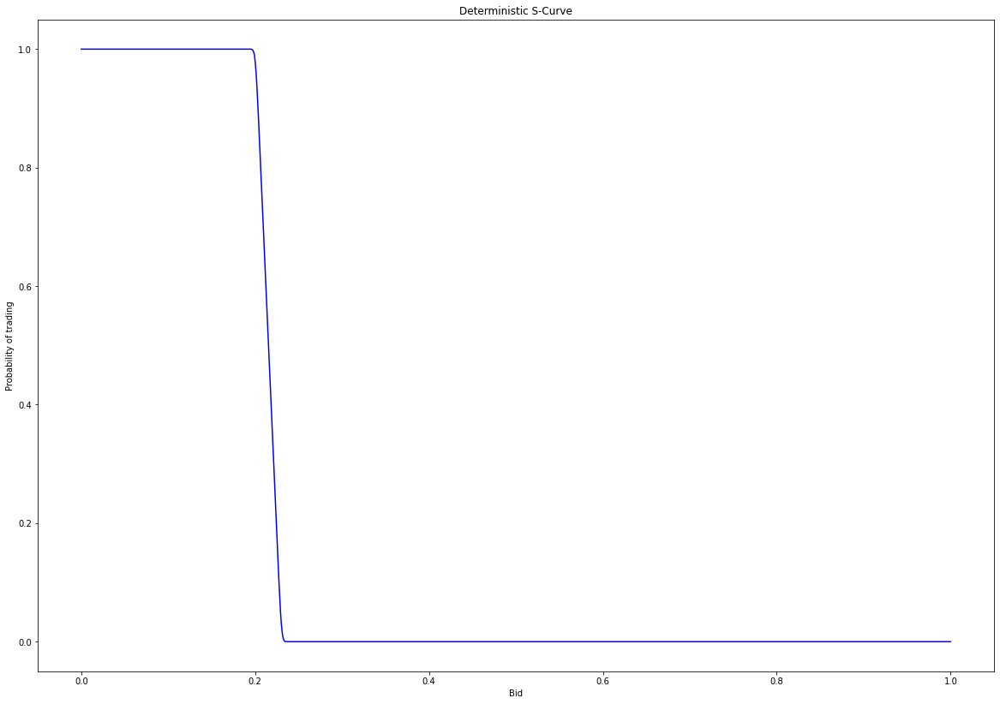

In [35]:
f, ax = plt.subplots(1, 1, figsize=(20, 14))
# Plot training data as black stars
ax.plot(spds, scurve_smooth, 'b')
plt.xlabel('Bid')
plt.ylabel('Probability of trading')
plt.title('Deterministic S-Curve')

In [36]:
f.savefig('S-Curve.png', facecolor = 'white')

In [37]:
spnl = spds * scurve

Text(0.5, 1.0, 'P&L')

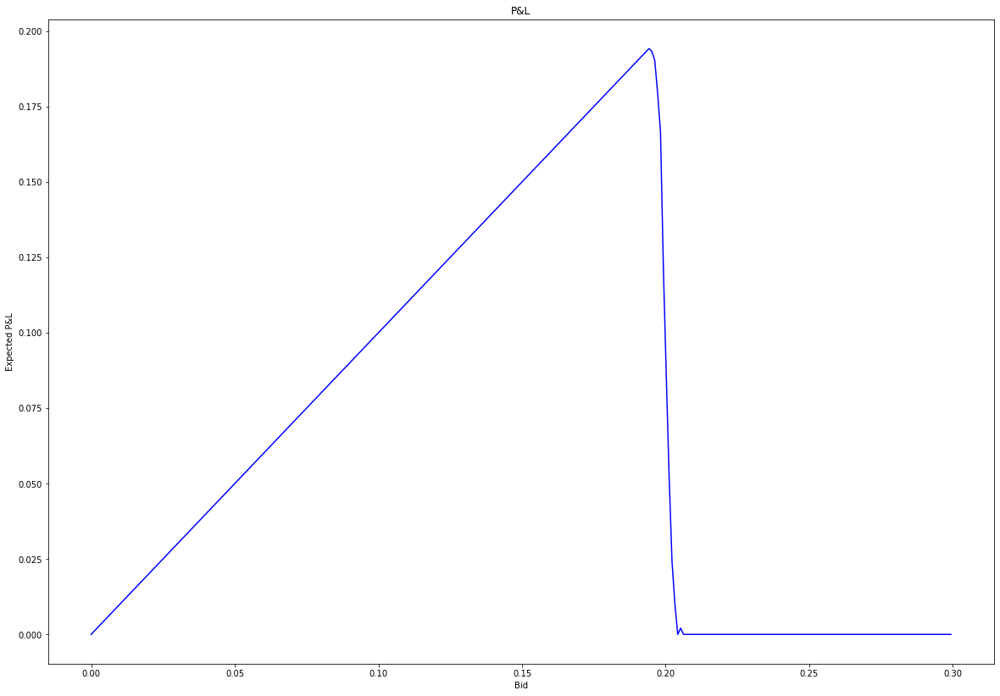

In [38]:
low=0
high = 300
f, ax = plt.subplots(1, 1, figsize=(20, 14))
# Plot training data as black stars
ax.plot(spds[low:high], spnl[low:high], 'b')
plt.xlabel('Bid')
plt.ylabel('Expected P&L')
plt.title('P&L')

In [39]:
f.savefig('pnl-expected-curve.png', facecolor = 'white')

# Set up bandits

In [40]:
range_up = 0.5
range_down = 0

In [41]:
nb_bandits = 5

In [42]:
spreads_bandit = np.linspace(range_down, range_up, nb_bandits)

# A few definitions

In [43]:
horizon_time = 300 # RFQs

# Factorisation

In [44]:
class BenchworkBandit:
    '''
    A collection of common operations when 
    testing a bandit strategy
    Time is discrete and indexed by integers
    bandits are identified by a single integer 
    '''
    def __init__(self, 
                 nb_bandits=5, 
                 time_horizon=100, 
                 range_down=0, 
                 range_up=1, 
                 spreads_bandit=None,
                 bid_bnpp = BNPPbid(0.0002)
                ):
        '''
        :param: time_horizon: the max time as an integer
        '''
        self.nb_bandits = nb_bandits
        self.time_horizon = time_horizon
        # the spread associated with each bandit
        self.spreads_bandit = spreads_bandit
        self.bid_bnpp = bid_bnpp
        self.bandit_next = 0
        if self.spreads_bandit is None:
            self.spreads_bandit = np.linspace(range_down, range_up, nb_bandits)
        
        # a somewhat inneficient structure
        # array of length time_horizon
        # recording at each round the pnl of the candidate bandit
        # One non-zero number at each round. Poor storage utilisation. 
        self.pnls_bandit = np.zeros([self.time_horizon, nb_bandits])
        ###############################################
        #
        #      Regret related structures
        #
        ###############################################
        # contains the pnl for each bandits 
        # for the purpose of calculating the regret
        self.pnls_regret = np.zeros([self.time_horizon, nb_bandits])
        # with-insight max pnl for the bandits
        self.pnls_max =np.zeros([self.time_horizon])
        # the regrets that is: maxpnl_withinsight - pnl_chosen_bandit
        self.regrets = np.zeros([self.time_horizon])
        # cumulative regret at round n that is: 
        # sum_{i=0}^n regrets
        self.regret_cumul =np.zeros([self.time_horizon])
        ########################################
        #
        #      Experiment history
        # All below objects are arrays of size
        #       time_horizon
        #
        #########################################
        # contains at each round one integer
        # best historical bandit
        self.bests = np.zeros([self.time_horizon], np.int64)
        # the best bandit
        self.bests_with_hindsight = np.zeros([self.time_horizon], np.int64)
        # the selected bandit at round n: 
        # elements are single integer
        self.nexts = np.zeros([self.time_horizon], np.int64)
        # averages of rewards up to round n for each bandit
        # elements: list of size nb_bandits
        self.pnls_avg = np.zeros([self.time_horizon,self.nb_bandits])
        # elements: float value representing the pnl for this round
        self.pnls = np.zeros([self.time_horizon])
        # nb of times a bandit has been selected since 
        # begining up to round n
        # elements: list of size nb_bandits
        self.nb_slct = np.zeros([self.time_horizon,self.nb_bandits], np.int64)
        
    
    def fill_regrets(self, time, bandit, pnl):
        # fill the pnls and regrets knowing
        # that at time t bandit was chosen with pnl=pnl
        # f_pnl_bandit is a function which given 
        # given a bandit and optionally a time
        # returns the pnl
        for bdt in range(self.nb_bandits):
            if bdt == bandit:
                self.pnls_regret[time, bdt]=pnl
            else:
                self.pnls_regret[time, bdt]=self.f_pnl(time,bdt)
            self.pnls_max[time] = np.max(self.pnls_regret[time,:])
            self.bests_with_hindsight[time]=np.argmax(self.pnls_regret[time])
            self.regrets[time] = self.pnls_max[time]-pnl
            self.regret_cumul[time]=sum(self.regrets)
    
    def pickup_random_bandit(self,bandit_best):
        # return a random bandit 
        while True:
            bandit_next = np.random.randint(low=0,high=self.nb_bandits)
            if bandit_next != bandit_best: return bandit_next
            
    def f_pnl(self,time,bandit):
        # function to calculate the 
        # pnl given the time and the bandit (spread)
        # time is just for possible extension. 
        return self.bid_bnpp(self.spreads_bandit[bandit], time)
  

    def pnl_expected(self, time, bandit):
        if self.nb_slct[time, bandit]==0: return 0
        total_pnl = np.sum(self.pnls_bandit[:,bandit])
        nb_selected = self.nb_slct[time, bandit]
        loguru.logger.debug(f'Total pnl for bandit:{bandit} pnl={total_pnl}')
        loguru.logger.debug(f'Nb selections for bandit:{bandit} nb={nb_selected}')
        return np.sum(self.pnls_bandit[:,bandit])/self.nb_slct[time, bandit]
    
    def strategy_next_bandit(self, time, bandit_best):
        raise Exception("Calling template function in virtual class BenchworkBandit.\
                        \nShould not happen.")
    
    def best_bandit(self, time):
        ''' 
        returns the bandit with best pnl 
        '''
        for bdt in range(self.nb_bandits):
                self.pnls_avg[time, bdt] = self.pnl_expected(time,  bdt)
        loguru.logger.debug(f'Avg pnls: {self.pnls_avg[time, :]}')
        bandit_best = np.argmax(self.pnls_avg[time, :])
        loguru.logger.debug(f'Best avg pnl at bandit #{bandit_best}')
        return bandit_best
    
    def run(self):
        bandit_best = -1
        for time in range(self.time_horizon):
            loguru.logger.info(f'========Time: {time}======')
            self.bandit_next = self.strategy_next_bandit(time, bandit_best)
            for bdt in range(self.nb_bandits):
                self.nb_slct[time, bdt]=self.nb_slct[time-1, bdt]
            self.nb_slct[time, self.bandit_next]+=1
            self.nexts[time] = self.bandit_next
            spd = self.f_pnl(time,self.bandit_next)
            pnl = spd
            self.pnls_bandit[time,self.bandit_next]=pnl
            self.fill_regrets(time,self.bandit_next,pnl)
            self.pnls[time] = pnl
            bandit_best = self.best_bandit(time)
            self.bests[time] = bandit_best
            loguru.logger.debug(f'Best bandit:{bandit_best}')
    
    def tell_the_story(self, fromtime=0,until=None):
        print(f'Spreads for bandits: {self.spreads_bandit}')
        if until is None:
            until = self.time_horizon
        for t in range(self.time_horizon)[fromtime:until]:
            print('==============')
            print(f'Time: {t}' )
            bandit_selected = self.nexts[t]
            print(f'next bandit: {bandit_selected}')
            print(f'pnl for chosen bandit: {self.pnls_bandit[t,bandit_selected]}')
            print(f'Nb of selections per this bandit so far: {self.nb_slct[t, bandit_selected]}')
            print(f'Averages so far: {self.pnls_avg[t,:]}')
            print(f'best estimated bandit so far: {self.bests[t]}')
            print(f'pnls for all bandits:\n{self.pnls_regret[t, :]}' )
            print(f'max pnl: {self.pnls_max[t]}')
            print(f'regret : {self.regrets[t]}')
            print(f'regret cumulated: {self.regret_cumul[t]}')
        
    def plot_the_story(self, title='Summary', fromtime=0,until=None, nb_figures=4, w=16, h=18):
        self.f, self.ax = plt.subplots(nb_figures, 1, figsize=(w, h))
        self.ax[0].plot(range(self.time_horizon)[fromtime:until], self.nexts[fromtime:until], 'g*')
        self.ax[0].set_title('Next bandit')
        self.ax[1].plot(range(self.time_horizon)[fromtime:until], self.bests[fromtime:until], 'b*')
        self.ax[1].set_title('Best bandit')
        self.ax[2].plot(range(self.time_horizon)[fromtime:until], self.bests_with_hindsight[fromtime:until], 'y*')
        self.ax[2].set_title('Best bandit with hindsight')
        self.ax[3].plot(range(self.time_horizon)[fromtime:until], self.regret_cumul[fromtime:until],'r')
        self.ax[3].set_title('Cumulative regret')
        self.f.suptitle(title, fontsize=16)

In [45]:
#     $\epsilon$-greedy bettern than A/B Testing. 
# JPMorgan = BankQuote(0.2, 0.02)
# nb_bandits = 7 
# spreads_bandit = [0.06, 0.1, 0.13, .17, .21, 0.22, 0.23]
# time_horizon = 100

In [46]:
nb_bandits = 7 
spreads_bandit = [0.06, 0.1, 0.13, .17, .21, 0.22, 0.23]
time_horizon = 500

In [47]:
# nb_bandits = 3
# spreads_bandit = [0.06,  .17,  0.23]
# time_horizon = 500

# A/B (/C/D../Z) testing

<span style="font-family:Papyrus;font-size: 100%"> Hyperparameter: number of times 
    all bandits are tested</span>

In [48]:
class BenchworkBanditABTesting(BenchworkBandit):
    def __init__(self, time_testing=None, relative_to_nb_banditsQ=True,  **kwargs):
        super().__init__(**kwargs)
        # time until which we test
        self.time_testing = time_testing
        if self.time_testing is None:
            self.time_testing = 10
        if relative_to_nb_banditsQ:
            self.time_testing *= nb_bandits
        print(f'Spreads bandit: {self.spreads_bandit}')
        print(f'Time testing: {self.time_testing}')
        print(f'Time total: {self.time_horizon}')
        
  
    def strategy_next_bandit(self, time, bandit_best):
        loguru.logger.debug('A/B/C.. testing:')
        if time <= self.time_testing:
                # choose the next untried bandit
                # until they have been all tried
                self.bandit_next = time % self.nb_bandits
        else:
            loguru.logger.debug(f'next bandit is best bandit at time:{self.time_testing}: {self.bests[self.time_testing]}')
            self.bandit_next = self.bests[self.time_testing]
        return self.bandit_next
    
    def plot_the_story(self):
        super().plot_the_story(title='A/B(/C/D) Testing')

In [49]:
abtesting = BenchworkBanditABTesting(
    nb_bandits=nb_bandits, 
    spreads_bandit=spreads_bandit,
    time_horizon=time_horizon, 
    range_down=0.05, 
    range_up=.5, 
    time_testing=10
)

Spreads bandit: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time testing: 70
Time total: 500


In [50]:
np.random.seed(3)
abtesting.run()

In [51]:
abtesting.tell_the_story()

Spreads for bandits: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time: 0
next bandit: 0
pnl for chosen bandit: 0.06
Nb of selections per this bandit so far: 1
Averages so far: [0.06 0.   0.   0.   0.   0.   0.  ]
best estimated bandit so far: 0
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.11000000000000001
regret cumulated: 0.11000000000000001
Time: 1
next bandit: 1
pnl for chosen bandit: 0.1
Nb of selections per this bandit so far: 1
Averages so far: [0.06 0.1  0.   0.   0.   0.   0.  ]
best estimated bandit so far: 1
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.07
regret cumulated: 0.18000000000000002
Time: 2
next bandit: 2
pnl for chosen bandit: 0.13
Nb of selections per this bandit so far: 1
Averages so far: [0.06 0.1  0.13 0.   0.   0.   0.  ]
best estimated bandit so far: 2
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.04000000000000001
regret cumulated: 0.22000000000

Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 145
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 85
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 146
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 86
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 147
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 87
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3

[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 241
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 181
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 242
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 182
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 243
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 183
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 

Time: 333
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 273
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 334
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 274
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 335
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 275
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 336
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this ban

[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 442
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 382
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 443
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 383
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 7.410000000000001
Time: 444
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 384
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 

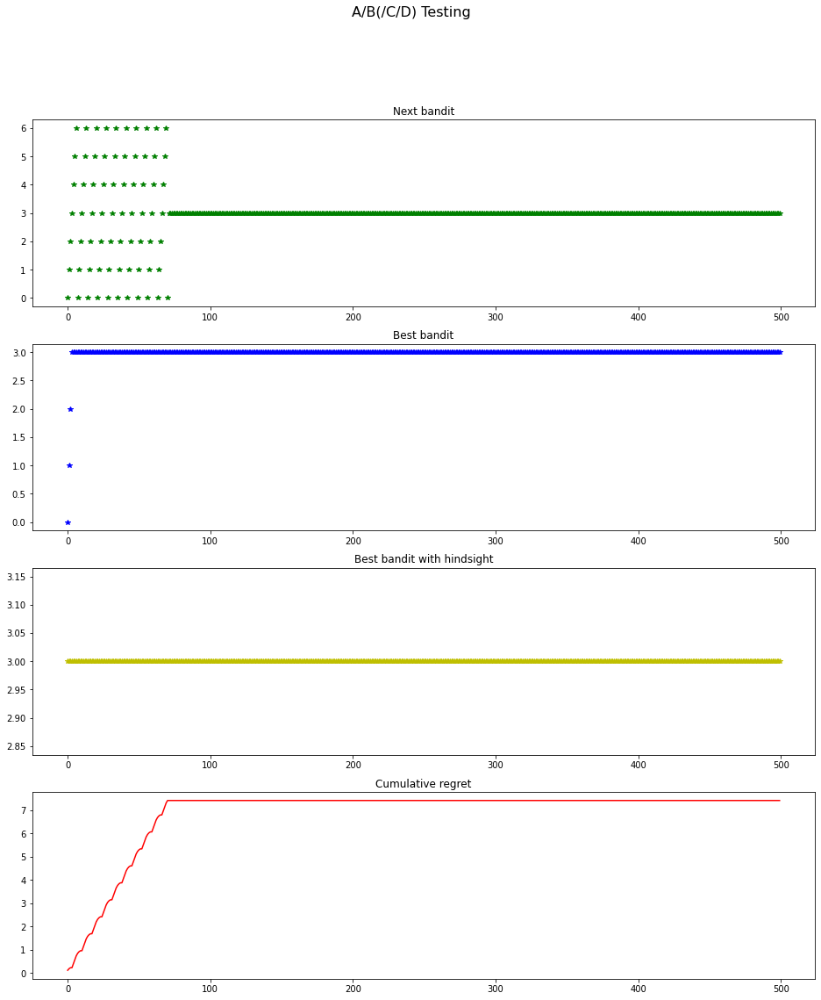

In [52]:
abtesting.plot_the_story()

# $\epsilon$-greedy

<span style="font-family:Papyrus;font-size: 100%"> <br/>
Hyperparameters:
<ul style="font-family:Papyrus;font-size: 100%">   
<li> Probability of switching to a random bandit: $\epsilon$
</ul>
</span>

In [53]:
class BenchworkBanditEpsilonGreedy(BenchworkBandit):
    def __init__(self, proba_switch=lambda t: 0.1, name_strat = 'Epsilon-greedy',**kwargs):
        super().__init__(**kwargs)
        # return \epsilon for an epsilon-greedy algo
        self.proba_switch = proba_switch #default constant epsilon
        self.name = name_strat
        self.eps = np.zeros([self.time_horizon])
        
    def exploreQ(self,time):
        # we explore with a probability of epsilon
        eps = self.proba_switch(time)
        self.eps[time] = eps
        print(f'epsilon: {eps}')
        sample_uniform =np.random.uniform(0,1)
        print(f'sample_uniform: {sample_uniform}')
        return sample_uniform < eps
    
    def strategy_next_bandit(self, time, bandit_best):
        print('epsilon-greedy')
        if time < self.nb_bandits:
            # choose the next untried bandit
            # until they have been all tried
            bandit_next = time
        elif self.exploreQ(time): 
            # explore
            loguru.logger.debug('Exploring a random bandit')
            bandit_next = self.pickup_random_bandit(self.nexts[time-1])
        else:
            # exploit
            bandit_next = self.bests[time-1]
            loguru.logger.debug(f'Best bandit: {bandit_next}')
        return bandit_next
    def plot_the_story(self,title='Summary', fromtime=0,until=None, nb_figures=5):
        super().plot_the_story(title=self.name, nb_figures=5)
        self.ax[4].plot(range(self.time_horizon)[fromtime:until], self.eps[fromtime:until],'b')
        self.ax[4].set_title('Switch probability')

## $\epsilon$-greedy with constant $\epsilon$

In [54]:
eps_greedy = BenchworkBanditEpsilonGreedy(
    nb_bandits=nb_bandits, 
    spreads_bandit=spreads_bandit,
    time_horizon=time_horizon, 
    #proba_switch=lambda t: 0.3*np.exp(-t/50),
    range_down=0.05, 
    range_up=.5,
    name_strat= "Epsilon Greedy constant"
)

In [55]:
eps_greedy.f_pnl

<bound method BenchworkBandit.f_pnl of <__main__.BenchworkBanditEpsilonGreedy object at 0x11fbb75e0>>

In [56]:
np.random.seed(3)
eps_greedy.run()

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6511227704415994
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06467319799028326
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30249829564413533
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3809288723391876
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9007707987895569
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.030929194710986097
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1342181696990331
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29469349860327987
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8714895399438729
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8957395310931173
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7908541830542843
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5162444812344429
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04905633250513164
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9144797335436896
epsilon

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08602520039955142
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6287558862158487
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5173583044394797
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25389754557480804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25826148132372073
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8108746703644514
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.02530610362130037
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06221272174070769
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6150596678234471
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9166843118684489
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4232975186124699
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6720841805874731
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29267860281271274
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24189764932903457
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6587280218364918
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23334190473954808
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3461474196068325
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7601264975735453
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4830815289915066
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6901351375372737
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8548929002707263
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2874968511344348
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.975124762824151
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6308958511038666
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9416727559232569
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.385982385139391
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.005982553248861877
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09119580603683153
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12343548021467443
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5462761201522479
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.882312

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9327239116905218
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1300926704462545
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9482474307667665
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31775147540468285
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6088178824818722
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09343730933343808


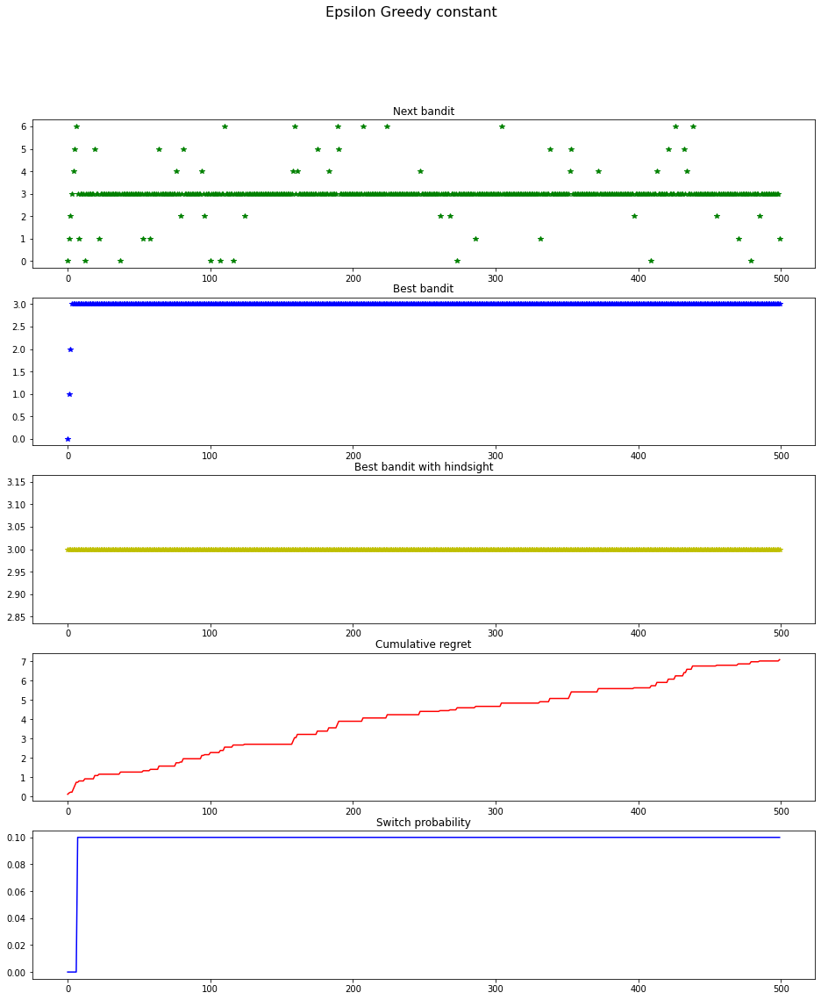

In [57]:
eps_greedy.plot_the_story()

In [58]:
eps_greedy.tell_the_story()

Spreads for bandits: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time: 0
next bandit: 0
pnl for chosen bandit: 0.06
Nb of selections per this bandit so far: 1
Averages so far: [0.06 0.   0.   0.   0.   0.   0.  ]
best estimated bandit so far: 0
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.11000000000000001
regret cumulated: 0.11000000000000001
Time: 1
next bandit: 1
pnl for chosen bandit: 0.1
Nb of selections per this bandit so far: 1
Averages so far: [0.06 0.1  0.   0.   0.   0.   0.  ]
best estimated bandit so far: 1
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.07
regret cumulated: 0.18000000000000002
Time: 2
next bandit: 2
pnl for chosen bandit: 0.13
Nb of selections per this bandit so far: 1
Averages so far: [0.06 0.1  0.13 0.   0.   0.   0.  ]
best estimated bandit so far: 2
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.04000000000000001
regret cumulated: 0.22000000000

[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 2.6999999999999997
Time: 128
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 105
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 2.6999999999999997
Time: 129
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 106
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 2.6999999999999997
Time: 130
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 107
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulate

next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 163
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 3.8899999999999992
Time: 194
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 164
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 3.8899999999999992
Time: 195
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 165
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 3.8899999999999992
Time: 196
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so 

Time: 284
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 248
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 4.59
Time: 285
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 249
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 4.59
Time: 286
next bandit: 1
pnl for chosen bandit: 0.1
Nb of selections per this bandit so far: 6
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.07
regret cumulated: 4.66
Time: 287
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 250
Averages so far: [0.06 0.

regret cumulated: 5.58
Time: 375
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 332
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 5.58
Time: 376
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 333
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 5.58
Time: 377
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 334
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 5.58
Time: 378
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 335


Nb of selections per this bandit so far: 8
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.07
regret cumulated: 6.86
Time: 471
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 418
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 6.86
Time: 472
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 419
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit so far: 3
pnls for all bandits:
[0.06 0.1  0.13 0.17 0.   0.   0.  ]
max pnl: 0.17
regret : 0.0
regret cumulated: 6.86
Time: 473
next bandit: 3
pnl for chosen bandit: 0.17
Nb of selections per this bandit so far: 420
Averages so far: [0.06 0.1  0.13 0.17 0.   0.   0.  ]
best estimated bandit s

In [59]:
eps_greedy.pnls_bandit

array([[0.06, 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.1 , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.13, ..., 0.  , 0.  , 0.  ],
       ...,
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.  , 0.1 , 0.  , ..., 0.  , 0.  , 0.  ]])

In [60]:
eps_greedy.pnls_avg

array([[0.06, 0.  , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.06, 0.1 , 0.  , ..., 0.  , 0.  , 0.  ],
       [0.06, 0.1 , 0.13, ..., 0.  , 0.  , 0.  ],
       ...,
       [0.06, 0.1 , 0.13, ..., 0.  , 0.  , 0.  ],
       [0.06, 0.1 , 0.13, ..., 0.  , 0.  , 0.  ],
       [0.06, 0.1 , 0.13, ..., 0.  , 0.  , 0.  ]])

## $\epsilon$-greedy with decreasing $\epsilon$

In [61]:
eps_greedy2 = BenchworkBanditEpsilonGreedy(
    nb_bandits=nb_bandits, 
    spreads_bandit=spreads_bandit,
    time_horizon=time_horizon, 
    proba_switch=lambda t: 0.3*np.exp(-t/50),
    range_down=0.05, 
    range_up=.5,
    name_strat ='Epsilon Greedy Decreasing epsilon'
)

In [62]:
np.random.seed(3)
eps_greedy2.run()

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.26080747061964177
sample_uniform: 0.6511227704415994
epsilon-greedy
epsilon: 0.2556431366898634
sample_uniform: 0.06467319799028326
epsilon-greedy
epsilon: 0.2505810634233816
sample_uniform: 0.30249829564413533
epsilon-greedy
epsilon: 0.24561922592339452
sample_uniform: 0.3809288723391876
epsilon-greedy
epsilon: 0.24075563938874353
sample_uniform: 0.9007707987895569
epsilon-greedy
epsilon: 0.23598835831996604
sample_uniform: 0.030929194710986097
epsilon-greedy
epsilon: 0.23131547574106986
sample_uniform: 0.1342181696990331
epsilon-greedy
epsilon: 0.22673512243671762
sample_uniform: 0.8444469841767532
epsilon-greedy
epsilon: 0.22224546620451535
sample_uniform: 0.02302297462163372
epsilon-greedy
epsilon: 0.21784471112210727
sample_uniform: 0.9730854295647536
epsilon-greedy
epsilon: 0.21353109682878288
sample_uniform: 0.7099567096172232
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 0.01351476071806734
sample_uniform: 0.5961045367828544
epsilon-greedy
epsilon: 0.013247150525907858
sample_uniform: 0.9945467746681362
epsilon-greedy
epsilon: 0.012984839370589769
sample_uniform: 0.2256603705862138
epsilon-greedy
epsilon: 0.012727722324153415
sample_uniform: 0.7265968777198687
epsilon-greedy
epsilon: 0.012475696536351949
sample_uniform: 0.8963649212414272
epsilon-greedy
epsilon: 0.012228661193509863
sample_uniform: 0.043392219309681734
epsilon-greedy
epsilon: 0.011986517478196169
sample_uniform: 0.3626128740227573
epsilon-greedy
epsilon: 0.01174916852969612
sample_uniform: 0.7386145905425342
epsilon-greedy
epsilon: 0.011516519405265623
sample_uniform: 0.31623534330844183
epsilon-greedy
epsilon: 0.011288477042152866
sample_uniform: 0.5263733474114118
epsilon-greedy
epsilon: 0.011064950220372004
sample_uniform: 0.9221836015384114
epsilon-greedy
epsilon: 0.010845849526213928
sample_uniform: 0.12932785198004948
epsilon-greedy
epsilon: 0.010631087316

epsilon-greedy
epsilon: 0.0005849566568535362
sample_uniform: 0.3422900842674038
epsilon-greedy
epsilon: 0.0005733737389897913
sample_uniform: 0.01830967629678948
epsilon-greedy
epsilon: 0.000562020178266727
sample_uniform: 0.9149401194993525
epsilon-greedy
epsilon: 0.0005508914331086722
sample_uniform: 0.5016022460125628
epsilon-greedy
epsilon: 0.0005399830518691773
sample_uniform: 0.35352185261387126
epsilon-greedy
epsilon: 0.0005292906710503006
sample_uniform: 0.4123987659186086
epsilon-greedy
epsilon: 0.0005188100135571467
sample_uniform: 0.09807057758309157
epsilon-greedy
epsilon: 0.0005085368869869752
sample_uniform: 0.6175056671738267
epsilon-greedy
epsilon: 0.0004984671819521802
sample_uniform: 0.9698133787887531
epsilon-greedy
epsilon: 0.0004885968704364842
sample_uniform: 0.484602511428471
epsilon-greedy
epsilon: 0.0004789220041836742
sample_uniform: 0.8168685622879842
epsilon-greedy
epsilon: 0.00046943871311824997
sample_uniform: 0.3670404769553409
epsilon-greedy
epsilon: 0.

epsilon-greedy
epsilon: 3.702294122600387e-05
sample_uniform: 0.257570677399125
epsilon-greedy
epsilon: 3.628983787164298e-05
sample_uniform: 0.22847030954063685
epsilon-greedy
epsilon: 3.557125093630171e-05
sample_uniform: 0.46179135308457286
epsilon-greedy
epsilon: 3.4866892975624564e-05
sample_uniform: 0.6941747864224018
epsilon-greedy
epsilon: 3.417648223703584e-05
sample_uniform: 0.8536518143860407
epsilon-greedy
epsilon: 3.349974254703443e-05
sample_uniform: 0.3297372710150601
epsilon-greedy
epsilon: 3.283640320072103e-05
sample_uniform: 0.38104920750003113
epsilon-greedy
epsilon: 3.21861988535124e-05
sample_uniform: 0.24942268868233486
epsilon-greedy
epsilon: 3.1548869415000276e-05
sample_uniform: 0.32440343408491934
epsilon-greedy
epsilon: 3.092415994491135e-05
sample_uniform: 0.0855997804679719
epsilon-greedy
epsilon: 3.0311820551128023e-05
sample_uniform: 0.13950014624161655
epsilon-greedy
epsilon: 2.9711606289728092e-05
sample_uniform: 0.3315882086667399
epsilon-greedy
epsil

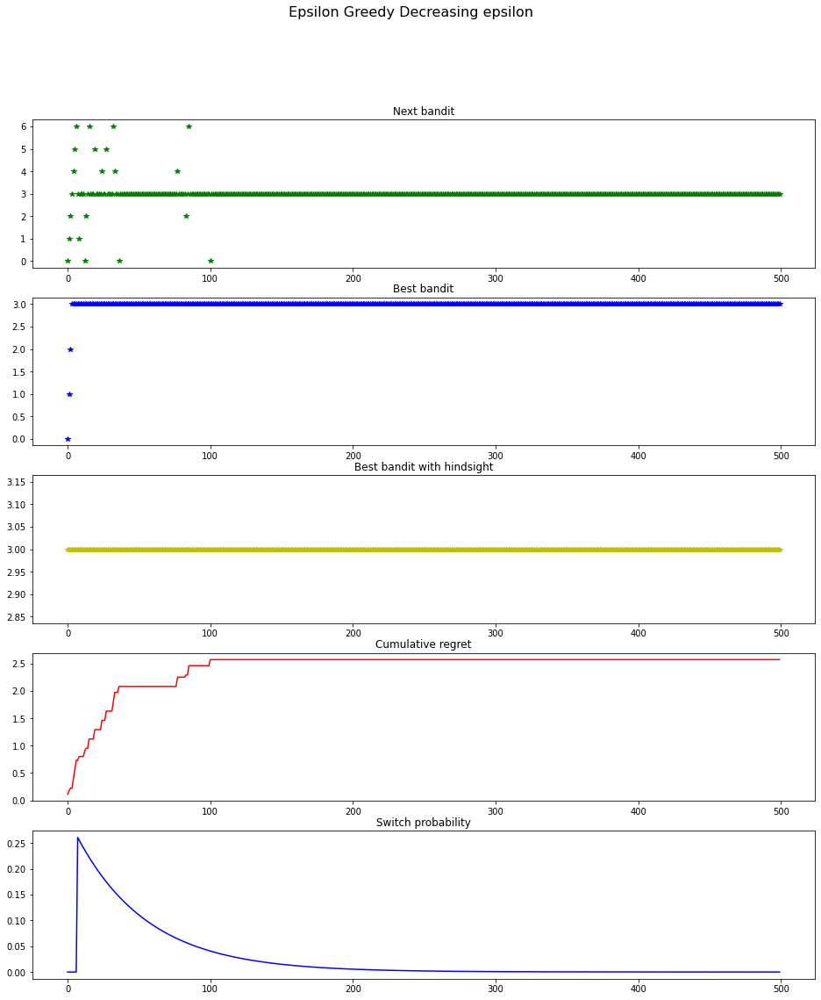

In [63]:
eps_greedy2.plot_the_story()

# Upper Confidence Bound

The Upper Confidence Bounds (UCB) algorithm measures this potential 
by an upper confidence bound of the reward value, Û t(a), so that the 
true value is below with bound Q(a)≤Q̂ t(a)+Û t(a) with high probability. 
The upper bound Û t(a) is a function of Nt(a); a larger number of trials 
Nt(a) should give us a smaller bound Û t(a).

## Giving a sense of the things to come

<span style="font-family:Papyrus;font-size: 100%"> <br/>
Suppose you take over from colleagues and that after a few trials 
they have recorded the below estimate of the rewards for 3 bandits. 
<br/>    
Which one will you pick up ?
</span>

In [64]:
mu0 = 50
mu1=100
mu2=103
mu3=108

In [65]:
trials = pd.DataFrame({'avg_rewards':[mu0,mu1,mu2,mu3], 'nb_pulls':[35,2,10, 200]}, 
                      index=['Bandit0','Bandit1','Bandit2','Bandit3',])

In [66]:
trials

,avg_rewards,nb_pulls
Bandit0,50,35
Bandit1,100,2
Bandit2,103,10
Bandit3,108,200


<span style="font-family:Papyrus;font-size: 100%"> <br/>
There is a sense that there might be more potential in a bandit that has mildly high average
and has been hardly tested, rather than a bandit that has been asserted through many 
trials to have a marginally higher average reward. 
</span>

## Starting with an empirical understanding of the algorithm criterion

The UCB-1 algorithm consists in picking up as next bandit candidate, the one for which:

$pnl_{avg}(k) + pnl_{max}(k)\sqrt{\frac{2 log(t)}{N_k(t)}}$ is maximum

where:
<ul>
<li> $t$ is the number of rounds so far</li>
<li> $N_k(t)$ is the number of time bandit $k$ has been picked. </li>
</ul>

Taking each part of the criteria:
<ul>
<li> all other things being equal, the bandit with the highest P&L is picked up. </li>
<li> $N_k(t)$ at the denominator makes the criterion smaller for bandits that have 
     been picked many times and larger for the ones that have been chosen rarely. </li>
<li> independently, and for all bandits, the criterion increases with time due to 
     the $log(t)$ in the numerator. Note though that it increases in relative 
     less due to the $log$ function.</li>
</ul>    
The net effect is that even a bad bandit (one with a very low P&L) will end up being picked up eventually
but less and less frequently if it does not improve its average P&L sufficiently. 

In [67]:
class BenchworkBanditUCB1(BenchworkBandit):
    def __init__(self,**kwargs):
        super().__init__(**kwargs)
        self.ucb1_criteria = np.zeros([self.time_horizon,self.nb_bandits])
    
    def strategy_next_bandit(self, time, bandit_best):
        loguru.logger.debug('Upper bound confidence 1:')
        if time < self.nb_bandits:
            # choose the next untried bandit
            # until they have been all tried
            bandit_next = time
        else:
            loguru.logger.debug(self.pnls_avg[time-1])
            loguru.logger.debug(self.nb_slct[time-1])
            for k in range(self.nb_bandits):
                self.ucb1_criteria[time][k]=self.pnls_avg[time-1][k]+self.spreads_bandit[k]*np.sqrt(2*np.log(time)/self.nb_slct[time-1][k])
            loguru.logger.debug(f'UCB1 criteria:\n{self.ucb1_criteria[time]}')
            bandit_next = np.argmax(self.ucb1_criteria[time])
            loguru.logger.debug(f'Next bandit: {bandit_next}')
        return bandit_next
    def plot_the_story(self,title='UCB-1', fromtime=0,until=None, nb_figures=5):
        super().plot_the_story(title=title, nb_figures=5)
        criteria = self.ax[4].plot(range(self.time_horizon)[fromtime:until], self.ucb1_criteria[fromtime:until], )
        self.ax[4].set_title('UCB criteria for each bandit')
        plt.legend(criteria,[f'spread: {s}' for s in self.spreads_bandit], loc="upper right")

In [68]:
ucb1 = BenchworkBanditUCB1(
    nb_bandits=nb_bandits, 
    spreads_bandit=spreads_bandit,
    time_horizon=time_horizon,
    range_down=0.05, 
    range_up=.5
)

In [69]:
np.random.seed(3)
ucb1.run()

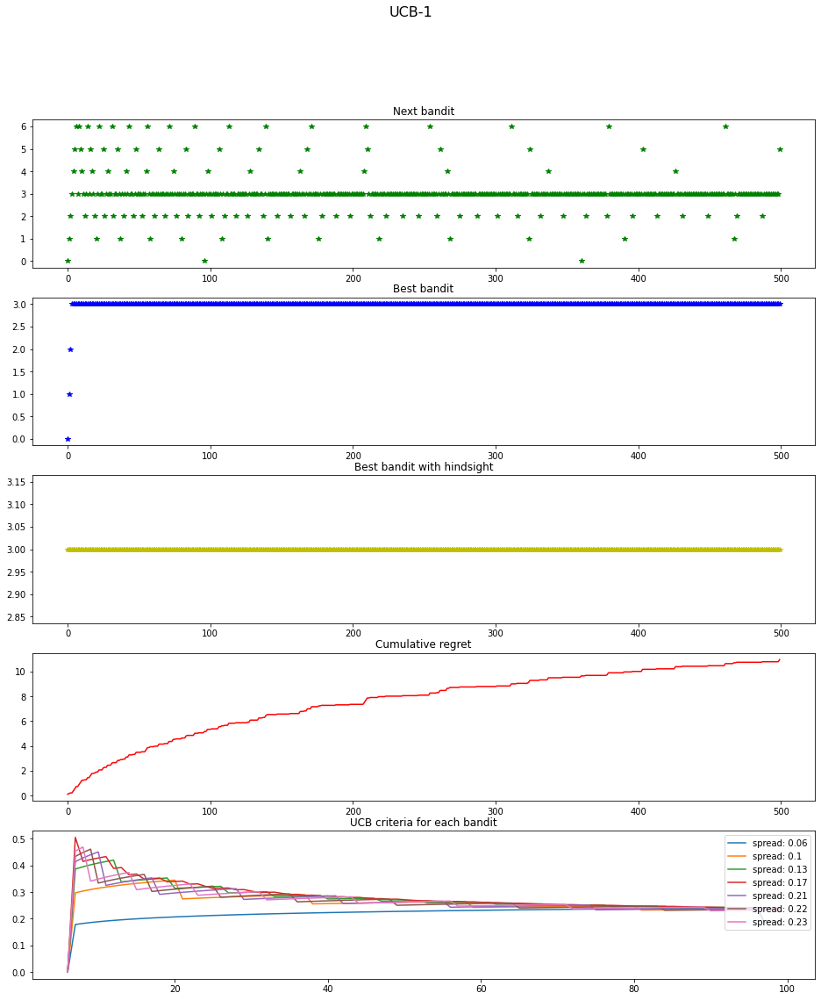

In [70]:
ucb1.plot_the_story(fromtime=6,until=100)

## Gaussian assumed

<span style="font-family:Papyrus;font-size: 100%"> <br/>
Since we are so familiar with Gaussian distribution, let's approach the problem through a more 
familair, even though much less realistic setting. 
We are going to assume our incertitude on the reward follows a Gaussian. It really has no reason for this but it is just a toy thought experiment. 
</span>

In [71]:
bandit1 = [90, 110]
bandit2 = [103,103,104,102,101,105,104,102,100,106]

In [72]:
mu1_empirical = np.mean(bandit1)
var1_empirical = np.var(bandit1)
stdev1_empirical = np.sqrt(var1_empirical)
mu2_empirical = np.mean(bandit2)
var2_empirical = np.var(bandit2)
stdev2_empirical = np.sqrt(var2_empirical)

In [73]:
mu1_empirical

100.0

In [74]:
stdev1_empirical

10.0

In [75]:
mu2_empirical

103.0

In [76]:
stdev2_empirical

1.7320508075688772

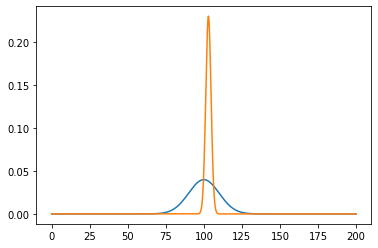

<Figure size 2160x2160 with 0 Axes>

In [77]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import math

x = np.linspace(0, 200, 1000)
plt.plot(x, stats.norm.pdf(x, mu1_empirical, np.sqrt(var1_empirical)) )
plt.plot(x, stats.norm.pdf(x, mu2_empirical, np.sqrt(var2_empirical)))
plt.figure(figsize=(30,30))
plt.show()

<span style="font-family:Papyrus;font-size: 100%"> <br/>
The reason we chose gaussians distribution is that quantifying with Gaussian is something we 
do almost naturally. 

For example we know that with a probability 99.7%:
<ul style="font-family:Papyrus;font-size: 100%">   
<li> bound1 <= Reward(bandit1)<=130
<li> bound2 <= Reward(bandit1)<=106.6
</ul>
</span>

<span style="font-family:Papyrus;font-size: 100%"> <br/>
Following a priciple know as "optimism when facing uncertainty",
I a going to draw from 1 and here by two scenario are possible. 
</span>

### Scenario 1

In [78]:
bandit1 = [90, 110, 100,100.8,99.8,100,100,100, 100,100, 100, 100, 100,100,100, 100,100, 100, 100,100,100,100, 100,100, 100, 100, 100,100,100, 100,100, 100, 100]

In [79]:
mu1_empirical = np.mean(bandit1)
var1_empirical = np.var(bandit1)
stdev1_empirical = np.sqrt(var1_empirical)

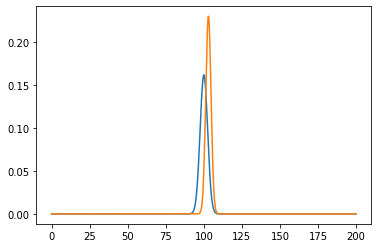

<Figure size 2160x2160 with 0 Axes>

In [80]:
x = np.linspace(0, 200, 1000)
plt.plot(x, stats.norm.pdf(x, mu1_empirical, np.sqrt(var1_empirical)) )
plt.plot(x, stats.norm.pdf(x, mu2_empirical, np.sqrt(var2_empirical)))
plt.figure(figsize=(30,30))
plt.show()

### Scenario 2

In [81]:
bandit1 = [90, 110, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 105,105,105,105, 105,105,105,105,105,105,105,105, 105,105,105,105, 
           105,105,105,105, 105,105,105,105]

In [82]:
mu1_empirical = np.mean(bandit1)
var1_empirical = np.var(bandit1)
stdev1_empirical = np.sqrt(var1_empirical)

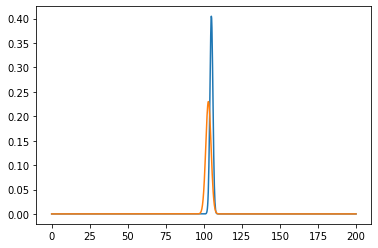

<Figure size 2160x2160 with 0 Axes>

In [83]:
x = np.linspace(0, 200, 1000)
plt.plot(x, stats.norm.pdf(x, mu1_empirical, np.sqrt(var1_empirical)) )
plt.plot(x, stats.norm.pdf(x, mu2_empirical, np.sqrt(var2_empirical)))
plt.figure(figsize=(30,30))
plt.show()

## Back to the real problem

<span style="font-family:Papyrus;font-size: 100%"> <br/>
In real life, we often have no idea of the prior. The distribution is unknown. 
In this case, mathematicians since Markov have handed us down a few useful formula
in relation to the dispersion around the empirical mean and how far the empircal 
mean can be from the real one. 
</span>

<span style="font-family:Papyrus;font-size: 100%"> <br/>
One of them is the...
</span>

### Höffding's inequality

The Höffding's inequality tells us (among other uses) what is the probability that the true mean of a random variable 
is above a marginal amount of its sampled average. Or rather, it gives us a upper bound on this probability. 

\[
ℙ[𝔼[X]>\overline{X}+u]≤e^{-\frac{2 t u^2}{b-a}}
\]

if $ a<=X<=b$

This is what we have used in the UCB-1 implementation. So this seemingly arbitrary formula has now a firm theoritical background. 

# Thomson sampling

Now, in the case of RFQs, the P&L distribution is know since:
- HR ~ Bernouilli
- P&L = spread * HR

In [194]:
class BenchworkBanditThomsonSampling(BenchworkBandit):
    def __init__(self, freq_display_distribution=300,**kwargs,):
        super().__init__(**kwargs)
        self.wins = np.ones([self.time_horizon,self.nb_bandits])
        self.losses = np.ones([self.time_horizon,self.nb_bandits])
        self.samples_beta = np.zeros([self.time_horizon,self.nb_bandits])
        self.probas = np.zeros([self.time_horizon,self.nb_bandits])
        self.frequency_display_proba = freq_display_distribution
        self.nb_figures = 4 + int(self.time_horizon / self.frequency_display_proba)
        
    
    def strategy_next_bandit(self, time, bandit_best):
        print(f'Thomson sampling.')
        print(f'pnl avg so far:{self.pnls_avg[time-1]}')
        print(f'nb of selections so far: {self.nb_slct[time-1]}')
        # for each spread draw a sample. 
        self.wins[time]
        if time >= 1:
            for i in range(nb_bandits):
                self.wins[time][i]=self.wins[time-1][i]
                self.losses[time][i]=self.losses[time-1][i]
            if self.pnls_bandit[time-1][self.nexts[time-1]] !=0:
                self.wins[time][self.nexts[time-1]]+=1
            else:
                self.losses[time][self.nexts[time-1]]+=1
            for i in range(nb_bandits):
                self.probas[time][i] = self.wins[time][i]/(self.wins[time][i]+self.losses[time][i])
                self.samples_beta[time][i] = self.spreads_bandit[i]*np.random.beta(self.wins[time-1][i],self.losses[time-1][i])
        print(f'Wins:\n{self.wins[time]}')
        print(f'Losses:\n{self.losses[time]}')
        print(f'Thompson probas:\n{self.probas[time]}')
        print(f'Thompson samples:\n{self.samples_beta[time]}')
        bandit_next = np.argmax(self.samples_beta[time])
        print(f'Next bandit: {bandit_next}')

        return bandit_next
    
    
    def plot_the_story(self,title='Thomson sampling', fromtime=0,until=None, nb_figures=5, h=20):
        h += self.nb_figures*4
        super().plot_the_story('Thomson sampling', fromtime=0,until=None, nb_figures = self.nb_figures, h=h)
        x = np.linspace(0, 1, 1000)
        
        #print(self.nb_figures)
        for fig in range(4, self.nb_figures):
            time = (fig-4)* self.frequency_display_proba
            for bdt in range(0, self.nb_bandits):
                #print(f'a: {self.wins[time][bdt]}, b: {self.losses[time][bdt]}' )
                x = np.linspace(stats.beta.ppf(0.01, self.wins[time][bdt],self.losses[time][bdt]),
                                stats.beta.ppf(0.99, self.wins[time][bdt],self.losses[time][bdt]), 100)
                dist = stats.beta(self.wins[time][bdt],self.losses[time][bdt])
                y = dist.pdf(x)
                #print(y)
                self.ax[fig].plot(x, y, label=f'Bandit spd: {self.spreads_bandit[bdt]}' )
            self.ax[fig].legend(loc="upper left")
            self.ax[fig].set_title(f'Density for each bandit at time {time}')

In [195]:
thsampl = BenchworkBanditThomsonSampling(
    nb_bandits=nb_bandits, 
    spreads_bandit=spreads_bandit,
    time_horizon=time_horizon,
    range_down=0.05, 
    range_up=.5,
    freq_display_distribution=100,
)

In [196]:
np.random.seed(3)
thsampl.run()

Thomson sampling.
pnl avg so far:[0. 0. 0. 0. 0. 0. 0.]
nb of selections so far: [0 0 0 0 0 0 0]
Wins:
[1. 1. 1. 1. 1. 1. 1.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0. 0. 0. 0. 0. 0. 0.]
Thompson samples:
[0. 0. 0. 0. 0. 0. 0.]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.   0.   0.   0.  ]
nb of selections so far: [1 0 0 0 0 0 0]
Wins:
[2. 1. 1. 1. 1. 1. 1.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.5        0.5        0.5
 0.5       ]
Thompson samples:
[0.00246881 0.03844458 0.03773898 0.12535483 0.121775   0.17685397
 0.14176128]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.   0.   0.   0.  ]
nb of selections so far: [1 0 0 0 0 1 0]
Wins:
[2. 1. 1. 1. 1. 1. 1.]
Losses:
[1. 1. 1. 1. 1. 2. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.5        0.5        0.33333333
 0.5       ]
Thompson samples:
[0.00493349 0.03723787 0.05493846 0.03438451 0.1888082  0.05878979
 0.13862236]
Next ba

 0.02626768]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 53  2  2  2]
Wins:
[ 2.  1.  1. 54.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 3. 3. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98181818 0.25       0.25
 0.25      ]
Thompson samples:
[0.03103879 0.02970875 0.12367724 0.16831452 0.17144914 0.05058393
 0.14711167]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 53  3  2  2]
Wins:
[ 2.  1.  1. 54.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 3. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98181818 0.2        0.25
 0.25      ]
Thompson samples:
[0.0385017  0.06845793 0.04584513 0.16932811 0.03505615 0.05659807
 0.06041319]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 54  3  2  2]
Wins:
[ 2.  1.  1. 55.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 3. 3.]
Thompson 

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 95  4  2  2]
Wins:
[ 2.  1.  1. 96.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 5. 3. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98969072 0.16666667 0.25
 0.25      ]
Thompson samples:
[0.05451705 0.01899759 0.06730964 0.1688566  0.04321999 0.02139084
 0.13263111]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 96  4  2  2]
Wins:
[ 2.  1.  1. 97.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 5. 3. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98979592 0.16666667 0.25
 0.25      ]
Thompson samples:
[0.05468908 0.06926398 0.1081364  0.16577177 0.01379993 0.16145614
 0.09333925]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 97  4  2  2]
Wins:
[ 2.  1.  1. 98.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 5. 3. 3.]
Thompson probas:
[0.66666667 0.5     

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 151   4   2   2]
Wins:
[  2.   1.   1. 152.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99346405 0.16666667 0.25
 0.25      ]
Thompson samples:
[0.03491736 0.04130724 0.06419164 0.16958587 0.01922154 0.14198386
 0.12765463]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 152   4   2   2]
Wins:
[  2.   1.   1. 153.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99350649 0.16666667 0.25
 0.25      ]
Thompson samples:
[0.04458224 0.0236094  0.07751294 0.16909649 0.02591452 0.0040732
 0.0192145 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 153   4   2   2]
Wins:
[  2.   1.   1. 154.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 191   4   2   3]
Wins:
[  2.   1.   1. 192.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99481865 0.16666667 0.25
 0.2       ]
Thompson samples:
[0.01418654 0.04694837 0.12490386 0.16888128 0.04118649 0.06286541
 0.09657365]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 192   4   2   3]
Wins:
[  2.   1.   1. 193.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99484536 0.16666667 0.25
 0.2       ]
Thompson samples:
[0.03444461 0.05472711 0.11939215 0.16974831 0.0564513  0.11390825
 0.08479615]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 193   4   2   3]
Wins:
[  2.   1.   1. 194.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 236   4   2   3]
Wins:
[  2.   1.   1. 237.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99579832 0.16666667 0.25
 0.2       ]
Thompson samples:
[0.02721093 0.01980555 0.01586841 0.16764897 0.02687365 0.00083653
 0.10082061]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 237   4   2   3]
Wins:
[  2.   1.   1. 238.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9958159  0.16666667 0.25
 0.2       ]
Thompson samples:
[0.04245276 0.0511336  0.03760333 0.16974606 0.09434366 0.00431691
 0.02072808]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 238   4   2   3]
Wins:
[  2.   1.   1. 239.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 3.

 0.2       ]
Thompson samples:
[0.05489746 0.01757681 0.01562231 0.16889033 0.00207632 0.0450366
 0.02870806]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 283   4   3   3]
Wins:
[  2.   1.   1. 284.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99649123 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.05512287 0.07760046 0.11368266 0.16966725 0.01599895 0.04122336
 0.04522223]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 284   4   3   3]
Wins:
[  2.   1.   1. 285.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9965035  0.16666667 0.2
 0.2       ]
Thompson samples:
[0.01128922 0.0411232  0.05417634 0.16850622 0.07866049 0.01384853
 0.01714868]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
n

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 327   4   3   3]
Wins:
[  2.   1.   1. 328.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99696049 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.05489177 0.09298552 0.00301917 0.16975027 0.0197216  0.1156667
 0.0286226 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 328   4   3   3]
Wins:
[  2.   1.   1. 329.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9969697  0.16666667 0.2
 0.2       ]
Thompson samples:
[0.04344072 0.0215971  0.07495591 0.16989502 0.05299371 0.0248427
 0.05620705]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 329   4   3   3]
Wins:
[  2.   1.   1. 330.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 369   4   3   3]
Wins:
[  2.   1.   1. 370.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99730458 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.02833048 0.07735907 0.07116497 0.16997401 0.00127328 0.00134164
 0.02910052]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 370   4   3   3]
Wins:
[  2.   1.   1. 371.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99731183 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.05279434 0.07850729 0.03895832 0.16988939 0.00759747 0.00913702
 0.03190466]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 371   4   3   3]
Wins:
[  2.   1.   1. 372.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 408   4   3   3]
Wins:
[  2.   1.   1. 409.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99756098 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.03383543 0.06946166 0.02126846 0.169936   0.02495527 0.00974084
 0.00776599]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 409   4   3   3]
Wins:
[  2.   1.   1. 410.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99756691 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.04110537 0.09364727 0.0947151  0.1695589  0.02433906 0.04496704
 0.01290326]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 410   4   3   3]
Wins:
[  2.   1.   1. 411.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 450   4   3   3]
Wins:
[  2.   1.   1. 451.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99778761 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.02977842 0.04060139 0.07155157 0.16986068 0.08388675 0.06290625
 0.1201129 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 451   4   3   3]
Wins:
[  2.   1.   1. 452.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99779249 0.16666667 0.2
 0.2       ]
Thompson samples:
[0.04378951 0.04199259 0.04523444 0.16956816 0.02410049 0.00540292
 0.02586851]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 452   4   3   3]
Wins:
[  2.   1.   1. 453.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 4. 4

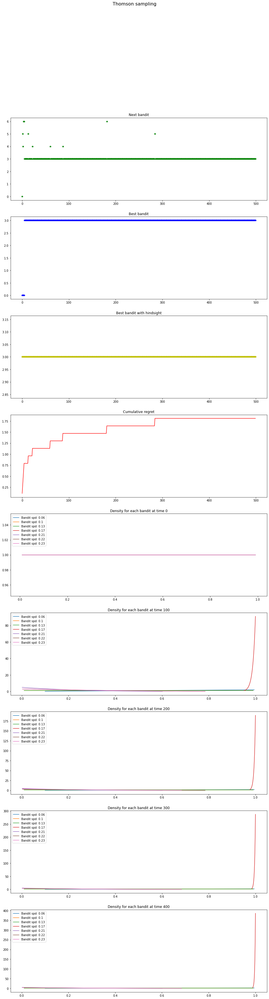

In [197]:
thsampl.plot_the_story()

# Comparisons

In [198]:
def setup_benchworks(bid_bnpp = bnpp,time_horizon=500, spreads_bandit = spreads_bandit):
    nb_bandits = len(spreads_bandit)
    benchworks =  [BenchworkBanditABTesting(nb_bandits=nb_bandits, 
                                      time_horizon=time_horizon,
                                      spreads_bandit=spreads_bandit,
                                      bid_bnpp = bnpp_bid,
                                      time_testing=10
                                     ),
             BenchworkBanditEpsilonGreedy(nb_bandits=nb_bandits, 
                                      time_horizon=time_horizon,
                                      spreads_bandit=spreads_bandit,
                                      bid_bnpp = bnpp_bid,
                                      proba_switch=lambda t: 0.1,
                                      name_strat="Epsilon greedy constant"),
             BenchworkBanditEpsilonGreedy(nb_bandits=nb_bandits, 
                                      time_horizon=time_horizon,
                                      spreads_bandit=spreads_bandit,
                                      bid_bnpp = bnpp_bid,
                                      proba_switch=lambda t: 0.3*np.exp(-t/50),
                                      name_strat="Epsilon greedy with decreasing epsilon"),
             BenchworkBanditUCB1(
                    nb_bandits=nb_bandits, 
                    spreads_bandit=spreads_bandit,
                    time_horizon=time_horizon,
                    bid_bnpp = bnpp_bid,
                    range_down=0.05, 
                    range_up=.5),
             BenchworkBanditThomsonSampling(
                nb_bandits=nb_bandits, 
                spreads_bandit=spreads_bandit,
                time_horizon=time_horizon,
                 bid_bnpp = bnpp_bid,
                range_down=0.05, 
                range_up=.5
            )
        ]
    return benchworks

In [199]:
def run_benchworks(benchworks):
    for benchwork in benchworks:
        np.random.seed(1)
        benchwork.run()

In [200]:
def plot_stories(benchworks):
    for benchwork in benchworks:
        benchwork.plot_the_story()

## Deterministic, time invariant spreads

In [201]:
# start wide (.2) then becomes aggressive after 500
DB = BankQuote(mu = lambda t: 0.2, var = lambda t: 0.000001)

In [202]:
# class BNPPbid:
#     def __init__(self, variance, competitors=[JPMorgan, Citi]):
#         self.quote_market = MarketQuote(competitors=competitors)
#         self.variance = variance
    
#     def __call__(self, bid, t=1):
#         #bid = max(0,np.random.normal(bid, self.variance, 1)[0])
#         bid_competition = self.quote_market(t)
#         if bid < bid_competition:
#             return bid
#         else:
#             return 0

In [203]:
bnpp_bid = BNPPbid(0.000001, competitors=[DB])

In [204]:
thsampl = BenchworkBanditThomsonSampling(
    nb_bandits=nb_bandits, 
    spreads_bandit=spreads_bandit,
    time_horizon=time_horizon,
    range_down=0.05, 
    range_up=.5
)

In [205]:
# class BenchworkBandit:
#     '''
#     A collection of common operations when 
#     testing a bandit strategy
#     Time is discrete and indexed by integers
#     bandits are identified by a single integer 
#     '''
#     def __init__(self, 
#                  nb_bandits=5, 
#                  time_horizon=100, 
#                  range_down=0, 
#                  range_up=1, 
#                  spreads_bandit=None,
#                  bid_bnpp = BNPPbid(0.0002)
#                 ):

In [206]:
spreads_bandit = [0.06, 0.1, 0.13, .17, .21, 0.22, 0.23]

In [207]:
benchworks = setup_benchworks(bid_bnpp=bnpp_bid, spreads_bandit=spreads_bandit, time_horizon=500)

Spreads bandit: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time testing: 70
Time total: 500


In [208]:
run_benchworks(benchworks)

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9034019152878835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6236722070556089
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5736794866722859
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9325954630371636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.56103021925571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13645522566068502
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1954294811093188
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8289808995501787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6692328934531846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06653648135411494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16540611484625978
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20351032104794942
epsilon-gr

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9978842782249023
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.963915888684551
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06978597850420853
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16429978756755015
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6796160403462254
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5721232566176708
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9535248946711459
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7568884973362043
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19087582656531388
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6823151903026738
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23768941802919952
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2834642540714889
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3659991252731889
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5514389981891963
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30976680370319876
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.92079

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4002943067357757
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16058682850924277
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5452535141070303
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33415183351807476
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.26964324616102264
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.020481248718401956
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.15554516992643075
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.456016954689769
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5374885245456983
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0034418343257808237
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5176931209137287
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.889497913976276
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5809475966220831
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.043697545085664924
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.01131210267698568
epsilon-greedy
epsilon: 0.1
sample_uniform: 0

epsilon-greedy
epsilon: 0.2505810634233816
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.24561922592339452
sample_uniform: 0.00287032703115897
epsilon-greedy
epsilon: 0.24075563938874353
sample_uniform: 0.07008149603262914
epsilon-greedy
epsilon: 0.23598835831996604
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.23131547574106986
sample_uniform: 0.5700666604160946
epsilon-greedy
epsilon: 0.22673512243671762
sample_uniform: 0.42690982567922653
epsilon-greedy
epsilon: 0.22224546620451535
sample_uniform: 0.2943594751304114
epsilon-greedy
epsilon: 0.21784471112210727
sample_uniform: 0.204358127861885
epsilon-greedy
epsilon: 0.21353109682878288
sample_uniform: 0.3801411726235504
epsilon-greedy
epsilon: 0.2093028978213093
sample_uniform: 0.6297175070215645
epsilon-greedy
epsilon: 0.20515842276370674
sample_uniform: 0.9248079703993507
epsilon-greedy
epsilon: 0.20109601381069178
sample_uniform: 0.9501761192470797
epsilon-greedy
epsilon: 0.197114045944517
sample_un

epsilon-greedy
epsilon: 0.009813730481705946
sample_uniform: 0.8106291034469015
epsilon-greedy
epsilon: 0.00961940559835823
sample_uniform: 0.9854449149448306
epsilon-greedy
epsilon: 0.009428928605510313
sample_uniform: 0.08318988869699773
epsilon-greedy
epsilon: 0.009242223309825322
sample_uniform: 0.02824262016291268
epsilon-greedy
epsilon: 0.00905921502669555
sample_uniform: 0.902916833474409
epsilon-greedy
epsilon: 0.008879830550367599
sample_uniform: 0.6408076240458747
epsilon-greedy
epsilon: 0.008703998124659116
sample_uniform: 0.06978597850420853
epsilon-greedy
epsilon: 0.00853164741425535
sample_uniform: 0.22059408184733575
epsilon-greedy
epsilon: 0.008362709476574104
sample_uniform: 0.9352837700068006
epsilon-greedy
epsilon: 0.008197116734187767
sample_uniform: 0.7485203200897537
epsilon-greedy
epsilon: 0.008034802947791452
sample_uniform: 0.7708318305538303
epsilon-greedy
epsilon: 0.007875703189706387
sample_uniform: 0.2959350518874113
epsilon-greedy
epsilon: 0.00771975381790

epsilon-greedy
epsilon: 0.00043334654970616295
sample_uniform: 0.5654555965905419
epsilon-greedy
epsilon: 0.00042476571310404095
sample_uniform: 0.7825809780445985
epsilon-greedy
epsilon: 0.00041635478845077864
sample_uniform: 0.9977623655688204
epsilon-greedy
epsilon: 0.00040811041126436815
sample_uniform: 0.00673470699420331
epsilon-greedy
epsilon: 0.0004000292836840078
sample_uniform: 0.4274920945605305
epsilon-greedy
epsilon: 0.00039210817315091625
sample_uniform: 0.412392608220297
epsilon-greedy
epsilon: 0.00038434391111526336
sample_uniform: 0.7656861187707539
epsilon-greedy
epsilon: 0.0003767333917687108
sample_uniform: 0.7213842766472296
epsilon-greedy
epsilon: 0.0003692735708020443
sample_uniform: 0.003145720464372448
epsilon-greedy
epsilon: 0.0003619614641874121
sample_uniform: 0.8138399923945955
epsilon-greedy
epsilon: 0.0003547941469846718
sample_uniform: 0.5637062552864558
epsilon-greedy
epsilon: 0.0003477687521713774
sample_uniform: 0.8816909193539424
epsilon-greedy
epsil

epsilon-greedy
epsilon: 1.5356483360737927e-05
sample_uniform: 0.21350166529672077
epsilon-greedy
epsilon: 1.5052404616852583e-05
sample_uniform: 0.5397439455910149
epsilon-greedy
epsilon: 1.4754347035515387e-05
sample_uniform: 0.9244391872210278
epsilon-greedy
epsilon: 1.4462191389719648e-05
sample_uniform: 0.050339684205637836
epsilon-greedy
epsilon: 1.417582081331156e-05
sample_uniform: 0.4716085694535741
epsilon-greedy
epsilon: 1.3895120754242285e-05
sample_uniform: 0.000393003192162511
Thomson sampling.
pnl avg so far:[0. 0. 0. 0. 0. 0. 0.]
nb of selections so far: [0 0 0 0 0 0 0]
Wins:
[1. 1. 1. 1. 1. 1. 1.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0. 0. 0. 0. 0. 0. 0.]
Thompson samples:
[0. 0. 0. 0. 0. 0. 0.]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.   0.   0.   0.  ]
nb of selections so far: [1 0 0 0 0 0 0]
Wins:
[2. 1. 1. 1. 1. 1. 1.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.5        0.5        0.5
 0.

 0.0074046 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 44  3  3  2]
Wins:
[ 2.  1.  1. 45.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.97826087 0.2        0.2
 0.25      ]
Thompson samples:
[0.05308703 0.04635108 0.11190822 0.16350211 0.05284931 0.02253683
 0.14220766]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 45  3  3  2]
Wins:
[ 2.  1.  1. 46.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.9787234  0.2        0.2
 0.25      ]
Thompson samples:
[0.04855869 0.02769715 0.1295206  0.16961814 0.06753383 0.03537291
 0.07758278]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 46  3  3  2]
Wins:
[ 2.  1.  1. 47.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson pr

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 94  3  3  2]
Wins:
[ 2.  1.  1. 95.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98958333 0.2        0.2
 0.25      ]
Thompson samples:
[0.01366061 0.04011252 0.02118757 0.1681725  0.01616707 0.00590873
 0.01330078]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 95  3  3  2]
Wins:
[ 2.  1.  1. 96.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98969072 0.2        0.2
 0.25      ]
Thompson samples:
[0.05281121 0.04385705 0.12275378 0.16203785 0.01931296 0.02425001
 0.03479408]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 96  3  3  2]
Wins:
[ 2.  1.  1. 97.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 144   3   4   3]
Wins:
[  2.   1.   1. 145.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99315068 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05840513 0.03008547 0.00588502 0.16918202 0.05613385 0.01073613
 0.11832836]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 145   3   4   3]
Wins:
[  2.   1.   1. 146.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99319728 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05643453 0.0065136  0.11843402 0.16969171 0.11837868 0.0090156
 0.01699295]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 146   3   4   3]
Wins:
[  2.   1.   1. 147.   1.   1.   1.]
Losses:
[1. 1. 

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 188   3   4   3]
Wins:
[  2.   1.   1. 189.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99473684 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03142245 0.03100739 0.09278768 0.16845996 0.01119178 0.08923609
 0.01374069]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 189   3   4   3]
Wins:
[  2.   1.   1. 190.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9947644  0.2        0.16666667
 0.2       ]
Thompson samples:
[0.0389544  0.02437506 0.02159927 0.16980185 0.07258841 0.04498274
 0.01816399]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 190   3   4   3]
Wins:
[  2.   1.   1. 191.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 234   3   4   3]
Wins:
[  2.   1.   1. 235.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99576271 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.0581173  0.05169914 0.07784452 0.16995372 0.03014623 0.02557325
 0.13656381]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 235   3   4   3]
Wins:
[  2.   1.   1. 236.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99578059 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.04042659 0.0218063  0.06286894 0.16993784 0.01089922 0.01244181
 0.13252701]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 236   3   4   3]
Wins:
[  2.   1.   1. 237.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 276   3   4   3]
Wins:
[  2.   1.   1. 277.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99640288 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05660462 0.09505348 0.01973648 0.16948128 0.05518449 0.05968708
 0.09396677]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 277   3   4   3]
Wins:
[  2.   1.   1. 278.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99641577 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.04873132 0.05718199 0.08788326 0.16944778 0.00162712 0.00233114
 0.12065761]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 278   3   4   3]
Wins:
[  2.   1.   1. 279.   1.   1.   1.]
Losses:
[1. 1.

Thompson probas:
[0.66666667 0.5        0.5        0.99673203 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.05231193 0.07170276 0.08042318 0.16998766 0.03315434 0.06541097
 0.00581659]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 305   4   4   3]
Wins:
[  2.   1.   1. 306.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99674267 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.03102356 0.08112961 0.11226082 0.16974553 0.06243457 0.10694797
 0.00133011]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 306   4   4   3]
Wins:
[  2.   1.   1. 307.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99675325 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.02189864 0.01163586 0.0665027  0.16991953 0.02795348 0.00752357


[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99702381 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.05941144 0.06383252 0.07186779 0.1696202  0.05853418 0.01839487
 0.00492798]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 335   4   5   3]
Wins:
[  2.   1.   1. 336.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99703264 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.0144471  0.09024998 0.09291337 0.16937371 0.10426645 0.04893858
 0.00070866]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 336   4   5   3]
Wins:
[  2.   1.   1. 337.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99704142 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.04106609 0.03842942 0.03777565 0.16904301

[  2.   1.   1. 371.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99731183 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.0444366  0.09227976 0.02621951 0.16966345 0.04879064 0.01416791
 0.08829741]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 371   4   5   3]
Wins:
[  2.   1.   1. 372.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99731903 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.04608552 0.07648319 0.00442093 0.16931632 0.00497604 0.06782977
 0.00384098]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 372   4   5   3]
Wins:
[  2.   1.   1. 373.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9973262  0.16666667 0.14285714
 0.2       ]
Thompson samples:

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 408   4   5   4]
Wins:
[  2.   1.   1. 409.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99756098 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.03412789 0.05389706 0.00385148 0.16977037 0.00526238 0.00945299
 0.00556339]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 409   4   5   4]
Wins:
[  2.   1.   1. 410.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99756691 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.05030782 0.04733936 0.10821109 0.16990777 0.0210977  0.02362015
 0.07701605]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 410   4   5   4]
Wins:
[  2.   1.   1. 411.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 454   4   5   5]
Wins:
[  2.   1.   1. 455.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99780702 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05350686 0.02793527 0.11028582 0.1697344  0.00193849 0.03419669
 0.015579  ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 455   4   5   5]
Wins:
[  2.   1.   1. 456.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99781182 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04935732 0.00865838 0.04346769 0.16992536 0.00881981 0.00521803
 0.00952863]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 456   4   5   5]
Wins:
[  2.   1.   1. 457.   1.   1.   1.]
Losses:
[1. 1.

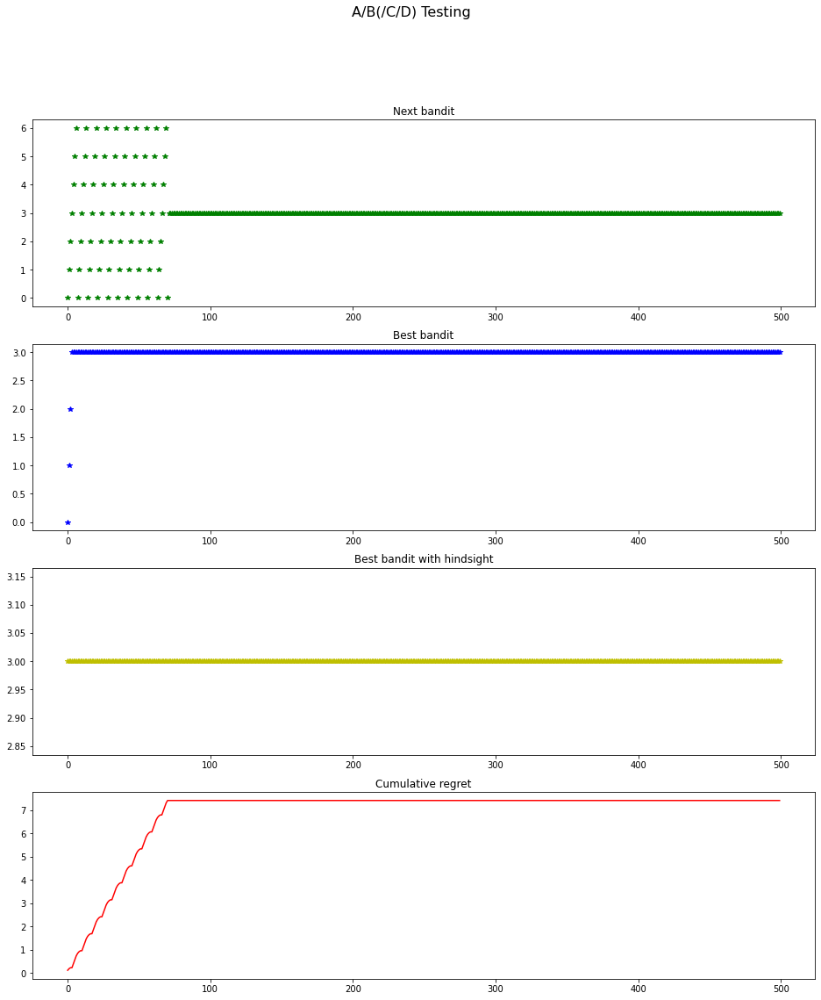

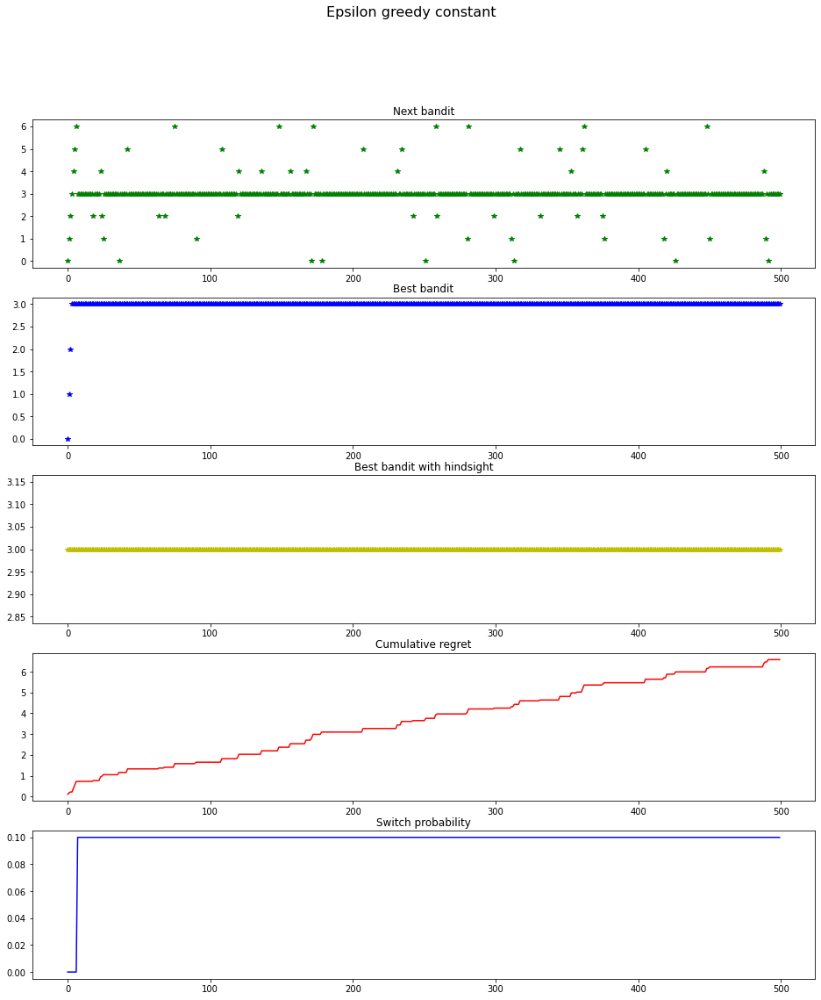

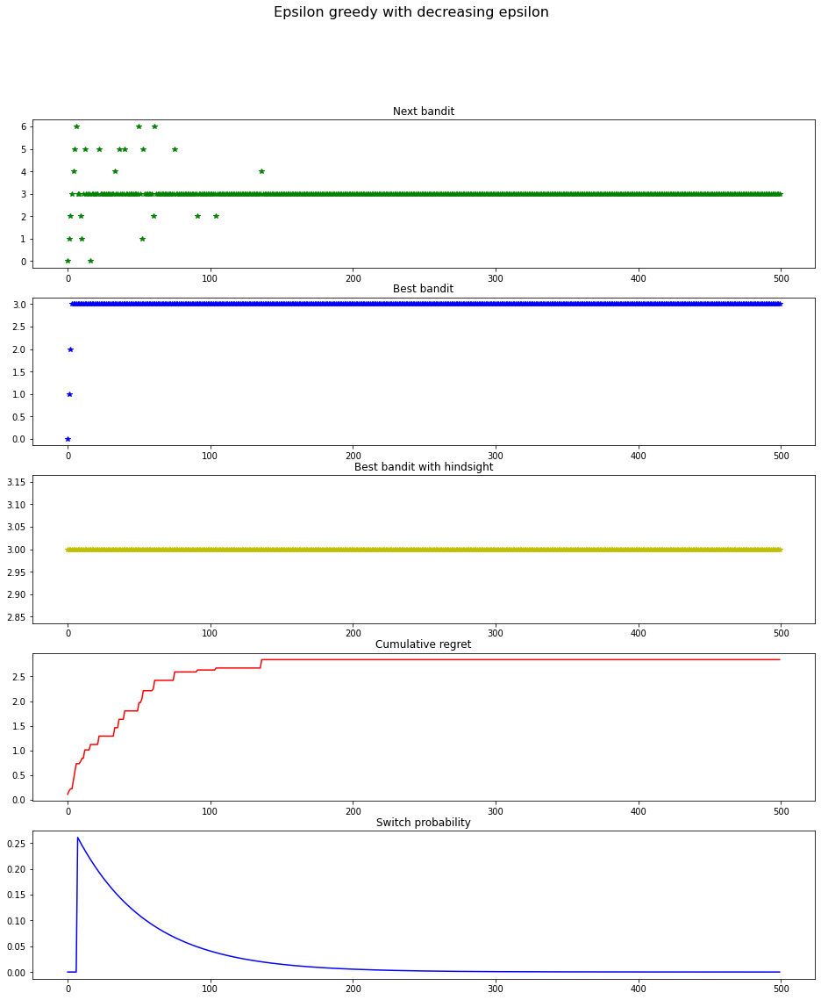

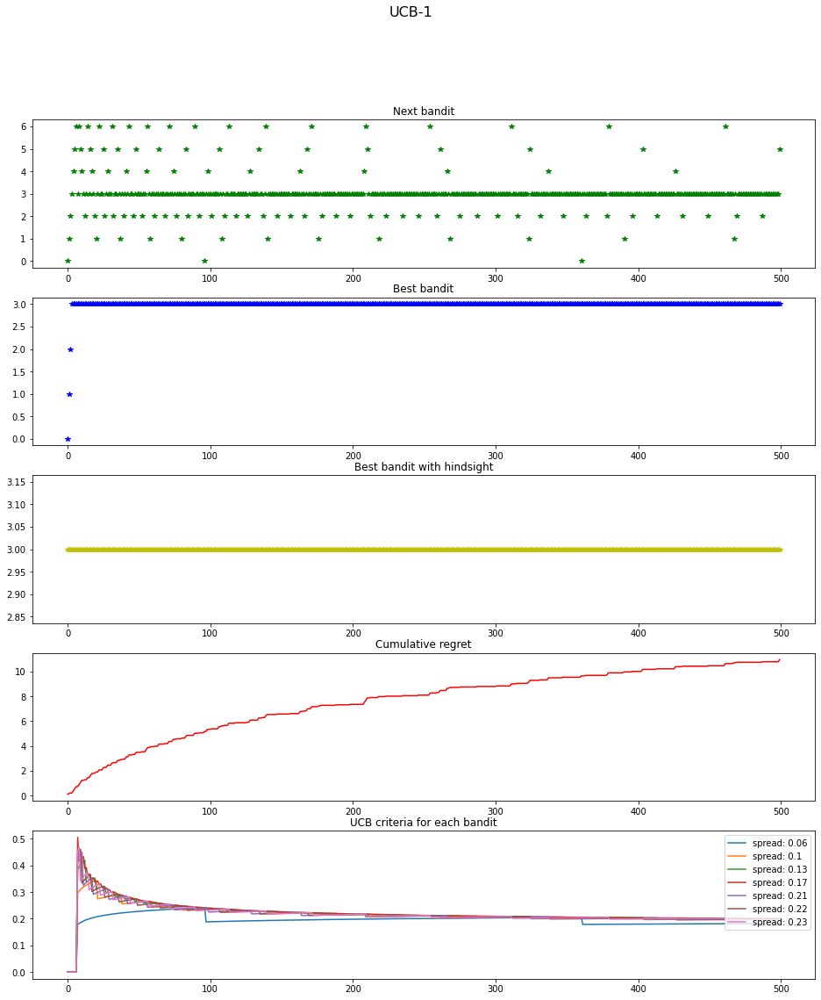

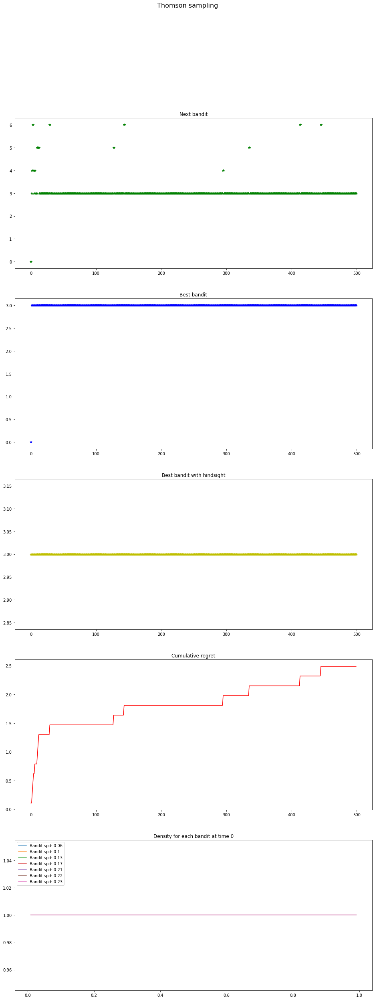

In [209]:
plot_stories(benchworks)

## Deterministic with switch

In [210]:
# start wide (.2) then becomes aggressive after 500
Nomura = BankQuote(mu = lambda t: 0.2 if t < 500 else 0.09, var = lambda t: 0.0000001)

In [211]:
bnpp_bid = BNPPbid(0.000001, competitors=[Nomura])

In [212]:
benchworks = setup_benchworks(bid_bnpp=bnpp_bid, spreads_bandit=spreads_bandit, time_horizon=3000)

Spreads bandit: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time testing: 70
Time total: 3000


In [213]:
run_benchworks(benchworks)

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9034019152878835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6236722070556089
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5736794866722859
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9325954630371636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.56103021925571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13645522566068502
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1954294811093188
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8289808995501787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6692328934531846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06653648135411494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16540611484625978
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20351032104794942
epsilon-gr

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9904061968899467
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3560164860311865
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7580616581331086
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8905522863783111
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08377495384546052
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6428606425466126
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6435771978996101
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2010827273490715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8544384803729621
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9206832530635581
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6609613294538342
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.840513900032506
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06850407381195889
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.814806804263285
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3345871452527489
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.420112790

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7012210862699587
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.996218932176633
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9242781300631541
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3031613853492673
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35720918914780164
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2829236689044369
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5762952691671006
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8457945986780431
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.895458560968348
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8041512868937258
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32015086907771717
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8237305773321081
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.020501196351477513
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16847697164644715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.740781813019585
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7292466

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28281384711679003
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17225514293500632
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6818012243497787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11895713668751362
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2559363925597222
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39333741480754403
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13454105805046412
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7432302916626486
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3066362475978549
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32434776976037827
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6198151560720193
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.881072015773222
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33021032702280306
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5378963514703148
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.746774358424378
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3692

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20873127626347787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35152831550706176
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8342205801044374
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9675331458150631
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18925849525749971
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.987790853375543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48461529180614527
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3458861120007215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5486974193750223
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05862732342942567
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8377965998172092
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6705308529900654
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8443352500831156
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9574640379521862
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9180777884851582
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22094

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8637848349801992
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4445073157502365
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5489479298256053
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35601993515537556
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21944822972831146
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6261848161957219
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21966395644313008
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.011383303335592676
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2576948468724901
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12709998136004674
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8283803856495413
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.661420006676521
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6005214714098324
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.10252004455322727
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4097452772522836
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.666

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5787214664198835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14031309144858373
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2804838782913722
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11331284645534567
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2330249870398936
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5585877438073292
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7237602275423702
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.011747019012012694
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7467208530821723
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5497604473753912
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06536027229118624
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9201892575008702
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29445088701186184
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19681691657780986
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07567084455650541
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8263461298590626
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5003927156903696
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9165246341515456
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11372310463696012
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2657390021387015
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7555503151720289
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14911408469467524
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2548414648653653
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48403491377248853
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.516851982336837
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4401072796287715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8268506674976318
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7822770691269161
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6407746356967806
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.388697476442215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.57766376

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18735970238788757
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18530912486106166
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4632368815289739
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6177758606525792
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24239373777179363
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8460252664939187
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.42281544604290533
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13507476905658677
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8540706713410816
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9613198185000129
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0696386453627893
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.26448310761063387
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1621159314962709
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1885182157187154
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.561279685260345
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4402

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8208826157994542
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7599851187128834
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5960364635827604
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6945784116206096
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45417149532458534
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.028946558947395284
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6506168442155481
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9705276393411073
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18404987545622864
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6031936990362101
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07506330218899282
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23035186260830642
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8963718251414077
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7413753168324565
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17375700390696813
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6164031022814559
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2760639244923849
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04555327485428973
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.017695169448875392
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5311546576829076
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.700545668859709
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8992996820626779
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30969806984437576
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12764208588797377
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9402345824973635
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5526106188738792
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.027568507021850763
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.018256842608266544
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31065398786210996
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7196578424919539
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6106797609529345
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5808722719806987
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.006588669218046461
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7764020218612561
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4836068728826378
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6798426410409337
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4893686514678367
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.43754980334771765
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4995317028846574
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5115306873066947
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9579533959992264
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08855601343813857
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17841101419406524
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6823049716475591
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.338416720488962
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.78971

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2070478119300071
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5440974863121908
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14476846362175988
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45477261502673005
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6739818662359106
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.666793986616129
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21318018600214017
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2989884160680617
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4750090574921788
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9782063592179003
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08653525788568128
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7160472434140199
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8672991106271561
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8799542970519673
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7141649507956142
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.418497

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1162717439178157
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8755557566525717
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06787171837076356
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08451822165355427
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.855216437845818
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3852085108500457
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.15014997051775403
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7904932622622466
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.37111955844604805
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7672297422614619
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21036979389006383
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8523467788933003
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2757498970733847
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4738304328777647
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3301021801895049
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25212

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0723373771903133
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.26979399664730697
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7062131669224804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04881451956052707
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47236524666650137
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33928492584816683
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4681163098333826
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0451889631533986
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.993179455390525
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9803102653998814
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7803638809083127
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1758923093268785
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5438034840586335
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3694591057518155
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.916374902034046
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1758969

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.896714853280818
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28843940257042766
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.803370872496517
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21845687798193214
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9189275911455653
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7769869275863355
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04762788776649962
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6035975106585253
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4517454999776147
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.013633461340453845
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3419751839173747
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05119781135927015
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9085594977408762
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6736449971534023
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7036331256011067
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23035

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7888901905728191
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5132669094865985
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33277799182925905
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7174161713688436
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5114639320952824
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6935952704024253
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.40749740169298854
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34634325963319657
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5049425378781013
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5430657445454248
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22811928077781063
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2872623285301905
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8546013938178709
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8433909714378828
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3341648708367947
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.53527

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5922943389378439
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9681739614152561
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7233669373852771
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5311796677258215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8772916899083242
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18617769296711562
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39813913009203594
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.601058727295284
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7951942965622245
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3251831209938435
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5167918877216288
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.284939376098721
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06834205906260016
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4731814868129469
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8296487277607371
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.63350786

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7869135118693422
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6594850268330827
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.018267422265028643
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5878812908395661
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5772268296001609
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6198590916022422
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9271520367520787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6426088809511243
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34089545379657005
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6988606273773201
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30058301531951825
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.02202447488195791
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5407960317783331
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.689413977678199
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.63076577543327
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6008556

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11632929254277258
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7809417361400777
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17960832450434394
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.03102004720372198
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5260501824430429
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6530047149548001
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23462882380847472
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.42284734680597624
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47602612768737507
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4861249715225927
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5639224700516033
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.46374786405182333
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.49418327815998153
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8501568090694287
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12889439739186848
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4306327873978225
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1779244587350538
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.744626706198013
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7823370998201773
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8736569663732631
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3723822504311688
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45474554056360084
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.40138992843211596
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5230241156757449
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24920919784340256
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.511819273308042
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.42417110913860545
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5619607813541804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5734556369620888
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8299813924430036
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0668805

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.26080747061964177
sample_uniform: 0.9034019152878835
epsilon-greedy
epsilon: 0.2556431366898634
sample_uniform: 0.6236722070556089
epsilon-greedy
epsilon: 0.2505810634233816
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.24561922592339452
sample_uniform: 0.00287032703115897
epsilon-greedy
epsilon: 0.24075563938874353
sample_uniform: 0.07008149603262914
epsilon-greedy
epsilon: 0.23598835831996604
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.23131547574106986
sample_uniform: 0.5700666604160946
epsilon-greedy
epsilon: 0.22673512243671762
sample_uniform: 0.42690982567922653
epsilon-greedy
epsilon: 0.22224546620451535
sample_uniform: 0.2943594751304114
epsilon-greedy
epsilon: 0.21784471112210727
sample_uniform: 0.204358127861885
epsilon-greedy
epsilon: 0.21353109682878288
sample_uniform: 0.3801411726235504
epsilon-greedy
epsilon: 0.2093028978213093
sample_uniform: 0.6297175070215645
epsilon

epsilon-greedy
epsilon: 0.027215385986823753
sample_uniform: 0.48422557658998433
epsilon-greedy
epsilon: 0.026676485237815902
sample_uniform: 0.3912171015854672
epsilon-greedy
epsilon: 0.02614825543859439
sample_uniform: 0.4862841284169842
epsilon-greedy
epsilon: 0.02563048529019637
sample_uniform: 0.9223170920455688
epsilon-greedy
epsilon: 0.02512296767765879
sample_uniform: 0.11277803089152327
epsilon-greedy
epsilon: 0.024625499587169638
sample_uniform: 0.5712735237180706
epsilon-greedy
epsilon: 0.02413788202485973
sample_uniform: 0.9672643792272313
epsilon-greedy
epsilon: 0.023659919937202484
sample_uniform: 0.7809237368426429
epsilon-greedy
epsilon: 0.02319142213298992
sample_uniform: 0.9819918899758847
epsilon-greedy
epsilon: 0.022732201206853642
sample_uniform: 0.6894056692013185
epsilon-greedy
epsilon: 0.022282073464300164
sample_uniform: 0.9813902710374945
epsilon-greedy
epsilon: 0.021840858848230674
sample_uniform: 0.980894751909249
epsilon-greedy
epsilon: 0.021408380866915815

epsilon-greedy
epsilon: 0.002783704166119423
sample_uniform: 0.2708449138359166
epsilon-greedy
epsilon: 0.0027285831305087446
sample_uniform: 0.6636026316710936
epsilon-greedy
epsilon: 0.002674553564531866
sample_uniform: 0.9058084167065523
epsilon-greedy
epsilon: 0.002621593855641987
sample_uniform: 0.7713625072014619
epsilon-greedy
epsilon: 0.002569682819249418
sample_uniform: 0.9158787230673001
epsilon-greedy
epsilon: 0.002518799690247441
sample_uniform: 0.44752837959125524
epsilon-greedy
epsilon: 0.002468924114706009
sample_uniform: 0.13339403014523998
epsilon-greedy
epsilon: 0.0024200361417298843
sample_uniform: 0.021079672835511265
epsilon-greedy
epsilon: 0.002372116215478032
sample_uniform: 0.9310031937645028
epsilon-greedy
epsilon: 0.0023251451673410076
sample_uniform: 0.02605993268839324
epsilon-greedy
epsilon: 0.00227910420827327
sample_uniform: 0.3189358689174241
epsilon-greedy
epsilon: 0.0022339749212773015
sample_uniform: 0.7613352159920956
epsilon-greedy
epsilon: 0.002189

epsilon-greedy
epsilon: 0.0002904808791484205
sample_uniform: 0.2140097727076603
epsilon-greedy
epsilon: 0.0002847289723622618
sample_uniform: 0.30594544708616045
epsilon-greedy
epsilon: 0.0002790909609614847
sample_uniform: 0.6501629863156845
epsilon-greedy
epsilon: 0.0002735645896663549
sample_uniform: 0.055196248654505564
epsilon-greedy
epsilon: 0.00026814764785466807
sample_uniform: 0.1486848661132304
epsilon-greedy
epsilon: 0.00026283796867747247
sample_uniform: 0.3079059334309052
epsilon-greedy
epsilon: 0.0002576334281923012
sample_uniform: 0.7021113049141089
epsilon-greedy
epsilon: 0.0002525319445135647
sample_uniform: 0.654541303819938
epsilon-greedy
epsilon: 0.0002475314769797714
sample_uniform: 0.7275038866586078
epsilon-greedy
epsilon: 0.00024263002533723342
sample_uniform: 0.3966811014027529
epsilon-greedy
epsilon: 0.00023782562893994073
sample_uniform: 0.9799992164436357
epsilon-greedy
epsilon: 0.00023311636596527445
sample_uniform: 0.4575371969863721
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 3.0311820551128023e-05
sample_uniform: 0.6447707704612369
epsilon-greedy
epsilon: 2.9711606289728092e-05
sample_uniform: 0.7616984963076888
epsilon-greedy
epsilon: 2.9123277067004135e-05
sample_uniform: 0.948298238781793
epsilon-greedy
epsilon: 2.8546597543422512e-05
sample_uniform: 0.6879460130074898
epsilon-greedy
epsilon: 2.798133703948464e-05
sample_uniform: 0.006309041039328278
epsilon-greedy
epsilon: 2.742726944345198e-05
sample_uniform: 0.2351363452335682
epsilon-greedy
epsilon: 2.6884173120898553e-05
sample_uniform: 0.06573604136793065
epsilon-greedy
epsilon: 2.6351830826053902e-05
sample_uniform: 0.9818540680087512
epsilon-greedy
epsilon: 2.5830029614902105e-05
sample_uniform: 0.5641393330402388
epsilon-greedy
epsilon: 2.5318560760001205e-05
sample_uniform: 0.4232000582420562
epsilon-greedy
epsilon: 2.481721966698967e-05
sample_uniform: 0.3589360040376469
epsilon-greedy
epsilon: 2.43258057927456e-05
sample_uniform: 0.5636770885928416
epsilon-greedy
epsi

epsilon-greedy
epsilon: 3.039028079589213e-06
sample_uniform: 0.251885434908355
epsilon-greedy
epsilon: 2.9788512917553243e-06
sample_uniform: 0.8655770717294297
epsilon-greedy
epsilon: 2.9198660841566846e-06
sample_uniform: 0.24401653532549394
epsilon-greedy
epsilon: 2.862048861923769e-06
sample_uniform: 0.5441208531845826
epsilon-greedy
epsilon: 2.8053764973967884e-06
sample_uniform: 0.6611549008077319
epsilon-greedy
epsilon: 2.749826320874285e-06
sample_uniform: 0.848679156518333
epsilon-greedy
epsilon: 2.6953761115449716e-06
sample_uniform: 0.16519849415031096
epsilon-greedy
epsilon: 2.6420040885990982e-06
sample_uniform: 0.36401468313426943
epsilon-greedy
epsilon: 2.589688902515861e-06
sample_uniform: 0.6600028862021396
epsilon-greedy
epsilon: 2.5384096265232746e-06
sample_uniform: 0.9482752601153205
epsilon-greedy
epsilon: 2.488145748227211e-06
sample_uniform: 0.6726274664443596
epsilon-greedy
epsilon: 2.438877161406153e-06
sample_uniform: 0.9574640379521862
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 2.986561861335689e-07
sample_uniform: 0.6202904995542293
epsilon-greedy
epsilon: 2.927423974229797e-07
sample_uniform: 0.4085801200317656
epsilon-greedy
epsilon: 2.869457095746438e-07
sample_uniform: 0.9043767747651714
epsilon-greedy
epsilon: 2.8126380383613094e-07
sample_uniform: 0.42259646447274113
epsilon-greedy
epsilon: 2.7569440736938715e-07
sample_uniform: 0.21317299099035736
epsilon-greedy
epsilon: 2.702352923415655e-07
sample_uniform: 0.37480579901075295
epsilon-greedy
epsilon: 2.648842750338658e-07
sample_uniform: 0.4869019728966567
epsilon-greedy
epsilon: 2.596392149680166e-07
sample_uniform: 0.5060209531939502
epsilon-greedy
epsilon: 2.5449801405005743e-07
sample_uniform: 0.6195907024184152
epsilon-greedy
epsilon: 2.4945861573107034e-07
sample_uniform: 0.2179907626050135
epsilon-greedy
epsilon: 2.445190041845349e-07
sample_uniform: 0.5292339765382337
epsilon-greedy
epsilon: 2.396772034999702e-07
sample_uniform: 0.3684455733237365
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 3.054781107935996e-08
sample_uniform: 0.9896940562241727
epsilon-greedy
epsilon: 2.9942923892414045e-08
sample_uniform: 0.8999442022772963
epsilon-greedy
epsilon: 2.9350014274269407e-08
sample_uniform: 0.8477747263258465
epsilon-greedy
epsilon: 2.8768845053173213e-08
sample_uniform: 0.6746587928200555
epsilon-greedy
epsilon: 2.8199183753688006e-08
sample_uniform: 0.06134945088335042
epsilon-greedy
epsilon: 2.7640802503698405e-08
sample_uniform: 0.31013083771274763
epsilon-greedy
epsilon: 2.7093477943259225e-08
sample_uniform: 0.7347989996237315
epsilon-greedy
epsilon: 2.6556991135248545e-08
sample_uniform: 0.04207320263448522
epsilon-greedy
epsilon: 2.6031127477789803e-08
sample_uniform: 0.6732308218724425
epsilon-greedy
epsilon: 2.5515676618408598e-08
sample_uniform: 0.8119228688692407
epsilon-greedy
epsilon: 2.5010432369888312e-08
sample_uniform: 0.05313777242793827
epsilon-greedy
epsilon: 2.4515192627792865e-08
sample_uniform: 0.19496893348040523
epsilon-gree

epsilon-greedy
epsilon: 3.1876788943281995e-09
sample_uniform: 0.9732461632023665
epsilon-greedy
epsilon: 3.1245586231484474e-09
sample_uniform: 0.9161241328126489
epsilon-greedy
epsilon: 3.0626882170792913e-09
sample_uniform: 0.9905888441287513
epsilon-greedy
epsilon: 3.0020429271333437e-09
sample_uniform: 0.8806386491924056
epsilon-greedy
epsilon: 2.942598494386033e-09
sample_uniform: 0.3951182349760033
epsilon-greedy
epsilon: 2.8843311402716463e-09
sample_uniform: 0.7185444812760777
epsilon-greedy
epsilon: 2.8272175570716296e-09
sample_uniform: 0.24179127164695902
epsilon-greedy
epsilon: 2.7712348985911783e-09
sample_uniform: 0.26678681413082816
epsilon-greedy
epsilon: 2.7163607710204545e-09
sample_uniform: 0.12632908617054495
epsilon-greedy
epsilon: 2.662573223976766e-09
sample_uniform: 0.37630911838253567
epsilon-greedy
epsilon: 2.609850741724117e-09
sample_uniform: 0.4855807291251272
epsilon-greedy
epsilon: 2.5581722345666324e-09
sample_uniform: 0.4478852544543116
epsilon-greedy


epsilon-greedy
epsilon: 3.260492069702211e-10
sample_uniform: 0.6572564284503439
epsilon-greedy
epsilon: 3.1959300010493055e-10
sample_uniform: 0.7751228342470052
epsilon-greedy
epsilon: 3.132646347009788e-10
sample_uniform: 0.01991395307599786
epsilon-greedy
epsilon: 3.0706157932782484e-10
sample_uniform: 0.8023057629577969
epsilon-greedy
epsilon: 3.0098135268061107e-10
sample_uniform: 0.556032908836256
epsilon-greedy
epsilon: 2.9502152258760767e-10
sample_uniform: 0.8503251225338829
epsilon-greedy
epsilon: 2.891797050373111e-10
sample_uniform: 0.8222399382591169
epsilon-greedy
epsilon: 2.8345356322481126e-10
sample_uniform: 0.3348932758431422
epsilon-greedy
epsilon: 2.778408066170326e-10
sample_uniform: 0.9440730415782838
epsilon-greedy
epsilon: 2.7233919003649425e-10
sample_uniform: 0.25606694161593013
epsilon-greedy
epsilon: 2.6694651276320806e-10
sample_uniform: 0.699438035236725
epsilon-greedy
epsilon: 2.616606176543615e-10
sample_uniform: 0.07074655154800358
epsilon-greedy
epsil

epsilon-greedy
epsilon: 3.2689316487571465e-11
sample_uniform: 0.5340684651546551
epsilon-greedy
epsilon: 3.204202465242221e-11
sample_uniform: 0.11223677870043636
epsilon-greedy
epsilon: 3.1407550054366606e-11
sample_uniform: 0.02301817454483812
epsilon-greedy
epsilon: 3.0785638895105667e-11
sample_uniform: 0.7664754567383575
epsilon-greedy
epsilon: 3.0176042401883435e-11
sample_uniform: 0.4453842401215822
epsilon-greedy
epsilon: 2.9578516727974547e-11
sample_uniform: 0.8238075594348285
epsilon-greedy
epsilon: 2.8992822855142334e-11
sample_uniform: 0.15584000676742837
epsilon-greedy
epsilon: 2.84187264980283e-11
sample_uniform: 0.5944867178540717
epsilon-greedy
epsilon: 2.7855998010434785e-11
sample_uniform: 0.7975863327327137
epsilon-greedy
epsilon: 2.7304412293463803e-11
sample_uniform: 0.16550529368977618
epsilon-greedy
epsilon: 2.676374870547389e-11
sample_uniform: 0.7261829887292689
epsilon-greedy
epsilon: 2.623379097382091e-11
sample_uniform: 0.7651579305851546
epsilon-greedy
ep

epsilon-greedy
epsilon: 3.4111460217800215e-12
sample_uniform: 0.4533798532673977
epsilon-greedy
epsilon: 3.3436008050043947e-12
sample_uniform: 0.9290626514760069
epsilon-greedy
epsilon: 3.277393073132708e-12
sample_uniform: 0.15594574752168977
epsilon-greedy
epsilon: 3.21249634218942e-12
sample_uniform: 0.11611443004279187
epsilon-greedy
epsilon: 3.148884652616875e-12
sample_uniform: 0.9598639913780882
epsilon-greedy
epsilon: 3.086532558891065e-12
sample_uniform: 0.258823928254697
epsilon-greedy
epsilon: 3.025415119343128e-12
sample_uniform: 0.7308673608140276
epsilon-greedy
epsilon: 2.965507886182334e-12
sample_uniform: 0.8176138976414036
epsilon-greedy
epsilon: 2.9067868957166457e-12
sample_uniform: 0.9977188518217868
epsilon-greedy
epsilon: 2.849228658766919e-12
sample_uniform: 0.7636436355945743
epsilon-greedy
epsilon: 2.7928101512709208e-12
sample_uniform: 0.9014648122095859
epsilon-greedy
epsilon: 2.7375088050733865e-12
sample_uniform: 0.20697488012111553
epsilon-greedy
epsilon

epsilon-greedy
epsilon: 3.3522555058037613e-13
sample_uniform: 0.7886555915306233
epsilon-greedy
epsilon: 3.2858763993741143e-13
sample_uniform: 0.40713091219921316
epsilon-greedy
epsilon: 3.2208116873164864e-13
sample_uniform: 0.3378881686581082
epsilon-greedy
epsilon: 3.157035342878513e-13
sample_uniform: 0.16472489146607516
epsilon-greedy
epsilon: 3.094521854672046e-13
sample_uniform: 0.24610282134004846
epsilon-greedy
epsilon: 3.033246216468301e-13
sample_uniform: 0.3474742648965936
epsilon-greedy
epsilon: 2.973183917194965e-13
sample_uniform: 0.8748077106036388
epsilon-greedy
epsilon: 2.9143109311314876e-13
sample_uniform: 0.49376808348736334
epsilon-greedy
epsilon: 2.85660370829846e-13
sample_uniform: 0.2818191678706431
epsilon-greedy
epsilon: 2.8000391650373093e-13
sample_uniform: 0.52965585742282
epsilon-greedy
epsilon: 2.7445946747765265e-13
sample_uniform: 0.8910277030425401
epsilon-greedy
epsilon: 2.690248058980738e-13
sample_uniform: 0.33310701757706696
epsilon-greedy
epsil

epsilon-greedy
epsilon: 3.568761074449834e-14
sample_uniform: 0.2148288412370486
epsilon-greedy
epsilon: 3.4980948705245195e-14
sample_uniform: 0.78060753264294
epsilon-greedy
epsilon: 3.428827951189301e-14
sample_uniform: 0.008163051789111697
epsilon-greedy
epsilon: 3.3609326087528746e-14
sample_uniform: 0.5876832965696686
epsilon-greedy
epsilon: 3.294381684172981e-14
sample_uniform: 0.5978106190342276
epsilon-greedy
epsilon: 3.2291485561924314e-14
sample_uniform: 0.1830035354240942
epsilon-greedy
epsilon: 3.165207130690247e-14
sample_uniform: 0.7054678287622835
epsilon-greedy
epsilon: 3.1025318302436635e-14
sample_uniform: 0.20932371886080192
epsilon-greedy
epsilon: 3.041097583896809e-14
sample_uniform: 0.017931376089753037
epsilon-greedy
epsilon: 2.980879817132032e-14
sample_uniform: 0.3694400297117064
epsilon-greedy
epsilon: 2.9218544420397025e-14
sample_uniform: 0.9243414217000279
epsilon-greedy
epsilon: 2.863997847682767e-14
sample_uniform: 0.6632521323371574
epsilon-greedy
epsil

epsilon-greedy
epsilon: 3.577998588472908e-15
sample_uniform: 0.04316995873550311
epsilon-greedy
epsilon: 3.5071494695146016e-15
sample_uniform: 0.4111220721419354
epsilon-greedy
epsilon: 3.437703257106692e-15
sample_uniform: 0.3019090898093155
epsilon-greedy
epsilon: 3.3696321718383046e-15
sample_uniform: 0.11715407709252357
epsilon-greedy
epsilon: 3.3029089843676562e-15
sample_uniform: 0.6489323135500749
epsilon-greedy
epsilon: 3.2375070045301526e-15
sample_uniform: 0.9147003005811911
epsilon-greedy
epsilon: 3.173400070661773e-15
sample_uniform: 0.6236040828298205
epsilon-greedy
epsilon: 3.1105625391342233e-15
sample_uniform: 0.08126796243267131
epsilon-greedy
epsilon: 3.04896927409707e-15
sample_uniform: 0.6164942218903243
epsilon-greedy
epsilon: 2.9885956374229998e-15
sample_uniform: 0.003586054971928987
epsilon-greedy
epsilon: 2.9294174788523926e-15
sample_uniform: 0.6467393281016806
epsilon-greedy
epsilon: 2.871411126332726e-15
sample_uniform: 0.4526012826596403
epsilon-greedy
ep

epsilon-greedy
epsilon: 3.659727472512638e-16
sample_uniform: 0.2493105259123457
epsilon-greedy
epsilon: 3.5872600132211864e-16
sample_uniform: 0.08623133217148604
epsilon-greedy
epsilon: 3.5162275057657694e-16
sample_uniform: 0.5429430882462545
epsilon-greedy
epsilon: 3.446601536196342e-16
sample_uniform: 0.15368721884454584
epsilon-greedy
epsilon: 3.3783542531966687e-16
sample_uniform: 0.9586882041489067
epsilon-greedy
epsilon: 3.311458356943622e-16
sample_uniform: 0.7970866913809663
epsilon-greedy
epsilon: 3.245887088186696e-16
sample_uniform: 0.01761736172387718
epsilon-greedy
epsilon: 3.181614217544139e-16
sample_uniform: 0.9775194552562585
epsilon-greedy
epsilon: 3.1186140350106656e-16
sample_uniform: 0.8089532064516339
epsilon-greedy
epsilon: 3.056861339673272e-16
sample_uniform: 0.6582599005855687
epsilon-greedy
epsilon: 2.996331429630464e-16
sample_uniform: 0.7367384707469882
epsilon-greedy
epsilon: 2.937000092111105e-16
sample_uniform: 0.9577665081209402
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 3.818943358270254e-17
sample_uniform: 0.5291425748176508
epsilon-greedy
epsilon: 3.743323213210163e-17
sample_uniform: 0.5128812356581461
epsilon-greedy
epsilon: 3.669200447346971e-17
sample_uniform: 0.4573318821345347
epsilon-greedy
epsilon: 3.5965454105860683e-17
sample_uniform: 0.14929755115968502
epsilon-greedy
epsilon: 3.525329039943952e-17
sample_uniform: 0.00024810969144128947
epsilon-greedy
epsilon: 3.455522847922829e-17
sample_uniform: 0.17288942737033342
epsilon-greedy
epsilon: 3.387098911115151e-17
sample_uniform: 0.4580656979461577
epsilon-greedy
epsilon: 3.320029859033816e-17
sample_uniform: 0.6666375449672162
epsilon-greedy
epsilon: 3.254288863163773e-17
sample_uniform: 0.30181444889941733
epsilon-greedy
epsilon: 3.18984962623007e-17
sample_uniform: 0.6577130536186405
epsilon-greedy
epsilon: 3.126686371678776e-17
sample_uniform: 0.36539848206055836
epsilon-greedy
epsilon: 3.064773833365839e-17
sample_uniform: 0.5284347091291558
epsilon-greedy
epsil

epsilon-greedy
epsilon: 3.906175918922431e-18
sample_uniform: 0.9028327386597728
epsilon-greedy
epsilon: 3.828828453430578e-18
sample_uniform: 0.7354119927720119
epsilon-greedy
epsilon: 3.753012570371797e-18
sample_uniform: 0.648891046903516
epsilon-greedy
epsilon: 3.678697942382025e-18
sample_uniform: 0.7271928127063297
epsilon-greedy
epsilon: 3.60585484261914e-18
sample_uniform: 0.9246558742655647
epsilon-greedy
epsilon: 3.534454132872035e-18
sample_uniform: 0.8956214326915924
epsilon-greedy
epsilon: 3.4644672519047356e-18
sample_uniform: 0.6693258691636693
epsilon-greedy
epsilon: 3.3958662040317116e-18
sample_uniform: 0.5210440840115236
epsilon-greedy
epsilon: 3.3286235479191444e-18
sample_uniform: 0.9747362888308004
epsilon-greedy
epsilon: 3.26271238560796e-18
sample_uniform: 0.20319136790391945
epsilon-greedy
epsilon: 3.1981063517544536e-18
sample_uniform: 0.9463283584858162
epsilon-greedy
epsilon: 3.1347796030836127e-18
sample_uniform: 0.8945112303148792
epsilon-greedy
epsilon: 3

epsilon-greedy
epsilon: 4.076113506769462e-19
sample_uniform: 0.543826746042004
epsilon-greedy
epsilon: 3.995401051583188e-19
sample_uniform: 0.6800879380374426
epsilon-greedy
epsilon: 3.9162868100902445e-19
sample_uniform: 0.25779812498567434
epsilon-greedy
epsilon: 3.8387391355391903e-19
sample_uniform: 0.9436720775122671
epsilon-greedy
epsilon: 3.7627270078262496e-19
sample_uniform: 0.7309096578638293
epsilon-greedy
epsilon: 3.688220021086776e-19
sample_uniform: 0.315437525684225
epsilon-greedy
epsilon: 3.6151883715326846e-19
sample_uniform: 0.44817300838363905
epsilon-greedy
epsilon: 3.5436028455303356e-19
sample_uniform: 0.8570718480560297
epsilon-greedy
epsilon: 3.4734348079148923e-19
sample_uniform: 0.4493473801581078
epsilon-greedy
epsilon: 3.404656190535671e-19
sample_uniform: 0.8919312868604339
epsilon-greedy
epsilon: 3.337239481028686e-19
sample_uniform: 0.30347954533484545
epsilon-greedy
epsilon: 3.2711577118112556e-19
sample_uniform: 0.8538691649942701
epsilon-greedy
epsil

epsilon-greedy
epsilon: 4.2534442034683936e-20
sample_uniform: 0.6153500053365197
epsilon-greedy
epsilon: 4.1692203652240147e-20
sample_uniform: 0.6320020972173973
epsilon-greedy
epsilon: 4.086664270716102e-20
sample_uniform: 0.36933848011913384
epsilon-greedy
epsilon: 4.005742896406029e-20
sample_uniform: 0.09881473413050101
epsilon-greedy
epsilon: 3.926423872665164e-20
sample_uniform: 0.37845139972438147
epsilon-greedy
epsilon: 3.8486754708263543e-20
sample_uniform: 0.7441405015646166
epsilon-greedy
epsilon: 3.772466590492233e-20
sample_uniform: 0.5530057119287732
epsilon-greedy
epsilon: 3.69776674709456e-20
sample_uniform: 0.49011243068908783
epsilon-greedy
epsilon: 3.6245460596999126e-20
sample_uniform: 0.10641893419279147
epsilon-greedy
epsilon: 3.5527752390570955e-20
sample_uniform: 0.02374614894219995
epsilon-greedy
epsilon: 3.4824255758808445e-20
sample_uniform: 0.47840888452372177
epsilon-greedy
epsilon: 3.4134689293679305e-20
sample_uniform: 0.5958380755619431
epsilon-greedy


epsilon-greedy
epsilon: 4.350601661605652e-21
sample_uniform: 0.730696643142321
epsilon-greedy
epsilon: 4.2644539767920126e-21
sample_uniform: 0.31495738388018446
epsilon-greedy
epsilon: 4.180012130429264e-21
sample_uniform: 0.6884198058723681
epsilon-greedy
epsilon: 4.097242344652896e-21
sample_uniform: 0.2501050510384193
epsilon-greedy
epsilon: 4.016111510445044e-21
sample_uniform: 0.03400961584083162
epsilon-greedy
epsilon: 3.9365871743902085e-21
sample_uniform: 0.39217519949130597
epsilon-greedy
epsilon: 3.858637525693687e-21
sample_uniform: 0.40722113873189314
epsilon-greedy
epsilon: 3.782231383456601e-21
sample_uniform: 0.6631195667066025
epsilon-greedy
epsilon: 3.707338184203322e-21
sample_uniform: 0.7420009927269361
epsilon-greedy
epsilon: 3.633927969655586e-21
sample_uniform: 0.9393718811502159
epsilon-greedy
epsilon: 3.561971374748705e-21
sample_uniform: 0.9357126872863974
epsilon-greedy
epsilon: 3.491439615885334e-21
sample_uniform: 0.9534825194363855
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 4.361862920910927e-22
sample_uniform: 0.5938236967471339
epsilon-greedy
epsilon: 4.275492248222805e-22
sample_uniform: 0.6210526391440759
epsilon-greedy
epsilon: 4.190831829441297e-22
sample_uniform: 0.720807144562418
epsilon-greedy
epsilon: 4.1078477992700977e-22
sample_uniform: 0.29359506251919887
epsilon-greedy
epsilon: 4.026506962990612e-22
sample_uniform: 0.4281478135350819
epsilon-greedy
epsilon: 3.9467767831838254e-22
sample_uniform: 0.48394715142860933
epsilon-greedy
epsilon: 3.8686253667146777e-22
sample_uniform: 0.6239281841761661
epsilon-greedy
epsilon: 3.792021451974602e-22
sample_uniform: 0.05430844174316174
epsilon-greedy
epsilon: 3.7169343963762485e-22
sample_uniform: 0.35394637404235396
epsilon-greedy
epsilon: 3.6433341640962593e-22
sample_uniform: 0.4891301687133587
epsilon-greedy
epsilon: 3.5711913140603182e-22
sample_uniform: 0.553196314046375
epsilon-greedy
epsilon: 3.5004769881665213e-22
sample_uniform: 0.5219958460950995
epsilon-greedy
epsi

epsilon-greedy
epsilon: 4.373153329278989e-23
sample_uniform: 0.6648238363619222
epsilon-greedy
epsilon: 4.286559091526302e-23
sample_uniform: 0.0010931674960220628
epsilon-greedy
epsilon: 4.201679534565079e-23
sample_uniform: 0.47787570914151223
epsilon-greedy
epsilon: 4.1184807054408224e-23
sample_uniform: 0.4890202615571013
epsilon-greedy
epsilon: 4.03692932351258e-23
sample_uniform: 0.7271781599385022
epsilon-greedy
epsilon: 3.956992767140156e-23
sample_uniform: 0.1487116227687877
epsilon-greedy
epsilon: 3.878639060635223e-23
sample_uniform: 0.16890551844547974
epsilon-greedy
epsilon: 3.801836861470393e-23
sample_uniform: 0.5984236100156769
epsilon-greedy
epsilon: 3.7265554477420124e-23
sample_uniform: 0.20526249540451125
epsilon-greedy
epsilon: 3.6527647058807705e-23
sample_uniform: 0.06658965195968325
epsilon-greedy
epsilon: 3.580435118606086e-23
sample_uniform: 0.024170033855356432
epsilon-greedy
epsilon: 3.5095377531185894e-23
sample_uniform: 0.15729312846262766
epsilon-greedy


epsilon-greedy
epsilon: 4.384472962160422e-24
sample_uniform: 0.048907498786476045
epsilon-greedy
epsilon: 4.297654580658972e-24
sample_uniform: 0.16724522538768793
epsilon-greedy
epsilon: 4.212555318292642e-24
sample_uniform: 0.5901332373042716
epsilon-greedy
epsilon: 4.1291411342217506e-24
sample_uniform: 0.7384864918738803
epsilon-greedy
epsilon: 4.047378661660527e-24
sample_uniform: 0.2349357713639929
epsilon-greedy
epsilon: 3.967235194529707e-24
sample_uniform: 0.9464902786066574
epsilon-greedy
epsilon: 3.8886786743738735e-24
sample_uniform: 0.6348752385854416
epsilon-greedy
epsilon: 3.8116776775375584e-24
sample_uniform: 0.044248327143139754
epsilon-greedy
epsilon: 3.736201402595277e-24
sample_uniform: 0.09679808388726496
epsilon-greedy
epsilon: 3.6622196580307435e-24
sample_uniform: 0.07908719738885062
epsilon-greedy
epsilon: 3.589702850159643e-24
sample_uniform: 0.8875868312392411
epsilon-greedy
epsilon: 3.518621971291974e-24
sample_uniform: 0.22420484090062887
epsilon-greedy
e

epsilon-greedy
epsilon: 4.395821895200983e-25
sample_uniform: 0.00014186558628126456
epsilon-greedy
epsilon: 4.308778789768808e-25
sample_uniform: 0.35844571557207805
epsilon-greedy
epsilon: 4.223459253303659e-25
sample_uniform: 0.8741513567848
epsilon-greedy
epsilon: 4.139829156853402e-25
sample_uniform: 0.7192028331488175
epsilon-greedy
epsilon: 4.0578550472643157e-25
sample_uniform: 0.11289155923013483
epsilon-greedy
epsilon: 3.9775041337996184e-25
sample_uniform: 0.38901282952543015
epsilon-greedy
epsilon: 3.898744275022509e-25
sample_uniform: 0.6474998203053542
epsilon-greedy
epsilon: 3.821543965939359e-25
sample_uniform: 0.46315302102230393
epsilon-greedy
epsilon: 3.7458723253972107e-25
sample_uniform: 0.10001053098730284
epsilon-greedy
epsilon: 3.671699083730825e-25
sample_uniform: 0.2283989111577044
epsilon-greedy
epsilon: 3.598994570654598e-25
sample_uniform: 0.4413517549434459
epsilon-greedy
epsilon: 3.527729703393841e-25
sample_uniform: 0.2002720438082699
epsilon-greedy
epsi

epsilon-greedy
epsilon: 4.587061456598334e-26
sample_uniform: 0.45126954922519213
epsilon-greedy
epsilon: 4.4962315541342576e-26
sample_uniform: 0.3351140740228592
epsilon-greedy
epsilon: 4.407200204242356e-26
sample_uniform: 0.8035133662666539
epsilon-greedy
epsilon: 4.319931793195605e-26
sample_uniform: 0.2205320385933256
epsilon-greedy
epsilon: 4.234391412466021e-26
sample_uniform: 0.5121596279538382
epsilon-greedy
epsilon: 4.1505448447606984e-26
sample_uniform: 0.17945002991346726
epsilon-greedy
epsilon: 4.0683585503346455e-26
sample_uniform: 0.013925896637786872
epsilon-greedy
epsilon: 3.9877996535742015e-26
sample_uniform: 0.6480660802521941
epsilon-greedy
epsilon: 3.9088359298465856e-26
sample_uniform: 0.8727545697101088
epsilon-greedy
epsilon: 3.831435792609389e-26
sample_uniform: 0.687964202934531
epsilon-greedy
epsilon: 3.755568280775728e-26
sample_uniform: 0.7913795190307866
epsilon-greedy
epsilon: 3.681203046329315e-26
sample_uniform: 0.6450014136463024
epsilon-greedy
epsil

epsilon-greedy
epsilon: 4.691839422435778e-27
sample_uniform: 0.6072923817205148
epsilon-greedy
epsilon: 4.598934777239901e-27
sample_uniform: 0.3835593232915684
epsilon-greedy
epsilon: 4.507869767274835e-27
sample_uniform: 0.33175787920329936
epsilon-greedy
epsilon: 4.4186079653224435e-27
sample_uniform: 0.41424410813957835
epsilon-greedy
epsilon: 4.331113665471706e-27
sample_uniform: 0.06706693537966602
epsilon-greedy
epsilon: 4.2453518688361114e-27
sample_uniform: 0.14428937679478404
epsilon-greedy
epsilon: 4.1612882695535274e-27
sample_uniform: 0.018138818062013007
epsilon-greedy
epsilon: 4.078889241063318e-27
sample_uniform: 0.6874104961431682
epsilon-greedy
epsilon: 3.998121822655478e-27
sample_uniform: 0.46720179238240167
epsilon-greedy
epsilon: 3.918953706285674e-27
sample_uniform: 0.08571800457247403
epsilon-greedy
epsilon: 3.841353223651824e-27
sample_uniform: 0.21188177626709392
epsilon-greedy
epsilon: 3.765289333526135e-27
sample_uniform: 0.5862281312069786
epsilon-greedy
e

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 18  3  3  1]
Wins:
[ 2.  1.  1. 19.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 2.]
Thompson probas:
[0.66666667 0.5        0.5        0.95       0.2        0.2
 0.33333333]
Thompson samples:
[0.01341621 0.02095466 0.10524602 0.16576264 0.01965003 0.04571866
 0.16541383]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 19  3  3  1]
Wins:
[ 2.  1.  1. 20.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 2.]
Thompson probas:
[0.66666667 0.5        0.5        0.95238095 0.2        0.2
 0.33333333]
Thompson samples:
[0.04596742 0.00423515 0.07861419 0.12650695 0.04027091 0.04510651
 0.10379821]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 20  3  3  1]
Wins:
[ 2.  1.  1. 21.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 2.]
Thompson probas:
[0.66666667 0.5       

 0.0893379 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 41  3  3  2]
Wins:
[ 2.  1.  1. 42.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.97674419 0.2        0.2
 0.25      ]
Thompson samples:
[0.02398346 0.02754282 0.05357351 0.16927856 0.00590078 0.05115239
 0.00407376]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 42  3  3  2]
Wins:
[ 2.  1.  1. 43.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.97727273 0.2        0.2
 0.25      ]
Thompson samples:
[0.03419077 0.04423149 0.06918712 0.16720285 0.00442955 0.01960636
 0.14742482]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 43  3  3  2]
Wins:
[ 2.  1.  1. 44.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson pr

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 64  3  3  2]
Wins:
[ 2.  1.  1. 65.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98484848 0.2        0.2
 0.25      ]
Thompson samples:
[0.05822266 0.07261248 0.05014754 0.16235897 0.08917599 0.07827919
 0.01199821]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 65  3  3  2]
Wins:
[ 2.  1.  1. 66.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98507463 0.2        0.2
 0.25      ]
Thompson samples:
[0.04328263 0.03912377 0.00772367 0.16866659 0.05208588 0.01038442
 0.07054093]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 66  3  3  2]
Wins:
[ 2.  1.  1. 67.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 87  3  3  2]
Wins:
[ 2.  1.  1. 88.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98876404 0.2        0.2
 0.25      ]
Thompson samples:
[0.03009025 0.05207146 0.11883648 0.16977052 0.06484418 0.02938693
 0.06002547]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 88  3  3  2]
Wins:
[ 2.  1.  1. 89.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98888889 0.2        0.2
 0.25      ]
Thompson samples:
[0.02566741 0.01720147 0.04403396 0.16614232 0.1202857  0.05322418
 0.09012695]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 89  3  3  2]
Wins:
[ 2.  1.  1. 90.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 108   3   3   2]
Wins:
[  2.   1.   1. 109.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99090909 0.2        0.2
 0.25      ]
Thompson samples:
[0.05978137 0.02410037 0.10395528 0.167353   0.02049295 0.0306897
 0.07132793]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 109   3   3   2]
Wins:
[  2.   1.   1. 110.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99099099 0.2        0.2
 0.25      ]
Thompson samples:
[0.03426107 0.03203795 0.03059983 0.16891408 0.00545188 0.06244074
 0.09131422]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 110   3   3   2]
Wins:
[  2.   1.   1. 111.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 131   3   4   2]
Wins:
[  2.   1.   1. 132.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.9924812  0.2        0.16666667
 0.25      ]
Thompson samples:
[0.03416253 0.05717657 0.06110707 0.16993267 0.03019829 0.01772929
 0.11786593]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 132   3   4   2]
Wins:
[  2.   1.   1. 133.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99253731 0.2        0.16666667
 0.25      ]
Thompson samples:
[0.05932812 0.07311475 0.04050265 0.16830586 0.13511843 0.08022471
 0.11327665]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 133   3   4   2]
Wins:
[  2.   1.   1. 134.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 154   3   4   3]
Wins:
[  2.   1.   1. 155.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99358974 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05080095 0.07532052 0.06199153 0.16946279 0.0647256  0.01876176
 0.01655585]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 155   3   4   3]
Wins:
[  2.   1.   1. 156.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99363057 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03675878 0.0497975  0.11517842 0.16881425 0.01761012 0.00363767
 0.01422294]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 156   3   4   3]
Wins:
[  2.   1.   1. 157.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 178   3   4   3]
Wins:
[  2.   1.   1. 179.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99444444 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03833763 0.07366351 0.09293284 0.16940162 0.00062614 0.00265516
 0.00121187]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 179   3   4   3]
Wins:
[  2.   1.   1. 180.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99447514 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.02892866 0.02311808 0.03569047 0.169952   0.02652872 0.01020128
 0.05828719]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 180   3   4   3]
Wins:
[  2.   1.   1. 181.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 214   3   4   3]
Wins:
[  2.   1.   1. 215.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99537037 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.02564958 0.06217607 0.04107056 0.16928155 0.00989491 0.01240371
 0.06021572]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 215   3   4   3]
Wins:
[  2.   1.   1. 216.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99539171 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.02846254 0.01261828 0.06445673 0.16917403 0.06864012 0.10011192
 0.0018405 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 216   3   4   3]
Wins:
[  2.   1.   1. 217.   1.   1.   1.]
Losses:
[1. 1.

 0.00474861]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 239   3   4   3]
Wins:
[  2.   1.   1. 240.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99585062 0.2        0.16666667
 0.2       ]
Thompson samples:
[5.24857513e-02 1.33847783e-02 8.74464176e-02 1.69424974e-01
 1.37670467e-01 8.54194627e-02 3.69722139e-05]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 240   3   4   3]
Wins:
[  2.   1.   1. 241.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99586777 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.01838252 0.01945143 0.1092805  0.16963787 0.01794621 0.03976781
 0.00799592]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 241   3   4   3]
W

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 262   3   4   3]
Wins:
[  2.   1.   1. 263.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99621212 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.04271179 0.01930593 0.03983601 0.16995063 0.07946544 0.0276853
 0.00200788]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 263   3   4   3]
Wins:
[  2.   1.   1. 264.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99622642 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.04014225 0.05598325 0.03981521 0.16981214 0.01911178 0.08188564
 0.03697119]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 264   3   4   3]
Wins:
[  2.   1.   1. 265.   1.   1.   1.]
Losses:
[1. 1. 

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 284   3   4   3]
Wins:
[  2.   1.   1. 285.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9965035  0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03015585 0.00660905 0.00253629 0.16867991 0.18082683 0.00027656
 0.01482727]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 284   4   4   3]
Wins:
[  2.   1.   1. 285.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9965035  0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.03400457 0.02250162 0.02717097 0.16964074 0.0777326  0.01463426
 0.02585337]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 285   4   4   3]
Wins:
[  2.   1.   1. 286.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 306   4   4   3]
Wins:
[  2.   1.   1. 307.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99675325 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.02189864 0.01163586 0.0665027  0.16991953 0.02795348 0.00752357
 0.01965222]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 307   4   4   3]
Wins:
[  2.   1.   1. 308.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99676375 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.04203287 0.03578643 0.12751868 0.1694037  0.06146891 0.05178333
 0.07548316]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 308   4   4   3]
Wins:
[  2.   1.   1. 309.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 330   4   5   3]
Wins:
[  2.   1.   1. 331.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99698795 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.05686318 0.07589667 0.09373011 0.16965075 0.03478556 0.0438316
 0.07026544]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 331   4   5   3]
Wins:
[  2.   1.   1. 332.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.996997   0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.03770597 0.09370355 0.12489461 0.16904914 0.04629965 0.01500993
 0.08894559]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 332   4   5   3]
Wins:
[  2.   1.   1. 333.   1.   1.   1.]
Losses:
[1. 1. 

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 353   4   5   3]
Wins:
[  2.   1.   1. 354.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9971831  0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.04104319 0.00297776 0.07545241 0.16867166 0.03310949 0.01519821
 0.00194597]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 354   4   5   3]
Wins:
[  2.   1.   1. 355.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99719101 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.05090753 0.00246753 0.0315556  0.16861108 0.09194326 0.05938737
 0.00023866]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 355   4   5   3]
Wins:
[  2.   1.   1. 356.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 376   4   5   3]
Wins:
[  2.   1.   1. 377.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9973545  0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.05448335 0.05925725 0.12802219 0.16953265 0.00166409 0.02387494
 0.00934266]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 377   4   5   3]
Wins:
[  2.   1.   1. 378.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99736148 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.04067065 0.06776909 0.12638892 0.16996106 0.00480372 0.026683
 0.08463396]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 378   4   5   3]
Wins:
[  2.   1.   1. 379.   1.   1.   1.]
Losses:
[1. 1. 1

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 399   4   5   3]
Wins:
[  2.   1.   1. 400.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99750623 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.03579958 0.0244003  0.08172657 0.16907434 0.01220695 0.00668503
 0.0885157 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 400   4   5   3]
Wins:
[  2.   1.   1. 401.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99751244 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.03697334 0.05977798 0.00742898 0.16996073 0.0148646  0.007355
 0.17073939]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 400   4   5   4]
Wins:
[  2.   1.   1. 401.   1.   1.   1.]
Losses:
[1. 1. 1

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 423   4   5   4]
Wins:
[  2.   1.   1. 424.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99764706 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.04435018 0.04804864 0.11699256 0.16997278 0.1015465  0.00611407
 0.00917597]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 424   4   5   4]
Wins:
[  2.   1.   1. 425.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99765258 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.05760535 0.00164134 0.09149113 0.16967603 0.01241352 0.09811769
 0.11416978]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 425   4   5   4]
Wins:
[  2.   1.   1. 426.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 445   4   5   5]
Wins:
[  2.   1.   1. 446.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99776286 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.0570952  0.05406185 0.11532242 0.16990216 0.11591352 0.00572144
 0.00774426]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 446   4   5   5]
Wins:
[  2.   1.   1. 447.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99776786 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.0370237  0.07645667 0.01502774 0.16983595 0.07236511 0.00070615
 0.01636069]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 447   4   5   5]
Wins:
[  2.   1.   1. 448.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 468   4   5   5]
Wins:
[  2.   1.   1. 469.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99787234 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.03494724 0.08927677 0.00405284 0.16994688 0.0119215  0.00744903
 0.02406841]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 469   4   5   5]
Wins:
[  2.   1.   1. 470.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99787686 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.00365865 0.06924143 0.02466325 0.16984338 0.00271061 0.0228294
 0.05894735]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 470   4   5   5]
Wins:
[  2.   1.   1. 471.   1.   1.   1.]
Losses:
[1. 1. 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16826531 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 490   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[1. 1. 1. 6. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.98780488 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04637436 0.03286038 0.08435764 0.1682718  0.01902214 0.02177982
 0.04178098]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16792261 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 491   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[1. 1. 1. 7. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.98580122 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.03520563 0.03288455 0.00699351 0.16663836 0.03321086 0.01006541
 0.01448913]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1675813 0.        0.        0.       ]
nb of s

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16009709 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 515   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 31.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.94003868 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05623737 0.03434842 0.08241171 0.16029115 0.01819334 0.01279726
 0.02424269]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.15978682 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 516   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 32.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.93822394 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05136312 0.05041396 0.12098326 0.15708441 0.03572877 0.01056798
 0.00259317]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.15947776 0.         0.
 0.   

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.15296846 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 539   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 55.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.89833641 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04202135 0.08577949 0.0496375  0.14997312 0.07932013 0.04772407
 0.04324472]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.15268519 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 540   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 56.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.89667897 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04732132 0.08706514 0.01230804 0.14747842 0.0920098  0.01879679
 0.00094873]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.15240296 0.         0.
 0.   

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1464476 0.        0.        0.       ]
nb of selections so far: [  1   0   0 563   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 79.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.86017699 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.01778105 0.01623111 0.04722979 0.14699134 0.11209414 0.09558159
 0.10312241]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14618794 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 564   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 80.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.85865724 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.0329353  0.02842024 0.00299557 0.15100652 0.1005807  0.05091466
 0.0168984 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1459292 0.        0.        0.  

 0.14285714]
Thompson samples:
[0.05212702 0.08246611 0.04479295 0.14064281 0.02149755 0.11016179
 0.00202054]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14069966 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 586   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 102.   5.   6.   6.]
Thompson probas:
[0.66666667 0.5        0.5        0.82653061 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05558727 0.0478608  0.10305062 0.1365552  0.09529301 0.0171519
 0.01007512]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14045997 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 587   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 103.   5.   6.   6.]
Thompson probas:
[0.66666667 0.5        0.5        0.82512733 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.0555479  0.03378789 0.03275508 0.1369064  0.0098575

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13605611 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 606   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 122.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.79934211 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.05675752 0.08906614 0.07903271 0.13302823 0.01232053 0.02571737
 0.00786623]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13583196 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 607   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 123.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.79802956 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.04622663 0.01376926 0.02735466 0.1353537  0.04905838 0.00245321
 0.06046966]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13560855 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13108108 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 629   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 145.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.77020602 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.03275127 0.0159181  0.09113022 0.12632648 0.10961818 0.01068413
 0.01894273]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13087302 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 630   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 146.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.76898734 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.0399057  0.05487516 0.00418458 0.13217844 0.0417105  0.03498869
 0.01797154]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13066561 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12645706 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 652   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 168.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.74311927 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.05293561 0.08942428 0.07689363 0.12770786 0.01414163 0.08706005
 0.00380555]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1262634 0.        0.        0.       ]
nb of selections so far: [  1   0   1 653   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 169.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.74198473 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.05592417 0.01817129 0.02075859 0.13140296 0.05935764 0.01385307
 0.05049438]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12607034 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12214815 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 675   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 191.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.71787297 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.02620621 0.0926362  0.02911104 0.11643352 0.09980544 0.00445486
 0.05453599]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12196746 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 676   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 192.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.71681416 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.04406823 0.01594109 0.09810692 0.1252535  0.0903945  0.01004639
 0.00359796]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1217873 0.        

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11846264 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 696   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 212.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.69627507 0.16666667 0.125
 0.125     ]
Thompson samples:
[0.04216828 0.03614523 0.09725586 0.11161147 0.0740237  0.02110084
 0.0065347 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11829268 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 697   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 213.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.69527897 0.16666667 0.125
 0.125     ]
Thompson samples:
[0.05967175 0.08177529 0.01172117 0.12360407 0.00400921 0.00661126
 0.00037439]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11812321 0.         0.
 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11467316 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 719   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 235.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.6740638  0.16666667 0.125
 0.125     ]
Thompson samples:
[0.03264875 0.0922518  0.08305976 0.117517   0.01345081 0.06185377
 0.03371104]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11451389 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 720   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 236.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.67313019 0.16666667 0.125
 0.125     ]
Thompson samples:
[0.05073674 0.07833369 0.04633816 0.1125434  0.10174026 0.05929674
 0.00993836]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11435506 0.         0.
 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11141892 0.         0.
 0.        ]
nb of selections so far: [  1   0   2 740   4   7   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 256.   5.   8.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.65498652 0.16666667 0.11111111
 0.125     ]
Thompson samples:
[0.05877985 0.06339243 0.08604779 0.11655669 0.06006425 0.01869584
 0.04544606]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11126856 0.         0.
 0.        ]
nb of selections so far: [  1   0   2 741   4   7   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 257.   5.   8.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.65410498 0.16666667 0.11111111
 0.125     ]
Thompson samples:
[0.02566616 0.04812192 0.08022936 0.10758582 0.0275855  0.02369592
 0.00023979]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1111186 0.        

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10848684 0.         0.
 0.        ]
nb of selections so far: [  1   0   2 760   5   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 276.   6.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.63779528 0.14285714 0.1
 0.125     ]
Thompson samples:
[0.05952    0.0918751  0.03001802 0.10750271 0.00896344 0.00178359
 0.03317921]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10834428 0.         0.
 0.        ]
nb of selections so far: [  1   0   2 761   5   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 277.   6.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.63695937 0.14285714 0.1
 0.125     ]
Thompson samples:
[0.05367961 0.04747376 0.02901387 0.10659743 0.02635698 0.01456382
 0.01932628]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1082021 0.        0.        0.  

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10584082 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 779   7   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 295.   8.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.62227913 0.11111111 0.1
 0.125     ]
Thompson samples:
[0.04322531 0.07402583 0.03257474 0.10476681 0.01834708 0.01021555
 0.02224069]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10570513 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 780   7   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 296.   8.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.62148338 0.11111111 0.1
 0.125     ]
Thompson samples:
[0.0394057  0.01673762 0.03667066 0.11117523 0.04002251 0.02322856
 0.04053068]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10556978 0.         0.
 0.   

 0.02194079]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10280549 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 802   7   9   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 318.   8.  10.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.60447761 0.11111111 0.09090909
 0.125     ]
Thompson samples:
[0.05097643 0.01932448 0.0825325  0.09920098 0.01384485 0.0068554
 0.0026865 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10267746 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 803   7   9   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 319.   8.  10.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.60372671 0.11111111 0.09090909
 0.125     ]
Thompson samples:
[0.04512349 0.03806902 0.02973208 0.10289604 0.05723474 0.01279911
 0.04071584]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10006068 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 824   7   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 340.   8.  10.   9.]
Thompson probas:
[0.66666667 0.5        0.2        0.58837772 0.11111111 0.09090909
 0.1       ]
Thompson samples:
[0.04059431 0.00127867 0.01305393 0.10009218 0.02645332 0.0068193
 0.01437588]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09993939 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 825   7   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 341.   8.  10.   9.]
Thompson probas:
[0.66666667 0.5        0.2        0.58766626 0.11111111 0.09090909
 0.1       ]
Thompson samples:
[0.0142586  0.09809728 0.00690577 0.104674   0.03406779 0.01586358
 0.02643673]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0998184 0.        0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09745863 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 846   7   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 362.   8.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.57311321 0.11111111 0.09090909
 0.1       ]
Thompson samples:
[0.01900579 0.01710329 0.04116315 0.09281414 0.01643531 0.00068157
 0.00523057]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09734357 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 847   7   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 363.   8.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.57243816 0.11111111 0.09090909
 0.1       ]
Thompson samples:
[0.05296958 0.01388727 0.00110634 0.09568493 0.00650234 0.03129008
 0.00512333]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09722877 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09531792 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 865   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 381.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.56055363 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.04789544 0.0428939  0.05214338 0.09419215 0.00131894 0.01259612
 0.01200185]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09520785 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 866   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 382.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.55990783 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.05027608 0.08148583 0.00136802 0.09984545 0.0138719  0.02847598
 0.01681589]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09509804 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09295378 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 887   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 403.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.54668166 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.01734243 0.00428224 0.03400164 0.09684829 0.02418073 0.00812613
 0.04700867]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0928491 0.        0.        0.       ]
nb of selections so far: [  1   1   3 888   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 404.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.54606742 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.03593921 0.07442268 0.04343277 0.09016022 0.00281663 0.02119463
 0.01553487]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09274466 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09080396 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 908  10   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 424.  11.  10.   9.]
Thompson probas:
[0.66666667 0.25       0.2        0.53406593 0.08333333 0.09090909
 0.1       ]
Thompson samples:
[0.04666269 0.04056707 0.07792301 0.08948951 0.05402874 0.00025269
 0.01801354]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09070407 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 909  10   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 425.  11.  10.   9.]
Thompson probas:
[0.66666667 0.25       0.2        0.53347969 0.08333333 0.09090909
 0.1       ]
Thompson samples:
[0.03990732 0.01986434 0.02748595 0.0855123  0.00596316 0.03519149
 0.03499946]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0906044 0.        

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08875135 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 929  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 445.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.52201933 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.05871611 0.04105134 0.021486   0.08859774 0.00579568 0.01780173
 0.01350772]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08865591 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 930  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 446.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.52145923 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.0540069  0.03613178 0.0386786  0.08727068 0.00510557 0.00614122
 0.05655846]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08856069 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08678947 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 950  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 466.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.5105042  0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.0167852  0.04757341 0.03866359 0.0901545  0.03390414 0.01633944
 0.00824496]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08669821 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 951  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 467.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.50996852 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.04166496 0.0301141  0.00090588 0.08677792 0.02232389 0.03285551
 0.00336895]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08660714 0.    

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0848251 0.        0.        0.       ]
nb of selections so far: [  1   2   3 972  11   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 488.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.49897331 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.03543568 0.04502199 0.06204812 0.08378911 0.02639129 0.02679144
 0.04839316]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08473792 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 973  11   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 489.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.49846154 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.03604273 0.00828986 0.03148543 0.08406892 0.01031752 0.00347076
 0.04526966]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08465092 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08294769 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 994  11   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 510.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.48795181 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.02220927 0.0025499  0.02650085 0.0814989  0.01288542 0.01557982
 0.06066736]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08286432 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 995  11   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 511.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.48746239 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.05978185 0.02806288 0.00311513 0.08093257 0.02026805 0.0360253
 0.01396112]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08278112 0.     

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08115157 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1016   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 532.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.47740668 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.03044875 0.0313856  0.01306846 0.0874355  0.01970406 0.0116437
 0.0085264 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08107178 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1017   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 533.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.47693817 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.03930972 0.00208978 0.00226741 0.07831015 0.03441679 0.00181129
 0.0134712 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07935515 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1039   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 555.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.46685879 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.04082381 0.06667854 0.03026256 0.07667481 0.01846213 0.02279528
 0.08346965]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07935515 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1039   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 555.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.46685879 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.05205302 0.01204631 0.03743088 0.07780851 0.01971951 0.01330116
 0.02179934]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07785647 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1059   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 575.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.45805844 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.05553724 0.06792991 0.00242773 0.07647319 0.00797805 0.01425551
 0.00364458]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07778302 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1060   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 576.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.45762712 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.03747561 0.02784804 0.01668406 0.07734454 0.01592615 0.00995725
 0.04588903]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07627197 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1081   11   10   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 597.  12.  11.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.44875346 0.07692308 0.08333333
 0.08333333]
Thompson samples:
[4.34924689e-02 9.16659995e-05 6.42481957e-02 7.77442877e-02
 1.47461653e-03 3.42435815e-02 1.00367674e-02]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07620148 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1082   11   10   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 598.  12.  11.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.44833948 0.07692308 0.08333333
 0.08333333]
Thompson samples:
[0.0075511  0.00752338 0.01635123 0.07779519 0.00263477 0.00038991
 0.00462411]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07475068 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1103   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 619.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.439819   0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.04353663 0.02524623 0.03997339 0.07743493 0.01143362 0.00511733
 0.01147482]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07468297 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1104   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 620.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.43942134 0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.02563141 0.00900369 0.03284685 0.07597338 0.01057682 0.0007726
 0.00031526]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07335409 0.         0.
 0.        ]
nb of selections so far: [   1    2    6 1124   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   7. 640.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.125      0.43161634 0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.05720152 0.03903735 0.01741527 0.07480938 0.00063552 0.00295645
 0.00607256]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07328889 0.         0.
 0.        ]
nb of selections so far: [   1    2    6 1125   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   7. 641.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.125      0.43123336 0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.05483191 0.0015735  0.04943615 0.07445927 0.00812037 0.01313208
 0.05154037]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0732

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07207168 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1144   11   11   12]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 660.  12.  12.  13.]
Thompson probas:
[0.66666667 0.2        0.125      0.42408377 0.07692308 0.07692308
 0.07142857]
Thompson samples:
[0.03104524 0.00627889 0.00082288 0.07628742 0.00889301 0.0086878
 0.02854167]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07200873 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1145   11   11   12]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 661.  12.  12.  13.]
Thompson probas:
[0.66666667 0.2        0.125      0.42371404 0.07692308 0.07692308
 0.07142857]
Thompson samples:
[0.05605193 0.04806219 0.01468025 0.07514626 0.01219631 0.00381898
 0.00442229]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.07194

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07071184 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1166   11   11   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 682.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.41609589 0.07692308 0.07692308
 0.06666667]
Thompson samples:
[0.05224567 0.00692391 0.00718044 0.06911582 0.02113014 0.00199612
 0.01666202]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07065124 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1167   11   11   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 683.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.41573995 0.07692308 0.07692308
 0.06666667]
Thompson samples:
[0.04186843 0.02083824 0.04274354 0.06946855 0.02481424 0.0073495
 0.02023396]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06946083 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1187   11   12   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 703.  12.  13.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.40874685 0.07692308 0.07142857
 0.06666667]
Thompson samples:
[0.01862262 0.03022247 0.0602893  0.06986653 0.00355517 0.03005444
 0.00471411]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06940236 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1188   11   12   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 704.  12.  13.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.40840336 0.07692308 0.07142857
 0.06666667]
Thompson samples:
[0.04799668 0.03221895 0.04279813 0.06892243 0.00226283 0.00782419
 0.00631583]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0681405 0.        0.        0.       ]
nb of selections so far: [   1    3    6 1210   12   12   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 726.  13.  13.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.4009901  0.07142857 0.07142857
 0.06666667]
Thompson samples:
[0.04029151 0.06115354 0.0046297  0.0732702  0.00799061 0.00231237
 0.00587947]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06808423 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1211   12   12   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 727.  13.  13.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.40065952 0.07142857 0.07142857
 0.06666667]
Thompson samples:
[0.02884362 0.02062374 0.00146241 0.07005389 0.00410012 0.00186019
 0.01166991]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0669237 0.        0.        0.       ]
nb of selections so far: [   1    3    6 1232   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 748.  13.  14.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.39384117 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.0483945  0.07377842 0.03011959 0.06387876 0.01733093 0.00820364
 0.00915892]
Next bandit: 1
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0669237 0.        0.        0.       ]
nb of selections so far: [   1    4    6 1232   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   5.   7. 748.  13.  14.  14.]
Thompson probas:
[0.66666667 0.16666667 0.125      0.39384117 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.03447914 0.02128177 0.00258977 0.06678965 0.02129862 0.0232381
 0.00900667]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06585463 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1252   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 768.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.38755981 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.01712798 0.00184163 0.02453456 0.06818623 0.02096562 0.01572168
 0.03660735]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06580208 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1253   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 769.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.387251   0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04816342 0.00371304 0.01771727 0.06618687 0.02546599 0.00625312
 0.00465789]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0657

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06466667 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1275   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 791.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.38057948 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.03947433 0.00014621 0.03506608 0.06487392 0.04218527 0.00034331
 0.01526845]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06461599 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1276   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 792.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.38028169 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05320595 0.00550073 0.00051867 0.06611538 0.00577091 0.00101254
 0.03270581]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0635208 0.        0.        0.       ]
nb of selections so far: [   1    5    6 1298   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 814.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.37384615 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.02956662 0.0113435  0.08982049 0.06161508 0.05640072 0.00022768
 0.025561  ]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0635208 0.        0.        0.       ]
nb of selections so far: [   1    5    7 1298   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 814.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.11111111 0.37384615 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05991574 0.01837042 0.01658588 0.05968375 0.00578035 0.01178659
 0.01738447]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0635

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0625569 0.        0.        0.       ]
nb of selections so far: [   2    5    7 1318   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 834.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.36818182 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05316573 0.00327708 0.04970074 0.06119206 0.00648354 0.00608489
 0.00251013]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06250948 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1319   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 835.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.3679031  0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05201576 0.01774539 0.01488402 0.05976701 0.02056843 0.00280407
 0.0028043 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06148397 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1341   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 857.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.3618764  0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04764545 0.00886537 0.01160609 0.06344614 0.05964447 0.01272275
 0.01860914]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06143815 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1342   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 858.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.36160714 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05906317 0.01529195 0.0095427  0.06043043 0.00590713 0.00025265
 0.00174809]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06044721 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1364   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 880.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.35578331 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.02587918 0.02821894 0.03024504 0.05950882 0.00613936 0.03372905
 0.02717265]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06040293 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1365   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 881.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.35552304 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04487133 0.0028651  0.02824593 0.06012522 0.00789935 0.00168559
 0.04844272]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05953069 0.         0.
 0.        ]
nb of selections so far: [   2    6    7 1385   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 901.  13.  14.  14.]
Thompson probas:
[0.75       0.125      0.11111111 0.35039654 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04786393 0.01045649 0.02057072 0.0597046  0.02081555 0.0075106
 0.0022206 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05948773 0.         0.
 0.        ]
nb of selections so far: [   2    6    7 1386   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 902.  13.  14.  14.]
Thompson probas:
[0.75       0.125      0.11111111 0.35014409 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.02621073 0.00448974 0.00143058 0.05989689 0.00397664 0.0397057
 0.01105662]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.059

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05859986 0.         0.
 0.        ]
nb of selections so far: [   3    6    7 1407   12   13   13]
Wins:
[  4.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 923.  13.  14.  14.]
Thompson probas:
[0.8        0.125      0.11111111 0.34492548 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04845594 0.02974091 0.00323738 0.05446564 0.0150266  0.00497046
 0.00858229]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05855824 0.         0.
 0.        ]
nb of selections so far: [   3    6    7 1408   12   13   13]
Wins:
[  4.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 924.  13.  14.  14.]
Thompson probas:
[0.8        0.125      0.11111111 0.34468085 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04987373 0.01906064 0.0079187  0.06120224 0.00559217 0.0057777
 0.00496097]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05781907 0.         0.
 0.        ]
nb of selections so far: [   6    6    7 1426   13   13   13]
Wins:
[  7.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 942.  14.  14.  14.]
Thompson probas:
[0.875      0.125      0.11111111 0.34033613 0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.05958212 0.00642779 0.00910629 0.05905891 0.01323269 0.00971383
 0.02218663]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05781907 0.         0.
 0.        ]
nb of selections so far: [   7    6    7 1426   13   13   13]
Wins:
[  8.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 942.  14.  14.  14.]
Thompson probas:
[0.88888889 0.125      0.11111111 0.34033613 0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.05165821 0.0057769  0.00606859 0.05992376 0.01899764 0.00950232
 0.0373872 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05717753 0.         0.
 0.        ]
nb of selections so far: [  12    6    7 1442   13   13   13]
Wins:
[ 13.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 958.  14.  14.  14.]
Thompson probas:
[0.92857143 0.125      0.11111111 0.3365651  0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.05904034 0.00053525 0.0219705  0.05890774 0.00177797 0.0218603
 0.00870194]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05717753 0.         0.
 0.        ]
nb of selections so far: [  13    6    7 1442   13   13   13]
Wins:
[ 14.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 958.  14.  14.  14.]
Thompson probas:
[0.93333333 0.125      0.11111111 0.3365651  0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.05648516 0.00616254 0.01302766 0.05504144 0.00753942 0.00254656
 0.04445759]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05

 0.02611351]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05697996 0.         0.
 0.        ]
nb of selections so far: [  27    6    7 1447   14   13   14]
Wins:
[ 28.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 963.  15.  14.  15.]
Thompson probas:
[0.96551724 0.125      0.11111111 0.33540373 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05942879 0.01918028 0.00081972 0.05772598 0.00146626 0.00459231
 0.01887319]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05697996 0.         0.
 0.        ]
nb of selections so far: [  28    6    7 1447   14   13   14]
Wins:
[ 29.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 963.  15.  14.  15.]
Thompson probas:
[0.96666667 0.125      0.11111111 0.33540373 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05868899 0.0137077  0.01821609 0.05895766 0.0085826  0.00219592
 0.01356589]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06    

 0.00060327]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05670564 0.         0.
 0.        ]
nb of selections so far: [  43    6    7 1454   14   13   14]
Wins:
[ 44.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 970.  15.  14.  15.]
Thompson probas:
[0.97777778 0.125      0.11111111 0.33379121 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.057132   0.02317746 0.00608717 0.06279163 0.00341321 0.0034497
 0.00824208]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05666667 0.         0.
 0.        ]
nb of selections so far: [  43    6    7 1455   14   13   14]
Wins:
[ 44.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 971.  15.  14.  15.]
Thompson probas:
[0.97777778 0.125      0.11111111 0.33356211 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05769617 0.02137063 0.00204261 0.05643469 0.01958118 0.037814
 0.0121441 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       

 0.0625    ]
Thompson samples:
[0.05949922 0.00662565 0.02086483 0.05631433 0.01587209 0.03315937
 0.0069029 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05658888 0.         0.
 0.        ]
nb of selections so far: [  62    6    7 1457   14   13   14]
Wins:
[ 63.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 973.  15.  14.  15.]
Thompson probas:
[0.984375   0.125      0.11111111 0.33310487 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05967314 0.02543233 0.04014541 0.05967072 0.01623719 0.07000716
 0.00917804]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05658888 0.         0.
 0.        ]
nb of selections so far: [  62    6    7 1457   14   14   14]
Wins:
[ 63.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 973.  15.  15.  15.]
Thompson probas:
[0.984375   0.125      0.11111111 0.33310487 0.0625     0.0625
 0.0625    ]
Thompson samples:
[0.05869342 0.00458166 0.01959794 0.0600288

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [  79    6    7 1461   14   14   15]
Wins:
[ 80.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  16.]
Thompson probas:
[0.98765432 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05956619 0.00854385 0.00157992 0.0572004  0.02117287 0.00759084
 0.00472331]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [  80    6    7 1461   14   14   15]
Wins:
[ 81.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  16.]
Thompson probas:
[0.98780488 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05932003 0.01320487 0.01283383 0.05263715 0.00846693 0.00558437
 0.01303589]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [ 102    6    7 1461   14   14   15]
Wins:
[103.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  16.]
Thompson probas:
[0.99038462 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.0595063  0.02568344 0.0094596  0.05692784 0.01184853 0.00766762
 0.00739821]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [ 103    6    7 1461   14   14   15]
Wins:
[104.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  16.]
Thompson probas:
[0.99047619 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05967049 0.00746    0.00321168 0.05518791 0.02300666 0.01680944
 0.00092797]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05631831 0.         0.
 0.        ]
nb of selections so far: [ 121    6    7 1464   14   14   15]
Wins:
[122.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 980.  15.  15.  16.]
Thompson probas:
[0.99186992 0.125      0.11111111 0.33151432 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05968428 0.003445   0.00211169 0.05750128 0.00011589 0.00182433
 0.00900708]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05631831 0.         0.
 0.        ]
nb of selections so far: [ 122    6    7 1464   14   14   15]
Wins:
[123.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 980.  15.  15.  16.]
Thompson probas:
[0.99193548 0.125      0.11111111 0.33151432 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05929947 0.01181766 0.00364509 0.05962241 0.01567985 0.03042139
 0.00416247]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05627986 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05627986 0.         0.
 0.        ]
nb of selections so far: [ 139    6    8 1465   15   14   15]
Wins:
[140.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 981.  16.  15.  16.]
Thompson probas:
[0.9929078  0.125      0.1        0.33128834 0.05882353 0.0625
 0.05882353]
Thompson samples:
[0.059591   0.00507295 0.01465876 0.06236114 0.01333192 0.00456849
 0.00315955]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 139    6    8 1466   15   14   15]
Wins:
[140.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  15.  16.]
Thompson probas:
[0.9929078  0.125      0.1        0.33106267 0.05882353 0.0625
 0.05882353]
Thompson samples:
[0.0597827  0.01206917 0.00900201 0.05847937 0.00542565 0.00107309
 0.02274548]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 160    6    8 1466   15   15   15]
Wins:
[161.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  16.  16.]
Thompson probas:
[0.99382716 0.125      0.1        0.33106267 0.05882353 0.05882353
 0.05882353]
Thompson samples:
[0.05997614 0.01121215 0.00635742 0.05720615 0.02437656 0.0051854
 0.02351367]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 161    6    8 1466   15   15   15]
Wins:
[162.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  16.  16.]
Thompson probas:
[0.99386503 0.125      0.1        0.33106267 0.05882353 0.05882353
 0.05882353]
Thompson samples:
[0.0599986  0.00585147 0.01453551 0.0543762  0.01519022 0.0315668
 0.02278663]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.056

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 182    6    8 1466   15   15   15]
Wins:
[183.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  16.  16.]
Thompson probas:
[0.99456522 0.125      0.1        0.33106267 0.05882353 0.05882353
 0.05882353]
Thompson samples:
[0.05984514 0.00130637 0.01171605 0.05501844 0.06913404 0.00814324
 0.00350977]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 182    6    8 1466   16   15   15]
Wins:
[183.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  17.  16.  16.]
Thompson probas:
[0.99456522 0.125      0.1        0.33106267 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05992353 0.00992936 0.01909856 0.05634825 0.01179905 0.01459623
 0.00298696]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05620314 0.         0.
 0.        ]
nb of selections so far: [ 202    6    8 1467   16   15   15]
Wins:
[203.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 983.  17.  16.  16.]
Thompson probas:
[0.99509804 0.125      0.1        0.3308373  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[5.97645668e-02 1.36802746e-02 1.51572138e-02 5.26432064e-02
 7.31038463e-05 9.98322319e-03 3.66198525e-03]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05620314 0.         0.
 0.        ]
nb of selections so far: [ 203    6    8 1467   16   15   15]
Wins:
[204.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 983.  17.  16.  16.]
Thompson probas:
[0.99512195 0.125      0.1        0.3308373  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05994595 0.02955145 0.01075997 0.05903068 0.04591304 0.01025424
 0.0142852 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05620314 0.         0.
 0.        ]
nb of selections so far: [ 225    6    8 1467   16   15   15]
Wins:
[226.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 983.  17.  16.  16.]
Thompson probas:
[0.99559471 0.125      0.1        0.3308373  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05949028 0.01269378 0.00466164 0.05875821 0.00958102 0.00941316
 0.00818924]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05620314 0.         0.
 0.        ]
nb of selections so far: [ 226    6    8 1467   16   15   15]
Wins:
[227.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 983.  17.  16.  16.]
Thompson probas:
[0.99561404 0.125      0.1        0.3308373  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05948365 0.00099256 0.0014801  0.05961865 0.01612802 0.00876939
 0.00235989]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05608844 0.         0.
 0.        ]
nb of selections so far: [ 245    6    8 1470   16   15   15]
Wins:
[246.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 986.  17.  16.  16.]
Thompson probas:
[0.99595142 0.125      0.1        0.33016304 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05989019 0.01174414 0.0356581  0.05659039 0.00596998 0.01084176
 0.01523275]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05608844 0.         0.
 0.        ]
nb of selections so far: [ 246    6    8 1470   16   15   15]
Wins:
[247.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 986.  17.  16.  16.]
Thompson probas:
[0.99596774 0.125      0.1        0.33016304 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05970114 0.00317564 0.00352442 0.05439073 0.01523352 0.00073374
 0.02383836]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05605031 0.         0.
 0.        ]
nb of selections so far: [ 265    6    9 1471   16   15   15]
Wins:
[266.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 987.  17.  16.  16.]
Thompson probas:
[0.99625468 0.125      0.09090909 0.3299389  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05980487 0.00604408 0.00245832 0.05566981 0.0066102  0.02307112
 0.00341304]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05605031 0.         0.
 0.        ]
nb of selections so far: [ 266    6    9 1471   16   15   15]
Wins:
[267.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 987.  17.  16.  16.]
Thompson probas:
[0.99626866 0.125      0.09090909 0.3299389  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05979749 0.00093117 0.0011787  0.05646144 0.01007597 0.00413187
 0.0060989 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05605031 0.         0.
 0.        ]
nb of selections so far: [ 288    6    9 1471   16   15   15]
Wins:
[289.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 987.  17.  16.  16.]
Thompson probas:
[0.99655172 0.125      0.09090909 0.3299389  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05981963 0.02427336 0.0161296  0.05603073 0.01817388 0.0113855
 0.01676627]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05605031 0.         0.
 0.        ]
nb of selections so far: [ 289    6    9 1471   16   15   15]
Wins:
[290.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 987.  17.  16.  16.]
Thompson probas:
[0.99656357 0.125      0.09090909 0.3299389  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05983026 0.00047068 0.00658889 0.05545708 0.03072826 0.0001813
 0.00599826]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.056

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05593623 0.         0.
 0.        ]
nb of selections so far: [ 308    6    9 1474   16   15   15]
Wins:
[309.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 990.  17.  16.  16.]
Thompson probas:
[0.99677419 0.125      0.09090909 0.32926829 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05948341 0.02085288 0.00271226 0.05678813 0.00991298 0.00793272
 0.01237295]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05593623 0.         0.
 0.        ]
nb of selections so far: [ 309    6    9 1474   16   15   15]
Wins:
[310.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 990.  17.  16.  16.]
Thompson probas:
[0.99678457 0.125      0.09090909 0.32926829 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05989055 0.03038891 0.0055997  0.05382753 0.00559589 0.01345673
 0.0252607 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05589831 0.         0.
 0.        ]
nb of selections so far: [ 327    7    9 1475   16   15   16]
Wins:
[328.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  10. 991.  17.  16.  17.]
Thompson probas:
[0.99696049 0.11111111 0.09090909 0.32904536 0.05555556 0.05882353
 0.05555556]
Thompson samples:
[0.05988286 0.01062235 0.0027865  0.05744031 0.00902904 0.00644319
 0.0060669 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05589831 0.         0.
 0.        ]
nb of selections so far: [ 328    7    9 1475   16   15   16]
Wins:
[329.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  10. 991.  17.  16.  17.]
Thompson probas:
[0.9969697  0.11111111 0.09090909 0.32904536 0.05555556 0.05882353
 0.05555556]
Thompson samples:
[0.05991307 0.0019456  0.01018862 0.05321606 0.02882621 0.01309399
 0.03705609]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05586043 0.         0.
 0.        ]
nb of selections so far: [ 346    7   10 1476   16   16   16]
Wins:
[347.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 992.  17.  17.  17.]
Thompson probas:
[0.99712644 0.11111111 0.08333333 0.32882273 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05997845 0.02058038 0.00704353 0.05727594 0.00041466 0.00647939
 0.00545456]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05586043 0.         0.
 0.        ]
nb of selections so far: [ 347    7   10 1476   16   16   16]
Wins:
[348.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 992.  17.  17.  17.]
Thompson probas:
[0.99713467 0.11111111 0.08333333 0.32882273 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05989649 0.0206373  0.00277868 0.05729293 0.01733459 0.01860825
 0.00789544]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05582261 0.         0.
 0.        ]
nb of selections so far: [ 368    7   10 1477   16   16   16]
Wins:
[369.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 993.  17.  17.  17.]
Thompson probas:
[0.9972973  0.11111111 0.08333333 0.32860041 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05962181 0.00077927 0.00520918 0.05432906 0.00835152 0.0209395
 0.00911323]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05582261 0.         0.
 0.        ]
nb of selections so far: [ 369    7   10 1477   16   16   16]
Wins:
[370.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 993.  17.  17.  17.]
Thompson probas:
[0.99730458 0.11111111 0.08333333 0.32860041 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05984211 0.00420829 0.01158221 0.05586188 0.01747536 0.00101131
 0.04710518]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05

 0.05555556]
Thompson samples:
[0.05980341 0.02049005 0.02608346 0.05694859 0.02958102 0.00333364
 0.02406325]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05582261 0.         0.
 0.        ]
nb of selections so far: [ 391    7   10 1477   16   16   16]
Wins:
[392.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 993.  17.  17.  17.]
Thompson probas:
[0.99745547 0.11111111 0.08333333 0.32860041 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.0598891  0.01734256 0.005566   0.05606075 0.01810444 0.00035065
 0.00493932]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05582261 0.         0.
 0.        ]
nb of selections so far: [ 392    7   10 1477   16   16   16]
Wins:
[393.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 993.  17.  17.  17.]
Thompson probas:
[0.99746193 0.11111111 0.08333333 0.32860041 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05991897 0.00229466 0.035795   0.060

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 408    8   10 1479   16   17   16]
Wins:
[409.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99756098 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05958962 0.00720486 0.00152247 0.05439205 0.02890917 0.05504338
 0.00770001]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 409    8   10 1479   16   17   16]
Wins:
[410.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99756691 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05950617 0.00522103 0.00039841 0.05523687 0.00706163 0.008877
 0.01037497]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.055

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 431    8   10 1479   16   17   16]
Wins:
[432.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99769053 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05988919 0.0010243  0.00831362 0.05295005 0.01109935 0.0234612
 0.00377661]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 432    8   10 1479   16   17   16]
Wins:
[433.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99769585 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05955434 0.01494879 0.01159243 0.05545658 0.00858304 0.00038076
 0.0253247 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05567184 0.         0.
 0.        ]
nb of selections so far: [ 451    8   10 1481   16   17   17]
Wins:
[452.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 997.  17.  18.  18.]
Thompson probas:
[0.99779249 0.1        0.08333333 0.32771409 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05968249 0.01583702 0.00529638 0.05601323 0.01010579 0.00420227
 0.00420466]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05567184 0.         0.
 0.        ]
nb of selections so far: [ 452    8   10 1481   16   17   17]
Wins:
[453.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 997.  17.  18.  18.]
Thompson probas:
[0.99779736 0.1        0.08333333 0.32771409 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05995094 0.01139727 0.00137985 0.05372121 0.00824241 0.00109224
 0.03053508]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 472    8   10 1482   16   17   17]
Wins:
[473.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.9978903  0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05998976 0.01033379 0.001424   0.05456211 0.00789239 0.01014375
 0.02617595]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 473    8   10 1482   16   17   17]
Wins:
[474.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99789474 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05994111 0.01278865 0.00783533 0.05817071 0.01317224 0.00978207
 0.00073071]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 495    8   10 1482   16   17   17]
Wins:
[496.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99798793 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05999204 0.0190814  0.00060686 0.05864989 0.01249506 0.01805571
 0.00310922]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 496    8   10 1482   16   17   17]
Wins:
[497.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99799197 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05998055 0.00238308 0.00123735 0.05757909 0.01452573 0.00541757
 0.02071969]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 518    8   10 1482   16   17   17]
Wins:
[519.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99807692 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[5.99640399e-02 3.07556284e-03 2.82429160e-02 5.96352480e-02
 1.23596219e-02 1.01273087e-02 1.87557647e-05]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 519    8   10 1482   16   17   17]
Wins:
[520.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99808061 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05990908 0.00841429 0.02331824 0.05530746 0.01343273 0.02248824
 0.01389827]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 537    8   10 1485   16   17   17]
Wins:
[538.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.800e+01]
Thompson probas:
[0.99814471 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05991642 0.03634527 0.00016116 0.05206828 0.00037073 0.00320267
 0.06148335]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 537    8   10 1485   16   17   18]
Wins:
[538.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.900e+01]
Thompson probas:
[0.99814471 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05      ]
Thompson samples:
[0.05985373 0.00998101 0.02474957 0.05531187 0.03686605 0.00094275
 0.00405233]
Next bandit: 0


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 559    8   10 1485   16   17   18]
Wins:
[560.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.900e+01]
Thompson probas:
[0.99821747 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05      ]
Thompson samples:
[0.05996857 0.00750324 0.0265476  0.05178771 0.00237279 0.02768685
 0.00730671]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 560    8   10 1485   16   17   18]
Wins:
[561.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.900e+01]
Thompson probas:
[0.99822064 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05      ]
Thompson samples:
[0.0599859  0.00521174 0.01526805 0.05689656 0.0027316  0.00508638
 0.00792952]
Next bandit: 0


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 580    8   10 1485   16   18   18]
Wins:
[581.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99828179 0.1        0.08333333 0.32683255 0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05991388 0.00403074 0.00706313 0.05338704 0.00613201 0.00477
 0.00374681]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 581    8   10 1485   16   18   18]
Wins:
[582.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99828473 0.1        0.08333333 0.32683255 0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05998266 0.0155826  0.00522072 0.06085718 0.00400142 0.0161102
 0.01986347]
Next bandit: 3
Thomson sampling

 0.05      ]
Thompson samples:
[0.05986478 0.02317142 0.02178618 0.05639117 0.00174555 0.04103694
 0.00435442]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 601    8   10 1486   16   18   18]
Wins:
[602.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99834163 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05999406 0.01331225 0.03052971 0.05706122 0.00683976 0.00291482
 0.00588414]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 602    8   10 1486   16   18   18]
Wins:
[603.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99834437 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 623    8   10 1486   16   18   18]
Wins:
[624.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.9984     0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05993303 0.04833986 0.00507045 0.05771417 0.00032586 0.00532767
 0.05108801]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 624    8   10 1486   16   18   18]
Wins:
[625.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99840256 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05995491 0.01084173 0.00940853 0.05612712 0.00027047 0.01439816
 0.00256511]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 644    8   10 1486   16   18   20]
Wins:
[645.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99845201 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05995417 0.02101637 0.02493722 0.06149187 0.00812296 0.0033885
 0.01475521]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05544721 0.         0.
 0.        ]
nb of selections so far: [ 644    8   10 1487   16   18   20]
Wins:
[645.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.003e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99845201 0.1        0.08333333 0.32639355 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.0599686  0.00766699 0.02397424 0.05473662 0.00071679 0.00209748
 0.00394432]
Next bandit: 0
Thomson sampl

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05544721 0.         0.
 0.        ]
nb of selections so far: [ 665    8   10 1487   16   18   20]
Wins:
[666.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.003e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99850075 0.1        0.08333333 0.32639355 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05994903 0.01738145 0.01397608 0.05425264 0.01100326 0.01948731
 0.00893855]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05544721 0.         0.
 0.        ]
nb of selections so far: [ 666    8   10 1487   16   18   20]
Wins:
[667.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.003e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99850299 0.1        0.08333333 0.32639355 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05999642 0.00243798 0.00205042 0.05774441 0.00163393 0.00281756
 0.00130894]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05540995 0.         0.
 0.        ]
nb of selections so far: [ 686    8   10 1488   16   18   20]
Wins:
[687.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.004e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99854651 0.1        0.08333333 0.3261745  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.0599842  0.01461181 0.01609657 0.0563049  0.01075072 0.00173366
 0.01557493]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05540995 0.         0.
 0.        ]
nb of selections so far: [ 687    8   10 1488   16   18   20]
Wins:
[688.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.004e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99854862 0.1        0.08333333 0.3261745  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05998454 0.02368672 0.01550727 0.05510971 0.01917749 0.00447757
 0.00061362]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 707    8   10 1490   16   18   20]
Wins:
[708.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99858956 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05996988 0.00396468 0.01305161 0.05828821 0.02863925 0.01106494
 0.03124055]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 708    8   10 1490   16   18   20]
Wins:
[709.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99859155 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05994473 0.00516301 0.00420177 0.05494877 0.00406851 0.00676643
 0.01924062]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 728    8   10 1490   16   18   20]
Wins:
[729.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99863014 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05996616 0.02288555 0.01467416 0.05398816 0.00859463 0.00205977
 0.02757775]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 729    8   10 1490   16   18   20]
Wins:
[730.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99863201 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05998285 0.01076034 0.02919367 0.0547402  0.0110494  0.00167494
 0.03706246]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 750    8   10 1490   16   18   20]
Wins:
[751.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99867021 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05997105 0.03182417 0.00040887 0.05417963 0.00061611 0.00709309
 0.00424175]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 751    8   10 1490   16   18   20]
Wins:
[752.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99867198 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05996802 0.00520715 0.00877039 0.05448317 0.00161853 0.00709345
 0.00859569]
Next bandit: 0
Thomson samp

 0.00127365]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 773    8   10 1490   16   18   20]
Wins:
[774.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99870968 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[5.99899290e-02 5.71976191e-03 8.52825579e-03 5.47732992e-02
 5.43896493e-05 1.91649466e-03 2.66545604e-03]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 774    8   10 1490   16   18   20]
Wins:
[775.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99871134 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05999426 0.00207678 0.01595408 0.05602218 0.0161

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 793    8   10 1490   17   18   20]
Wins:
[794.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99874214 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05989141 0.00251023 0.00082772 0.05527392 0.00045615 0.00224906
 0.01257432]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 794    8   10 1490   17   18   20]
Wins:
[795.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99874372 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[5.99780902e-02 1.25836067e-02 6.45280300e-03 5.47358975e-02
 6.08261423e-05 1.01362173e-02 1.35858175e-02]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 816    8   10 1490   17   18   20]
Wins:
[817.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99877751 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05994399 0.0259802  0.02961549 0.05333851 0.00203742 0.00394571
 0.00959503]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 817    8   10 1490   17   18   20]
Wins:
[818.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.998779   0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05991752 0.0020851  0.02240047 0.05671249 0.03397838 0.01859189
 0.01530102]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 838    8   10 1490   17   18   20]
Wins:
[839.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99880952 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05993516 0.01564191 0.0169647  0.05481831 0.00241659 0.00376757
 0.00857269]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 839    8   10 1490   17   18   20]
Wins:
[840.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99881094 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[5.99829229e-02 9.53352907e-03 8.61966893e-03 5.43039992e-02
 7.45614276e-06 3.79026748e-03 6.08818966e-04]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 861    8   10 1490   17   18   20]
Wins:
[862.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99884125 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05994852 0.00799463 0.04303259 0.05680231 0.01378191 0.00170722
 0.01619388]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 862    8   10 1490   17   18   20]
Wins:
[863.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99884259 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05995006 0.00839995 0.01049287 0.05366317 0.0053084  0.00017792
 0.00093009]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 883    8   10 1490   17   18   20]
Wins:
[884.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99887006 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05984989 0.003441   0.0106005  0.05415615 0.00308634 0.00739836
 0.00812308]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 884    8   10 1490   17   18   20]
Wins:
[885.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99887133 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.0599888  0.00038413 0.02185645 0.05649704 0.01295391 0.00429471
 0.00464085]
Next bandit: 0
Thomson samp

 0.0084652 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 907    8   10 1490   17   18   20]
Wins:
[908.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99889989 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05999353 0.00450873 0.00791837 0.05197406 0.0219768  0.01661933
 0.00340902]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 908    8   10 1490   17   18   20]
Wins:
[909.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.9989011  0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05999508 0.00814454 0.01721127 0.06042735 0.01447737 0.01734148
 0.0233669 ]

 0.04545455]
Thompson samples:
[0.0598546  0.00221295 0.00058336 0.05532288 0.00646999 0.00050832
 0.01456954]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 928    8   10 1491   17   18   20]
Wins:
[929.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99892473 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05994563 0.00553234 0.04381457 0.05633804 0.00980852 0.00028626
 0.00464731]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 929    8   10 1491   17   18   20]
Wins:
[930.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99892589 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 951    8   10 1491   17   18   20]
Wins:
[952.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99895068 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05999183 0.02078175 0.00170207 0.0534379  0.00550682 0.01923239
 0.00576719]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 952    8   10 1491   17   18   20]
Wins:
[953.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99895178 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05996035 0.01358739 0.01351545 0.05578949 0.01249003 0.00261709
 0.00508702]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 973    8   10 1491   17   18   20]
Wins:
[974.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99897436 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05997399 0.02595173 0.02056856 0.05373844 0.0192029  0.00155072
 0.02194489]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 974    8   10 1491   17   18   20]
Wins:
[975.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99897541 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05998397 0.00380921 0.00936773 0.05516126 0.00801122 0.00528094
 0.00032962]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 995    8   10 1491   18   18   20]
Wins:
[996.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99899699 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05988466 0.01212471 0.01609859 0.05490678 0.03106217 0.0037958
 0.00375998]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 996    8   10 1491   18   18   20]
Wins:
[997.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.998998   0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05999192 0.00244392 0.00671649 0.05687287 0.02181    0.00262527
 0.02735862]
Next bandit: 0
Thomson sampl

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1017    8   10 1491   18   18   20]
Wins:
[1.018e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99901865 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05989953 0.02733678 0.00351348 0.05515784 0.000407   0.02604418
 0.00982784]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1018    8   10 1491   18   18   20]
Wins:
[1.019e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99901961 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05997434 0.00156247 0.01122747 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1040    8   10 1491   18   18   20]
Wins:
[1.041e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99904031 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05999152 0.00077265 0.00464899 0.05589554 0.00596032 0.00628492
 0.0384052 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1041    8   10 1491   18   18   20]
Wins:
[1.042e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99904123 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05993764 0.01667399 0.01824125 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05526139 0.         0.
 0.        ]
nb of selections so far: [1061    8   10 1492   18   18   20]
Wins:
[1.062e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.008e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99905927 0.1        0.08333333 0.3253012  0.05       0.05
 0.04545455]
Thompson samples:
[0.05995433 0.00313858 0.00798536 0.05558813 0.01201366 0.00343562
 0.002818  ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05526139 0.         0.
 0.        ]
nb of selections so far: [1062    8   10 1492   18   18   20]
Wins:
[1.063e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.008e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99906015 0.1        0.08333333 0.3253012  0.05       0.05
 0.04545455]
Thompson samples:
[0.05991234 0.01649146 0.01045483 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05522438 0.         0.
 0.        ]
nb of selections so far: [1083    8   10 1493   18   18   20]
Wins:
[1.084e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.009e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99907834 0.1        0.08333333 0.32508361 0.05       0.05
 0.04545455]
Thompson samples:
[0.05996925 0.00300311 0.00903809 0.06120285 0.01904373 0.00430104
 0.00045245]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05518742 0.         0.
 0.        ]
nb of selections so far: [1083    8   10 1494   18   18   20]
Wins:
[1.084e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.00e+00 9.00e+00 1.10e+01 1.01e+03 1.90e+01 1.90e+01 2.10e+01]
Thompson probas:
[0.99907834 0.1        0.08333333 0.32486631 0.05       0.05
 0.04545455]
Thompson samples:
[0.05999809 0.0093985  0.00623125 0.05906394

 0.01448615]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05518742 0.         0.
 0.        ]
nb of selections so far: [1106    8   10 1494   18   18   20]
Wins:
[1.107e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.00e+00 9.00e+00 1.10e+01 1.01e+03 1.90e+01 1.90e+01 2.10e+01]
Thompson probas:
[0.99909747 0.1        0.08333333 0.32486631 0.05       0.05
 0.04545455]
Thompson samples:
[0.05990595 0.02634306 0.01644943 0.05343717 0.00345083 0.00984621
 0.02541122]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05518742 0.         0.
 0.        ]
nb of selections so far: [1107    8   10 1494   18   18   20]
Wins:
[1.108e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.00e+00 9.00e+00 1.10e+01 1.01e+03 1.90e+01 1.90e+01 2.10e+01]
Thompson probas:
[0.99909829 0.1        0.08333333 0.32486631 0.05       0.05
 0.04545455]
Thompson samples:
[0.05990233 0.00573524 

 0.04545455]
Thompson samples:
[0.05998138 0.01741208 0.01121554 0.05331343 0.0029468  0.00148322
 0.00435793]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1127    8   10 1495   18   18   20]
Wins:
[1.128e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99911426 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.05968896 0.0035404  0.00638294 0.05639704 0.00486369 0.01454774
 0.01065796]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1128    8   10 1495   18   18   20]
Wins:
[1.129e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1147    8   10 1495   18   18   20]
Wins:
[1.148e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99912968 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.05994796 0.01306253 0.006427   0.05548405 0.03988304 0.01099258
 0.00623874]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1148    8   10 1495   18   18   20]
Wins:
[1.149e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99913043 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.0599199  0.00293052 0.0190769  0.0

 0.00255269]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1169    8   10 1497   18   18   20]
Wins:
[1.17e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99914603 0.1        0.08333333 0.32421614 0.05       0.05
 0.04545455]
Thompson samples:
[0.05998687 0.01715991 0.00267107 0.05395432 0.01674377 0.01093069
 0.00407217]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1170    8   10 1497   18   18   20]
Wins:
[1.171e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99914676 0.1        0.08333333 0.32421614 0.05       0.05
 0.04545455]
Thompson samples:
[0.05998153 0.00

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1191    8   10 1497   18   18   21]
Wins:
[1.192e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99916178 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.0599357  0.0037434  0.00362972 0.0538714  0.00208581 0.00270301
 0.03080003]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1192    8   10 1497   18   18   21]
Wins:
[1.193e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99916248 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05985425 0.00939472 0.00128458 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1213    8   10 1497   18   18   21]
Wins:
[1.214e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99917695 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05991234 0.01140252 0.00173272 0.05338799 0.00340488 0.00629789
 0.03617061]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1214    8   10 1497   18   18   21]
Wins:
[1.215e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99917763 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999298 0.02137072 0.02082869 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1235    8   10 1497   18   18   21]
Wins:
[1.236e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99919159 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999959 0.00116856 0.00861242 0.0571175  0.00042471 0.0007543
 0.00332411]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1236    8   10 1497   18   18   21]
Wins:
[1.237e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99919225 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999369 0.00324743 0.0111865  0.05

 0.00255658]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1258    8   10 1497   18   18   21]
Wins:
[1.259e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99920635 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05996616 0.0055826  0.00238149 0.05323193 0.00952925 0.02542178
 0.00125609]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1259    8   10 1497   18   18   21]
Wins:
[1.26e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99920698 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05990974 0.00

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1280    8   10 1497   18   18   21]
Wins:
[1.281e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99921997 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05991728 0.00097686 0.00018206 0.05480712 0.00888868 0.0155931
 0.01191258]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1281    8   10 1497   18   18   21]
Wins:
[1.282e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99922058 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999444 0.00538681 0.00322869 0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1303    8   10 1497   18   18   21]
Wins:
[1.304e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99923372 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05997715 0.0137848  0.00799056 0.05769042 0.00188358 0.01184384
 0.00906843]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1304    8   10 1497   18   18   21]
Wins:
[1.305e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.9992343  0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[5.99734834e-02 3.46164908e-03 3.8123

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1326    8   10 1497   18   18   21]
Wins:
[1.327e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99924699 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05993498 0.00024066 0.0379098  0.05175217 0.00022215 0.00922253
 0.02301982]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1327    8   10 1497   18   18   21]
Wins:
[1.328e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99924755 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[5.98646643e-02 1.97613493e-02 5.1254

 0.00412681]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1348    8   10 1497   18   18   21]
Wins:
[1.349e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99925926 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998958 0.00308123 0.00251826 0.0540878  0.01503672 0.00548736
 0.0046647 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1349    8   10 1497   18   18   21]
Wins:
[1.35e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99925981 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[5.99834324e-02 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1369    8   10 1497   18   18   21]
Wins:
[1.37e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99927061 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998083 0.00205567 0.00149818 0.05300727 0.00471901 0.02753766
 0.0100594 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1370    8   10 1497   18   18   21]
Wins:
[1.371e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99927114 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998354 0.01245362 0.00107013 0.05311055

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1392    8   10 1497   18   18   21]
Wins:
[1.393e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99928264 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05994518 0.03304468 0.01502742 0.05067542 0.0066007  0.00357233
 0.02659843]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1393    8   10 1497   18   18   21]
Wins:
[1.394e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99928315 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05997687 0.00238162 0.00967034 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1414    8   10 1497   18   18   21]
Wins:
[1.415e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99929379 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999833 0.02470274 0.01196653 0.05620434 0.00604643 0.02933913
 0.00388828]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1415    8   10 1497   18   18   21]
Wins:
[1.416e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99929428 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.0598185  0.00926988 0.01325568 0.0

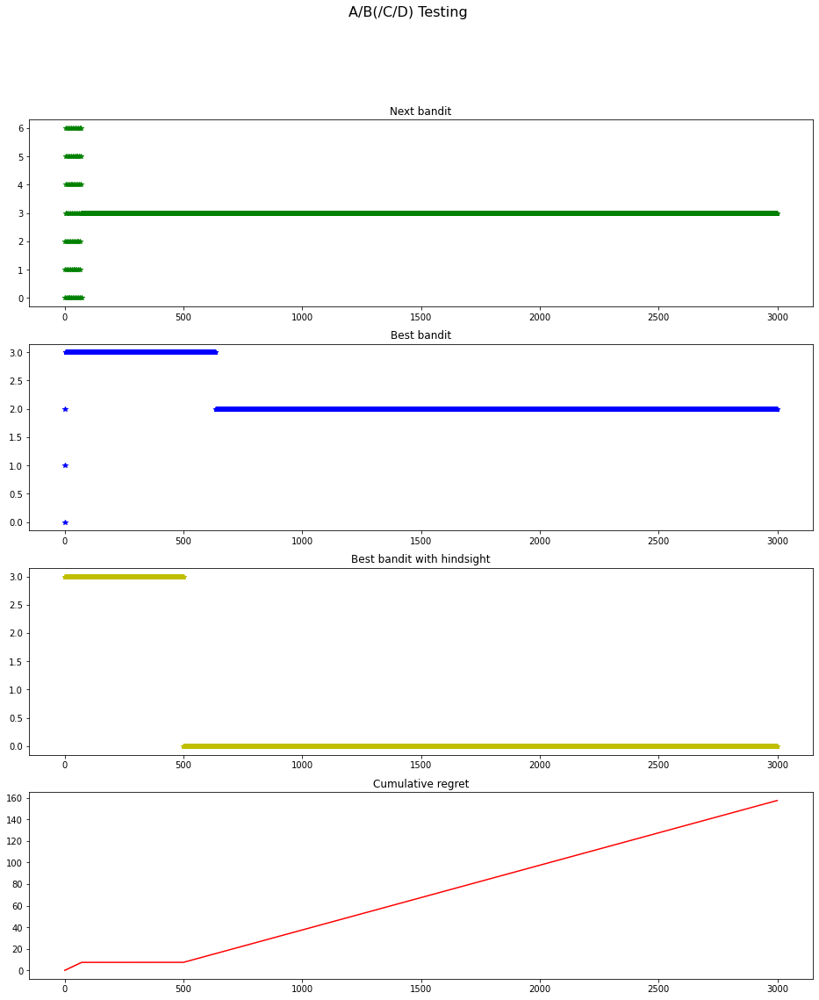

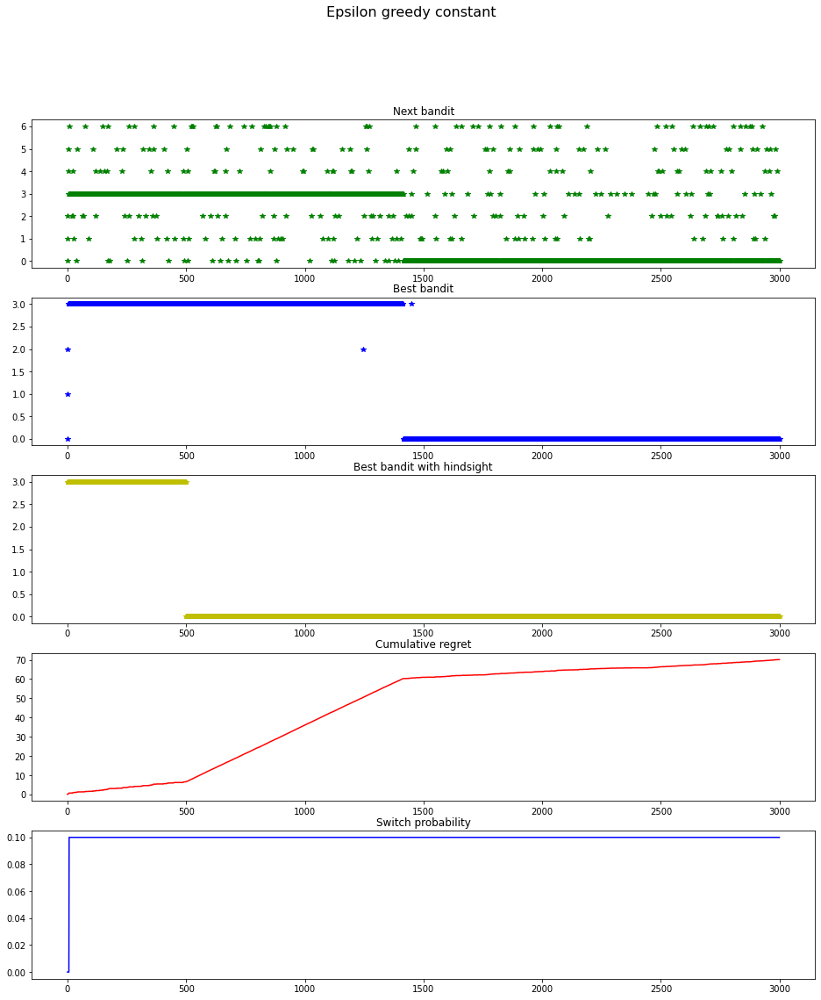

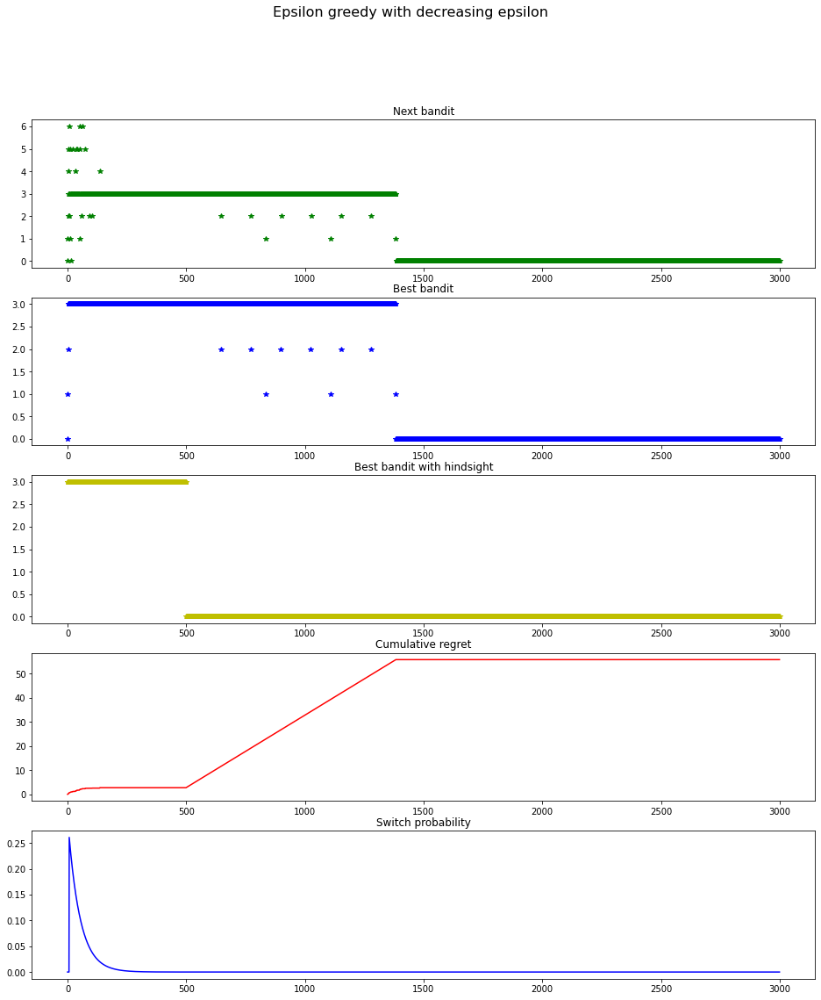

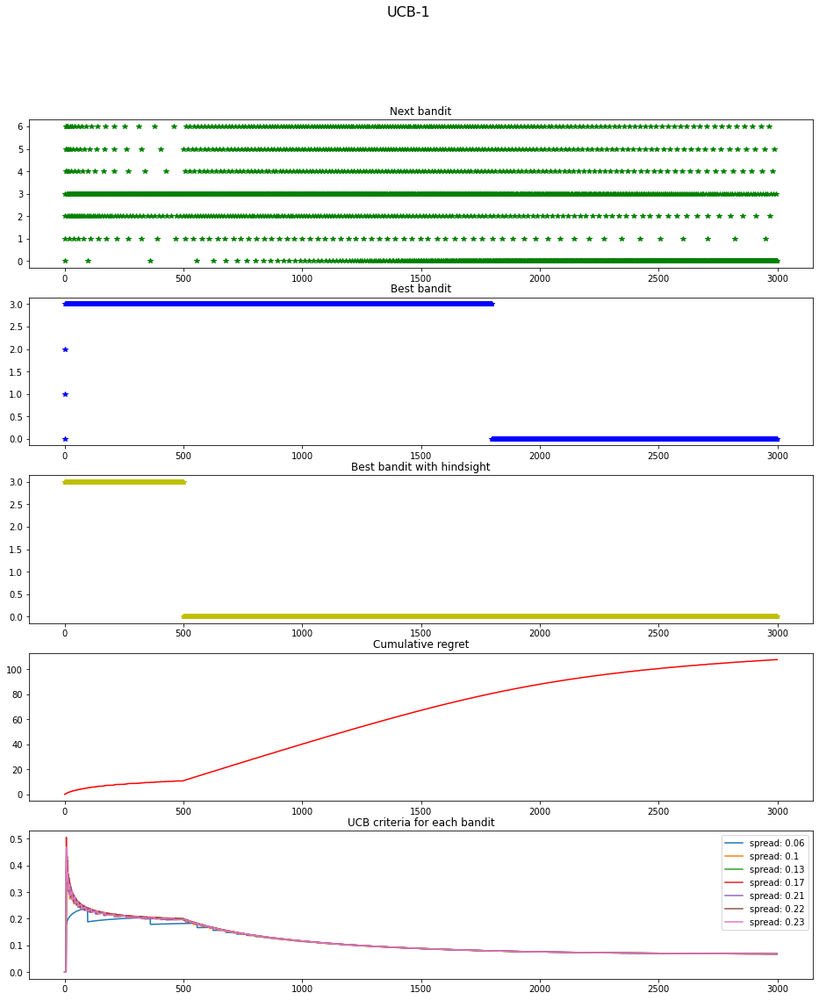

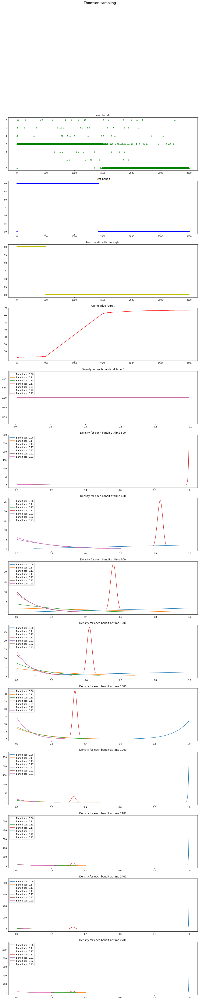

In [214]:
plot_stories(benchworks)

## Adding noise to the competition quotes

In [215]:
# start wide (.2) then becomes aggressive after 1000
CBC = BankQuote(mu = lambda t: 0.2 if t < 500 else 0.07, var = lambda t: 0.03)

In [216]:
bnpp_bid = BNPPbid(0.000001, competitors=[CBC])

In [217]:
benchworks = setup_benchworks(bid_bnpp=bnpp_bid, spreads_bandit=spreads_bandit, time_horizon=3000)

Spreads bandit: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time testing: 70
Time total: 3000


In [218]:
run_benchworks(benchworks)

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9034019152878835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6236722070556089
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5736794866722859
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9325954630371636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.56103021925571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13645522566068502
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1954294811093188
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8289808995501787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6692328934531846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06653648135411494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16540611484625978
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20351032104794942
epsilon-gr

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9904061968899467
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3560164860311865
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7580616581331086
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8905522863783111
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08377495384546052
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6428606425466126
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6435771978996101
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2010827273490715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8544384803729621
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9206832530635581
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6609613294538342
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.840513900032506
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06850407381195889
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.814806804263285
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3345871452527489
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.420112790

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.37853705920495784
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7012210862699587
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.996218932176633
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9242781300631541
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3031613853492673
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35720918914780164
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2829236689044369
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5762952691671006
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8457945986780431
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.895458560968348
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8041512868937258
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32015086907771717
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8237305773321081
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.020501196351477513
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16847697164644715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.74078

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28281384711679003
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17225514293500632
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6818012243497787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11895713668751362
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2559363925597222
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39333741480754403
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13454105805046412
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7432302916626486
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3066362475978549
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32434776976037827
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6198151560720193
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.881072015773222
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33021032702280306
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5378963514703148
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.746774358424378
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3692

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9675331458150631
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18925849525749971
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.987790853375543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48461529180614527
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3458861120007215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5486974193750223
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05862732342942567
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8377965998172092
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6705308529900654
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8443352500831156
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9574640379521862
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9180777884851582
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22094638316433235
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7037864359453778
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.888961649120884
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3683035

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.46147295642693253
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8637848349801992
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4445073157502365
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5489479298256053
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35601993515537556
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21944822972831146
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6261848161957219
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21966395644313008
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.011383303335592676
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2576948468724901
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12709998136004674
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8283803856495413
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.661420006676521
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6005214714098324
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.10252004455322727
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.40

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.729862527978436
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7527454646083972
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7921895099029174
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5787214664198835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14031309144858373
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2804838782913722
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11331284645534567
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2330249870398936
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5585877438073292
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7237602275423702
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.011747019012012694
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7467208530821723
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5497604473753912
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06536027229118624
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9201892575008702
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29445

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6156757451961246
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7335616118137862
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6584547618504831
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8263461298590626
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5003927156903696
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9165246341515456
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11372310463696012
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2657390021387015
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7555503151720289
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14911408469467524
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2548414648653653
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48403491377248853
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.516851982336837
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4401072796287715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8268506674976318
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7822770

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14456773347628527
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8686302181722676
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05822771717915909
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6871970407966277
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6743167626052512
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31932909224415384
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6321772632817187
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18735970238788757
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18530912486106166
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4632368815289739
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6177758606525792
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24239373777179363
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8460252664939187
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.42281544604290533
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13507476905658677
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8909133695841571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31439595203236315
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.041680693226723076
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.41708985257390885
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6451390188958609
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16001437820519193
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4869216375265142
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.020128272392334945
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7285824687693969
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23001599926196792
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31348098135336666
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9243957967244972
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8208826157994542
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7599851187128834
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5960364635827604
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.562242632658667
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.27669475554198597
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34587588082982834
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6910876350058893
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04570043602783436
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8103941281539556
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.38751278888887086
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13601939183106626
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7843275949876539
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2949340354634086
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13537507964887596
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1679603776653681
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25065946761545677
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23421652644074764
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6164031022814559
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.27

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6889786586301939
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8882223432204381
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7869756239879536
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4342771683216221
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1148628181814384
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7230137425339719
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8633299588036146
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6958268455648894
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47338998375215846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07570971716537389
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20900985948525963
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1950397707852105
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9284582706857849
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28011412347826226
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25212457028628266
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6106

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11957173974564017
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7375584246329334
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8156812396165454
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06836208541866984
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8509750481649625
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8765030433677108
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4025516305463607
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4407872076673943
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34467125210486016
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6190406849087384
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6965514481734723
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.68817278488174
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2070478119300071
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5440974863121908
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14476846362175988
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4547726

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.734909140949324
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35176975964439483
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5554604922689242
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6197014723618363
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17407140726946813
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9207129321614164
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.54699491618558
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.02968833872184351
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.15076577814900338
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.348989043408942
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22004196056193748
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14371702142638754
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9849420551599296
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7049633442253508
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9781432470670612
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9648204

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7411675413663409
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8410425781012368
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5244421793376314
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7657981474953697
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1255646755643257
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.44918845625574866
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8482845854009755
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.602121036388619
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7392151724318352
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.758496030975613
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0723373771903133
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.26979399664730697
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7062131669224804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04881451956052707
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47236524666650137
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3392849

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7630766787420706
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5908228582286642
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4302871375611871
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.10101534983157467
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8456595321169791
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6669756727476177
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21777046702573433
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5908849794077268
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3532875692164551
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8347349234854667
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3079131709075431
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.896714853280818
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28843940257042766
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.803370872496517
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21845687798193214
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9189275

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3943305632037779
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4761268868167998
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.518228853923471
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5090307456272983
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22833001704166156
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8834800913398436
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11533484053537046
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9988720666018024
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4812221848148439
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2543903122520945
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.047234501423917274
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5204735416930784
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7888901905728191
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5132669094865985
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33277799182925905
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.71741

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.869550878762115
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.43021826307796374
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3806436196054829
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.43833309871320836
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6604452808872373
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6309191669443636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5250800444069701
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5031254841990926
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8426361668512721
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7396199069185535
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8617022442109727
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31917461494724164
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7803744971741924
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.656800634359012
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9687265645328014
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.59229433

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4940894534020902
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5262574215044624
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6255891523450728
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6609208701396323
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11187251788973396
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7432999614536334
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5430131934295388
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9931495114005063
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4651846137042923
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.005660090814311958
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13215633227908763
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.023987994280900704
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31004135665212207
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.46270134705317
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2063526123029762
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5344

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24410791296219025
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.028785076560294165
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47702176426412857
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8569851171633583
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07126498635331069
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3609083514214565
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7607738155521199
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3621221953066278
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.673154363788467
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7501531442578416
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06633344449881717
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9399261567626571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5339634124443643
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.633305166814671
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7949397861940926
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33938

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.768675748706482
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06401993556836838
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5728073124633208
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8999038323861119
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12339749048446325
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8266664034942788
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5322039389634796
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1499365254140349
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9598723976886048
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5686762253987772
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7576280034491372
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06735059726013137
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22284056553900988
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5622437090061042
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17088636327597195
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.63707

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.056727659892582216
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.33825375697793225
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.795964496380567
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8945211621088991
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8845708961249571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6494957830745028
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4141137068544426
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8327754850276509
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3248333931017431
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.004848471239039642
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.969059940416483
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5542939017201096
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13955277237129926
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7505396853772004
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.44876178079806595
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2855

epsilon-greedy
epsilon: 0.04487058576679052
sample_uniform: 0.14360699787420927
epsilon-greedy
epsilon: 0.04398208863910504
sample_uniform: 0.21689148761179533
epsilon-greedy
epsilon: 0.04311118493331088
sample_uniform: 0.9934604630998499
epsilon-greedy
epsilon: 0.042257526276313497
sample_uniform: 0.48956496114516856
epsilon-greedy
epsilon: 0.04142077119326785
sample_uniform: 0.22012867402698122
epsilon-greedy
epsilon: 0.04060058497098381
sample_uniform: 0.07602387944210687
epsilon-greedy
epsilon: 0.03979663952403651
sample_uniform: 0.3259672073089859
epsilon-greedy
epsilon: 0.039008613263527774
sample_uniform: 0.21076450246870537
epsilon-greedy
epsilon: 0.03823619096844622
sample_uniform: 0.05231294643747675
epsilon-greedy
epsilon: 0.03747906365957472
sample_uniform: 0.015403519791920894
epsilon-greedy
epsilon: 0.03673692847589457
sample_uniform: 0.2893863028408883
epsilon-greedy
epsilon: 0.03600948855343702
sample_uniform: 0.3549619111374843
epsilon-greedy
epsilon: 0.035296452906533

epsilon-greedy
epsilon: 0.004682267375994849
sample_uniform: 0.10463591174495857
epsilon-greedy
epsilon: 0.004589552270017655
sample_uniform: 0.10275656387416432
epsilon-greedy
epsilon: 0.0044986730461433104
sample_uniform: 0.5177867238134145
epsilon-greedy
epsilon: 0.004409593351470535
sample_uniform: 0.25368580688768017
epsilon-greedy
epsilon: 0.004322277552933705
sample_uniform: 0.31464760677511183
epsilon-greedy
epsilon: 0.004236690723049189
sample_uniform: 0.8811683184289046
epsilon-greedy
epsilon: 0.00415279862594385
sample_uniform: 0.1924178904137388
epsilon-greedy
epsilon: 0.00407056770366028
sample_uniform: 0.9004489123860653
epsilon-greedy
epsilon: 0.00398996506273313
sample_uniform: 0.7339231362848766
epsilon-greedy
epsilon: 0.003910958461031321
sample_uniform: 0.5824398618892226
epsilon-greedy
epsilon: 0.003833516294860728
sample_uniform: 0.32084890160086454
epsilon-greedy
epsilon: 0.0037576075863223154
sample_uniform: 0.750124248068985
epsilon-greedy
epsilon: 0.00368320197

epsilon-greedy
epsilon: 0.0004789220041836742
sample_uniform: 0.9114351403237924
epsilon-greedy
epsilon: 0.00046943871311824997
sample_uniform: 0.4665434913737406
epsilon-greedy
epsilon: 0.0004601432037973389
sample_uniform: 0.1732442715081729
epsilon-greedy
epsilon: 0.0004510317578932717
sample_uniform: 0.6315937651309106
epsilon-greedy
epsilon: 0.0004421007307061988
sample_uniform: 0.2386502029289299
epsilon-greedy
epsilon: 0.00043334654970616295
sample_uniform: 0.5654555965905419
epsilon-greedy
epsilon: 0.00042476571310404095
sample_uniform: 0.7825809780445985
epsilon-greedy
epsilon: 0.00041635478845077864
sample_uniform: 0.9977623655688204
epsilon-greedy
epsilon: 0.00040811041126436815
sample_uniform: 0.00673470699420331
epsilon-greedy
epsilon: 0.0004000292836840078
sample_uniform: 0.4274920945605305
epsilon-greedy
epsilon: 0.00039210817315091625
sample_uniform: 0.412392608220297
epsilon-greedy
epsilon: 0.00038434391111526336
sample_uniform: 0.7656861187707539
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 5.098532027970825e-05
sample_uniform: 0.4007584714887198
epsilon-greedy
epsilon: 4.997574329629006e-05
sample_uniform: 0.6518210713262587
epsilon-greedy
epsilon: 4.898615727654242e-05
sample_uniform: 0.54300156482881
epsilon-greedy
epsilon: 4.801616637286295e-05
sample_uniform: 0.4054128659393603
epsilon-greedy
epsilon: 4.7065382575956725e-05
sample_uniform: 0.12349501608552904
epsilon-greedy
epsilon: 4.613342555962768e-05
sample_uniform: 0.9912121035805693
epsilon-greedy
epsilon: 4.521992252864295e-05
sample_uniform: 0.6373774400433303
epsilon-greedy
epsilon: 4.432450806961009e-05
sample_uniform: 0.49234451053532624
epsilon-greedy
epsilon: 4.34468240048064e-05
sample_uniform: 0.030486276185596628
epsilon-greedy
epsilon: 4.2586519248903344e-05
sample_uniform: 0.2777370697700209
epsilon-greedy
epsilon: 4.1743249668527595e-05
sample_uniform: 0.25232493400245926
epsilon-greedy
epsilon: 4.0916677944603416e-05
sample_uniform: 0.19558328224987354
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 5.427820942274927e-06
sample_uniform: 0.43401628546845816
epsilon-greedy
epsilon: 5.320342886564508e-06
sample_uniform: 0.7505904110774281
epsilon-greedy
epsilon: 5.2149930389475575e-06
sample_uniform: 0.8228905834822886
epsilon-greedy
epsilon: 5.111729258080362e-06
sample_uniform: 0.669916719851435
epsilon-greedy
epsilon: 5.010510237073697e-06
sample_uniform: 0.6979497206785618
epsilon-greedy
epsilon: 4.911295486969557e-06
sample_uniform: 0.3590313502569825
epsilon-greedy
epsilon: 4.814045320545016e-06
sample_uniform: 0.9647965567706357
epsilon-greedy
epsilon: 4.718720836436812e-06
sample_uniform: 0.8977391897292477
epsilon-greedy
epsilon: 4.625283903580308e-06
sample_uniform: 0.813457486310385
epsilon-greedy
epsilon: 4.53369714595651e-06
sample_uniform: 0.44074225810941403
epsilon-greedy
epsilon: 4.4439239276411955e-06
sample_uniform: 0.443103108613214
epsilon-greedy
epsilon: 4.355928338150039e-06
sample_uniform: 0.6733683325343512
epsilon-greedy
epsilon: 4.26

epsilon-greedy
epsilon: 5.551803592745724e-07
sample_uniform: 0.8845919403299062
epsilon-greedy
epsilon: 5.441870516069029e-07
sample_uniform: 0.20904818743817422
epsilon-greedy
epsilon: 5.334114260158012e-07
sample_uniform: 0.595965643122396
epsilon-greedy
epsilon: 5.22849172107353e-07
sample_uniform: 0.3544976255952339
epsilon-greedy
epsilon: 5.12496064839163e-07
sample_uniform: 0.12859416067721263
epsilon-greedy
epsilon: 5.023479628302798e-07
sample_uniform: 0.807297937164412
epsilon-greedy
epsilon: 4.924008067045917e-07
sample_uniform: 0.009503786013218551
epsilon-greedy
epsilon: 4.826506174670171e-07
sample_uniform: 0.46938067575200315
epsilon-greedy
epsilon: 4.7309349491185657e-07
sample_uniform: 0.599352281529311
epsilon-greedy
epsilon: 4.637256160626573e-07
sample_uniform: 0.25163100355927226
epsilon-greedy
epsilon: 4.545432336429747e-07
sample_uniform: 0.17348737919623625
epsilon-greedy
epsilon: 4.455426745774065e-07
sample_uniform: 0.20942087626406658
epsilon-greedy
epsilon: 

epsilon-greedy
epsilon: 5.910367070910721e-08
sample_uniform: 0.6322917161742105
epsilon-greedy
epsilon: 5.793333961662614e-08
sample_uniform: 0.6542826683517684
epsilon-greedy
epsilon: 5.6786182632446654e-08
sample_uniform: 0.08267884225462441
epsilon-greedy
epsilon: 5.5661740878479345e-08
sample_uniform: 0.4601439312376284
epsilon-greedy
epsilon: 5.455956456302987e-08
sample_uniform: 0.06243118298266215
epsilon-greedy
epsilon: 5.3479212800876157e-08
sample_uniform: 0.587895929137139
epsilon-greedy
epsilon: 5.242025343690838e-08
sample_uniform: 0.8027078235403018
epsilon-greedy
epsilon: 5.13822628732615e-08
sample_uniform: 0.17356085019448353
epsilon-greedy
epsilon: 5.036482589986989e-08
sample_uniform: 0.502333105638994
epsilon-greedy
epsilon: 4.93675355283782e-08
sample_uniform: 0.7623540929688339
epsilon-greedy
epsilon: 4.838999282934036e-08
sample_uniform: 0.17505048669094747
epsilon-greedy
epsilon: 4.7431806772642836e-08
sample_uniform: 0.2910826897189972
epsilon-greedy
epsilon: 

epsilon-greedy
epsilon: 6.292088387015405e-09
sample_uniform: 0.5726814884474128
epsilon-greedy
epsilon: 6.167496689281345e-09
sample_uniform: 0.502292423265572
epsilon-greedy
epsilon: 6.045372072457383e-09
sample_uniform: 0.6942923299437064
epsilon-greedy
epsilon: 5.9256656850684384e-09
sample_uniform: 0.5086775098412045
epsilon-greedy
epsilon: 5.808329642963431e-09
sample_uniform: 0.5576153806095775
epsilon-greedy
epsilon: 5.693317010161057e-09
sample_uniform: 0.5175287968566142
epsilon-greedy
epsilon: 5.580581780074653e-09
sample_uniform: 0.8640916810566112
epsilon-greedy
epsilon: 5.470078857109028e-09
sample_uniform: 0.28470968047189427
epsilon-greedy
epsilon: 5.361764038621604e-09
sample_uniform: 0.12608120803863931
epsilon-greedy
epsilon: 5.255593997240768e-09
sample_uniform: 0.6724265501299957
epsilon-greedy
epsilon: 5.151526263534351e-09
sample_uniform: 0.7405214807719801
epsilon-greedy
epsilon: 5.049519209021278e-09
sample_uniform: 0.9871764407491251
epsilon-greedy
epsilon: 4.

epsilon-greedy
epsilon: 6.56582473304884e-10
sample_uniform: 0.3233884400328586
epsilon-greedy
epsilon: 6.435812692499157e-10
sample_uniform: 0.13051574673395383
epsilon-greedy
epsilon: 6.308375062838453e-10
sample_uniform: 0.5237449532598172
epsilon-greedy
epsilon: 6.183460867315673e-10
sample_uniform: 0.8984612779316369
epsilon-greedy
epsilon: 6.061020138587064e-10
sample_uniform: 0.6087199713620096
epsilon-greedy
epsilon: 5.941003898728569e-10
sample_uniform: 0.4958543106481438
epsilon-greedy
epsilon: 5.823364139644006e-10
sample_uniform: 0.5074602582835304
epsilon-greedy
epsilon: 5.708053803861192e-10
sample_uniform: 0.7194519874718599
epsilon-greedy
epsilon: 5.5950267657083e-10
sample_uniform: 0.28605499600595397
epsilon-greedy
epsilon: 5.484237812863065e-10
sample_uniform: 0.7049307567282705
epsilon-greedy
epsilon: 5.37564262826712e-10
sample_uniform: 0.9637475283048125
epsilon-greedy
epsilon: 5.269197772398673e-10
sample_uniform: 0.8655821898741497
epsilon-greedy
epsilon: 5.1648

epsilon-greedy
epsilon: 7.57204532053562e-11
sample_uniform: 0.7015382209290218
epsilon-greedy
epsilon: 7.422108777407642e-11
sample_uniform: 0.5650912537708749
epsilon-greedy
epsilon: 7.275141176753398e-11
sample_uniform: 0.8264721043333668
epsilon-greedy
epsilon: 7.13108372957303e-11
sample_uniform: 0.600346053012222
epsilon-greedy
epsilon: 6.989878810966875e-11
sample_uniform: 0.7781002948479674
epsilon-greedy
epsilon: 6.851469937084735e-11
sample_uniform: 0.4848136012848545
epsilon-greedy
epsilon: 6.715801742531578e-11
sample_uniform: 0.5256134723415853
epsilon-greedy
epsilon: 6.58281995822065e-11
sample_uniform: 0.961205413807635
epsilon-greedy
epsilon: 6.452471389665092e-11
sample_uniform: 0.10029280267471985
epsilon-greedy
epsilon: 6.324703895699522e-11
sample_uniform: 0.45531447314047
epsilon-greedy
epsilon: 6.199466367622741e-11
sample_uniform: 0.4805790315810633
epsilon-greedy
epsilon: 6.076708708753663e-11
sample_uniform: 0.7214709812160267
epsilon-greedy
epsilon: 5.95638181

epsilon-greedy
epsilon: 8.908878035414187e-12
sample_uniform: 0.1382378154515449
epsilon-greedy
epsilon: 8.732470430964651e-12
sample_uniform: 0.1937654369161761
epsilon-greedy
epsilon: 8.559555931122026e-12
sample_uniform: 0.863535824905953
epsilon-greedy
epsilon: 8.39006536778078e-12
sample_uniform: 0.4606805540946851
epsilon-greedy
epsilon: 8.22393094245568e-12
sample_uniform: 0.5043555442373993
epsilon-greedy
epsilon: 8.061086199161434e-12
sample_uniform: 0.004401337481455547
epsilon-greedy
epsilon: 7.901465997829436e-12
sample_uniform: 0.26358890597187346
epsilon-greedy
epsilon: 7.745006488250853e-12
sample_uniform: 0.7199841985055815
epsilon-greedy
epsilon: 7.591645084535701e-12
sample_uniform: 0.010478779319737952
epsilon-greedy
epsilon: 7.441320440077622e-12
sample_uniform: 0.5065003860710185
epsilon-greedy
epsilon: 7.293972423014529e-12
sample_uniform: 0.7539857129205572
epsilon-greedy
epsilon: 7.1495420921749036e-12
sample_uniform: 0.03393025796306681
epsilon-greedy
epsilon: 

epsilon-greedy
epsilon: 9.484258313473687e-13
sample_uniform: 0.3645312686232923
epsilon-greedy
epsilon: 9.296457416165477e-13
sample_uniform: 0.1773954403046717
epsilon-greedy
epsilon: 9.11237522577815e-13
sample_uniform: 0.5635132368822591
epsilon-greedy
epsilon: 8.931938106981091e-13
sample_uniform: 0.9012774784921469
epsilon-greedy
epsilon: 8.75507388252092e-13
sample_uniform: 0.1542641208761414
epsilon-greedy
epsilon: 8.581711804349633e-13
sample_uniform: 0.620909800369424
epsilon-greedy
epsilon: 8.411782525324406e-13
sample_uniform: 0.5860486508417985
epsilon-greedy
epsilon: 8.245218071467934e-13
sample_uniform: 0.9449943662316748
epsilon-greedy
epsilon: 8.081951814777756e-13
sample_uniform: 0.9919742389328342
epsilon-greedy
epsilon: 7.921918446574283e-13
sample_uniform: 0.758766559143452
epsilon-greedy
epsilon: 7.765053951376427e-13
sample_uniform: 0.0747112798800289
epsilon-greedy
epsilon: 7.611295581294555e-13
sample_uniform: 0.6731622911897392
epsilon-greedy
epsilon: 7.460581

epsilon-greedy
epsilon: 1.0300768432920772e-13
sample_uniform: 0.6775085158941866
epsilon-greedy
epsilon: 1.009679955198905e-13
sample_uniform: 0.3847098484335366
epsilon-greedy
epsilon: 9.896869525503913e-14
sample_uniform: 0.8833105345922954
epsilon-greedy
epsilon: 9.700898378788962e-14
sample_uniform: 0.39533613212520524
epsilon-greedy
epsilon: 9.508807720772598e-14
sample_uniform: 0.5912094516281197
epsilon-greedy
epsilon: 9.320520712630336e-14
sample_uniform: 0.7686237155128246
epsilon-greedy
epsilon: 9.135962037048392e-14
sample_uniform: 0.06560749284957101
epsilon-greedy
epsilon: 8.95505786809572e-14
sample_uniform: 0.38683458924086556
epsilon-greedy
epsilon: 8.77773584169265e-14
sample_uniform: 0.2776372358414977
epsilon-greedy
epsilon: 8.603925026664293e-14
sample_uniform: 0.806885356385054
epsilon-greedy
epsilon: 8.433555896367133e-14
sample_uniform: 0.8077307948662809
epsilon-greedy
epsilon: 8.266560300877402e-14
sample_uniform: 0.19755841953576547
epsilon-greedy
epsilon: 8.

epsilon-greedy
epsilon: 1.286877186133249e-14
sample_uniform: 0.01242334244073573
epsilon-greedy
epsilon: 1.2613953105565416e-14
sample_uniform: 0.02774198982040954
epsilon-greedy
epsilon: 1.2364180099228854e-14
sample_uniform: 0.5165501731880197
epsilon-greedy
epsilon: 1.2119352929789913e-14
sample_uniform: 0.5766094687080093
epsilon-greedy
epsilon: 1.1879373663116417e-14
sample_uniform: 0.5646648187367553
epsilon-greedy
epsilon: 1.1644146304301925e-14
sample_uniform: 0.32325887148524823
epsilon-greedy
epsilon: 1.141357675926651e-14
sample_uniform: 0.40774717093443047
epsilon-greedy
epsilon: 1.1187572797117812e-14
sample_uniform: 0.3640869746706169
epsilon-greedy
epsilon: 1.0966044013257631e-14
sample_uniform: 0.7134217948378516
epsilon-greedy
epsilon: 1.0748901793218621e-14
sample_uniform: 0.5830678973117582
epsilon-greedy
epsilon: 1.05360592772175e-14
sample_uniform: 0.12435571366873199
epsilon-greedy
epsilon: 1.032743132540993e-14
sample_uniform: 0.30545943758935257
epsilon-greedy


epsilon-greedy
epsilon: 1.425900566479976e-15
sample_uniform: 0.3099608807718096
epsilon-greedy
epsilon: 1.3976658435310194e-15
sample_uniform: 0.13312397457688663
epsilon-greedy
epsilon: 1.3699902055552677e-15
sample_uniform: 0.862902951916241
epsilon-greedy
epsilon: 1.3428625819285279e-15
sample_uniform: 0.6343501244936851
epsilon-greedy
epsilon: 1.3162721212396227e-15
sample_uniform: 0.12312335999131596
epsilon-greedy
epsilon: 1.290208186949752e-15
sample_uniform: 0.9368434138839069
epsilon-greedy
epsilon: 1.264660353137657e-15
sample_uniform: 0.34967148440861273
epsilon-greedy
epsilon: 1.239618400329189e-15
sample_uniform: 0.7237719603153364
epsilon-greedy
epsilon: 1.2150723114093097e-15
sample_uniform: 0.8272563226616693
epsilon-greedy
epsilon: 1.1910122676151828e-15
sample_uniform: 0.5235045155575628
epsilon-greedy
epsilon: 1.1674286446084686e-15
sample_uniform: 0.8861379992269816
epsilon-greedy
epsilon: 1.1443120086255208e-15
sample_uniform: 0.3954852745114503
epsilon-greedy
eps

epsilon-greedy
epsilon: 1.5799428627662196e-16
sample_uniform: 0.45980341827203286
epsilon-greedy
epsilon: 1.5486578979839204e-16
sample_uniform: 0.16820717595930046
epsilon-greedy
epsilon: 1.5179924170098733e-16
sample_uniform: 0.6472314847807218
epsilon-greedy
epsilon: 1.487934153242788e-16
sample_uniform: 0.6104339633909711
epsilon-greedy
epsilon: 1.458471082976397e-16
sample_uniform: 0.19459008547742618
epsilon-greedy
epsilon: 1.4295914205897263e-16
sample_uniform: 0.6326541970435688
epsilon-greedy
epsilon: 1.401283613832775e-16
sample_uniform: 0.4102638273095591
epsilon-greedy
epsilon: 1.3735363392053774e-16
sample_uniform: 0.004060192513985372
epsilon-greedy
epsilon: 1.346338497427724e-16
sample_uniform: 0.7610347517616907
epsilon-greedy
epsilon: 1.3196792090004709e-16
sample_uniform: 0.054888439328541816
epsilon-greedy
epsilon: 1.2935478098527657e-16
sample_uniform: 0.13203761062000707
epsilon-greedy
epsilon: 1.267933847076545e-16
sample_uniform: 0.18053503046574326
epsilon-gree

epsilon-greedy
epsilon: 1.858879295021399e-17
sample_uniform: 0.5714647678189053
epsilon-greedy
epsilon: 1.822071018817366e-17
sample_uniform: 0.8755557566525717
epsilon-greedy
epsilon: 1.7859915953154774e-17
sample_uniform: 0.5428083783751296
epsilon-greedy
epsilon: 1.750626592265241e-17
sample_uniform: 0.32070607054022715
epsilon-greedy
epsilon: 1.7159618631939218e-17
sample_uniform: 0.7264595626662824
epsilon-greedy
epsilon: 1.681983541747665e-17
sample_uniform: 0.5900253912217196
epsilon-greedy
epsilon: 1.648678036144865e-17
sample_uniform: 0.9491456876934321
epsilon-greedy
epsilon: 1.6160320237391784e-17
sample_uniform: 0.326831272169544
epsilon-greedy
epsilon: 1.58403244569038e-17
sample_uniform: 0.9260035139420455
epsilon-greedy
epsilon: 1.5526665017405605e-17
sample_uniform: 0.7015184359634477
epsilon-greedy
epsilon: 1.5219216450939334e-17
sample_uniform: 0.3828816851884881
epsilon-greedy
epsilon: 1.491785577397914e-17
sample_uniform: 0.34121344476464865
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 2.3223018477857505e-18
sample_uniform: 0.8924244516556141
epsilon-greedy
epsilon: 2.276317190217412e-18
sample_uniform: 0.4084139282363979
epsilon-greedy
epsilon: 2.2312430898764767e-18
sample_uniform: 0.6894945196069091
epsilon-greedy
epsilon: 2.1870615165217815e-18
sample_uniform: 0.6763046803019839
epsilon-greedy
epsilon: 2.1437547969349188e-18
sample_uniform: 0.382613309758402
epsilon-greedy
epsilon: 2.1013056078505937e-18
sample_uniform: 0.7860151673973859
epsilon-greedy
epsilon: 2.0596969690271902e-18
sample_uniform: 0.673768664170794
epsilon-greedy
epsilon: 2.018912236454405e-18
sample_uniform: 0.7319699555016969
epsilon-greedy
epsilon: 1.978935095695376e-18
sample_uniform: 0.13782978211477537
epsilon-greedy
epsilon: 1.939749555360792e-18
sample_uniform: 0.14865107107279474
epsilon-greedy
epsilon: 1.901339940712011e-18
sample_uniform: 0.4395886454810687
epsilon-greedy
epsilon: 1.8636908873910654e-18
sample_uniform: 0.4593491996639584
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 2.787496726848875e-19
sample_uniform: 0.9128353901603269
epsilon-greedy
epsilon: 2.732300593504201e-19
sample_uniform: 0.21326500353497913
epsilon-greedy
epsilon: 2.6781974168280694e-19
sample_uniform: 0.70682964373251
epsilon-greedy
epsilon: 2.6251655548284632e-19
sample_uniform: 0.1671827960140333
epsilon-greedy
epsilon: 2.573183794053444e-19
sample_uniform: 0.7190009705859263
epsilon-greedy
epsilon: 2.5222313411056386e-19
sample_uniform: 0.03753604233384056
epsilon-greedy
epsilon: 2.4722878143244573e-19
sample_uniform: 0.8763247426793052
epsilon-greedy
epsilon: 2.4233332356333004e-19
sample_uniform: 0.5934428878503466
epsilon-greedy
epsilon: 2.3753480225479205e-19
sample_uniform: 0.08282654760278885
epsilon-greedy
epsilon: 2.328312980343289e-19
sample_uniform: 0.44911384578452673
epsilon-greedy
epsilon: 2.2822092943753985e-19
sample_uniform: 0.37449232912990293
epsilon-greedy
epsilon: 2.237018522555105e-19
sample_uniform: 0.890174330078955
epsilon-greedy
epsi

epsilon-greedy
epsilon: 3.1510289665824086e-20
sample_uniform: 0.3009233192015772
epsilon-greedy
epsilon: 3.0886344125952456e-20
sample_uniform: 0.9365931113732007
epsilon-greedy
epsilon: 3.0274753535554395e-20
sample_uniform: 0.5818898790808271
epsilon-greedy
epsilon: 2.9675273250239535e-20
sample_uniform: 0.8610441487599944
epsilon-greedy
epsilon: 2.908766346990015e-20
sample_uniform: 0.6942320282427341
epsilon-greedy
epsilon: 2.851168914278961e-20
sample_uniform: 0.5903185385923008
epsilon-greedy
epsilon: 2.794711987149691e-20
sample_uniform: 0.3660672900003564
epsilon-greedy
epsilon: 2.739372982078604e-20
sample_uniform: 0.5167621787420218
epsilon-greedy
epsilon: 2.6851297627258284e-20
sample_uniform: 0.2689231672694926
epsilon-greedy
epsilon: 2.6319606310803313e-20
sample_uniform: 0.4708267350671279
epsilon-greedy
epsilon: 2.5798443187805614e-20
sample_uniform: 0.2906372135990857
epsilon-greedy
epsilon: 2.528759978606668e-20
sample_uniform: 0.7787384167412696
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 3.354538310380676e-21
sample_uniform: 0.38861832001694085
epsilon-greedy
epsilon: 3.2881140013918125e-21
sample_uniform: 0.14939137650960665
epsilon-greedy
epsilon: 3.2230049818456338e-21
sample_uniform: 0.9159887018696627
epsilon-greedy
epsilon: 3.1591852072661435e-21
sample_uniform: 0.02297700599227781
epsilon-greedy
epsilon: 3.0966291488925913e-21
sample_uniform: 0.39494933623578177
epsilon-greedy
epsilon: 3.0353117834675567e-21
sample_uniform: 0.8934136391298513
epsilon-greedy
epsilon: 2.975208583227251e-21
sample_uniform: 0.7474627427414589
epsilon-greedy
epsilon: 2.916295506090234e-21
sample_uniform: 0.7574030873003353
epsilon-greedy
epsilon: 2.8585489860400913e-21
sample_uniform: 0.02813297750631194
epsilon-greedy
epsilon: 2.8019459236988792e-21
sample_uniform: 0.13029552072713468
epsilon-greedy
epsilon: 2.7464636770869034e-21
sample_uniform: 0.6792484855640031
epsilon-greedy
epsilon: 2.6920800525657862e-21
sample_uniform: 0.4640215993920903
epsilon-greed

epsilon-greedy
epsilon: 3.431162899741664e-22
sample_uniform: 0.6974683483166112
epsilon-greedy
epsilon: 3.3632213222261283e-22
sample_uniform: 0.04531038864100845
epsilon-greedy
epsilon: 3.2966250780830557e-22
sample_uniform: 0.198089016531384
epsilon-greedy
epsilon: 3.231347527926779e-22
sample_uniform: 0.49729520512857506
epsilon-greedy
epsilon: 3.167362559866905e-22
sample_uniform: 0.37644632385706966
epsilon-greedy
epsilon: 3.104644579063019e-22
sample_uniform: 0.6722882309674578
epsilon-greedy
epsilon: 3.0431684974865716e-22
sample_uniform: 0.7352204921969409
epsilon-greedy
epsilon: 2.982909723885261e-22
sample_uniform: 0.10575331685849476
epsilon-greedy
epsilon: 2.9238441539461437e-22
sample_uniform: 0.831791998713264
epsilon-greedy
epsilon: 2.865948160653734e-22
sample_uniform: 0.08086268503125205
epsilon-greedy
epsilon: 2.8091985848387167e-22
sample_uniform: 0.9529520546298673
epsilon-greedy
epsilon: 2.753572725914136e-22
sample_uniform: 0.7215578964821697
epsilon-greedy
epsil

epsilon-greedy
epsilon: 3.6527647058807705e-23
sample_uniform: 0.06658965195968325
epsilon-greedy
epsilon: 3.580435118606086e-23
sample_uniform: 0.024170033855356432
epsilon-greedy
epsilon: 3.5095377531185894e-23
sample_uniform: 0.15729312846262766
epsilon-greedy
epsilon: 3.4400442495268013e-23
sample_uniform: 0.8022191626231308
epsilon-greedy
epsilon: 3.3719268095027167e-23
sample_uniform: 0.4043190644442455
epsilon-greedy
epsilon: 3.305158185162033e-23
sample_uniform: 0.3539399047823889
epsilon-greedy
epsilon: 3.239711668164801e-23
sample_uniform: 0.8716661602049106
epsilon-greedy
epsilon: 3.1755610790315425e-23
sample_uniform: 0.8628593635555679
epsilon-greedy
epsilon: 3.112680756671299e-23
sample_uniform: 0.198395608035424
epsilon-greedy
epsilon: 3.051045548116665e-23
sample_uniform: 0.18118998419861787
epsilon-greedy
epsilon: 2.990630798462449e-23
sample_uniform: 0.9666904655214422
epsilon-greedy
epsilon: 2.9314123410032056e-23
sample_uniform: 0.027051860019376428
epsilon-greedy
e

epsilon-greedy
epsilon: 3.8886786743738735e-24
sample_uniform: 0.6348752385854416
epsilon-greedy
epsilon: 3.8116776775375584e-24
sample_uniform: 0.044248327143139754
epsilon-greedy
epsilon: 3.736201402595277e-24
sample_uniform: 0.09679808388726496
epsilon-greedy
epsilon: 3.6622196580307435e-24
sample_uniform: 0.07908719738885062
epsilon-greedy
epsilon: 3.589702850159643e-24
sample_uniform: 0.8875868312392411
epsilon-greedy
epsilon: 3.518621971291974e-24
sample_uniform: 0.22420484090062887
epsilon-greedy
epsilon: 3.448948588128382e-24
sample_uniform: 0.3738393590736363
epsilon-greedy
epsilon: 3.380654830386637e-24
sample_uniform: 0.007933463573927657
epsilon-greedy
epsilon: 3.313713379653068e-24
sample_uniform: 0.5939807524502704
epsilon-greedy
epsilon: 3.2480974584547716e-24
sample_uniform: 0.3420335323849283
epsilon-greedy
epsilon: 3.1837808195484233e-24
sample_uniform: 0.28541567691397407
epsilon-greedy
epsilon: 3.120737735420849e-24
sample_uniform: 0.33903488774441537
epsilon-greedy

epsilon-greedy
epsilon: 4.48462338800301e-25
sample_uniform: 0.04671277714271571
epsilon-greedy
epsilon: 4.395821895200983e-25
sample_uniform: 0.00014186558628126456
epsilon-greedy
epsilon: 4.308778789768808e-25
sample_uniform: 0.35844571557207805
epsilon-greedy
epsilon: 4.223459253303659e-25
sample_uniform: 0.8741513567848
epsilon-greedy
epsilon: 4.139829156853402e-25
sample_uniform: 0.7192028331488175
epsilon-greedy
epsilon: 4.0578550472643157e-25
sample_uniform: 0.11289155923013483
epsilon-greedy
epsilon: 3.9775041337996184e-25
sample_uniform: 0.38901282952543015
epsilon-greedy
epsilon: 3.898744275022509e-25
sample_uniform: 0.6474998203053542
epsilon-greedy
epsilon: 3.821543965939359e-25
sample_uniform: 0.46315302102230393
epsilon-greedy
epsilon: 3.7458723253972107e-25
sample_uniform: 0.10001053098730284
epsilon-greedy
epsilon: 3.671699083730825e-25
sample_uniform: 0.2283989111577044
epsilon-greedy
epsilon: 3.598994570654598e-25
sample_uniform: 0.4413517549434459
epsilon-greedy
epsi

epsilon-greedy
epsilon: 5.171897350315713e-26
sample_uniform: 0.4312380084055174
epsilon-greedy
epsilon: 5.069486921258205e-26
sample_uniform: 0.2843268997465036
epsilon-greedy
epsilon: 4.969104354563225e-26
sample_uniform: 0.6786469639892841
epsilon-greedy
epsilon: 4.870709495865713e-26
sample_uniform: 0.24137254974134192
epsilon-greedy
epsilon: 4.7742629859101715e-26
sample_uniform: 0.483213610720045
epsilon-greedy
epsilon: 4.679726244806717e-26
sample_uniform: 0.4844568304703285
epsilon-greedy
epsilon: 4.587061456598334e-26
sample_uniform: 0.45126954922519213
epsilon-greedy
epsilon: 4.4962315541342576e-26
sample_uniform: 0.3351140740228592
epsilon-greedy
epsilon: 4.407200204242356e-26
sample_uniform: 0.8035133662666539
epsilon-greedy
epsilon: 4.319931793195605e-26
sample_uniform: 0.2205320385933256
epsilon-greedy
epsilon: 4.234391412466021e-26
sample_uniform: 0.5121596279538382
epsilon-greedy
epsilon: 4.1505448447606984e-26
sample_uniform: 0.17945002991346726
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 6.0849877087615496e-27
sample_uniform: 0.02918770005593052
epsilon-greedy
epsilon: 5.9644968792159644e-27
sample_uniform: 0.8842648592653302
epsilon-greedy
epsilon: 5.846391927949753e-27
sample_uniform: 0.05881469358533853
epsilon-greedy
epsilon: 5.730625611407694e-27
sample_uniform: 0.6266944563335834
epsilon-greedy
epsilon: 5.617151621519518e-27
sample_uniform: 0.4504121156126849
epsilon-greedy
epsilon: 5.505924567176342e-27
sample_uniform: 0.9406978419230693
epsilon-greedy
epsilon: 5.396899956073305e-27
sample_uniform: 0.3202811810130092
epsilon-greedy
epsilon: 5.29003417691236e-27
sample_uniform: 0.4370491893767542
epsilon-greedy
epsilon: 5.1852844819568724e-27
sample_uniform: 0.7579277920393773
epsilon-greedy
epsilon: 5.082608969932217e-27
sample_uniform: 0.37784682230889044
epsilon-greedy
epsilon: 4.9819665692645924e-27
sample_uniform: 0.7284670130883995
epsilon-greedy
epsilon: 4.883317021651746e-27
sample_uniform: 0.3542144505839365
epsilon-greedy
epsilon

Thomson sampling.
pnl avg so far:[0.06  0.    0.13  0.136 0.07  0.    0.   ]
nb of selections so far: [ 1  0  3 10  6  3  1]
Wins:
[2. 1. 4. 9. 3. 1. 1.]
Losses:
[1. 1. 1. 3. 5. 4. 2.]
Thompson probas:
[0.66666667 0.5        0.8        0.75       0.375      0.2
 0.33333333]
Thompson samples:
[0.04326753 0.0754841  0.12100231 0.12191587 0.10804472 0.07390957
 0.15430936]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06  0.    0.13  0.136 0.07  0.    0.   ]
nb of selections so far: [ 1  0  3 10  6  3  2]
Wins:
[2. 1. 4. 9. 3. 1. 1.]
Losses:
[1. 1. 1. 3. 5. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.8        0.75       0.375      0.2
 0.25      ]
Thompson samples:
[0.04246079 0.09345693 0.09842742 0.11926782 0.10301759 0.02798795
 0.0858833 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13909091 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  3 11  6  3  2]
Wins:
[ 2.  1.  4. 10.  3.  1.  1.]
Losses:
[1. 1. 1. 3. 5. 4. 3.]
Thom

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15785714 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 28  6  3  3]
Wins:
[ 2.  1.  7. 27.  3.  1.  1.]
Losses:
[1. 1. 1. 3. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.875      0.9        0.375      0.2
 0.2       ]
Thompson samples:
[0.01766492 0.03840016 0.11506135 0.16371636 0.03146705 0.08929266
 0.13012797]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15827586 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 29  6  3  3]
Wins:
[ 2.  1.  7. 28.  3.  1.  1.]
Losses:
[1. 1. 1. 3. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.875      0.90322581 0.375      0.2
 0.2       ]
Thompson samples:
[0.04095285 0.0412104  0.12539066 0.15262391 0.08941831 0.06160365
 0.03459862]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15866667 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 30  6  3  3]
W

Thomson sampling.
pnl avg so far:[0.06  0.    0.13  0.153 0.07  0.    0.   ]
nb of selections so far: [ 1  0  6 50  6  3  3]
Wins:
[ 2.  1.  7. 46.  3.  1.  1.]
Losses:
[1. 1. 1. 6. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.875      0.88461538 0.375      0.2
 0.2       ]
Thompson samples:
[0.03228684 0.07832903 0.12536528 0.15574167 0.04161933 0.0105407
 0.05562241]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15333333 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 51  6  3  3]
Wins:
[ 2.  1.  7. 47.  3.  1.  1.]
Losses:
[1. 1. 1. 6. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.875      0.88679245 0.375      0.2
 0.2       ]
Thompson samples:
[0.02823609 0.05146571 0.11050139 0.1596169  0.05593256 0.06765175
 0.04283475]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15365385 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 52  6  3  3]
Wins:
[ 2.  1.  7. 48.  3.  1.

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15084507 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 71  6  3  3]
Wins:
[ 2.  1.  7. 64.  3.  1.  1.]
Losses:
[1. 1. 1. 9. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.875      0.87671233 0.375      0.2
 0.2       ]
Thompson samples:
[0.05745152 0.07588966 0.12566101 0.1439742  0.0439619  0.01010528
 0.00063713]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15111111 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 72  6  3  3]
Wins:
[ 2.  1.  7. 65.  3.  1.  1.]
Losses:
[1. 1. 1. 9. 5. 4. 4.]
Thompson probas:
[0.66666667 0.5        0.875      0.87837838 0.375      0.2
 0.2       ]
Thompson samples:
[0.03409097 0.02620285 0.11395326 0.14368746 0.04455895 0.0622483
 0.0530093 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15136986 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 73  6  3  3]
Wi

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14673684 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 95  6  3  3]
Wins:
[ 2.  1.  7. 83.  3.  1.  1.]
Losses:
[ 1.  1.  1. 14.  5.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.8556701  0.375      0.2
 0.2       ]
Thompson samples:
[0.04534985 0.08998585 0.12756036 0.15309545 0.04768316 0.04817508
 0.00402786]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14697917 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 96  6  3  3]
Wins:
[ 2.  1.  7. 84.  3.  1.  1.]
Losses:
[ 1.  1.  1. 14.  5.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.85714286 0.375      0.2
 0.2       ]
Thompson samples:
[0.05991298 0.05379285 0.12526465 0.14268571 0.08468681 0.01721952
 0.01645012]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14721649 0.07       0.
 0.        ]
nb of selections so far: [ 1  0  6 

 0.01635924]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15127119 0.06       0.
 0.        ]
nb of selections so far: [  1   0   6 118   7   3   3]
Wins:
[  2.   1.   7. 106.   3.   1.   1.]
Losses:
[ 1.  1.  1. 14.  6.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.88333333 0.33333333 0.2
 0.2       ]
Thompson samples:
[0.04206525 0.07547215 0.12732726 0.14744313 0.0745813  0.02835054
 0.06638279]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15142857 0.06       0.
 0.        ]
nb of selections so far: [  1   0   6 119   7   3   3]
Wins:
[  2.   1.   7. 107.   3.   1.   1.]
Losses:
[ 1.  1.  1. 14.  6.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.88429752 0.33333333 0.2
 0.2       ]
Thompson samples:
[0.02382148 0.01787448 0.11909813 0.1515868  0.0546985  0.04777322
 0.04360762]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15158333 0.06  

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15178571 0.06       0.
 0.        ]
nb of selections so far: [  1   0   6 140   7   3   3]
Wins:
[  2.   1.   7. 126.   3.   1.   1.]
Losses:
[ 1.  1.  1. 16.  6.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.88732394 0.33333333 0.2
 0.2       ]
Thompson samples:
[0.04622795 0.05939463 0.12050298 0.15145246 0.03016679 0.00205204
 0.07222366]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15191489 0.06       0.
 0.        ]
nb of selections so far: [  1   0   6 141   7   3   3]
Wins:
[  2.   1.   7. 127.   3.   1.   1.]
Losses:
[ 1.  1.  1. 16.  6.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.88811189 0.33333333 0.2
 0.2       ]
Thompson samples:
[0.05904648 0.05901455 0.10605328 0.1459182  0.03779586 0.02815225
 0.03130371]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15204225 0.06       0.
 0.        ]
nb of s

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14993789 0.06       0.
 0.        ]
nb of selections so far: [  1   0   6 161   7   3   3]
Wins:
[  2.   1.   7. 143.   3.   1.   1.]
Losses:
[ 1.  1.  1. 20.  6.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.87730061 0.33333333 0.2
 0.2       ]
Thompson samples:
[0.04516087 0.02156655 0.12173152 0.14046866 0.12105397 0.00231749
 0.0453842 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15006173 0.06       0.
 0.        ]
nb of selections so far: [  1   0   6 162   7   3   3]
Wins:
[  2.   1.   7. 144.   3.   1.   1.]
Losses:
[ 1.  1.  1. 20.  6.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.87804878 0.33333333 0.2
 0.2       ]
Thompson samples:
[0.05431205 0.05863555 0.12744927 0.14723181 0.08793569 0.02863395
 0.02496783]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.15018405 0.06       0.
 0.        ]
nb of s

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14956284 0.0525     0.
 0.        ]
nb of selections so far: [  1   0   6 183   8   3   3]
Wins:
[  2.   1.   7. 162.   3.   1.   1.]
Losses:
[ 1.  1.  1. 23.  7.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.87567568 0.3        0.2
 0.2       ]
Thompson samples:
[0.03046076 0.01631045 0.11683572 0.14812404 0.08308614 0.12352719
 0.05917027]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14967391 0.0525     0.
 0.        ]
nb of selections so far: [  1   0   6 184   8   3   3]
Wins:
[  2.   1.   7. 163.   3.   1.   1.]
Losses:
[ 1.  1.  1. 23.  7.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.87634409 0.3        0.2
 0.2       ]
Thompson samples:
[0.03195107 0.03426858 0.12860486 0.13653664 0.08434876 0.00126832
 0.10608484]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14978378 0.0525     0.
 0.        ]
nb of s

Thomson sampling.
pnl avg so far:[0.06      0.        0.13      0.1468932 0.0525    0.        0.       ]
nb of selections so far: [  1   0   6 206   8   3   3]
Wins:
[  2.   1.   7. 179.   3.   1.   1.]
Losses:
[ 1.  1.  1. 29.  7.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.86057692 0.3        0.2
 0.2       ]
Thompson samples:
[0.05933966 0.00999307 0.12222026 0.14913807 0.03225673 0.10373531
 0.0146392 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14700483 0.0525     0.
 0.        ]
nb of selections so far: [  1   0   6 207   8   3   3]
Wins:
[  2.   1.   7. 180.   3.   1.   1.]
Losses:
[ 1.  1.  1. 29.  7.  4.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.86124402 0.3        0.2
 0.2       ]
Thompson samples:
[0.04716403 0.04873135 0.10988178 0.1524727  0.03478997 0.01392258
 0.11219718]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14711538 0.0525     0.
 0.        ]
nb of s

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14678414 0.0525     0.
 0.        ]
nb of selections so far: [  1   0   6 227   8   4   3]
Wins:
[  2.   1.   7. 197.   3.   1.   1.]
Losses:
[ 1.  1.  1. 32.  7.  5.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.86026201 0.3        0.16666667
 0.2       ]
Thompson samples:
[0.0395031  0.07357428 0.10617152 0.14556806 0.02967819 0.00930048
 0.13164731]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14688596 0.0525     0.
 0.        ]
nb of selections so far: [  1   0   6 228   8   4   3]
Wins:
[  2.   1.   7. 198.   3.   1.   1.]
Losses:
[ 1.  1.  1. 32.  7.  5.  4.]
Thompson probas:
[0.66666667 0.5        0.875      0.86086957 0.3        0.16666667
 0.2       ]
Thompson samples:
[0.0567452  0.01805399 0.12313448 0.14705874 0.09098456 0.00396574
 0.03291213]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.13      0.1469869 0.0525    0.        0.  

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14581301 0.04666667 0.
 0.        ]
nb of selections so far: [  1   0   6 246   9   4   4]
Wins:
[  2.   1.   7. 212.   3.   1.   1.]
Losses:
[ 1.  1.  1. 36.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85483871 0.27272727 0.16666667
 0.16666667]
Thompson samples:
[0.04972201 0.0676025  0.09946027 0.14338784 0.0571869  0.05995663
 0.00848711]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14591093 0.04666667 0.
 0.        ]
nb of selections so far: [  1   0   6 247   9   4   4]
Wins:
[  2.   1.   7. 213.   3.   1.   1.]
Losses:
[ 1.  1.  1. 36.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85542169 0.27272727 0.16666667
 0.16666667]
Thompson samples:
[0.01794715 0.03332807 0.09409226 0.14793818 0.03796457 0.03091217
 0.03487359]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14600806 0.04666667 0.
 0.   

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14589552 0.04666667 0.
 0.        ]
nb of selections so far: [  1   0   6 268   9   4   4]
Wins:
[  2.   1.   7. 231.   3.   1.   1.]
Losses:
[ 1.  1.  1. 39.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85555556 0.27272727 0.16666667
 0.16666667]
Thompson samples:
[0.04631708 0.05885736 0.1091583  0.15450589 0.05584078 0.01397576
 0.02729195]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14598513 0.04666667 0.
 0.        ]
nb of selections so far: [  1   0   6 269   9   4   4]
Wins:
[  2.   1.   7. 232.   3.   1.   1.]
Losses:
[ 1.  1.  1. 39.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85608856 0.27272727 0.16666667
 0.16666667]
Thompson samples:
[0.03549222 0.09254978 0.12475927 0.14239614 0.08945168 0.03280359
 0.03441992]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14607407 0.04666667 0.
 0.   

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14596552 0.04666667 0.
 0.        ]
nb of selections so far: [  1   0   6 290   9   4   4]
Wins:
[  2.   1.   7. 250.   3.   1.   1.]
Losses:
[ 1.  1.  1. 42.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85616438 0.27272727 0.16666667
 0.16666667]
Thompson samples:
[0.04724753 0.04462079 0.08914709 0.14435804 0.09783965 0.02930598
 0.07564597]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14604811 0.04666667 0.
 0.        ]
nb of selections so far: [  1   0   6 291   9   4   4]
Wins:
[  2.   1.   7. 251.   3.   1.   1.]
Losses:
[ 1.  1.  1. 42.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85665529 0.27272727 0.16666667
 0.16666667]
Thompson samples:
[0.04691711 0.09786697 0.127061   0.1464907  0.09919546 0.02495748
 0.02769091]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14613014 0.04666667 0.
 0.   

 0.04937371]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14657051 0.04666667 0.044
 0.        ]
nb of selections so far: [  1   0   6 312   9   5   4]
Wins:
[  2.   1.   7. 270.   3.   2.   1.]
Losses:
[ 1.  1.  1. 44.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85987261 0.27272727 0.28571429
 0.16666667]
Thompson samples:
[0.03032622 0.06087007 0.10114353 0.14438789 0.08506607 0.09725661
 0.01910546]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14610224 0.04666667 0.044
 0.        ]
nb of selections so far: [  1   0   6 313   9   5   4]
Wins:
[  2.   1.   7. 270.   3.   2.   1.]
Losses:
[ 1.  1.  1. 45.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85714286 0.27272727 0.28571429
 0.16666667]
Thompson samples:
[0.03911371 0.09075899 0.10125438 0.14388897 0.01614481 0.04124377
 0.01077605]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13    

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14651652 0.04666667 0.044
 0.046     ]
nb of selections so far: [  1   0   6 333   9   5   5]
Wins:
[  2.   1.   7. 288.   3.   2.   2.]
Losses:
[ 1.  1.  1. 47.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85970149 0.27272727 0.28571429
 0.28571429]
Thompson samples:
[0.02036754 0.03727761 0.11637492 0.14789384 0.09965429 0.08505492
 0.12324704]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14607784 0.04666667 0.044
 0.046     ]
nb of selections so far: [  1   0   6 334   9   5   5]
Wins:
[  2.   1.   7. 288.   3.   2.   2.]
Losses:
[ 1.  1.  1. 48.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85714286 0.27272727 0.28571429
 0.28571429]
Thompson samples:
[0.04306942 0.09707893 0.12979044 0.14709329 0.05357816 0.06647579
 0.09899231]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14564179 0.04666667 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14421348 0.04666667 0.044
 0.046     ]
nb of selections so far: [  1   0   6 356   9   5   5]
Wins:
[  2.   1.   7. 303.   3.   2.   2.]
Losses:
[ 1.  1.  1. 55.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.84636872 0.27272727 0.28571429
 0.28571429]
Thompson samples:
[0.03430984 0.01726003 0.12246831 0.14562311 0.0321929  0.02287035
 0.06110024]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14428571 0.04666667 0.044
 0.046     ]
nb of selections so far: [  1   0   6 357   9   5   5]
Wins:
[  2.   1.   7. 304.   3.   2.   2.]
Losses:
[ 1.  1.  1. 55.  8.  5.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.84679666 0.27272727 0.28571429
 0.28571429]
Thompson samples:
[0.05015926 0.06262812 0.12360139 0.14756168 0.03448439 0.05689694
 0.16593423]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14428571 0.04666667 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14506667 0.04666667 0.03666667
 0.09857143]
nb of selections so far: [  1   0   6 375   9   6   7]
Wins:
[  2.   1.   7. 321.   3.   2.   4.]
Losses:
[ 1.  1.  1. 56.  8.  6.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85145889 0.27272727 0.25
 0.44444444]
Thompson samples:
[0.05618341 0.02957824 0.08751616 0.14051538 0.02573317 0.13725704
 0.15298317]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14506667 0.04666667 0.03666667
 0.115     ]
nb of selections so far: [  1   0   6 375   9   6   8]
Wins:
[  2.   1.   7. 321.   3.   2.   5.]
Losses:
[ 1.  1.  1. 56.  8.  6.  5.]
Thompson probas:
[0.66666667 0.5        0.875      0.85145889 0.27272727 0.25
 0.5       ]
Thompson samples:
[0.04461901 0.08496257 0.12169458 0.14545677 0.04622784 0.04450485
 0.09755553]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14513298 0.04666667 0.036

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14460759 0.04666667 0.03666667
 0.10222222]
nb of selections so far: [  1   0   6 395   9   6   9]
Wins:
[  2.   1.   7. 337.   3.   2.   5.]
Losses:
[ 1.  1.  1. 60.  8.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.875      0.8488665  0.27272727 0.25
 0.45454545]
Thompson samples:
[0.0575512  0.05136064 0.1054643  0.14448234 0.0302823  0.10277722
 0.06390947]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14467172 0.04666667 0.03666667
 0.10222222]
nb of selections so far: [  1   0   6 396   9   6   9]
Wins:
[  2.   1.   7. 338.   3.   2.   5.]
Losses:
[ 1.  1.  1. 60.  8.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.875      0.84924623 0.27272727 0.25
 0.45454545]
Thompson samples:
[0.04437303 0.04104258 0.11918571 0.1389336  0.09776515 0.03212116
 0.07931315]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.1443073  0.04666667 0.036

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14447942 0.04666667 0.03142857
 0.08846154]
nb of selections so far: [  1   0   6 413   9   7  13]
Wins:
[  2.   1.   7. 352.   3.   2.   6.]
Losses:
[ 1.  1.  1. 63.  8.  7.  9.]
Thompson probas:
[0.66666667 0.5        0.875      0.84819277 0.27272727 0.22222222
 0.4       ]
Thompson samples:
[0.02689836 0.02779061 0.12079756 0.14162526 0.06340785 0.01664644
 0.09941086]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14454106 0.04666667 0.03142857
 0.08846154]
nb of selections so far: [  1   0   6 414   9   7  13]
Wins:
[  2.   1.   7. 353.   3.   2.   6.]
Losses:
[ 1.  1.  1. 63.  8.  7.  9.]
Thompson probas:
[0.66666667 0.5        0.875      0.84855769 0.27272727 0.22222222
 0.4       ]
Thompson samples:
[0.04236568 0.06776558 0.11344061 0.14369492 0.07068793 0.06863576
 0.06561764]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14460241 0.04

 0.09332984]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14336406 0.04666667 0.03142857
 0.08214286]
nb of selections so far: [  1   0   6 434   9   7  14]
Wins:
[  2.   1.   7. 367.   3.   2.   6.]
Losses:
[ 1.  1.  1. 69.  8.  7. 10.]
Thompson probas:
[0.66666667 0.5        0.875      0.84174312 0.27272727 0.22222222
 0.375     ]
Thompson samples:
[0.04877426 0.0648905  0.11399469 0.14016951 0.06381749 0.02106505
 0.04322098]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14303448 0.04666667 0.03142857
 0.08214286]
nb of selections so far: [  1   0   6 435   9   7  14]
Wins:
[  2.   1.   7. 367.   3.   2.   6.]
Losses:
[ 1.  1.  1. 70.  8.  7. 10.]
Thompson probas:
[0.66666667 0.5        0.875      0.83981693 0.27272727 0.22222222
 0.375     ]
Thompson samples:
[0.05963242 0.04292607 0.12458189 0.14488085 0.10940185 0.02674007
 0.09130179]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14260486 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 453  10   8  15]
Wins:
[  2.   1.   7. 381.   4.   2.   6.]
Losses:
[ 1.  1.  1. 74.  8.  8. 11.]
Thompson probas:
[0.66666667 0.5        0.875      0.83736264 0.33333333 0.2
 0.35294118]
Thompson samples:
[0.05816932 0.06689334 0.12575376 0.14418461 0.09249422 0.04933404
 0.063203  ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.1426652  0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 454  10   8  15]
Wins:
[  2.   1.   7. 382.   4.   2.   6.]
Losses:
[ 1.  1.  1. 74.  8.  8. 11.]
Thompson probas:
[0.66666667 0.5        0.875      0.8377193  0.33333333 0.2
 0.35294118]
Thompson samples:
[0.0102316  0.04921695 0.08897754 0.14098563 0.01469059 0.02363506
 0.07442579]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.14272527 0.063      0.0275
 0.07666

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13850526 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 475  10   8  15]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[ 1.  1.  1. 89.  8.  8. 11.]
Thompson probas:
[0.66666667 0.5        0.875      0.81341719 0.33333333 0.2
 0.35294118]
Thompson samples:
[0.01392802 0.03993205 0.120315   0.13698715 0.0425891  0.03926062
 0.04859313]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13821429 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 476  10   8  15]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[ 1.  1.  1. 90.  8.  8. 11.]
Thompson probas:
[0.66666667 0.5        0.875      0.81171548 0.33333333 0.2
 0.35294118]
Thompson samples:
[0.04875596 0.09643995 0.11644857 0.13590208 0.05409538 0.04710478
 0.03305169]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13792453 0.063      0.0275
 0.07666

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13264113 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 496  10   8  15]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   1. 110.   8.   8.  11.]
Thompson probas:
[0.66666667 0.5        0.875      0.77911647 0.33333333 0.2
 0.35294118]
Thompson samples:
[0.04902751 0.09575296 0.10776059 0.13105083 0.06204026 0.04919666
 0.05826584]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13237425 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 497  10   8  15]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   1. 111.   8.   8.  11.]
Thompson probas:
[0.66666667 0.5        0.875      0.77755511 0.33333333 0.2
 0.35294118]
Thompson samples:
[0.05161691 0.030162   0.12180238 0.13820841 0.10095021 0.0644722
 0.11024236]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.13210843 0.063      0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.12651923 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 520  10   8  15]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   1. 134.   8.   8.  11.]
Thompson probas:
[0.66666667 0.5        0.875      0.74329502 0.33333333 0.2
 0.35294118]
Thompson samples:
[0.03349502 0.00216451 0.12020296 0.12703558 0.04598424 0.01117366
 0.09681752]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.12627639 0.063      0.0275
 0.07666667]
nb of selections so far: [  1   0   6 521  10   8  15]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   1. 135.   8.   8.  11.]
Thompson probas:
[0.66666667 0.5        0.875      0.7418738  0.33333333 0.2
 0.35294118]
Thompson samples:
[0.04609355 0.05491066 0.12849486 0.1299955  0.13098516 0.02142479
 0.07463433]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.13       0.12627639 0.05727273 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.0975     0.12251397 0.05727273 0.0275
 0.06764706]
nb of selections so far: [  1   0   8 537  11   8  17]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   3. 151.   9.   8.  13.]
Thompson probas:
[0.66666667 0.5        0.7        0.71985158 0.30769231 0.2
 0.31578947]
Thompson samples:
[0.04247711 0.06692151 0.11125528 0.120835   0.04445549 0.06926371
 0.08978903]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.0975     0.12228625 0.05727273 0.0275
 0.06764706]
nb of selections so far: [  1   0   8 538  11   8  17]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   3. 152.   9.   8.  13.]
Thompson probas:
[0.66666667 0.5        0.7        0.71851852 0.30769231 0.2
 0.31578947]
Thompson samples:
[0.0427028  0.04345397 0.07699191 0.12141903 0.07519527 0.00833521
 0.06413106]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.0975     0.12205937 0.05727273 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.08666667 0.11854054 0.0525     0.0275
 0.06388889]
nb of selections so far: [  1   0   9 555  12   8  18]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   4. 169.  10.   8.  14.]
Thompson probas:
[0.66666667 0.5        0.63636364 0.69658887 0.28571429 0.2
 0.3       ]
Thompson samples:
[0.03220238 0.08608416 0.09721572 0.11972258 0.07124653 0.03721858
 0.10254627]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.08666667 0.11832734 0.0525     0.0275
 0.06388889]
nb of selections so far: [  1   0   9 556  12   8  18]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   4. 170.  10.   8.  14.]
Thompson probas:
[0.66666667 0.5        0.63636364 0.6953405  0.28571429 0.2
 0.3       ]
Thompson samples:
[0.05385494 0.00340496 0.09796144 0.11799698 0.06576599 0.08224042
 0.05267652]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.08666667 0.1181149  0.0525     0

Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.11441739 0.04846154 0.0275
 0.06388889]
nb of selections so far: [  1   0  11 575  13   8  18]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 189.  11.   8.  14.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.67244367 0.26666667 0.2
 0.3       ]
Thompson samples:
[0.05988896 0.08387858 0.10062444 0.10651423 0.07219325 0.00378788
 0.04527634]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.11421875 0.04846154 0.0275
 0.06388889]
nb of selections so far: [  1   0  11 576  13   8  18]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 190.  11.   8.  14.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.67128028 0.26666667 0.2
 0.3       ]
Thompson samples:
[0.05376229 0.08207584 0.06697763 0.11499068 0.02060019 0.00937699
 0.10009167]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.1140208  0.04846154 0

 0.06109833]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.11001672 0.04846154 0.0275
 0.06388889]
nb of selections so far: [  1   0  11 598  13   8  18]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 212.  11.   8.  14.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.64666667 0.26666667 0.2
 0.3       ]
Thompson samples:
[0.05730361 0.05611103 0.08240524 0.11362471 0.05541401 0.08068194
 0.07604296]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.10983306 0.04846154 0.0275
 0.06388889]
nb of selections so far: [  1   0  11 599  13   8  18]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 213.  11.   8.  14.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.64559068 0.26666667 0.2
 0.3       ]
Thompson samples:
[0.05692208 0.07257745 0.04825083 0.11157955 0.06641339 0.03524773
 0.05222478]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.0709

Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.10662885 0.045      0.02444444
 0.06052632]
nb of selections so far: [  1   0  11 617  14   9  19]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 231.  12.   9.  15.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.62681745 0.25       0.18181818
 0.28571429]
Thompson samples:
[0.02840495 0.04692116 0.05361772 0.10503162 0.04959769 0.05440133
 0.03233662]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.10645631 0.045      0.02444444
 0.06052632]
nb of selections so far: [  1   0  11 618  14   9  19]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 232.  12.   9.  15.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.62580645 0.25       0.18181818
 0.28571429]
Thompson samples:
[0.05940973 0.06263881 0.0762513  0.10741942 0.07643781 0.00552309
 0.04938782]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.103281   0.045      0.02444444
 0.0575    ]
nb of selections so far: [  1   0  11 637  14   9  20]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 251.  12.   9.  16.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.60719875 0.25       0.18181818
 0.27272727]
Thompson samples:
[0.0532601  0.04125686 0.08193845 0.10070956 0.05290233 0.00576898
 0.06680283]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.10311912 0.045      0.02444444
 0.0575    ]
nb of selections so far: [  1   0  11 638  14   9  20]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 252.  12.   9.  16.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.60625    0.25       0.18181818
 0.27272727]
Thompson samples:
[0.03516685 0.01438145 0.06336653 0.10374453 0.07961819 0.06928465
 0.04037624]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.07090909 0.09968182 0.045      0.022
 0.0575    ]
nb of selections so far: [  1   0  11 660  14  10  20]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   6. 274.  12.  10.  16.]
Thompson probas:
[0.66666667 0.5        0.53846154 0.58610272 0.25       0.16666667
 0.27272727]
Thompson samples:
[0.05104433 0.01950704 0.09868066 0.09460339 0.04479064 0.05519696
 0.05318046]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.06       0.         0.065      0.09968182 0.045      0.022
 0.0575    ]
nb of selections so far: [  1   0  12 660  14  10  20]
Wins:
[  2.   1.   7. 388.   4.   2.   6.]
Losses:
[  1.   1.   7. 274.  12.  10.  16.]
Thompson probas:
[0.66666667 0.5        0.5        0.58610272 0.25       0.16666667
 0.27272727]
Thompson samples:
[0.05852226 0.08812351 0.05953702 0.0987156  0.08824723 0.03555705
 0.03636085]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.065      0.09953101 

Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09728614 0.042      0.02
 0.0547619 ]
nb of selections so far: [  1   0  13 678  15  11  21]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   1.   8. 291.  13.  11.  17.]
Thompson probas:
[0.66666667 0.5        0.46666667 0.57205882 0.23529412 0.15384615
 0.26086957]
Thompson samples:
[0.02215946 0.09040227 0.06019441 0.09935589 0.07803718 0.05825479
 0.06425784]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09714286 0.042      0.02
 0.0547619 ]
nb of selections so far: [  1   0  13 679  15  11  21]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   1.   8. 292.  13.  11.  17.]
Thompson probas:
[0.66666667 0.5        0.46666667 0.5712188  0.23529412 0.15384615
 0.26086957]
Thompson samples:
[0.03481206 0.01403219 0.05551131 0.09948264 0.03850701 0.04524249
 0.12567191]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09714286 0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09490647 0.039375   0.02
 0.04791667]
nb of selections so far: [  1   1  13 695  16  11  24]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   8. 308.  14.  11.  20.]
Thompson probas:
[0.66666667 0.33333333 0.46666667 0.55810617 0.22222222 0.15384615
 0.23076923]
Thompson samples:
[0.0588124  0.01464273 0.03399895 0.09430942 0.10037009 0.02572391
 0.03800944]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09490647 0.03705882 0.02
 0.04791667]
nb of selections so far: [  1   1  13 695  17  11  24]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   8. 308.  15.  11.  20.]
Thompson probas:
[0.66666667 0.33333333 0.46666667 0.55810617 0.21052632 0.15384615
 0.23076923]
Thompson samples:
[0.05728107 0.04922891 0.07400162 0.0993846  0.03141337 0.00598202
 0.03422981]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09477011 0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09251052 0.03705882 0.01692308
 0.04791667]
nb of selections so far: [  1   1  13 713  17  13  24]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   8. 326.  15.  13.  20.]
Thompson probas:
[0.66666667 0.33333333 0.46666667 0.54405594 0.21052632 0.13333333
 0.23076923]
Thompson samples:
[0.05876981 0.01430893 0.04508709 0.08684862 0.06426522 0.01794165
 0.02601322]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0.09238095 0.03705882 0.01692308
 0.04791667]
nb of selections so far: [  1   1  13 714  17  13  24]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   8. 327.  15.  13.  20.]
Thompson probas:
[0.66666667 0.33333333 0.46666667 0.54329609 0.21052632 0.13333333
 0.23076923]
Thompson samples:
[0.02694728 0.02689302 0.06842416 0.08813277 0.03806405 0.01643735
 0.03589673]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.06       0

 0.05932875]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.05571429 0.08986376 0.03705882 0.01692308
 0.046     ]
nb of selections so far: [  1   1  14 734  17  13  25]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   9. 347.  15.  13.  21.]
Thompson probas:
[0.66666667 0.33333333 0.4375     0.52853261 0.21052632 0.13333333
 0.22222222]
Thompson samples:
[0.05659172 0.06256906 0.05505355 0.09176323 0.04077861 0.02470863
 0.06672989]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.05571429 0.0897415  0.03705882 0.01692308
 0.046     ]
nb of selections so far: [  1   1  14 735  17  13  25]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   9. 348.  15.  13.  21.]
Thompson probas:
[0.66666667 0.33333333 0.4375     0.52781547 0.21052632 0.13333333
 0.22222222]
Thompson samples:
[0.05131152 0.02375656 0.06448702 0.09322977 0.0384949  0.00494863
 0.03595343]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06  

 0.0723944 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.05571429 0.08724868 0.03705882 0.01692308
 0.04423077]
nb of selections so far: [  1   1  14 756  17  13  26]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   9. 369.  15.  13.  22.]
Thompson probas:
[0.66666667 0.33333333 0.4375     0.51319261 0.21052632 0.13333333
 0.21428571]
Thompson samples:
[0.03540569 0.01207971 0.04640999 0.08744462 0.02067524 0.02942422
 0.03176001]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.05571429 0.08713342 0.03705882 0.01692308
 0.04423077]
nb of selections so far: [  1   1  14 757  17  13  26]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.   9. 370.  15.  13.  22.]
Thompson probas:
[0.66666667 0.33333333 0.4375     0.51251647 0.21052632 0.13333333
 0.21428571]
Thompson samples:
[0.05345656 0.00278418 0.04371262 0.08748399 0.0214911  0.02331887
 0.07180743]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06  

Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0.085      0.03705882 0.01692308
 0.04259259]
nb of selections so far: [  1   1  16 776  17  13  27]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.  11. 389.  15.  13.  23.]
Thompson probas:
[0.66666667 0.33333333 0.38888889 0.5        0.21052632 0.13333333
 0.20689655]
Thompson samples:
[0.02012773 0.01577088 0.05777009 0.08442725 0.09518225 0.04013331
 0.05862275]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0.085      0.035      0.01692308
 0.04259259]
nb of selections so far: [  1   1  16 776  18  13  27]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.  11. 389.  16.  13.  23.]
Thompson probas:
[0.66666667 0.33333333 0.38888889 0.5        0.2        0.13333333
 0.20689655]
Thompson samples:
[0.03046986 0.0303386  0.05585301 0.08220654 0.0651718  0.01775451
 0.04486139]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0

Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0.08286432 0.03315789 0.01692308
 0.04259259]
nb of selections so far: [  1   1  16 796  19  13  27]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.  11. 409.  17.  13.  23.]
Thompson probas:
[0.66666667 0.33333333 0.38888889 0.48746867 0.19047619 0.13333333
 0.20689655]
Thompson samples:
[0.04825996 0.00196888 0.06898333 0.08325391 0.02470151 0.04262262
 0.02565931]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0.08276035 0.03315789 0.01692308
 0.04259259]
nb of selections so far: [  1   1  16 797  19  13  27]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.  11. 410.  17.  13.  23.]
Thompson probas:
[0.66666667 0.33333333 0.38888889 0.48685857 0.19047619 0.13333333
 0.20689655]
Thompson samples:
[0.05511347 0.06259529 0.03284627 0.0815273  0.0270065  0.04282785
 0.03273993]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0

Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0.0806357  0.03315789 0.01692308
 0.04259259]
nb of selections so far: [  1   1  16 818  19  13  27]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.  11. 431.  17.  13.  23.]
Thompson probas:
[0.66666667 0.33333333 0.38888889 0.47439024 0.19047619 0.13333333
 0.20689655]
Thompson samples:
[0.0584012  0.0537907  0.04209066 0.0795626  0.04138949 0.03629464
 0.05481424]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0.08053724 0.03315789 0.01692308
 0.04259259]
nb of selections so far: [  1   1  16 819  19  13  27]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   2.  11. 432.  17.  13.  23.]
Thompson probas:
[0.66666667 0.33333333 0.38888889 0.47381242 0.19047619 0.13333333
 0.20689655]
Thompson samples:
[0.0185687  0.08005336 0.03457667 0.08029466 0.04698047 0.04815327
 0.03961225]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04875    0

 0.04870397]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.07899401 0.03315789 0.01692308
 0.03833333]
nb of selections so far: [  1   2  17 835  19  13  30]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  12. 448.  17.  13.  26.]
Thompson probas:
[0.66666667 0.25       0.36842105 0.46475508 0.19047619 0.13333333
 0.1875    ]
Thompson samples:
[0.03413123 0.0064541  0.04053168 0.07902307 0.03284677 0.0282638
 0.03316243]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.07889952 0.03315789 0.01692308
 0.03833333]
nb of selections so far: [  1   2  17 836  19  13  30]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  12. 449.  17.  13.  26.]
Thompson probas:
[0.66666667 0.25       0.36842105 0.46420048 0.19047619 0.13333333
 0.1875    ]
Thompson samples:
[0.00675969 0.00404166 0.04139145 0.07862514 0.01509475 0.03207067
 0.04901448]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06   

Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.07723653 0.03315789 0.01466667
 0.03709677]
nb of selections so far: [  1   2  17 854  19  15  31]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  12. 467.  17.  15.  27.]
Thompson probas:
[0.66666667 0.25       0.36842105 0.45443925 0.19047619 0.11764706
 0.18181818]
Thompson samples:
[0.01082056 0.04526285 0.07283568 0.07849658 0.04001721 0.02998795
 0.04132038]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.0771462  0.03315789 0.01466667
 0.03709677]
nb of selections so far: [  1   2  17 855  19  15  31]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  12. 468.  17.  15.  27.]
Thompson probas:
[0.66666667 0.25       0.36842105 0.45390898 0.19047619 0.11764706
 0.18181818]
Thompson samples:
[0.05076858 0.00802998 0.041658   0.07651633 0.05900863 0.02693078
 0.03943992]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.07546911 0.0315     0.01466667
 0.0359375 ]
nb of selections so far: [  1   2  17 874  20  15  32]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  12. 487.  18.  15.  28.]
Thompson probas:
[0.66666667 0.25       0.36842105 0.44406393 0.18181818 0.11764706
 0.17647059]
Thompson samples:
[0.03939059 0.0073021  0.03601948 0.07311744 0.02781257 0.0070877
 0.0302471 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.07538286 0.0315     0.01466667
 0.0359375 ]
nb of selections so far: [  1   2  17 875  20  15  32]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  12. 488.  18.  15.  28.]
Thompson probas:
[0.66666667 0.25       0.36842105 0.44355758 0.18181818 0.11764706
 0.17647059]
Thompson samples:
[0.0584864  0.02069234 0.06644867 0.07083126 0.04526559 0.01740348
 0.02679808]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04588235 0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.04333333 0.07394619 0.02863636 0.01466667
 0.03484848]
nb of selections so far: [  1   2  18 892  22  15  33]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  13. 505.  20.  15.  29.]
Thompson probas:
[0.66666667 0.25       0.35       0.43512304 0.16666667 0.11764706
 0.17142857]
Thompson samples:
[0.05069435 0.00636218 0.06732577 0.07122399 0.03277256 0.0436743
 0.05621867]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04333333 0.07386338 0.02863636 0.01466667
 0.03484848]
nb of selections so far: [  1   2  18 893  22  15  33]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   3.  13. 506.  20.  15.  29.]
Thompson probas:
[0.66666667 0.25       0.35       0.43463687 0.16666667 0.11764706
 0.17142857]
Thompson samples:
[0.02605143 0.03074393 0.0396485  0.07279322 0.05975165 0.00150274
 0.06676067]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04333333 0.

 0.0390532 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.07240395 0.02863636 0.01375
 0.03382353]
nb of selections so far: [  1   3  19 911  22  16  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   4.  14. 524.  20.  16.  30.]
Thompson probas:
[0.66666667 0.2        0.33333333 0.42606791 0.16666667 0.11111111
 0.16666667]
Thompson samples:
[0.02884856 0.02130539 0.02771359 0.07023692 0.02975981 0.06692904
 0.06949988]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.07232456 0.02863636 0.01375
 0.03382353]
nb of selections so far: [  1   3  19 912  22  16  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   4.  14. 525.  20.  16.  30.]
Thompson probas:
[0.66666667 0.2        0.33333333 0.42560175 0.16666667 0.11111111
 0.16666667]
Thompson samples:
[0.05700857 0.01047232 0.03598776 0.07558331 0.03923122 0.0156215
 0.04592598]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.

 0.16666667]
Thompson samples:
[0.04522743 0.02349633 0.04996805 0.07047944 0.02082073 0.02838834
 0.02704842]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.07077253 0.0273913  0.01375
 0.03382353]
nb of selections so far: [  1   3  19 932  23  16  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   4.  14. 545.  21.  16.  30.]
Thompson probas:
[0.66666667 0.2        0.33333333 0.41648822 0.16       0.11111111
 0.16666667]
Thompson samples:
[0.00422807 0.02486842 0.04213395 0.06900267 0.04038369 0.02644049
 0.06019118]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.07069668 0.0273913  0.01375
 0.03382353]
nb of selections so far: [  1   3  19 933  23  16  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   4.  14. 546.  21.  16.  30.]
Thompson probas:
[0.66666667 0.2        0.33333333 0.41604278 0.16       0.11111111
 0.16666667]
Thompson samples:
[0.01743573 0.00702191 0.04789519 0.0738093

Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.06921301 0.0273913  0.01294118
 0.03382353]
nb of selections so far: [  1   3  19 953  23  17  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   4.  14. 566.  21.  17.  30.]
Thompson probas:
[0.66666667 0.2        0.33333333 0.40732984 0.16       0.10526316
 0.16666667]
Thompson samples:
[0.03660726 0.00856296 0.02635389 0.06877872 0.01877382 0.01163244
 0.04364372]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.06914046 0.0273913  0.01294118
 0.03382353]
nb of selections so far: [  1   3  19 954  23  17  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   4.  14. 567.  21.  17.  30.]
Thompson probas:
[0.66666667 0.2        0.33333333 0.40690377 0.16       0.10526316
 0.16666667]
Thompson samples:
[0.02426409 0.04857118 0.0555751  0.07177075 0.02145139 0.00919813
 0.05367164]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.06772074 0.0273913  0.01222222
 0.03382353]
nb of selections so far: [  1   4  19 974  23  18  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  14. 587.  21.  18.  30.]
Thompson probas:
[0.66666667 0.16666667 0.33333333 0.39856557 0.16       0.1
 0.16666667]
Thompson samples:
[0.05798601 0.00859718 0.04090086 0.06793215 0.03905364 0.05701496
 0.05684583]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.06765128 0.0273913  0.01222222
 0.03382353]
nb of selections so far: [  1   4  19 975  23  18  34]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  14. 588.  21.  18.  30.]
Thompson probas:
[0.66666667 0.16666667 0.33333333 0.39815763 0.16       0.1
 0.16666667]
Thompson samples:
[0.03818422 0.02254685 0.05230587 0.07091106 0.04342346 0.0295936
 0.04986529]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.04105263 0.06758197 0.027

Thomson sampling.
pnl avg so far:[0.06       0.         0.039      0.06655903 0.0273913  0.01157895
 0.03194444]
nb of selections so far: [  1   4  20 991  23  19  36]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  15. 604.  21.  19.  32.]
Thompson probas:
[0.66666667 0.16666667 0.31818182 0.3917422  0.16       0.0952381
 0.15789474]
Thompson samples:
[0.04341723 0.01390964 0.06453633 0.0646896  0.0157414  0.00369188
 0.02061235]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.039      0.06649194 0.0273913  0.01157895
 0.03194444]
nb of selections so far: [  1   4  20 992  23  19  36]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  15. 605.  21.  19.  32.]
Thompson probas:
[0.66666667 0.16666667 0.31818182 0.39134809 0.16       0.0952381
 0.15789474]
Thompson samples:
[0.05070547 0.01251565 0.03848513 0.06515552 0.03812418 0.0188345
 0.04476298]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.039      0.06

Thomson sampling.
pnl avg so far:[0.06       0.         0.03714286 0.06517787 0.02625    0.01157895
 0.03194444]
nb of selections so far: [   1    4   21 1012   24   19   36]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  16. 625.  22.  19.  32.]
Thompson probas:
[0.66666667 0.16666667 0.30434783 0.38362919 0.15384615 0.0952381
 0.15789474]
Thompson samples:
[0.02937207 0.0048058  0.04620863 0.06667722 0.02624661 0.01054208
 0.02715836]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.03714286 0.06511352 0.02625    0.01157895
 0.03194444]
nb of selections so far: [   1    4   21 1013   24   19   36]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  16. 626.  22.  19.  32.]
Thompson probas:
[0.66666667 0.16666667 0.30434783 0.38325123 0.15384615 0.0952381
 0.15789474]
Thompson samples:
[0.03123517 0.00477673 0.02508208 0.0649661  0.02679374 0.01289773
 0.01364871]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         

Thomson sampling.
pnl avg so far:[0.06       0.         0.03545455 0.06391473 0.0252     0.01157895
 0.03108108]
nb of selections so far: [   1    4   22 1032   25   19   37]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  17. 645.  23.  19.  33.]
Thompson probas:
[0.66666667 0.16666667 0.29166667 0.3762089  0.14814815 0.0952381
 0.15384615]
Thompson samples:
[0.05650595 0.00906297 0.03242683 0.05754369 0.01921146 0.02867326
 0.01858889]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.03545455 0.06385286 0.0252     0.01157895
 0.03108108]
nb of selections so far: [   1    4   22 1033   25   19   37]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  17. 646.  23.  19.  33.]
Thompson probas:
[0.66666667 0.16666667 0.29166667 0.37584541 0.14814815 0.0952381
 0.15384615]
Thompson samples:
[0.05454956 0.00255174 0.05041625 0.06357361 0.02796786 0.02251251
 0.04661067]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         

Thomson sampling.
pnl avg so far:[0.06       0.         0.03545455 0.06269962 0.0252     0.01157895
 0.02948718]
nb of selections so far: [   1    4   22 1052   25   19   39]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  17. 665.  23.  19.  35.]
Thompson probas:
[0.66666667 0.16666667 0.29166667 0.36907021 0.14814815 0.0952381
 0.14634146]
Thompson samples:
[0.04873659 0.007858   0.02935392 0.06342262 0.01804832 0.02145863
 0.04622785]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.03545455 0.06264008 0.0252     0.01157895
 0.02948718]
nb of selections so far: [   1    4   22 1053   25   19   39]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  17. 666.  23.  19.  35.]
Thompson probas:
[0.66666667 0.16666667 0.29166667 0.36872038 0.14814815 0.0952381
 0.14634146]
Thompson samples:
[0.03154692 0.03510772 0.0441469  0.06369758 0.01947413 0.03155108
 0.04846231]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         

Thomson sampling.
pnl avg so far:[0.06       0.         0.03545455 0.06141527 0.0252     0.01157895
 0.02948718]
nb of selections so far: [   1    4   22 1074   25   19   39]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  17. 687.  23.  19.  35.]
Thompson probas:
[0.66666667 0.16666667 0.29166667 0.36152416 0.14814815 0.0952381
 0.14634146]
Thompson samples:
[0.03599937 0.04245084 0.02787652 0.05893697 0.03677242 0.00580386
 0.02152378]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.03545455 0.06135814 0.0252     0.01157895
 0.02948718]
nb of selections so far: [   1    4   22 1075   25   19   39]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  17. 688.  23.  19.  35.]
Thompson probas:
[0.66666667 0.16666667 0.29166667 0.36118849 0.14814815 0.0952381
 0.14634146]
Thompson samples:
[0.05097946 0.03524548 0.04106871 0.06132073 0.05637029 0.02886556
 0.04043876]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         

Thomson sampling.
pnl avg so far:[0.06       0.         0.03391304 0.0602925  0.02423077 0.011
 0.02948718]
nb of selections so far: [   1    4   23 1094   26   20   39]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  18. 707.  24.  20.  35.]
Thompson probas:
[0.66666667 0.16666667 0.28       0.35492701 0.14285714 0.09090909
 0.14634146]
Thompson samples:
[0.05275627 0.02165902 0.05695363 0.06229338 0.03386978 0.0224827
 0.0480822 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.03391304 0.06023744 0.02423077 0.011
 0.02948718]
nb of selections so far: [   1    4   23 1095   26   20   39]
Wins:
[  2.   1.   7. 389.   4.   2.   6.]
Losses:
[  1.   5.  18. 708.  24.  20.  35.]
Thompson probas:
[0.66666667 0.16666667 0.28       0.35460346 0.14285714 0.09090909
 0.14634146]
Thompson samples:
[0.02774873 0.00138768 0.03566802 0.05893827 0.05180103 0.01136059
 0.03288042]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.0339130

Thomson sampling.
pnl avg so far:[0.03       0.         0.0364     0.05926325 0.02423077 0.011
 0.02948718]
nb of selections so far: [   2    4   25 1113   26   20   39]
Wins:
[  2.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  19. 726.  24.  20.  35.]
Thompson probas:
[0.5        0.16666667 0.2962963  0.34887892 0.14285714 0.09090909
 0.14634146]
Thompson samples:
[0.04837727 0.01345094 0.04691423 0.06137572 0.03270508 0.03556177
 0.02433548]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03       0.         0.0364     0.05921005 0.02423077 0.011
 0.02948718]
nb of selections so far: [   2    4   25 1114   26   20   39]
Wins:
[  2.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  19. 727.  24.  20.  35.]
Thompson probas:
[0.5        0.16666667 0.2962963  0.34856631 0.14285714 0.09090909
 0.14634146]
Thompson samples:
[0.00561318 0.00667474 0.03519226 0.05955041 0.04228616 0.0167185
 0.03829826]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03       0.         0.0364   

Thomson sampling.
pnl avg so far:[0.04       0.         0.0337037  0.05826855 0.02423077 0.011
 0.02948718]
nb of selections so far: [   3    4   27 1132   26   20   39]
Wins:
[  3.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  21. 745.  24.  20.  35.]
Thompson probas:
[0.6        0.16666667 0.27586207 0.34303351 0.14285714 0.09090909
 0.14634146]
Thompson samples:
[0.03741243 0.00379875 0.03066876 0.05493    0.06022027 0.03349567
 0.0220132 ]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.04       0.         0.0337037  0.05826855 0.02333333 0.011
 0.02948718]
nb of selections so far: [   3    4   27 1132   27   20   39]
Wins:
[  3.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  21. 745.  25.  20.  35.]
Thompson probas:
[0.6        0.16666667 0.27586207 0.34303351 0.13793103 0.09090909
 0.14634146]
Thompson samples:
[0.01889329 0.01234759 0.02654154 0.05362379 0.0457763  0.04242043
 0.0229636 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04       0.         0.033703

Thomson sampling.
pnl avg so far:[0.04       0.         0.0325     0.05730669 0.0225     0.011
 0.02948718]
nb of selections so far: [   3    4   28 1151   28   20   39]
Wins:
[  3.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  22. 764.  26.  20.  35.]
Thompson probas:
[0.6        0.16666667 0.26666667 0.33738075 0.13333333 0.09090909
 0.14634146]
Thompson samples:
[0.0373984  0.00511927 0.02926512 0.0539794  0.03212956 0.02034015
 0.03230527]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04       0.         0.0325     0.05725694 0.0225     0.011
 0.02948718]
nb of selections so far: [   3    4   28 1152   28   20   39]
Wins:
[  3.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  22. 765.  26.  20.  35.]
Thompson probas:
[0.6        0.16666667 0.26666667 0.33708839 0.13333333 0.09090909
 0.14634146]
Thompson samples:
[0.05018844 0.00240314 0.04708277 0.05844087 0.02964159 0.01923925
 0.00864151]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04       0.         0.0325  

 0.03116583]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04       0.         0.0325     0.05637607 0.0225     0.01
 0.02804878]
nb of selections so far: [   3    4   28 1170   28   22   41]
Wins:
[  3.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  22. 783.  26.  22.  37.]
Thompson probas:
[0.6        0.16666667 0.26666667 0.33191126 0.13333333 0.08333333
 0.13953488]
Thompson samples:
[0.03282619 0.03780404 0.03077468 0.06082961 0.02280768 0.02142817
 0.03278179]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04       0.         0.0325     0.05632792 0.0225     0.01
 0.02804878]
nb of selections so far: [   3    4   28 1171   28   22   41]
Wins:
[  3.   1.   8. 389.   4.   2.   6.]
Losses:
[  2.   5.  22. 784.  26.  22.  37.]
Thompson probas:
[0.6        0.16666667 0.26666667 0.3316283  0.13333333 0.08333333
 0.13953488]
Thompson samples:
[0.03225647 0.01787486 0.04909692 0.05848524 0.02254453 0.02246603
 0.05094603]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04

Thomson sampling.
pnl avg so far:[0.045      0.01428571 0.03137931 0.05561551 0.0225     0.01
 0.02738095]
nb of selections so far: [   4    7   29 1186   28   22   42]
Wins:
[  4.   2.   8. 389.   4.   2.   6.]
Losses:
[  2.   7.  23. 799.  26.  22.  38.]
Thompson probas:
[0.66666667 0.22222222 0.25806452 0.32744108 0.13333333 0.08333333
 0.13636364]
Thompson samples:
[0.04961439 0.05371149 0.02944784 0.05601622 0.01145272 0.00289846
 0.04087328]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.045      0.01428571 0.03137931 0.05556866 0.0225     0.01
 0.02738095]
nb of selections so far: [   4    7   29 1187   28   22   42]
Wins:
[  4.   2.   8. 389.   4.   2.   6.]
Losses:
[  2.   7.  23. 800.  26.  22.  38.]
Thompson probas:
[0.66666667 0.22222222 0.25806452 0.32716569 0.13333333 0.08333333
 0.13636364]
Thompson samples:
[0.01631441 0.04007802 0.03138713 0.05816412 0.02592906 0.00709411
 0.04275036]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.045      0.01428571 0.03137931

Thomson sampling.
pnl avg so far:[0.05142857 0.01428571 0.03137931 0.05478405 0.0225     0.01
 0.02674419]
nb of selections so far: [   7    7   29 1204   28   22   43]
Wins:
[  7.   2.   8. 389.   4.   2.   6.]
Losses:
[  2.   7.  23. 817.  26.  22.  39.]
Thompson probas:
[0.77777778 0.22222222 0.25806452 0.3225539  0.13333333 0.08333333
 0.13333333]
Thompson samples:
[0.04431646 0.03994079 0.02682244 0.05877843 0.05329112 0.01624281
 0.04211574]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.05142857 0.01428571 0.03137931 0.05473859 0.0225     0.01
 0.02674419]
nb of selections so far: [   7    7   29 1205   28   22   43]
Wins:
[  7.   2.   8. 389.   4.   2.   6.]
Losses:
[  2.   7.  23. 818.  26.  22.  39.]
Thompson probas:
[0.77777778 0.22222222 0.25806452 0.32228666 0.13333333 0.08333333
 0.13333333]
Thompson samples:
[0.04932066 0.01310184 0.03030585 0.05410008 0.02532658 0.00444125
 0.02857804]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.05142857 0.01428571 0.03137931

Thomson sampling.
pnl avg so far:[0.042      0.01428571 0.03137931 0.05393295 0.0225     0.01
 0.02674419]
nb of selections so far: [  10    7   29 1223   28   22   43]
Wins:
[  8.   2.   8. 389.   4.   2.   6.]
Losses:
[  4.   7.  23. 836.  26.  22.  39.]
Thompson probas:
[0.66666667 0.22222222 0.25806452 0.31755102 0.13333333 0.08333333
 0.13333333]
Thompson samples:
[0.04933854 0.01560134 0.01735745 0.05284942 0.04297729 0.00926375
 0.02065072]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.042      0.01428571 0.03137931 0.05388889 0.0225     0.01
 0.02674419]
nb of selections so far: [  10    7   29 1224   28   22   43]
Wins:
[  8.   2.   8. 389.   4.   2.   6.]
Losses:
[  4.   7.  23. 837.  26.  22.  39.]
Thompson probas:
[0.66666667 0.22222222 0.25806452 0.31729201 0.13333333 0.08333333
 0.13333333]
Thompson samples:
[0.05602192 0.02390037 0.03298746 0.05465847 0.01880743 0.04056923
 0.03023621]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03818182 0.01428571 0.03137931

Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.02935484 0.05327948 0.0225     0.00956522
 0.02613636]
nb of selections so far: [  11   10   31 1238   28   23   44]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.   9.  25. 851.  26.  23.  40.]
Thompson probas:
[0.61538462 0.25       0.24242424 0.31370968 0.13333333 0.08
 0.13043478]
Thompson samples:
[0.0470647  0.02757422 0.03598186 0.05561248 0.02753352 0.03579836
 0.05883756]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.02935484 0.05327948 0.0225     0.00956522
 0.02555556]
nb of selections so far: [  11   10   31 1238   28   23   45]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.   9.  25. 851.  26.  23.  41.]
Thompson probas:
[0.61538462 0.25       0.24242424 0.31370968 0.13333333 0.08
 0.12765957]
Thompson samples:
[0.0405391  0.03701555 0.02947115 0.05532298 0.01598226 0.01190795
 0.04916556]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.02935484

Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.02935484 0.05247414 0.02172414 0.00916667
 0.02555556]
nb of selections so far: [  11   10   31 1257   29   24   45]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.   9.  25. 870.  27.  24.  41.]
Thompson probas:
[0.61538462 0.25       0.24242424 0.30897538 0.12903226 0.07692308
 0.12765957]
Thompson samples:
[0.03653915 0.04633855 0.01563916 0.05285259 0.00994556 0.00644208
 0.02575822]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.02935484 0.05243243 0.02172414 0.00916667
 0.02555556]
nb of selections so far: [  11   10   31 1258   29   24   45]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.   9.  25. 871.  27.  24.  41.]
Thompson probas:
[0.61538462 0.25       0.24242424 0.30873016 0.12903226 0.07692308
 0.12765957]
Thompson samples:
[0.04754217 0.03079079 0.02797914 0.05480917 0.04385016 0.01856914
 0.00944543]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.02     

Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.0284375  0.05169279 0.02172414 0.00916667
 0.025     ]
nb of selections so far: [  11   10   32 1276   29   24   46]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.   9.  26. 889.  27.  24.  42.]
Thompson probas:
[0.61538462 0.25       0.23529412 0.30438185 0.12903226 0.07692308
 0.125     ]
Thompson samples:
[0.03412215 0.00459782 0.03437103 0.04901044 0.02750505 0.00852536
 0.02252286]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.02       0.0284375  0.05165231 0.02172414 0.00916667
 0.025     ]
nb of selections so far: [  11   10   32 1277   29   24   46]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.   9.  26. 890.  27.  24.  42.]
Thompson probas:
[0.61538462 0.25       0.23529412 0.30414386 0.12903226 0.07692308
 0.125     ]
Thompson samples:
[0.0434654  0.03472715 0.05276063 0.05107186 0.01114717 0.00290103
 0.03529705]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.03818182 0.02     

Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02757576 0.05089506 0.02172414 0.0088
 0.025     ]
nb of selections so far: [  11   12   33 1296   29   25   46]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  27. 909.  27.  25.  42.]
Thompson probas:
[0.61538462 0.21428571 0.22857143 0.29969183 0.12903226 0.07407407
 0.125     ]
Thompson samples:
[0.03090767 0.02784845 0.02170256 0.0501123  0.02877223 0.02055983
 0.03182617]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02757576 0.05085582 0.02172414 0.0088
 0.025     ]
nb of selections so far: [  11   12   33 1297   29   25   46]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  27. 910.  27.  25.  42.]
Thompson probas:
[0.61538462 0.21428571 0.22857143 0.29946112 0.12903226 0.07407407
 0.125     ]
Thompson samples:
[0.03790404 0.0246454  0.02661037 0.04866109 0.01532816 0.00890572
 0.04823272]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.0275

 0.02337077]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02676471 0.05004552 0.02172414 0.0088
 0.025     ]
nb of selections so far: [  11   12   34 1318   29   25   46]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 931.  27.  25.  42.]
Thompson probas:
[0.61538462 0.21428571 0.22222222 0.29469697 0.12903226 0.07407407
 0.125     ]
Thompson samples:
[0.04373162 0.02886501 0.02422122 0.05042915 0.02877994 0.01340591
 0.00913989]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02676471 0.05000758 0.02172414 0.0088
 0.025     ]
nb of selections so far: [  11   12   34 1319   29   25   46]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 932.  27.  25.  42.]
Thompson probas:
[0.61538462 0.21428571 0.22222222 0.29447388 0.12903226 0.07407407
 0.125     ]
Thompson samples:
[0.03635597 0.0216968  0.03289793 0.04786194 0.02040383 0.02657079
 0.03836447]
Next bandit: 3
Thomson sampling.
pnl avg so far:[

Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02676471 0.04933433 0.021      0.0088
 0.02446809]
nb of selections so far: [  11   12   34 1337   30   25   47]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 950.  28.  25.  43.]
Thompson probas:
[0.61538462 0.21428571 0.22222222 0.29051531 0.125      0.07407407
 0.12244898]
Thompson samples:
[0.03009498 0.02409984 0.02663868 0.04938435 0.02033562 0.01875721
 0.04376086]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02676471 0.04929746 0.021      0.0088
 0.02446809]
nb of selections so far: [  11   12   34 1338   30   25   47]
Wins:
[  8.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 951.  28.  25.  43.]
Thompson probas:
[0.61538462 0.21428571 0.22222222 0.29029851 0.125      0.07407407
 0.12244898]
Thompson samples:
[0.02925611 0.01663195 0.03553913 0.04958749 0.05953908 0.01929372
 0.0278808 ]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.0267

Thomson sampling.
pnl avg so far:[0.04153846 0.01666667 0.02676471 0.04867897 0.02032258 0.0088
 0.02446809]
nb of selections so far: [  13   12   34 1355   31   25   47]
Wins:
[ 10.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 968.  29.  25.  43.]
Thompson probas:
[0.66666667 0.21428571 0.22222222 0.28666175 0.12121212 0.07407407
 0.12244898]
Thompson samples:
[0.03932842 0.01664297 0.02750424 0.04983144 0.0412778  0.01952681
 0.02139684]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04153846 0.01666667 0.02676471 0.04864307 0.02032258 0.0088
 0.02446809]
nb of selections so far: [  13   12   34 1356   31   25   47]
Wins:
[ 10.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 969.  29.  25.  43.]
Thompson probas:
[0.66666667 0.21428571 0.22222222 0.28645066 0.12121212 0.07407407
 0.12244898]
Thompson samples:
[0.02268795 0.01717429 0.02228781 0.05483342 0.01927445 0.00794323
 0.03869936]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04153846 0.01666667 0.0267

Thomson sampling.
pnl avg so far:[0.04153846 0.01666667 0.02676471 0.04793605 0.0196875  0.0088
 0.02446809]
nb of selections so far: [  13   12   34 1376   32   25   47]
Wins:
[ 10.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 989.  30.  25.  43.]
Thompson probas:
[0.66666667 0.21428571 0.22222222 0.28229318 0.11764706 0.07407407
 0.12244898]
Thompson samples:
[0.03944526 0.03752517 0.02160803 0.04917812 0.01308608 0.01655021
 0.02589964]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04153846 0.01666667 0.02676471 0.04790123 0.0196875  0.0088
 0.02446809]
nb of selections so far: [  13   12   34 1377   32   25   47]
Wins:
[ 10.   3.   8. 389.   4.   2.   6.]
Losses:
[  5.  11.  28. 990.  30.  25.  43.]
Thompson probas:
[0.66666667 0.21428571 0.22222222 0.28208847 0.11764706 0.07407407
 0.12244898]
Thompson samples:
[0.03667697 0.03136901 0.05682351 0.05020952 0.00878601 0.02454954
 0.02331133]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.04153846 0.01666667 0.026 

 0.12      ]
Thompson samples:
[0.04048391 0.00796459 0.02453467 0.04714959 0.00934773 0.01742073
 0.01658097]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03857143 0.01666667 0.026      0.04728315 0.0196875  0.00846154
 0.02395833]
nb of selections so far: [  14   12   35 1395   32   26   48]
Wins:
[ 10.   3.   8. 389.   4.   2.   6.]
Losses:
[   6.   11.   29. 1008.   30.   26.   44.]
Thompson probas:
[0.625      0.21428571 0.21621622 0.27845383 0.11764706 0.07142857
 0.12      ]
Thompson samples:
[0.03433381 0.01428108 0.02451513 0.04854017 0.01128389 0.00423042
 0.02109196]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03857143 0.01666667 0.026      0.04724928 0.0196875  0.00846154
 0.02395833]
nb of selections so far: [  14   12   35 1396   32   26   48]
Wins:
[ 10.   3.   8. 389.   4.   2.   6.]
Losses:
[   6.   11.   29. 1009.   30.   26.   44.]
Thompson probas:
[0.625      0.21428571 0.21621622 0.27825465 0.11764706 0.07142857
 0.12      ]
Thompson samples:
[0.028304

Thomson sampling.
pnl avg so far:[0.03333333 0.01666667 0.026      0.04671388 0.0196875  0.00846154
 0.02395833]
nb of selections so far: [  18   12   35 1412   32   26   48]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[   9.   11.   29. 1025.   30.   26.   44.]
Thompson probas:
[0.55       0.21428571 0.21621622 0.27510608 0.11764706 0.07142857
 0.12      ]
Thompson samples:
[0.04359527 0.00741054 0.02630139 0.04936671 0.04842766 0.01650464
 0.02111939]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03333333 0.01666667 0.026      0.04668082 0.0196875  0.00846154
 0.02395833]
nb of selections so far: [  18   12   35 1413   32   26   48]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[   9.   11.   29. 1026.   30.   26.   44.]
Thompson probas:
[0.55       0.21428571 0.21621622 0.27491166 0.11764706 0.07142857
 0.12      ]
Thompson samples:
[0.03841894 0.01495477 0.01761398 0.04562978 0.02426562 0.03418001
 0.03951392]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0333

Thomson sampling.
pnl avg so far:[0.03157895 0.01666667 0.026      0.04606145 0.0196875  0.00846154
 0.02395833]
nb of selections so far: [  19   12   35 1432   32   26   48]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1045.   30.   26.   44.]
Thompson probas:
[0.52380952 0.21428571 0.21621622 0.27126918 0.11764706 0.07142857
 0.12      ]
Thompson samples:
[0.03406984 0.02796221 0.0319168  0.04348931 0.02570357 0.01721573
 0.02277184]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03157895 0.01666667 0.026      0.04602931 0.0196875  0.00846154
 0.02395833]
nb of selections so far: [  19   12   35 1433   32   26   48]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1046.   30.   26.   44.]
Thompson probas:
[0.52380952 0.21428571 0.21621622 0.27108014 0.11764706 0.07142857
 0.12      ]
Thompson samples:
[0.03739197 0.03811363 0.0226891  0.04390098 0.01863378 0.01799595
 0.01691244]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0315

Thomson sampling.
pnl avg so far:[0.03157895 0.01666667 0.026      0.0454583  0.01852941 0.00814815
 0.02346939]
nb of selections so far: [  19   12   35 1451   34   27   49]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1064.   32.   27.   45.]
Thompson probas:
[0.52380952 0.21428571 0.21621622 0.26772195 0.11111111 0.06896552
 0.11764706]
Thompson samples:
[0.02742785 0.01571986 0.03642863 0.04197138 0.01993728 0.0199175
 0.0216359 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03157895 0.01666667 0.026      0.045427   0.01852941 0.00814815
 0.02346939]
nb of selections so far: [  19   12   35 1452   34   27   49]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1065.   32.   27.   45.]
Thompson probas:
[0.52380952 0.21428571 0.21621622 0.26753783 0.11111111 0.06896552
 0.11764706]
Thompson samples:
[0.04044718 0.02548204 0.03934205 0.0430286  0.0162173  0.00630955
 0.02303613]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03157

Thomson sampling.
pnl avg so far:[0.03157895 0.01666667 0.026      0.04490129 0.018      0.00785714
 0.023     ]
nb of selections so far: [  19   12   35 1469   35   28   50]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1082.   33.   28.   46.]
Thompson probas:
[0.52380952 0.21428571 0.21621622 0.26444596 0.10810811 0.06666667
 0.11538462]
Thompson samples:
[0.03777657 0.03539643 0.02591707 0.04045381 0.01927984 0.0169914
 0.02577202]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03157895 0.01666667 0.026      0.04487075 0.018      0.00785714
 0.023     ]
nb of selections so far: [  19   12   35 1470   35   28   50]
Wins:
[ 11.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1083.   33.   28.   46.]
Thompson probas:
[0.52380952 0.21428571 0.21621622 0.2642663  0.10810811 0.06666667
 0.11538462]
Thompson samples:
[0.03199331 0.00762606 0.03408424 0.04577802 0.02698283 0.00346181
 0.01336559]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03157

Thomson sampling.
pnl avg so far:[0.033      0.01666667 0.026      0.04429819 0.0175     0.00785714
 0.023     ]
nb of selections so far: [  20   12   35 1489   36   28   50]
Wins:
[ 12.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1102.   34.   28.   46.]
Thompson probas:
[0.54545455 0.21428571 0.21621622 0.26089873 0.10526316 0.06666667
 0.11538462]
Thompson samples:
[0.02814117 0.01793348 0.02407689 0.04435547 0.01249971 0.01226228
 0.03802118]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.033      0.01666667 0.026      0.04426846 0.0175     0.00785714
 0.023     ]
nb of selections so far: [  20   12   35 1490   36   28   50]
Wins:
[ 12.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   29. 1103.   34.   28.   46.]
Thompson probas:
[0.54545455 0.21428571 0.21621622 0.26072386 0.10526316 0.06666667
 0.11538462]
Thompson samples:
[0.0314171  0.01489255 0.01955662 0.04503897 0.01601346 0.00434873
 0.00944937]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.033 

Thomson sampling.
pnl avg so far:[0.033      0.01666667 0.02459459 0.04379814 0.01702703 0.00785714
 0.02211538]
nb of selections so far: [  20   12   37 1506   37   28   52]
Wins:
[ 12.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   31. 1119.   35.   28.   48.]
Thompson probas:
[0.54545455 0.21428571 0.20512821 0.25795756 0.1025641  0.06666667
 0.11111111]
Thompson samples:
[0.03001042 0.01907305 0.02785958 0.04564957 0.02776404 0.00701388
 0.02469555]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.033      0.01666667 0.02459459 0.04376908 0.01702703 0.00785714
 0.02211538]
nb of selections so far: [  20   12   37 1507   37   28   52]
Wins:
[ 12.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   11.   31. 1120.   35.   28.   48.]
Thompson probas:
[0.54545455 0.21428571 0.20512821 0.25778661 0.1025641  0.06666667
 0.11111111]
Thompson samples:
[0.02547819 0.02230506 0.01820626 0.04403044 0.02327208 0.00490217
 0.03106675]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.033 

Thomson sampling.
pnl avg so far:[0.03545455 0.01428571 0.02459459 0.04336621 0.01657895 0.00758621
 0.02211538]
nb of selections so far: [  22   14   37 1521   38   29   52]
Wins:
[ 14.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   13.   31. 1134.   36.   29.   48.]
Thompson probas:
[0.58333333 0.1875     0.20512821 0.25541694 0.1        0.06451613
 0.11111111]
Thompson samples:
[0.03816236 0.00858879 0.01891118 0.04421245 0.00632922 0.01769622
 0.01667664]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03545455 0.01428571 0.02459459 0.04333771 0.01657895 0.00758621
 0.02211538]
nb of selections so far: [  22   14   37 1522   38   29   52]
Wins:
[ 14.   3.   8. 389.   4.   2.   6.]
Losses:
[  10.   13.   31. 1135.   36.   29.   48.]
Thompson probas:
[0.58333333 0.1875     0.20512821 0.25524934 0.1        0.06451613
 0.11111111]
Thompson samples:
[0.03126674 0.00664742 0.03000401 0.04161772 0.02659808 0.02699836
 0.03551807]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0354

 0.02776776]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03857143 0.01428571 0.02459459 0.04297068 0.01536585 0.00758621
 0.02211538]
nb of selections so far: [  28   14   37 1535   41   29   52]
Wins:
[ 19.   3.   8. 389.   4.   2.   6.]
Losses:
[  11.   13.   31. 1148.   39.   29.   48.]
Thompson probas:
[0.63333333 0.1875     0.20512821 0.25309044 0.09302326 0.06451613
 0.11111111]
Thompson samples:
[0.04293397 0.03888702 0.02759778 0.04456006 0.01422956 0.01211984
 0.02288027]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03857143 0.01428571 0.02459459 0.04294271 0.01536585 0.00758621
 0.02211538]
nb of selections so far: [  28   14   37 1536   41   29   52]
Wins:
[ 19.   3.   8. 389.   4.   2.   6.]
Losses:
[  11.   13.   31. 1149.   39.   29.   48.]
Thompson probas:
[0.63333333 0.1875     0.20512821 0.25292588 0.09302326 0.06451613
 0.11111111]
Thompson samples:
[0.02519815 0.01142284 0.03244902 0.04158107 0.01617788 0.00099017
 0.02258943]
Next bandit: 3
Thomson samp

Thomson sampling.
pnl avg so far:[0.03857143 0.01875    0.02394737 0.0425547  0.01536585 0.00758621
 0.02211538]
nb of selections so far: [  28   16   38 1554   41   29   52]
Wins:
[ 19.   4.   8. 390.   4.   2.   6.]
Losses:
[  11.   14.   32. 1166.   39.   29.   48.]
Thompson probas:
[0.63333333 0.22222222 0.2        0.25064267 0.09302326 0.06451613
 0.11111111]
Thompson samples:
[0.03949763 0.02291107 0.02637443 0.04149723 0.04869915 0.00810241
 0.0348223 ]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.03857143 0.01875    0.02394737 0.0425547  0.015      0.00758621
 0.02211538]
nb of selections so far: [  28   16   38 1554   42   29   52]
Wins:
[ 19.   4.   8. 390.   4.   2.   6.]
Losses:
[  11.   14.   32. 1166.   40.   29.   48.]
Thompson probas:
[0.63333333 0.22222222 0.2        0.25064267 0.09090909 0.06451613
 0.11111111]
Thompson samples:
[0.03641113 0.0183272  0.02255499 0.0423904  0.00426749 0.00370611
 0.04188092]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0385

Thomson sampling.
pnl avg so far:[0.04       0.01764706 0.02394737 0.04212102 0.015      0.00733333
 0.02169811]
nb of selections so far: [  30   17   38 1570   42   30   53]
Wins:
[ 21.   4.   8. 390.   4.   2.   6.]
Losses:
[  11.   15.   32. 1182.   40.   30.   49.]
Thompson probas:
[0.65625    0.21052632 0.2        0.2480916  0.09090909 0.0625
 0.10909091]
Thompson samples:
[0.03886397 0.02417522 0.02545828 0.04176947 0.02062773 0.00515797
 0.02189974]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.04       0.01764706 0.02394737 0.04209421 0.015      0.00733333
 0.02169811]
nb of selections so far: [  30   17   38 1571   42   30   53]
Wins:
[ 21.   4.   8. 390.   4.   2.   6.]
Losses:
[  11.   15.   32. 1183.   40.   30.   49.]
Thompson probas:
[0.65625    0.21052632 0.2        0.24793388 0.09090909 0.0625
 0.10909091]
Thompson samples:
[0.04056278 0.02449252 0.02932637 0.03971471 0.02973096 0.01637355
 0.02199111]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.04064516 0.0

Thomson sampling.
pnl avg so far:[0.039375   0.01666667 0.02333333 0.04169609 0.015      0.00733333
 0.02090909]
nb of selections so far: [  32   18   39 1586   42   30   55]
Wins:
[ 22.   4.   8. 390.   4.   2.   6.]
Losses:
[  12.   16.   33. 1198.   40.   30.   51.]
Thompson probas:
[0.64705882 0.2        0.19512195 0.24559194 0.09090909 0.0625
 0.10526316]
Thompson samples:
[0.03595741 0.02001437 0.02874585 0.04332974 0.01941024 0.00977103
 0.01297447]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.039375   0.01666667 0.02333333 0.04166982 0.015      0.00733333
 0.02090909]
nb of selections so far: [  32   18   39 1587   42   30   55]
Wins:
[ 22.   4.   8. 390.   4.   2.   6.]
Losses:
[  12.   16.   33. 1199.   40.   30.   51.]
Thompson probas:
[0.64705882 0.2        0.19512195 0.24543738 0.09090909 0.0625
 0.10526316]
Thompson samples:
[0.03957903 0.03314463 0.01368626 0.04241854 0.01008058 0.00704127
 0.03004134]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.039375   0.0

Thomson sampling.
pnl avg so far:[0.03846154 0.01666667 0.02275    0.04133125 0.015      0.00733333
 0.02053571]
nb of selections so far: [  39   18   40 1600   42   30   56]
Wins:
[ 26.   4.   8. 390.   4.   2.   6.]
Losses:
[  15.   16.   34. 1212.   40.   30.   52.]
Thompson probas:
[0.63414634 0.2        0.19047619 0.24344569 0.09090909 0.0625
 0.10344828]
Thompson samples:
[0.03856106 0.01048982 0.02679392 0.04337317 0.02186355 0.02745996
 0.02126394]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03846154 0.01666667 0.02275    0.04130543 0.015      0.00733333
 0.02053571]
nb of selections so far: [  39   18   40 1601   42   30   56]
Wins:
[ 26.   4.   8. 390.   4.   2.   6.]
Losses:
[  15.   16.   34. 1213.   40.   30.   52.]
Thompson probas:
[0.63414634 0.2        0.19047619 0.24329382 0.09090909 0.0625
 0.10344828]
Thompson samples:
[0.03581516 0.02842684 0.02945412 0.04169971 0.00802653 0.00656621
 0.01887622]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03846154 0.0

Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02275    0.04089672 0.015      0.00733333
 0.02053571]
nb of selections so far: [  44   18   40 1617   42   30   56]
Wins:
[ 29.   4.   8. 390.   4.   2.   6.]
Losses:
[  17.   16.   34. 1229.   40.   30.   52.]
Thompson probas:
[0.63043478 0.2        0.19047619 0.24088944 0.09090909 0.0625
 0.10344828]
Thompson samples:
[0.03250684 0.02417216 0.02042549 0.04018082 0.01373387 0.00844571
 0.0182867 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.01666667 0.02275    0.04087145 0.015      0.00733333
 0.02053571]
nb of selections so far: [  44   18   40 1618   42   30   56]
Wins:
[ 29.   4.   8. 390.   4.   2.   6.]
Losses:
[  17.   16.   34. 1230.   40.   30.   52.]
Thompson probas:
[0.63043478 0.2        0.19047619 0.24074074 0.09090909 0.0625
 0.10344828]
Thompson samples:
[0.04220023 0.02896049 0.02515699 0.04297164 0.01061981 0.01059065
 0.0419186 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03818182 0.0

Thomson sampling.
pnl avg so far:[0.0396     0.01666667 0.02166667 0.04052083 0.015      0.00733333
 0.02053571]
nb of selections so far: [  50   18   42 1632   42   30   56]
Wins:
[ 34.   4.   8. 390.   4.   2.   6.]
Losses:
[  18.   16.   36. 1244.   40.   30.   52.]
Thompson probas:
[0.65384615 0.2        0.18181818 0.23867809 0.09090909 0.0625
 0.10344828]
Thompson samples:
[0.03428354 0.01881267 0.02411881 0.04156313 0.00564691 0.00611331
 0.0345684 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0396     0.01666667 0.02166667 0.04049602 0.015      0.00733333
 0.02053571]
nb of selections so far: [  50   18   42 1633   42   30   56]
Wins:
[ 34.   4.   8. 390.   4.   2.   6.]
Losses:
[  18.   16.   36. 1245.   40.   30.   52.]
Thompson probas:
[0.65384615 0.2        0.18181818 0.23853211 0.09090909 0.0625
 0.10344828]
Thompson samples:
[0.03665578 0.01681161 0.02194237 0.04174325 0.01092533 0.02148054
 0.02451725]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0396     0.0

Thomson sampling.
pnl avg so far:[0.041      0.01666667 0.02166667 0.04027406 0.01465116 0.00733333
 0.02017544]
nb of selections so far: [  60   18   42 1642   43   30   57]
Wins:
[ 42.   4.   8. 390.   4.   2.   6.]
Losses:
[  20.   16.   36. 1254.   41.   30.   53.]
Thompson probas:
[0.67741935 0.2        0.18181818 0.23722628 0.08888889 0.0625
 0.10169492]
Thompson samples:
[0.04126423 0.02375341 0.0177111  0.0420264  0.01524707 0.00982249
 0.04112564]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.041      0.01666667 0.02166667 0.04024954 0.01465116 0.00733333
 0.02017544]
nb of selections so far: [  60   18   42 1643   43   30   57]
Wins:
[ 42.   4.   8. 390.   4.   2.   6.]
Losses:
[  20.   16.   36. 1255.   41.   30.   53.]
Thompson probas:
[0.67741935 0.2        0.18181818 0.23708207 0.08888889 0.0625
 0.10169492]
Thompson samples:
[0.0451561  0.01831846 0.02506646 0.03869377 0.0118902  0.01538445
 0.027303  ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.04032787 0.0

Thomson sampling.
pnl avg so far:[0.03857143 0.01666667 0.02116279 0.04000605 0.01465116 0.00733333
 0.02017544]
nb of selections so far: [  70   18   43 1653   43   30   57]
Wins:
[ 46.   4.   8. 390.   4.   2.   6.]
Losses:
[  26.   16.   37. 1265.   41.   30.   53.]
Thompson probas:
[0.63888889 0.2        0.17777778 0.23564955 0.08888889 0.0625
 0.10169492]
Thompson samples:
[0.03983181 0.02910989 0.03141302 0.0410852  0.02121469 0.01501026
 0.02707323]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03857143 0.01666667 0.02116279 0.03998186 0.01465116 0.00733333
 0.02017544]
nb of selections so far: [  70   18   43 1654   43   30   57]
Wins:
[ 46.   4.   8. 390.   4.   2.   6.]
Losses:
[  26.   16.   37. 1266.   41.   30.   53.]
Thompson probas:
[0.63888889 0.2        0.17777778 0.23550725 0.08888889 0.0625
 0.10169492]
Thompson samples:
[0.0376901  0.00520295 0.03139475 0.04085296 0.02953083 0.01179334
 0.03064023]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03857143 0.0

Thomson sampling.
pnl avg so far:[0.0384     0.01666667 0.02068182 0.03969388 0.014      0.00733333
 0.01982759]
nb of selections so far: [  75   18   44 1666   45   30   58]
Wins:
[ 49.   4.   8. 390.   4.   2.   6.]
Losses:
[  28.   16.   38. 1278.   43.   30.   54.]
Thompson probas:
[0.63636364 0.2        0.17391304 0.23381295 0.08510638 0.0625
 0.1       ]
Thompson samples:
[0.03897492 0.01643034 0.0128265  0.04193093 0.02021915 0.0081251
 0.02197053]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0384     0.01666667 0.02068182 0.03967007 0.014      0.00733333
 0.01982759]
nb of selections so far: [  75   18   44 1667   45   30   58]
Wins:
[ 49.   4.   8. 390.   4.   2.   6.]
Losses:
[  28.   16.   38. 1279.   43.   30.   54.]
Thompson probas:
[0.63636364 0.2        0.17391304 0.23367286 0.08510638 0.0625
 0.1       ]
Thompson samples:
[0.03591763 0.02142209 0.01871554 0.04468482 0.00784031 0.01333497
 0.01804726]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0384     0.01

Thomson sampling.
pnl avg so far:[0.03831325 0.01666667 0.02068182 0.03941001 0.01369565 0.00709677
 0.01982759]
nb of selections so far: [  83   18   44 1678   46   31   58]
Wins:
[ 54.   4.   8. 390.   4.   2.   6.]
Losses:
[  31.   16.   38. 1290.   44.   31.   54.]
Thompson probas:
[0.63529412 0.2        0.17391304 0.23214286 0.08333333 0.06060606
 0.1       ]
Thompson samples:
[0.03964113 0.03640834 0.02488469 0.03919878 0.01477589 0.02883152
 0.04304574]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.03831325 0.01666667 0.02068182 0.03941001 0.01369565 0.00709677
 0.01949153]
nb of selections so far: [  83   18   44 1678   46   31   59]
Wins:
[ 54.   4.   8. 390.   4.   2.   6.]
Losses:
[  31.   16.   38. 1290.   44.   31.   55.]
Thompson probas:
[0.63529412 0.2        0.17391304 0.23214286 0.08333333 0.06060606
 0.09836066]
Thompson samples:
[0.03922079 0.0260612  0.01796608 0.0390923  0.03241635 0.00709577
 0.0411529 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.0383

Thomson sampling.
pnl avg so far:[0.0375     0.01666667 0.02068182 0.03910704 0.01369565 0.006875
 0.01885246]
nb of selections so far: [  88   18   44 1691   46   32   61]
Wins:
[ 56.   4.   8. 390.   4.   2.   6.]
Losses:
[  34.   16.   38. 1303.   44.   32.   57.]
Thompson probas:
[0.62222222 0.2        0.17391304 0.23036031 0.08333333 0.05882353
 0.0952381 ]
Thompson samples:
[0.03369907 0.02333709 0.02197397 0.04031028 0.01318437 0.02278635
 0.01159146]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0375     0.01666667 0.02068182 0.03908392 0.01369565 0.006875
 0.01885246]
nb of selections so far: [  88   18   44 1692   46   32   61]
Wins:
[ 56.   4.   8. 390.   4.   2.   6.]
Losses:
[  34.   16.   38. 1304.   44.   32.   57.]
Thompson probas:
[0.62222222 0.2        0.17391304 0.23022432 0.08333333 0.05882353
 0.0952381 ]
Thompson samples:
[0.03770039 0.02547669 0.03176966 0.03592629 0.01280138 0.01169351
 0.0220342 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03775281

Thomson sampling.
pnl avg so far:[0.03741935 0.01666667 0.02068182 0.03874048 0.01369565 0.006875
 0.01854839]
nb of selections so far: [  93   18   44 1707   46   32   62]
Wins:
[ 59.   4.   8. 390.   4.   2.   6.]
Losses:
[  36.   16.   38. 1319.   44.   32.   58.]
Thompson probas:
[0.62105263 0.2        0.17391304 0.22820363 0.08333333 0.05882353
 0.09375   ]
Thompson samples:
[0.03560713 0.00298851 0.02386805 0.03919443 0.02081532 0.01223841
 0.01505589]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03741935 0.01666667 0.02068182 0.0387178  0.01369565 0.006875
 0.01854839]
nb of selections so far: [  93   18   44 1708   46   32   62]
Wins:
[ 59.   4.   8. 390.   4.   2.   6.]
Losses:
[  36.   16.   38. 1320.   44.   32.   58.]
Thompson probas:
[0.62105263 0.2        0.17391304 0.22807018 0.08333333 0.05882353
 0.09375   ]
Thompson samples:
[0.03680497 0.01811129 0.02950871 0.03628672 0.01511228 0.01725782
 0.02103131]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03765957

Thomson sampling.
pnl avg so far:[0.03828571 0.01578947 0.02068182 0.0385373  0.01369565 0.006875
 0.01854839]
nb of selections so far: [ 105   19   44 1716   46   32   62]
Wins:
[ 68.   4.   8. 390.   4.   2.   6.]
Losses:
[  39.   17.   38. 1328.   44.   32.   58.]
Thompson probas:
[0.63551402 0.19047619 0.17391304 0.22700815 0.08333333 0.05882353
 0.09375   ]
Thompson samples:
[0.03644204 0.04064552 0.01470724 0.03797423 0.01553566 0.00272788
 0.01992557]
Next bandit: 1
Thomson sampling.
pnl avg so far:[0.03828571 0.015      0.02068182 0.0385373  0.01369565 0.006875
 0.01854839]
nb of selections so far: [ 105   20   44 1716   46   32   62]
Wins:
[ 68.   4.   8. 390.   4.   2.   6.]
Losses:
[  39.   18.   38. 1328.   44.   32.   58.]
Thompson probas:
[0.63551402 0.18181818 0.17391304 0.22700815 0.08333333 0.05882353
 0.09375   ]
Thompson samples:
[0.03817874 0.00603182 0.02519097 0.03944107 0.01440932 0.00678034
 0.03572322]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03828571

Thomson sampling.
pnl avg so far:[0.03775862 0.015      0.02068182 0.03831402 0.01369565 0.006875
 0.01854839]
nb of selections so far: [ 116   20   44 1726   46   32   62]
Wins:
[ 74.   4.   8. 390.   4.   2.   6.]
Losses:
[  44.   18.   38. 1338.   44.   32.   58.]
Thompson probas:
[0.62711864 0.18181818 0.17391304 0.22569444 0.08333333 0.05882353
 0.09375   ]
Thompson samples:
[0.03958227 0.02434156 0.01457902 0.03942935 0.01740438 0.01271448
 0.02694695]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03794872 0.015      0.02068182 0.03831402 0.01369565 0.006875
 0.01854839]
nb of selections so far: [ 117   20   44 1726   46   32   62]
Wins:
[ 75.   4.   8. 390.   4.   2.   6.]
Losses:
[  44.   18.   38. 1338.   44.   32.   58.]
Thompson probas:
[0.6302521  0.18181818 0.17391304 0.22569444 0.08333333 0.05882353
 0.09375   ]
Thompson samples:
[0.03359665 0.01365298 0.01988803 0.03708214 0.01265108 0.03270397
 0.0186751 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03794872

Thomson sampling.
pnl avg so far:[0.0389313  0.015      0.02068182 0.03818129 0.01369565 0.00666667
 0.01854839]
nb of selections so far: [ 131   20   44 1732   46   33   62]
Wins:
[ 86.   4.   8. 390.   4.   2.   6.]
Losses:
[  47.   18.   38. 1344.   44.   33.   58.]
Thompson probas:
[0.64661654 0.18181818 0.17391304 0.22491349 0.08333333 0.05714286
 0.09375   ]
Thompson samples:
[0.0368525  0.01550648 0.01753669 0.03856316 0.01321219 0.01111309
 0.03154139]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0389313  0.015      0.02068182 0.03815926 0.01369565 0.00666667
 0.01854839]
nb of selections so far: [ 131   20   44 1733   46   33   62]
Wins:
[ 86.   4.   8. 390.   4.   2.   6.]
Losses:
[  47.   18.   38. 1345.   44.   33.   58.]
Thompson probas:
[0.64661654 0.18181818 0.17391304 0.22478386 0.08333333 0.05714286
 0.09375   ]
Thompson samples:
[0.03984892 0.00731371 0.02504821 0.03555788 0.0183202  0.00098538
 0.01693786]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0390

Thomson sampling.
pnl avg so far:[0.03914894 0.015      0.02022222 0.03796211 0.01340426 0.00666667
 0.01854839]
nb of selections so far: [ 141   20   45 1742   47   33   62]
Wins:
[ 93.   4.   8. 390.   4.   2.   6.]
Losses:
[  50.   18.   39. 1354.   45.   33.   58.]
Thompson probas:
[0.65034965 0.18181818 0.17021277 0.22362385 0.08163265 0.05714286
 0.09375   ]
Thompson samples:
[0.04261939 0.009619   0.01260991 0.03696196 0.01622154 0.01529942
 0.01841675]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03929577 0.015      0.02022222 0.03796211 0.01340426 0.00666667
 0.01854839]
nb of selections so far: [ 142   20   45 1742   47   33   62]
Wins:
[ 94.   4.   8. 390.   4.   2.   6.]
Losses:
[  50.   18.   39. 1354.   45.   33.   58.]
Thompson probas:
[0.65277778 0.18181818 0.17021277 0.22362385 0.08163265 0.05714286
 0.09375   ]
Thompson samples:
[0.03966082 0.00746641 0.02776886 0.03560015 0.02357841 0.01290397
 0.01174404]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0394

Thomson sampling.
pnl avg so far:[0.03936306 0.01428571 0.02022222 0.03787514 0.01340426 0.00666667
 0.01825397]
nb of selections so far: [ 157   21   45 1746   47   33   63]
Wins:
[104.   4.   8. 390.   4.   2.   6.]
Losses:
[  55.   19.   39. 1358.   45.   33.   59.]
Thompson probas:
[0.65408805 0.17391304 0.17021277 0.22311213 0.08163265 0.05714286
 0.09230769]
Thompson samples:
[0.03935463 0.01646039 0.01392252 0.03774096 0.03296138 0.01428269
 0.02986462]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03949367 0.01428571 0.02022222 0.03787514 0.01340426 0.00666667
 0.01825397]
nb of selections so far: [ 158   21   45 1746   47   33   63]
Wins:
[105.   4.   8. 390.   4.   2.   6.]
Losses:
[  55.   19.   39. 1358.   45.   33.   59.]
Thompson probas:
[0.65625    0.17391304 0.17021277 0.22311213 0.08163265 0.05714286
 0.09230769]
Thompson samples:
[0.04209224 0.01308881 0.01858995 0.03897941 0.02982017 0.00081933
 0.01775875]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0396

Thomson sampling.
pnl avg so far:[0.03953757 0.01428571 0.02022222 0.03776699 0.01340426 0.00666667
 0.01796875]
nb of selections so far: [ 173   21   45 1751   47   33   64]
Wins:
[115.   4.   8. 390.   4.   2.   6.]
Losses:
[  60.   19.   39. 1363.   45.   33.   60.]
Thompson probas:
[0.65714286 0.17391304 0.17021277 0.22247576 0.08163265 0.05714286
 0.09090909]
Thompson samples:
[0.04125151 0.00748433 0.01250336 0.03490265 0.0276496  0.01108853
 0.01484615]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03931034 0.01428571 0.02022222 0.03776699 0.01340426 0.00666667
 0.01796875]
nb of selections so far: [ 174   21   45 1751   47   33   64]
Wins:
[115.   4.   8. 390.   4.   2.   6.]
Losses:
[  61.   19.   39. 1363.   45.   33.   60.]
Thompson probas:
[0.65340909 0.17391304 0.17021277 0.22247576 0.08163265 0.05714286
 0.09090909]
Thompson samples:
[0.04070973 0.02248178 0.02067635 0.03768803 0.01106012 0.0318481
 0.00971433]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03942

Thomson sampling.
pnl avg so far:[0.03947368 0.01428571 0.02022222 0.03765945 0.01340426 0.00647059
 0.01796875]
nb of selections so far: [ 190   21   45 1756   47   34   64]
Wins:
[126.   4.   8. 390.   4.   2.   6.]
Losses:
[  66.   19.   39. 1368.   45.   34.   60.]
Thompson probas:
[0.65625    0.17391304 0.17021277 0.221843   0.08163265 0.05555556
 0.09090909]
Thompson samples:
[0.0380459  0.01743112 0.02323933 0.04116279 0.0311742  0.01350129
 0.01372617]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03947368 0.01428571 0.02022222 0.03763802 0.01340426 0.00647059
 0.01796875]
nb of selections so far: [ 190   21   45 1757   47   34   64]
Wins:
[126.   4.   8. 390.   4.   2.   6.]
Losses:
[  66.   19.   39. 1369.   45.   34.   60.]
Thompson probas:
[0.65625    0.17391304 0.17021277 0.22171688 0.08163265 0.05555556
 0.09090909]
Thompson samples:
[0.0397557  0.01418765 0.02478327 0.03642556 0.01749411 0.00619944
 0.02640441]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0392

 0.09090909]
Thompson samples:
[0.03948229 0.01018224 0.02064217 0.03895103 0.00858431 0.01299663
 0.03350024]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03901478 0.01428571 0.01978261 0.03748866 0.01340426 0.00647059
 0.01796875]
nb of selections so far: [ 203   21   46 1764   47   34   64]
Wins:
[133.   4.   8. 390.   4.   2.   6.]
Losses:
[  72.   19.   40. 1376.   45.   34.   60.]
Thompson probas:
[0.64878049 0.17391304 0.16666667 0.22083805 0.08163265 0.05555556
 0.09090909]
Thompson samples:
[0.03926565 0.03536741 0.02200653 0.0384715  0.02760068 0.0168061
 0.01108911]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03911765 0.01428571 0.01978261 0.03748866 0.01340426 0.00647059
 0.01796875]
nb of selections so far: [ 204   21   46 1764   47   34   64]
Wins:
[134.   4.   8. 390.   4.   2.   6.]
Losses:
[  72.   19.   40. 1376.   45.   34.   60.]
Thompson probas:
[0.65048544 0.17391304 0.16666667 0.22083805 0.08163265 0.05555556
 0.09090909]
Thompson samples:
[0.0363904

Thomson sampling.
pnl avg so far:[0.03962791 0.01304348 0.01978261 0.0373827  0.013125   0.00647059
 0.01769231]
nb of selections so far: [ 215   23   46 1769   48   34   65]
Wins:
[143.   4.   8. 390.   4.   2.   6.]
Losses:
[  74.   21.   40. 1381.   46.   34.   61.]
Thompson probas:
[0.65898618 0.16       0.16666667 0.22021457 0.08       0.05555556
 0.08955224]
Thompson samples:
[0.03867235 0.01336182 0.01502239 0.03673349 0.02353382 0.01757517
 0.01896662]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03972222 0.01304348 0.01978261 0.0373827  0.013125   0.00647059
 0.01769231]
nb of selections so far: [ 216   23   46 1769   48   34   65]
Wins:
[144.   4.   8. 390.   4.   2.   6.]
Losses:
[  74.   21.   40. 1381.   46.   34.   61.]
Thompson probas:
[0.66055046 0.16       0.16666667 0.22021457 0.08       0.05555556
 0.08955224]
Thompson samples:
[0.04109535 0.01617379 0.02083998 0.03820201 0.0121317  0.01049844
 0.02325491]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0398

Thomson sampling.
pnl avg so far:[0.03956332 0.01304348 0.01978261 0.03727734 0.013125   0.00628571
 0.01716418]
nb of selections so far: [ 229   23   46 1774   48   35   67]
Wins:
[152.   4.   8. 390.   4.   2.   6.]
Losses:
[  79.   21.   40. 1386.   46.   35.   63.]
Thompson probas:
[0.65800866 0.16       0.16666667 0.21959459 0.08       0.05405405
 0.08695652]
Thompson samples:
[0.03864315 0.00985259 0.02144706 0.03811394 0.00888607 0.00859042
 0.01531736]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03965217 0.01304348 0.01978261 0.03727734 0.013125   0.00628571
 0.01716418]
nb of selections so far: [ 230   23   46 1774   48   35   67]
Wins:
[153.   4.   8. 390.   4.   2.   6.]
Losses:
[  79.   21.   40. 1386.   46.   35.   63.]
Thompson probas:
[0.65948276 0.16       0.16666667 0.21959459 0.08       0.05405405
 0.08695652]
Thompson samples:
[0.03880473 0.0200345  0.01635984 0.03627924 0.01255592 0.00767387
 0.01523895]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0397

Thomson sampling.
pnl avg so far:[0.03912    0.01304348 0.01978261 0.03727734 0.01285714 0.00628571
 0.01716418]
nb of selections so far: [ 250   23   46 1774   49   35   67]
Wins:
[164.   4.   8. 390.   4.   2.   6.]
Losses:
[  88.   21.   40. 1386.   47.   35.   63.]
Thompson probas:
[0.65079365 0.16       0.16666667 0.21959459 0.07843137 0.05405405
 0.08695652]
Thompson samples:
[0.03617061 0.00564903 0.03359566 0.03730354 0.01896723 0.01707047
 0.03006364]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03912    0.01304348 0.01978261 0.03725634 0.01285714 0.00628571
 0.01716418]
nb of selections so far: [ 250   23   46 1775   49   35   67]
Wins:
[164.   4.   8. 390.   4.   2.   6.]
Losses:
[  88.   21.   40. 1387.   47.   35.   63.]
Thompson probas:
[0.65079365 0.16       0.16666667 0.21947102 0.07843137 0.05405405
 0.08695652]
Thompson samples:
[0.03902875 0.00287452 0.01820838 0.03495875 0.02095165 0.00337875
 0.0096818 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0392

Thomson sampling.
pnl avg so far:[0.03916981 0.0125     0.0193617  0.03717257 0.0126     0.00628571
 0.01691176]
nb of selections so far: [ 265   24   47 1779   50   35   68]
Wins:
[174.   4.   8. 390.   4.   2.   6.]
Losses:
[  93.   22.   41. 1391.   48.   35.   64.]
Thompson probas:
[0.65168539 0.15384615 0.16326531 0.2189781  0.07692308 0.05405405
 0.08571429]
Thompson samples:
[0.03989532 0.01600029 0.00551737 0.03463501 0.01249425 0.01672314
 0.03806551]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03902256 0.0125     0.0193617  0.03717257 0.0126     0.00628571
 0.01691176]
nb of selections so far: [ 266   24   47 1779   50   35   68]
Wins:
[174.   4.   8. 390.   4.   2.   6.]
Losses:
[  94.   22.   41. 1391.   48.   35.   64.]
Thompson probas:
[0.64925373 0.15384615 0.16326531 0.2189781  0.07692308 0.05405405
 0.08571429]
Thompson samples:
[0.03323876 0.00995622 0.02361425 0.03701992 0.00985667 0.01437895
 0.01994323]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0390

Thomson sampling.
pnl avg so far:[0.0393617  0.0125     0.0193617  0.03706839 0.0126     0.00628571
 0.01691176]
nb of selections so far: [ 282   24   47 1784   50   35   68]
Wins:
[186.   4.   8. 390.   4.   2.   6.]
Losses:
[  98.   22.   41. 1396.   48.   35.   64.]
Thompson probas:
[0.65492958 0.15384615 0.16326531 0.21836506 0.07692308 0.05405405
 0.08571429]
Thompson samples:
[0.04036725 0.02468012 0.02929856 0.03677711 0.01154199 0.00520793
 0.02521994]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03943463 0.0125     0.0193617  0.03706839 0.0126     0.00628571
 0.01691176]
nb of selections so far: [ 283   24   47 1784   50   35   68]
Wins:
[187.   4.   8. 390.   4.   2.   6.]
Losses:
[  98.   22.   41. 1396.   48.   35.   64.]
Thompson probas:
[0.65614035 0.15384615 0.16326531 0.21836506 0.07692308 0.05405405
 0.08571429]
Thompson samples:
[0.04287304 0.01716447 0.0135068  0.03606532 0.01408618 0.01308494
 0.02756191]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0395

Thomson sampling.
pnl avg so far:[0.0393311  0.0125     0.0193617  0.03698546 0.0126     0.00628571
 0.01666667]
nb of selections so far: [ 299   24   47 1788   50   35   69]
Wins:
[197.   4.   8. 390.   4.   2.   6.]
Losses:
[ 104.   22.   41. 1400.   48.   35.   65.]
Thompson probas:
[0.65448505 0.15384615 0.16326531 0.21787709 0.07692308 0.05405405
 0.08450704]
Thompson samples:
[0.03996829 0.01083341 0.02360753 0.03641348 0.01016141 0.03241117
 0.0064211 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0394     0.0125     0.0193617  0.03698546 0.0126     0.00628571
 0.01666667]
nb of selections so far: [ 300   24   47 1788   50   35   69]
Wins:
[198.   4.   8. 390.   4.   2.   6.]
Losses:
[ 104.   22.   41. 1400.   48.   35.   65.]
Thompson probas:
[0.65562914 0.15384615 0.16326531 0.21787709 0.07692308 0.05405405
 0.08450704]
Thompson samples:
[0.03779265 0.01473516 0.01768161 0.03490147 0.0253706  0.00417254
 0.01347929]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0394

Thomson sampling.
pnl avg so far:[0.03924528 0.0125     0.0193617  0.03694413 0.0126     0.00628571
 0.01642857]
nb of selections so far: [ 318   24   47 1790   50   35   70]
Wins:
[209.   4.   8. 390.   4.   2.   6.]
Losses:
[ 111.   22.   41. 1402.   48.   35.   66.]
Thompson probas:
[0.653125   0.15384615 0.16326531 0.21763393 0.07692308 0.05405405
 0.08333333]
Thompson samples:
[0.03856508 0.01646032 0.01607408 0.0350674  0.02563133 0.02642497
 0.02261187]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03931034 0.0125     0.0193617  0.03694413 0.0126     0.00628571
 0.01642857]
nb of selections so far: [ 319   24   47 1790   50   35   70]
Wins:
[210.   4.   8. 390.   4.   2.   6.]
Losses:
[ 111.   22.   41. 1402.   48.   35.   66.]
Thompson probas:
[0.65420561 0.15384615 0.16326531 0.21763393 0.07692308 0.05405405
 0.08333333]
Thompson samples:
[0.04153923 0.0087832  0.03537357 0.03743165 0.01867368 0.01003656
 0.01314867]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0393

Thomson sampling.
pnl avg so far:[0.0395858  0.0125     0.0193617  0.0369029  0.0126     0.00628571
 0.01619718]
nb of selections so far: [ 338   24   47 1792   50   35   71]
Wins:
[224.   4.   8. 390.   4.   2.   6.]
Losses:
[ 116.   22.   41. 1404.   48.   35.   67.]
Thompson probas:
[0.65882353 0.15384615 0.16326531 0.2173913  0.07692308 0.05405405
 0.08219178]
Thompson samples:
[0.03812966 0.02599136 0.01641902 0.0382469  0.02496008 0.00512417
 0.01577516]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0395858  0.0125     0.0193617  0.03688232 0.0126     0.00628571
 0.01619718]
nb of selections so far: [ 338   24   47 1793   50   35   71]
Wins:
[224.   4.   8. 390.   4.   2.   6.]
Losses:
[ 116.   22.   41. 1405.   48.   35.   67.]
Thompson probas:
[0.65882353 0.15384615 0.16326531 0.21727019 0.07692308 0.05405405
 0.08219178]
Thompson samples:
[0.03755593 0.00995855 0.01436967 0.03800827 0.01023612 0.01336369
 0.01283186]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0395

Thomson sampling.
pnl avg so far:[0.03948718 0.0125     0.0193617  0.03675931 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 351   24   47 1799   50   35   72]
Wins:
[232.   4.   8. 390.   4.   2.   6.]
Losses:
[ 121.   22.   41. 1411.   48.   35.   68.]
Thompson probas:
[0.6572238  0.15384615 0.16326531 0.21654636 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03917271 0.00749461 0.01771557 0.03656925 0.02191484 0.01266983
 0.01577686]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03954545 0.0125     0.0193617  0.03675931 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 352   24   47 1799   50   35   72]
Wins:
[233.   4.   8. 390.   4.   2.   6.]
Losses:
[ 121.   22.   41. 1411.   48.   35.   68.]
Thompson probas:
[0.65819209 0.15384615 0.16326531 0.21654636 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03905886 0.01972942 0.01874063 0.03409525 0.01297664 0.01711544
 0.01654206]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0396

 0.01464784]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03924933 0.0125     0.01895833 0.03673889 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 373   24   48 1800   50   35   72]
Wins:
[245.   4.   8. 390.   4.   2.   6.]
Losses:
[ 130.   22.   42. 1412.   48.   35.   68.]
Thompson probas:
[0.65333333 0.15384615 0.16       0.21642619 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03935977 0.01875702 0.0264106  0.03650677 0.02089471 0.01945255
 0.01743582]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03930481 0.0125     0.01895833 0.03673889 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 374   24   48 1800   50   35   72]
Wins:
[246.   4.   8. 390.   4.   2.   6.]
Losses:
[ 130.   22.   42. 1412.   48.   35.   68.]
Thompson probas:
[0.65425532 0.15384615 0.16       0.21642619 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03829384 0.01964015 0.01697189 0.03670201 0.02107269 0.0217625
 0.01564657]
Next bandit: 0
Thomson sampl

Thomson sampling.
pnl avg so far:[0.03883249 0.0125     0.01895833 0.03673889 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 394   24   48 1800   50   35   72]
Wins:
[256.   4.   8. 390.   4.   2.   6.]
Losses:
[ 140.   22.   42. 1412.   48.   35.   68.]
Thompson probas:
[0.64646465 0.15384615 0.16       0.21642619 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03660515 0.01106825 0.0187372  0.03651292 0.00485335 0.01447171
 0.02218458]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03888608 0.0125     0.01895833 0.03673889 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 395   24   48 1800   50   35   72]
Wins:
[257.   4.   8. 390.   4.   2.   6.]
Losses:
[ 140.   22.   42. 1412.   48.   35.   68.]
Thompson probas:
[0.64735516 0.15384615 0.16       0.21642619 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03619712 0.01967244 0.02060585 0.03723526 0.00923591 0.00581006
 0.01326228]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0388

Thomson sampling.
pnl avg so far:[0.03883212 0.012      0.01895833 0.03665743 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 411   25   48 1804   50   35   72]
Wins:
[267.   4.   8. 390.   4.   2.   6.]
Losses:
[ 146.   23.   42. 1416.   48.   35.   68.]
Thompson probas:
[0.6464891  0.14814815 0.16       0.21594684 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03709792 0.00714658 0.02163536 0.0364649  0.01425087 0.00299267
 0.0130129 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0388835  0.012      0.01895833 0.03665743 0.0126     0.00628571
 0.01597222]
nb of selections so far: [ 412   25   48 1804   50   35   72]
Wins:
[268.   4.   8. 390.   4.   2.   6.]
Losses:
[ 146.   23.   42. 1416.   48.   35.   68.]
Thompson probas:
[0.647343   0.14814815 0.16       0.21594684 0.07692308 0.05405405
 0.08108108]
Thompson samples:
[0.03733168 0.02043281 0.01811573 0.04003976 0.00874348 0.00974192
 0.01149306]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0388

Thomson sampling.
pnl avg so far:[0.03897196 0.012      0.01895833 0.03661683 0.01235294 0.00628571
 0.01575342]
nb of selections so far: [ 428   25   48 1806   51   35   73]
Wins:
[279.   4.   8. 390.   4.   2.   6.]
Losses:
[ 151.   23.   42. 1418.   49.   35.   69.]
Thompson probas:
[0.64883721 0.14814815 0.16       0.21570796 0.0754717  0.05405405
 0.08      ]
Thompson samples:
[0.03881552 0.00909358 0.02184666 0.03579033 0.02353778 0.01938798
 0.02986365]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03888112 0.012      0.01895833 0.03661683 0.01235294 0.00628571
 0.01575342]
nb of selections so far: [ 429   25   48 1806   51   35   73]
Wins:
[279.   4.   8. 390.   4.   2.   6.]
Losses:
[ 152.   23.   42. 1418.   49.   35.   69.]
Thompson probas:
[0.64733179 0.14814815 0.16       0.21570796 0.0754717  0.05405405
 0.08      ]
Thompson samples:
[0.03775917 0.02540145 0.02534746 0.03905452 0.00828631 0.00349614
 0.01206919]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0388

Thomson sampling.
pnl avg so far:[0.03937079 0.012      0.01895833 0.03657633 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 445   25   48 1808   52   35   75]
Wins:
[293.   4.   8. 390.   4.   2.   6.]
Losses:
[ 154.   23.   42. 1420.   50.   35.   71.]
Thompson probas:
[0.65548098 0.14814815 0.16       0.21546961 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03890503 0.00988663 0.00980275 0.03565426 0.01892754 0.01634191
 0.02168855]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03928251 0.012      0.01895833 0.03657633 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 446   25   48 1808   52   35   75]
Wins:
[293.   4.   8. 390.   4.   2.   6.]
Losses:
[ 155.   23.   42. 1420.   50.   35.   71.]
Thompson probas:
[0.65401786 0.14814815 0.16       0.21546961 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03929058 0.01974192 0.01736281 0.03588734 0.02293301 0.00256501
 0.02860073]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0393

Thomson sampling.
pnl avg so far:[0.03926566 0.012      0.01895833 0.03649558 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 463   25   48 1812   52   35   75]
Wins:
[304.   4.   8. 390.   4.   2.   6.]
Losses:
[ 161.   23.   42. 1424.   50.   35.   71.]
Thompson probas:
[0.65376344 0.14814815 0.16       0.21499449 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03831686 0.01443984 0.01440683 0.03630959 0.01462346 0.00454334
 0.01997768]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03931034 0.012      0.01895833 0.03649558 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 464   25   48 1812   52   35   75]
Wins:
[305.   4.   8. 390.   4.   2.   6.]
Losses:
[ 161.   23.   42. 1424.   50.   35.   71.]
Thompson probas:
[0.65450644 0.14814815 0.16       0.21499449 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.04041554 0.00581088 0.01788832 0.03597843 0.0186671  0.01754286
 0.01438077]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0393

Thomson sampling.
pnl avg so far:[0.03904366 0.012      0.01857143 0.03643526 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 481   25   49 1815   52   35   75]
Wins:
[314.   4.   8. 390.   4.   2.   6.]
Losses:
[ 169.   23.   43. 1427.   50.   35.   71.]
Thompson probas:
[0.65010352 0.14814815 0.15686275 0.21463952 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03911666 0.0205513  0.01371762 0.03544019 0.01422565 0.01582618
 0.01665121]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03908714 0.012      0.01857143 0.03643526 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 482   25   49 1815   52   35   75]
Wins:
[315.   4.   8. 390.   4.   2.   6.]
Losses:
[ 169.   23.   43. 1427.   50.   35.   71.]
Thompson probas:
[0.65082645 0.14814815 0.15686275 0.21463952 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.04033744 0.01093363 0.02326655 0.03777254 0.01203847 0.00874921
 0.01575001]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0391

Thomson sampling.
pnl avg so far:[0.03904192 0.012      0.01857143 0.03639516 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 501   25   49 1817   52   35   75]
Wins:
[327.   4.   8. 390.   4.   2.   6.]
Losses:
[ 176.   23.   43. 1429.   50.   35.   71.]
Thompson probas:
[0.6500994  0.14814815 0.15686275 0.21440352 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03965287 0.00855708 0.02526225 0.03506179 0.01236862 0.01633724
 0.01256738]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03908367 0.012      0.01857143 0.03639516 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 502   25   49 1817   52   35   75]
Wins:
[328.   4.   8. 390.   4.   2.   6.]
Losses:
[ 176.   23.   43. 1429.   50.   35.   71.]
Thompson probas:
[0.65079365 0.14814815 0.15686275 0.21440352 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03905642 0.01797884 0.0187733  0.03610477 0.02179843 0.00259114
 0.01714605]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0391

Thomson sampling.
pnl avg so far:[0.0391954  0.012      0.01857143 0.03637514 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 522   25   49 1818   52   35   75]
Wins:
[342.   4.   8. 390.   4.   2.   6.]
Losses:
[ 182.   23.   43. 1430.   50.   35.   71.]
Thompson probas:
[0.65267176 0.14814815 0.15686275 0.21428571 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.0391984  0.01264171 0.02882621 0.0322721  0.02784944 0.01299732
 0.01966605]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03923518 0.012      0.01857143 0.03637514 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 523   25   49 1818   52   35   75]
Wins:
[343.   4.   8. 390.   4.   2.   6.]
Losses:
[ 182.   23.   43. 1430.   50.   35.   71.]
Thompson probas:
[0.65333333 0.14814815 0.15686275 0.21428571 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03818243 0.01336227 0.02920362 0.037101   0.02713754 0.00762966
 0.01253171]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0392

Thomson sampling.
pnl avg so far:[0.03933333 0.012      0.01857143 0.03631521 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 540   25   49 1821   52   35   75]
Wins:
[355.   4.   8. 390.   4.   2.   6.]
Losses:
[ 187.   23.   43. 1433.   50.   35.   71.]
Thompson probas:
[0.65498155 0.14814815 0.15686275 0.21393308 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.04064423 0.00531288 0.03002833 0.03502082 0.01465475 0.00530556
 0.02542873]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03937153 0.012      0.01857143 0.03631521 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 541   25   49 1821   52   35   75]
Wins:
[356.   4.   8. 390.   4.   2.   6.]
Losses:
[ 187.   23.   43. 1433.   50.   35.   71.]
Thompson probas:
[0.65561694 0.14814815 0.15686275 0.21393308 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.04020997 0.00697177 0.03477675 0.03284909 0.01550782 0.0174676
 0.01213927]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03940

 0.01016   ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03907473 0.012      0.01857143 0.03627537 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 562   25   49 1823   52   35   75]
Wins:
[367.   4.   8. 390.   4.   2.   6.]
Losses:
[ 197.   23.   43. 1435.   50.   35.   71.]
Thompson probas:
[0.65070922 0.14814815 0.15686275 0.21369863 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.04026863 0.01456496 0.02407466 0.03441219 0.0029347  0.02629022
 0.01979995]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0391119  0.012      0.01857143 0.03627537 0.01211538 0.00628571
 0.01533333]
nb of selections so far: [ 563   25   49 1823   52   35   75]
Wins:
[368.   4.   8. 390.   4.   2.   6.]
Losses:
[ 197.   23.   43. 1435.   50.   35.   71.]
Thompson probas:
[0.65132743 0.14814815 0.15686275 0.21369863 0.07407407 0.05405405
 0.07792208]
Thompson samples:
[0.03957431 0.023566   0.031118   0.03784233 0.02797811 0.01400516
 0.01082218]
Next bandit: 0
Thomson samp

 0.01300166]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03896907 0.012      0.01857143 0.03625548 0.01211538 0.00611111
 0.01533333]
nb of selections so far: [ 582   25   49 1824   52   36   75]
Wins:
[379.   4.   8. 390.   4.   2.   6.]
Losses:
[ 205.   23.   43. 1436.   50.   36.   71.]
Thompson probas:
[0.6489726  0.14814815 0.15686275 0.2135816  0.07407407 0.05263158
 0.07792208]
Thompson samples:
[0.04000829 0.00822487 0.02529698 0.03651389 0.01942547 0.00902343
 0.00506983]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03900515 0.012      0.01857143 0.03625548 0.01211538 0.00611111
 0.01533333]
nb of selections so far: [ 583   25   49 1824   52   36   75]
Wins:
[380.   4.   8. 390.   4.   2.   6.]
Losses:
[ 205.   23.   43. 1436.   50.   36.   71.]
Thompson probas:
[0.64957265 0.14814815 0.15686275 0.2135816  0.07407407 0.05263158
 0.07792208]
Thompson samples:
[0.04109443 0.0117301  0.02936126 0.0364735  0.01499646 0.0119568
 0.0183308 ]
Next bandit: 0
Thomson sampl

 0.07692308]
Thompson samples:
[0.03709216 0.01282005 0.01779117 0.03668849 0.01148539 0.01024592
 0.02101195]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03893511 0.012      0.01857143 0.03625548 0.01211538 0.00594595
 0.01513158]
nb of selections so far: [ 601   25   49 1824   52   37   76]
Wins:
[391.   4.   8. 390.   4.   2.   6.]
Losses:
[ 212.   23.   43. 1436.   50.   37.   72.]
Thompson probas:
[0.64842454 0.14814815 0.15686275 0.2135816  0.07407407 0.05128205
 0.07692308]
Thompson samples:
[0.03935204 0.0143955  0.0301004  0.03933447 0.02705859 0.01525894
 0.01623194]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0389701  0.012      0.01857143 0.03625548 0.01211538 0.00594595
 0.01513158]
nb of selections so far: [ 602   25   49 1824   52   37   76]
Wins:
[392.   4.   8. 390.   4.   2.   6.]
Losses:
[ 212.   23.   43. 1436.   50.   37.   72.]
Thompson probas:
[0.64900662 0.14814815 0.15686275 0.2135816  0.07407407 0.05128205
 0.07692308]
Thompson samples:
[0.038725

Thomson sampling.
pnl avg so far:[0.03884058 0.012      0.01857143 0.03625548 0.01188679 0.00594595
 0.01513158]
nb of selections so far: [ 621   25   49 1824   53   37   76]
Wins:
[403.   4.   8. 390.   4.   2.   6.]
Losses:
[ 220.   23.   43. 1436.   51.   37.   72.]
Thompson probas:
[0.64686998 0.14814815 0.15686275 0.2135816  0.07272727 0.05128205
 0.07692308]
Thompson samples:
[0.04049871 0.01349448 0.02522738 0.0335484  0.00514127 0.01141981
 0.01536521]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03877814 0.012      0.01857143 0.03625548 0.01188679 0.00594595
 0.01513158]
nb of selections so far: [ 622   25   49 1824   53   37   76]
Wins:
[403.   4.   8. 390.   4.   2.   6.]
Losses:
[ 221.   23.   43. 1436.   51.   37.   72.]
Thompson probas:
[0.64583333 0.14814815 0.15686275 0.2135816  0.07272727 0.05128205
 0.07692308]
Thompson samples:
[0.03990262 0.01450642 0.02029232 0.03595946 0.01922489 0.03316939
 0.00871117]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0388

Thomson sampling.
pnl avg so far:[0.03869159 0.012      0.01857143 0.03623562 0.01188679 0.00594595
 0.01513158]
nb of selections so far: [ 642   25   49 1825   53   37   76]
Wins:
[415.   4.   8. 390.   4.   2.   6.]
Losses:
[ 229.   23.   43. 1437.   51.   37.   72.]
Thompson probas:
[0.64440994 0.14814815 0.15686275 0.2134647  0.07272727 0.05128205
 0.07692308]
Thompson samples:
[0.03859061 0.0179041  0.01643864 0.03756179 0.01814114 0.00306774
 0.01610238]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03863142 0.012      0.01857143 0.03623562 0.01188679 0.00594595
 0.01513158]
nb of selections so far: [ 643   25   49 1825   53   37   76]
Wins:
[415.   4.   8. 390.   4.   2.   6.]
Losses:
[ 230.   23.   43. 1437.   51.   37.   72.]
Thompson probas:
[0.64341085 0.14814815 0.15686275 0.2134647  0.07272727 0.05128205
 0.07692308]
Thompson samples:
[0.03972754 0.00796139 0.0173568  0.03790878 0.01202114 0.00478428
 0.01422455]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0386

Thomson sampling.
pnl avg so far:[0.03823976 0.012      0.0182     0.03619595 0.01166667 0.00578947
 0.01513158]
nb of selections so far: [ 659   25   50 1827   54   38   76]
Wins:
[421.   4.   8. 390.   4.   2.   6.]
Losses:
[ 240.   23.   44. 1439.   52.   38.   72.]
Thompson probas:
[0.63691377 0.14814815 0.15384615 0.21323127 0.07142857 0.05
 0.07692308]
Thompson samples:
[0.03746035 0.017119   0.01581652 0.03704155 0.01814017 0.01062886
 0.00894174]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03818182 0.012      0.0182     0.03619595 0.01166667 0.00578947
 0.01513158]
nb of selections so far: [ 660   25   50 1827   54   38   76]
Wins:
[421.   4.   8. 390.   4.   2.   6.]
Losses:
[ 241.   23.   44. 1439.   52.   38.   72.]
Thompson probas:
[0.63595166 0.14814815 0.15384615 0.21323127 0.07142857 0.05
 0.07692308]
Thompson samples:
[0.03791755 0.01541285 0.02407437 0.0364099  0.01628021 0.00817131
 0.01488531]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03812405 0.012  

Thomson sampling.
pnl avg so far:[0.03840708 0.012      0.0182     0.03615637 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 678   25   50 1829   55   38   76]
Wins:
[435.   4.   8. 390.   4.   2.   6.]
Losses:
[ 245.   23.   44. 1441.   53.   38.   72.]
Thompson probas:
[0.63970588 0.14814815 0.15384615 0.21299836 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03811066 0.02466945 0.0166065  0.03929815 0.01362153 0.01284584
 0.00703124]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03840708 0.012      0.0182     0.03613661 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 678   25   50 1830   55   38   76]
Wins:
[435.   4.   8. 390.   4.   2.   6.]
Losses:
[ 245.   23.   44. 1442.   53.   38.   72.]
Thompson probas:
[0.63970588 0.14814815 0.15384615 0.2128821  0.07017544 0.05
 0.07692308]
Thompson samples:
[0.0381632  0.00587401 0.02179883 0.03523094 0.03400859 0.0124912
 0.02823619]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03843888 0.012   

Thomson sampling.
pnl avg so far:[0.03854077 0.012      0.0182     0.03613661 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 699   25   50 1830   55   38   76]
Wins:
[450.   4.   8. 390.   4.   2.   6.]
Losses:
[ 251.   23.   44. 1442.   53.   38.   72.]
Thompson probas:
[0.64194009 0.14814815 0.15384615 0.2128821  0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03792756 0.01665166 0.03021802 0.03700936 0.0157833  0.0124228
 0.01787593]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03848571 0.012      0.0182     0.03613661 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 700   25   50 1830   55   38   76]
Wins:
[450.   4.   8. 390.   4.   2.   6.]
Losses:
[ 252.   23.   44. 1442.   53.   38.   72.]
Thompson probas:
[0.64102564 0.14814815 0.15384615 0.2128821  0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03939964 0.01554356 0.0308507  0.03696411 0.01918055 0.02463345
 0.0080497 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03843081 0.012   

Thomson sampling.
pnl avg so far:[0.0383427  0.012      0.0182     0.03597933 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 712   25   50 1838   55   38   76]
Wins:
[456.   4.   8. 390.   4.   2.   6.]
Losses:
[ 258.   23.   44. 1450.   53.   38.   72.]
Thompson probas:
[0.63865546 0.14814815 0.15384615 0.21195652 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03843482 0.01648719 0.02529835 0.03846796 0.00937524 0.02353178
 0.01184142]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.0383427  0.012      0.0182     0.03595976 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 712   25   50 1839   55   38   76]
Wins:
[456.   4.   8. 390.   4.   2.   6.]
Losses:
[ 258.   23.   44. 1451.   53.   38.   72.]
Thompson probas:
[0.63865546 0.14814815 0.15384615 0.21184139 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03862068 0.00656406 0.01435159 0.03670422 0.00677417 0.01066868
 0.01996011]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03837307 0.012  

Thomson sampling.
pnl avg so far:[0.03841313 0.012      0.0182     0.0359207  0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 731   25   50 1841   55   38   76]
Wins:
[469.   4.   8. 390.   4.   2.   6.]
Losses:
[ 264.   23.   44. 1453.   53.   38.   72.]
Thompson probas:
[0.63983629 0.14814815 0.15384615 0.2116115  0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03851307 0.01104314 0.00791682 0.03587652 0.01187444 0.00782522
 0.01558602]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03844262 0.012      0.0182     0.0359207  0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 732   25   50 1841   55   38   76]
Wins:
[470.   4.   8. 390.   4.   2.   6.]
Losses:
[ 264.   23.   44. 1453.   53.   38.   72.]
Thompson probas:
[0.64032698 0.14814815 0.15384615 0.2116115  0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03852582 0.01375212 0.01518295 0.03454302 0.01147552 0.01470733
 0.01790071]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03847203 0.012  

Thomson sampling.
pnl avg so far:[0.03818908 0.012      0.0182     0.03588171 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 751   25   50 1843   55   38   76]
Wins:
[479.   4.   8. 390.   4.   2.   6.]
Losses:
[ 274.   23.   44. 1455.   53.   38.   72.]
Thompson probas:
[0.63612218 0.14814815 0.15384615 0.21138211 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03826954 0.00995825 0.02927223 0.03759698 0.02365075 0.02572758
 0.02707858]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0381383  0.012      0.0182     0.03588171 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 752   25   50 1843   55   38   76]
Wins:
[479.   4.   8. 390.   4.   2.   6.]
Losses:
[ 275.   23.   44. 1455.   53.   38.   72.]
Thompson probas:
[0.63527851 0.14814815 0.15384615 0.21138211 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03716668 0.01309199 0.01686892 0.03536801 0.01445583 0.02184389
 0.02031464]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03808765 0.012  

Thomson sampling.
pnl avg so far:[0.03846554 0.012      0.0182     0.03580401 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 769   25   50 1847   55   38   76]
Wins:
[494.   4.   8. 390.   4.   2.   6.]
Losses:
[ 277.   23.   44. 1459.   53.   38.   72.]
Thompson probas:
[0.64072633 0.14814815 0.15384615 0.21092482 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03860506 0.01562475 0.02421732 0.03689238 0.0225057  0.0128486
 0.00978689]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03841558 0.012      0.0182     0.03580401 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 770   25   50 1847   55   38   76]
Wins:
[494.   4.   8. 390.   4.   2.   6.]
Losses:
[ 278.   23.   44. 1459.   53.   38.   72.]
Thompson probas:
[0.63989637 0.14814815 0.15384615 0.21092482 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.04033597 0.0098059  0.02200663 0.03808123 0.01720335 0.01286834
 0.01659999]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03836576 0.012   

 0.01679418]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03850633 0.012      0.0182     0.03578463 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 790   25   50 1848   55   38   76]
Wins:
[508.   4.   8. 390.   4.   2.   6.]
Losses:
[ 284.   23.   44. 1460.   53.   38.   72.]
Thompson probas:
[0.64141414 0.14814815 0.15384615 0.21081081 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03901266 0.01588947 0.01282007 0.03805447 0.01367718 0.01012493
 0.03504497]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03845765 0.012      0.0182     0.03578463 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 791   25   50 1848   55   38   76]
Wins:
[508.   4.   8. 390.   4.   2.   6.]
Losses:
[ 285.   23.   44. 1460.   53.   38.   72.]
Thompson probas:
[0.6406053  0.14814815 0.15384615 0.21081081 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03847863 0.01600539 0.00799584 0.03732981 0.00819192 0.00775703
 0.01955655]
Next bandit: 0
Thomson sampling.
pnl av

Thomson sampling.
pnl avg so far:[0.03846535 0.012      0.0182     0.03570734 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 808   25   50 1852   55   38   76]
Wins:
[519.   4.   8. 390.   4.   2.   6.]
Losses:
[ 291.   23.   44. 1464.   53.   38.   72.]
Thompson probas:
[0.64074074 0.14814815 0.15384615 0.21035599 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03592163 0.01295996 0.01908923 0.0375401  0.00974045 0.00663006
 0.01113952]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.03846535 0.012      0.0182     0.03568807 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 808   25   50 1853   55   38   76]
Wins:
[519.   4.   8. 390.   4.   2.   6.]
Losses:
[ 291.   23.   44. 1465.   53.   38.   72.]
Thompson probas:
[0.64074074 0.14814815 0.15384615 0.21024259 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03809595 0.0133204  0.02095337 0.03492179 0.00986321 0.01148493
 0.01065605]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0384178  0.012  

[ 297.   23.   44. 1466.   53.   38.   72.]
Thompson probas:
[0.64173703 0.14814815 0.15384615 0.21012931 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03949267 0.01361074 0.01261703 0.03694255 0.01093634 0.00647003
 0.01231706]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03847826 0.012      0.0182     0.03566882 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 828   25   50 1854   55   38   76]
Wins:
[532.   4.   8. 390.   4.   2.   6.]
Losses:
[ 298.   23.   44. 1466.   53.   38.   72.]
Thompson probas:
[0.64096386 0.14814815 0.15384615 0.21012931 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03849935 0.01458026 0.01649793 0.03545856 0.00747778 0.01588947
 0.01702585]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03843185 0.012      0.0182     0.03566882 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 829   25   50 1854   55   38   76]
Wins:
[532.   4.   8. 390.   4.   2.   6.]
Losses:
[ 299.   23.   44. 1466.   53.   38.   72.]
Thompson

Thomson sampling.
pnl avg so far:[0.0384     0.012      0.0182     0.03566882 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 850   25   50 1854   55   38   76]
Wins:
[545.   4.   8. 390.   4.   2.   6.]
Losses:
[ 307.   23.   44. 1466.   53.   38.   72.]
Thompson probas:
[0.63967136 0.14814815 0.15384615 0.21012931 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03761483 0.02051881 0.0306029  0.03647133 0.00531032 0.00805744
 0.01825199]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03835488 0.012      0.0182     0.03566882 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 851   25   50 1854   55   38   76]
Wins:
[545.   4.   8. 390.   4.   2.   6.]
Losses:
[ 308.   23.   44. 1466.   53.   38.   72.]
Thompson probas:
[0.63892145 0.14814815 0.15384615 0.21012931 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03695742 0.00850773 0.02028304 0.03594765 0.01469856 0.00677618
 0.03061414]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03838028 0.012  

Thomson sampling.
pnl avg so far:[0.03823192 0.012      0.0182     0.03563039 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 871   25   50 1856   55   38   76]
Wins:
[556.   4.   8. 390.   4.   2.   6.]
Losses:
[ 317.   23.   44. 1468.   53.   38.   72.]
Thompson probas:
[0.63688431 0.14814815 0.15384615 0.20990312 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03704934 0.01154876 0.02368045 0.03655559 0.01426687 0.01040995
 0.01531223]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03825688 0.012      0.0182     0.03563039 0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 872   25   50 1856   55   38   76]
Wins:
[557.   4.   8. 390.   4.   2.   6.]
Losses:
[ 317.   23.   44. 1468.   53.   38.   72.]
Thompson probas:
[0.63729977 0.14814815 0.15384615 0.20990312 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03769338 0.03248442 0.01787934 0.03385984 0.02703507 0.00857185
 0.01886268]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03828179 0.012  

Thomson sampling.
pnl avg so far:[0.03818182 0.012      0.0182     0.0356112  0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 891   25   50 1857   55   38   76]
Wins:
[568.   4.   8. 390.   4.   2.   6.]
Losses:
[ 325.   23.   44. 1469.   53.   38.   72.]
Thompson probas:
[0.63605823 0.14814815 0.15384615 0.20979021 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03764597 0.01083781 0.00938517 0.03443573 0.01405991 0.02305742
 0.02458124]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.03813901 0.012      0.0182     0.0356112  0.01145455 0.00578947
 0.01513158]
nb of selections so far: [ 892   25   50 1857   55   38   76]
Wins:
[568.   4.   8. 390.   4.   2.   6.]
Losses:
[ 326.   23.   44. 1469.   53.   38.   72.]
Thompson probas:
[0.63534676 0.14814815 0.15384615 0.20979021 0.07017544 0.05
 0.07692308]
Thompson samples:
[0.03789993 0.00317368 0.01921144 0.03456126 0.01799478 0.00858884
 0.03195807]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.0380963  0.012  

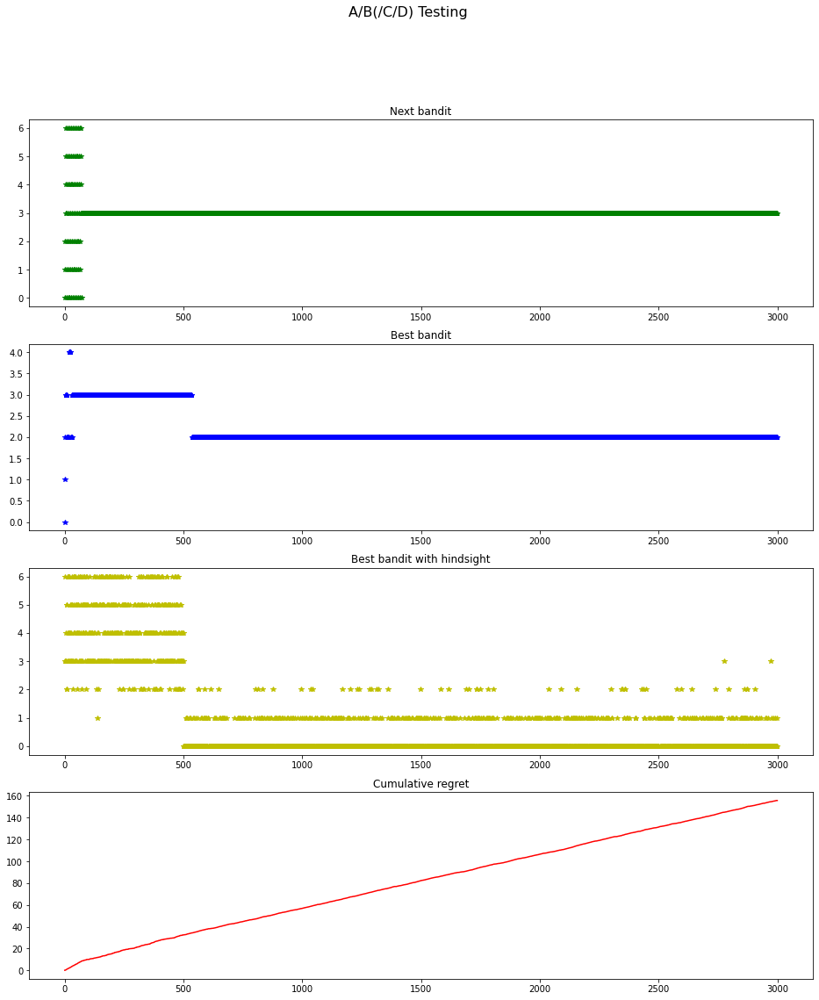

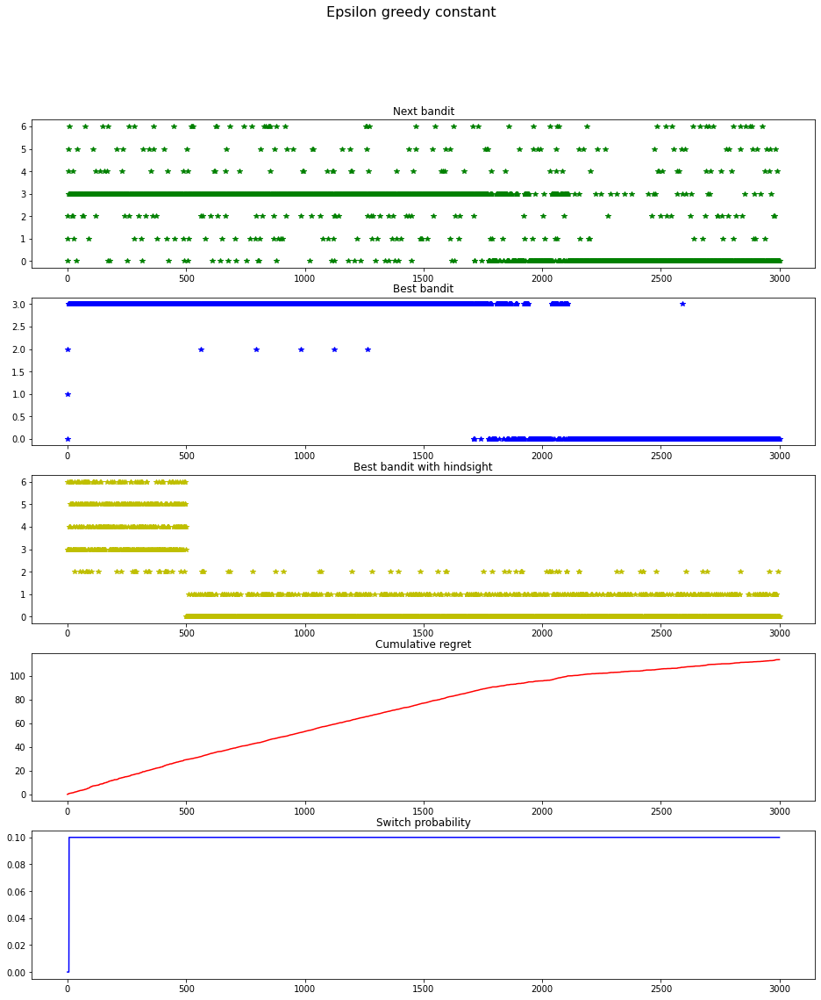

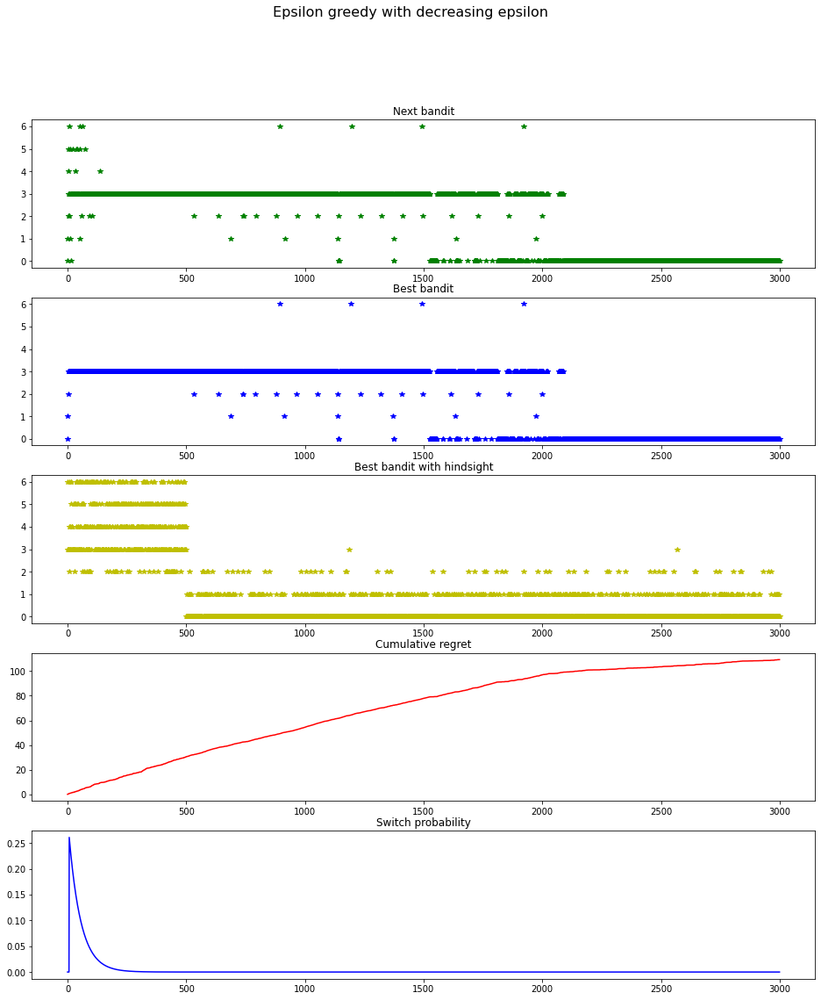

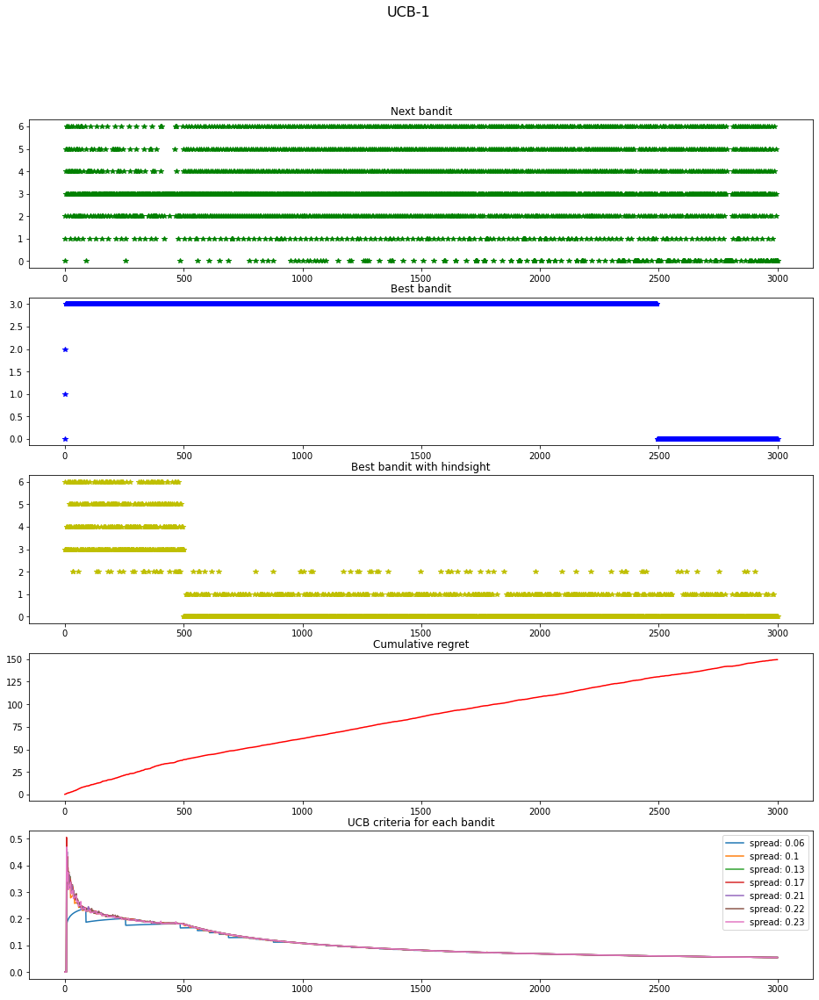

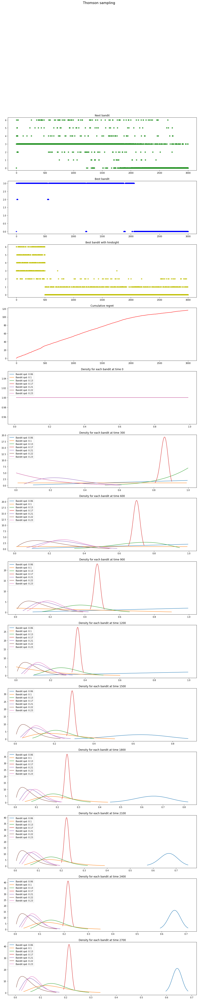

In [219]:
plot_stories(benchworks)

In [220]:
for i in range(1200,1400):
    print(benchworks[0].pnls_avg[i])

[0.06       0.1        0.13       0.05413158 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05408414 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05403678 0.063      0.022
 0.023     ]
[0.06      0.1       0.13      0.0539895 0.063     0.022     0.023    ]
[0.06       0.1        0.13       0.05394231 0.063      0.022
 0.023     ]
[0.06      0.1       0.13      0.0538952 0.063     0.022     0.023    ]
[0.06       0.1        0.13       0.05384817 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05380122 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05375436 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05370757 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05366087 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05361425 0.063      0.022
 0.023     ]
[0.06       0.1        0.13       0.05356771 0.063      0.022
 0.023     ]
[0.06       0.1        0.13    

## Adding noise to the bnpp quotes

In [221]:
bnpp_bid = BNPPbid(0.01, competitors=[Nomura])

In [222]:
benchworks = setup_benchworks(bid_bnpp=bnpp_bid, spreads_bandit=spreads_bandit, time_horizon=3000)

Spreads bandit: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time testing: 70
Time total: 3000


In [223]:
run_benchworks(benchworks)

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9034019152878835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6236722070556089
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5736794866722859
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9325954630371636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.56103021925571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13645522566068502
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1954294811093188
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8289808995501787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6692328934531846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06653648135411494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16540611484625978
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20351032104794942
epsilon-gr

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3466948813585782
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28130127253681136
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.951935167567925
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9904061968899467
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3560164860311865
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7580616581331086
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8905522863783111
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08377495384546052
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6428606425466126
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6435771978996101
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2010827273490715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8544384803729621
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9206832530635581
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6609613294538342
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.840513900032506
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.068504073

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08895911096105347
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.011259893492189477
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2568962488972776
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7703069416952161
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1516759554266618
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.37853705920495784
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7012210862699587
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.996218932176633
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9242781300631541
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3031613853492673
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35720918914780164
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2829236689044369
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5762952691671006
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8457945986780431
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.895458560968348
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.804151

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7619043579435016
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8048507272908553
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6797657443023485
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04744031022714135
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4811536583296011
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3824576191913197
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28281384711679003
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17225514293500632
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6818012243497787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11895713668751362
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2559363925597222
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39333741480754403
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13454105805046412
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7432302916626486
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3066362475978549
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.324

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7852348191791286
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5621803887080782
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.982052953257923
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6197406557487335
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0273369390689997
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20873127626347787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35152831550706176
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8342205801044374
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9675331458150631
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18925849525749971
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.987790853375543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48461529180614527
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3458861120007215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5486974193750223
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05862732342942567
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.837796

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17193663104732804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09869866652662074
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23780866095078568
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0941776642754053
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8204269689504585
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7663771217857842
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2182490415129703
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3182783693347532
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4947394053563112
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5702164548457194
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.46147295642693253
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8637848349801992
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4445073157502365
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5489479298256053
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35601993515537556
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2194

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5324973793248644
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6181689340512989
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47386116861009797
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09560503090047168
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6611773844392052
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06463850124406334
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6768163036960104
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0605095261800106
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.958876325967468
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.729862527978436
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7527454646083972
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7921895099029174
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5787214664198835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14031309144858373
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2804838782913722
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1133128

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7242402173553182
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09492255869450805
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2645617472814543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3964956395736935
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30720894774852936
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8124845444902065
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.883251597100688
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9158222246716502
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08473338032390232
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2377538958151041
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30951626191502424
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6156757451961246
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7335616118137862
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6584547618504831
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8263461298590626
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.500392

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08458598884336588
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.129327182063376
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8482199593609838
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16349972110650235
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.40667556467206745
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25597896918631446
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6861592937623179
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6946646219361826
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4141357165616236
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.155606836229495
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.372268168380227
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14456773347628527
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8686302181722676
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05822771717915909
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6871970407966277
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.674316

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3569307470667641
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4565758879676317
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5801254631995636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.061958124745416066
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5172316932945543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.941714114428071
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6269559475317882
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4045366626366017
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04448455538785112
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3231087001010581
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6977344953499138
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20238276782510378
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8909133695841571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31439595203236315
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.041680693226723076
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.417

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17722606519704176
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35611210057181186
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.64127618047615
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.458396129256458
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.920674104794098
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3169267916398637
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5236226885381664
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7203631464600836
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9950856783988061
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5378639201048975
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7172743743934187
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.562242632658667
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.27669475554198597
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34587588082982834
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6910876350058893
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0457004360

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34366544154394996
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09259882503713046
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.297801424487371
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4360125771926653
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4709451501603936
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39676802573580494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7102164136232013
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9163952578465545
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6612239546465932
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9373137504768936
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31825128004804193
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.36696359239821486
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8443484269860629
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8585228602161692
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6889786586301939
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.88822

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9329596571244124
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48546990805538237
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9043773172414172
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24230031673855779
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5493175412948333
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.664902226656815
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25830855075920955
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9237161476423231
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5582864686690882
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32083712874555304
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3109416625902012
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3967197225866542
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8446940750499575
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.38985088279024327
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1358980587061972
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06297

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5729896261490837
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.854912541365822
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5552898158552596
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45742087444986534
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7820232278137766
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20957037298360615
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25619244671235863
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47238568834449757
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7885849512772275
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5329658566675731
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3360602204387081
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5141190581224196
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3780303908778685
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12293555341350337
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19057403695973152
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6667

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5390491268625256
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1983561301375082
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9474900637976285
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4840037352309843
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8664865106387947
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.43295233839013836
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08310346633520516
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6995901076014059
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7201651813169938
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.309736428367424
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6786215130912977
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9061576731099632
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8925470906274476
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2494831123878266
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4458695061340654
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.38954592

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9666651575880042
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1605111535562075
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3522449910656994
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2679493864952226
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6335077257299493
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.10950401917213903
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.41525783990592324
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.10276979955585286
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.42777717244231406
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3812555187072547
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3390543014145494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.26127278972676926
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.37551740407888456
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11705728781525215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5566595586091554
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19733193116927228
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.749816512033112
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2865812442477572
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9884959272502242
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29757255696221063
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11518742693983641
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8947987416954643
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07878553158961821
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47452445446436464
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19717576160627537
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24090514255046425
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3368783606203706
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6365095956035114
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2764152138243161
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6408773330905951
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.028

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7475352691797968
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5397093180431138
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6495818020481813
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32696784711335425
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18906233394668326
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2433448387033602
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6871740915050435
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3972285141686751
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35659609801586056
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7827409378102612
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.37296643861372136
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.12558506918963452
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1521857140148274
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9448535059434783
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8469540249406659
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4054

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9850058316665671
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4054946925468387
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07229398292349898
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2009689151145988
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23969237843290436
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7260411300024072
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8456138152836861
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.771940584084694
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47644622932289926
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4874114690240039
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6271122804466859
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.41074452536953077
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05160995672255697
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29653017840213713
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.46234120799193323
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.494

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2496349987606008
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9672157463150945
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7867225216025618
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4559574598484575
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06151019875369712
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.980014119021846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04297700903310142
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06238020530929411
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7577350966254595
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.25031230649872505
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29400203699399907
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9004795212850822
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5261473663608909
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09812632375742802
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9633357229295509
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4231

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5769111445278255
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7146245399268109
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5985100027753658
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14283893558361527
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7583938499302191
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.41968455294683393
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.267319778443072
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.75116010653309
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6385354646354172
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5572605892538077
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4157753849632403
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.02239542767159275
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5556188860869323
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09346441042458409
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4573046823048993
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.70548860

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6569245303975589
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11190845336112876
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0013882737590189542
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7669456424317841
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5402760701411359
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8995756136405079
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.023305804425519216
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5357735007177765
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5411560945197206
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6364271838325042
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7348645072508283
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1667588951069886
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.43893413456210584
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47457115116586657
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08159765038223254
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.

epsilon-greedy
epsilon: 0.03979663952403651
sample_uniform: 0.3259672073089859
epsilon-greedy
epsilon: 0.039008613263527774
sample_uniform: 0.21076450246870537
epsilon-greedy
epsilon: 0.03823619096844622
sample_uniform: 0.05231294643747675
epsilon-greedy
epsilon: 0.03747906365957472
sample_uniform: 0.015403519791920894
epsilon-greedy
epsilon: 0.03673692847589457
sample_uniform: 0.2893863028408883
epsilon-greedy
epsilon: 0.03600948855343702
sample_uniform: 0.3549619111374843
epsilon-greedy
epsilon: 0.03529645290653376
sample_uniform: 0.6775172405047736
epsilon-greedy
epsilon: 0.03459753631141875
sample_uniform: 0.5424510175772805
epsilon-greedy
epsilon: 0.03391245919213495
sample_uniform: 0.5183541618062933
epsilon-greedy
epsilon: 0.03324094750870016
sample_uniform: 0.057811533099571544
epsilon-greedy
epsilon: 0.032582732647487386
sample_uniform: 0.8954959596053932
epsilon-greedy
epsilon: 0.03193755131377584
sample_uniform: 0.5483734835622996
epsilon-greedy
epsilon: 0.03130514542642951


epsilon-greedy
epsilon: 0.00415279862594385
sample_uniform: 0.1924178904137388
epsilon-greedy
epsilon: 0.00407056770366028
sample_uniform: 0.9004489123860653
epsilon-greedy
epsilon: 0.00398996506273313
sample_uniform: 0.7339231362848766
epsilon-greedy
epsilon: 0.003910958461031321
sample_uniform: 0.5824398618892226
epsilon-greedy
epsilon: 0.003833516294860728
sample_uniform: 0.32084890160086454
epsilon-greedy
epsilon: 0.0037576075863223154
sample_uniform: 0.750124248068985
epsilon-greedy
epsilon: 0.0036832019709205307
sample_uniform: 0.1721625549559327
epsilon-greedy
epsilon: 0.003610269685417132
sample_uniform: 0.7494424707521696
epsilon-greedy
epsilon: 0.0035387815559254684
sample_uniform: 0.46252906034220287
epsilon-greedy
epsilon: 0.0034687089862405606
sample_uniform: 0.6631568228819655
epsilon-greedy
epsilon: 0.003400023946400216
sample_uniform: 0.7541750254551594
epsilon-greedy
epsilon: 0.0033326989614726917
sample_uniform: 0.6065354305165435
epsilon-greedy
epsilon: 0.00326670710

epsilon-greedy
epsilon: 0.00042476571310404095
sample_uniform: 0.7825809780445985
epsilon-greedy
epsilon: 0.00041635478845077864
sample_uniform: 0.9977623655688204
epsilon-greedy
epsilon: 0.00040811041126436815
sample_uniform: 0.00673470699420331
epsilon-greedy
epsilon: 0.0004000292836840078
sample_uniform: 0.4274920945605305
epsilon-greedy
epsilon: 0.00039210817315091625
sample_uniform: 0.412392608220297
epsilon-greedy
epsilon: 0.00038434391111526336
sample_uniform: 0.7656861187707539
epsilon-greedy
epsilon: 0.0003767333917687108
sample_uniform: 0.7213842766472296
epsilon-greedy
epsilon: 0.0003692735708020443
sample_uniform: 0.003145720464372448
epsilon-greedy
epsilon: 0.0003619614641874121
sample_uniform: 0.8138399923945955
epsilon-greedy
epsilon: 0.0003547941469846718
sample_uniform: 0.5637062552864558
epsilon-greedy
epsilon: 0.0003477687521713774
sample_uniform: 0.8816909193539424
epsilon-greedy
epsilon: 0.00034088246949592974
sample_uniform: 0.2632470589001895
epsilon-greedy
epsil

epsilon-greedy
epsilon: 4.432450806961009e-05
sample_uniform: 0.49234451053532624
epsilon-greedy
epsilon: 4.34468240048064e-05
sample_uniform: 0.030486276185596628
epsilon-greedy
epsilon: 4.2586519248903344e-05
sample_uniform: 0.2777370697700209
epsilon-greedy
epsilon: 4.1743249668527595e-05
sample_uniform: 0.25232493400245926
epsilon-greedy
epsilon: 4.0916677944603416e-05
sample_uniform: 0.19558328224987354
epsilon-greedy
epsilon: 4.0106473437420065e-05
sample_uniform: 0.8527391992878655
epsilon-greedy
epsilon: 3.931231205437178e-05
sample_uniform: 0.16703413802718148
epsilon-greedy
epsilon: 3.8533876120316336e-05
sample_uniform: 0.7686346042762389
epsilon-greedy
epsilon: 3.777085425050095e-05
sample_uniform: 0.9420966577475507
epsilon-greedy
epsilon: 3.702294122600387e-05
sample_uniform: 0.18571809897509262
epsilon-greedy
epsilon: 3.628983787164298e-05
sample_uniform: 0.8391609586557156
epsilon-greedy
epsilon: 3.557125093630171e-05
sample_uniform: 0.5380585183723922
epsilon-greedy
ep

epsilon-greedy
epsilon: 4.911295486969557e-06
sample_uniform: 0.3590313502569825
epsilon-greedy
epsilon: 4.814045320545016e-06
sample_uniform: 0.9647965567706357
epsilon-greedy
epsilon: 4.718720836436812e-06
sample_uniform: 0.8977391897292477
epsilon-greedy
epsilon: 4.625283903580308e-06
sample_uniform: 0.813457486310385
epsilon-greedy
epsilon: 4.53369714595651e-06
sample_uniform: 0.44074225810941403
epsilon-greedy
epsilon: 4.4439239276411955e-06
sample_uniform: 0.443103108613214
epsilon-greedy
epsilon: 4.355928338150039e-06
sample_uniform: 0.6733683325343512
epsilon-greedy
epsilon: 4.26967517807397e-06
sample_uniform: 0.21709046387190056
epsilon-greedy
epsilon: 4.185129944998891e-06
sample_uniform: 0.3205442753283897
epsilon-greedy
epsilon: 4.102258819704289e-06
sample_uniform: 0.6398112505952036
epsilon-greedy
epsilon: 4.021028652635074e-06
sample_uniform: 0.9907671616984056
epsilon-greedy
epsilon: 3.941406950641351e-06
sample_uniform: 0.9088481925305185
epsilon-greedy
epsilon: 3.863

epsilon-greedy
epsilon: 5.12496064839163e-07
sample_uniform: 0.12859416067721263
epsilon-greedy
epsilon: 5.023479628302798e-07
sample_uniform: 0.807297937164412
epsilon-greedy
epsilon: 4.924008067045917e-07
sample_uniform: 0.009503786013218551
epsilon-greedy
epsilon: 4.826506174670171e-07
sample_uniform: 0.46938067575200315
epsilon-greedy
epsilon: 4.7309349491185657e-07
sample_uniform: 0.599352281529311
epsilon-greedy
epsilon: 4.637256160626573e-07
sample_uniform: 0.25163100355927226
epsilon-greedy
epsilon: 4.545432336429747e-07
sample_uniform: 0.17348737919623625
epsilon-greedy
epsilon: 4.455426745774065e-07
sample_uniform: 0.20942087626406658
epsilon-greedy
epsilon: 4.3672033852231743e-07
sample_uniform: 0.07207678443965337
epsilon-greedy
epsilon: 4.280726964256521e-07
sample_uniform: 0.7388283437440198
epsilon-greedy
epsilon: 4.1959628911526976e-07
sample_uniform: 0.10135173334614866
epsilon-greedy
epsilon: 4.112877259152253e-07
sample_uniform: 0.7096210725823635
epsilon-greedy
epsi

epsilon-greedy
epsilon: 5.3479212800876157e-08
sample_uniform: 0.587895929137139
epsilon-greedy
epsilon: 5.242025343690838e-08
sample_uniform: 0.8027078235403018
epsilon-greedy
epsilon: 5.13822628732615e-08
sample_uniform: 0.17356085019448353
epsilon-greedy
epsilon: 5.036482589986989e-08
sample_uniform: 0.502333105638994
epsilon-greedy
epsilon: 4.93675355283782e-08
sample_uniform: 0.7623540929688339
epsilon-greedy
epsilon: 4.838999282934036e-08
sample_uniform: 0.17505048669094747
epsilon-greedy
epsilon: 4.7431806772642836e-08
sample_uniform: 0.2910826897189972
epsilon-greedy
epsilon: 4.6492594071086904e-08
sample_uniform: 0.5827064341396158
epsilon-greedy
epsilon: 4.557197902706891e-08
sample_uniform: 0.3001550095965593
epsilon-greedy
epsilon: 4.4669593382296166e-08
sample_uniform: 0.5344742234982433
epsilon-greedy
epsilon: 4.3785076170478936e-08
sample_uniform: 0.23564001048222405
epsilon-greedy
epsilon: 4.29180735729387e-08
sample_uniform: 0.7252757813692942
epsilon-greedy
epsilon: 4

epsilon-greedy
epsilon: 5.580581780074653e-09
sample_uniform: 0.8640916810566112
epsilon-greedy
epsilon: 5.470078857109028e-09
sample_uniform: 0.28470968047189427
epsilon-greedy
epsilon: 5.361764038621604e-09
sample_uniform: 0.12608120803863931
epsilon-greedy
epsilon: 5.255593997240768e-09
sample_uniform: 0.6724265501299957
epsilon-greedy
epsilon: 5.151526263534351e-09
sample_uniform: 0.7405214807719801
epsilon-greedy
epsilon: 5.049519209021278e-09
sample_uniform: 0.9871764407491251
epsilon-greedy
epsilon: 4.949532029519619e-09
sample_uniform: 0.7260346308817618
epsilon-greedy
epsilon: 4.8515247288244246e-09
sample_uniform: 0.27101636983212696
epsilon-greedy
epsilon: 4.7554581027086185e-09
sample_uniform: 0.3539284210315661
epsilon-greedy
epsilon: 4.661293723240849e-09
sample_uniform: 0.81063299844686
epsilon-greedy
epsilon: 4.568993923413789e-09
sample_uniform: 0.28350458075223695
epsilon-greedy
epsilon: 4.478521782076824e-09
sample_uniform: 0.6150390213586691
epsilon-greedy
epsilon: 

epsilon-greedy
epsilon: 6.308375062838453e-10
sample_uniform: 0.5237449532598172
epsilon-greedy
epsilon: 6.183460867315673e-10
sample_uniform: 0.8984612779316369
epsilon-greedy
epsilon: 6.061020138587064e-10
sample_uniform: 0.6087199713620096
epsilon-greedy
epsilon: 5.941003898728569e-10
sample_uniform: 0.4958543106481438
epsilon-greedy
epsilon: 5.823364139644006e-10
sample_uniform: 0.5074602582835304
epsilon-greedy
epsilon: 5.708053803861192e-10
sample_uniform: 0.7194519874718599
epsilon-greedy
epsilon: 5.5950267657083e-10
sample_uniform: 0.28605499600595397
epsilon-greedy
epsilon: 5.484237812863065e-10
sample_uniform: 0.7049307567282705
epsilon-greedy
epsilon: 5.37564262826712e-10
sample_uniform: 0.9637475283048125
epsilon-greedy
epsilon: 5.269197772398673e-10
sample_uniform: 0.8655821898741497
epsilon-greedy
epsilon: 5.164860665896091e-10
sample_uniform: 0.00904972576738372
epsilon-greedy
epsilon: 5.062589572525595e-10
sample_uniform: 0.32008570928266544
epsilon-greedy
epsilon: 4.96

epsilon-greedy
epsilon: 6.851469937084735e-11
sample_uniform: 0.4848136012848545
epsilon-greedy
epsilon: 6.715801742531578e-11
sample_uniform: 0.5256134723415853
epsilon-greedy
epsilon: 6.58281995822065e-11
sample_uniform: 0.961205413807635
epsilon-greedy
epsilon: 6.452471389665092e-11
sample_uniform: 0.10029280267471985
epsilon-greedy
epsilon: 6.324703895699522e-11
sample_uniform: 0.45531447314047
epsilon-greedy
epsilon: 6.199466367622741e-11
sample_uniform: 0.4805790315810633
epsilon-greedy
epsilon: 6.076708708753663e-11
sample_uniform: 0.7214709812160267
epsilon-greedy
epsilon: 5.956381814391948e-11
sample_uniform: 0.6395818287483032
epsilon-greedy
epsilon: 5.838437552175474e-11
sample_uniform: 0.0015811758522702446
epsilon-greedy
epsilon: 5.722828742826742e-11
sample_uniform: 0.8228520711672499
epsilon-greedy
epsilon: 5.609509141280541e-11
sample_uniform: 0.5151592350704769
epsilon-greedy
epsilon: 5.498433418185286e-11
sample_uniform: 0.7811490457321988
epsilon-greedy
epsilon: 5.38

epsilon-greedy
epsilon: 7.007971673500646e-12
sample_uniform: 0.9423686252184217
epsilon-greedy
epsilon: 6.869204536936659e-12
sample_uniform: 0.6614248319175521
epsilon-greedy
epsilon: 6.7331851737780595e-12
sample_uniform: 0.0231224939829332
epsilon-greedy
epsilon: 6.599859174465972e-12
sample_uniform: 0.09155669853364734
epsilon-greedy
epsilon: 6.469173206822965e-12
sample_uniform: 0.9911275381688056
epsilon-greedy
epsilon: 6.341074994719482e-12
sample_uniform: 0.49613363188486426
epsilon-greedy
epsilon: 6.215513297162657e-12
sample_uniform: 0.11600042651833886
epsilon-greedy
epsilon: 6.092437887799334e-12
sample_uniform: 0.7507799445285273
epsilon-greedy
epsilon: 5.971799534824721e-12
sample_uniform: 0.04544348439074619
epsilon-greedy
epsilon: 5.853549981289092e-12
sample_uniform: 0.03866556318013914
epsilon-greedy
epsilon: 5.7376419257943536e-12
sample_uniform: 0.8836758782899915
epsilon-greedy
epsilon: 5.624029003572844e-12
sample_uniform: 0.5505802101607242
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 7.921918446574283e-13
sample_uniform: 0.758766559143452
epsilon-greedy
epsilon: 7.765053951376427e-13
sample_uniform: 0.0747112798800289
epsilon-greedy
epsilon: 7.611295581294555e-13
sample_uniform: 0.6731622911897392
epsilon-greedy
epsilon: 7.460581830930495e-13
sample_uniform: 0.9390050387137403
epsilon-greedy
epsilon: 7.312852412774558e-13
sample_uniform: 0.8259316747426451
epsilon-greedy
epsilon: 7.168048233089703e-13
sample_uniform: 0.8744943227886797
epsilon-greedy
epsilon: 7.026111368273361e-13
sample_uniform: 0.5381643263603124
epsilon-greedy
epsilon: 6.886985041687064e-13
sample_uniform: 0.22372770293042088
epsilon-greedy
epsilon: 6.750613600945132e-13
sample_uniform: 0.42751539120519433
epsilon-greedy
epsilon: 6.616942495652958e-13
sample_uniform: 0.037676045328807306
epsilon-greedy
epsilon: 6.485918255586124e-13
sample_uniform: 0.8459108141682078
epsilon-greedy
epsilon: 6.357488469301585e-13
sample_uniform: 0.8013968945133825
epsilon-greedy
epsilon: 6

epsilon-greedy
epsilon: 8.603925026664293e-14
sample_uniform: 0.806885356385054
epsilon-greedy
epsilon: 8.433555896367133e-14
sample_uniform: 0.8077307948662809
epsilon-greedy
epsilon: 8.266560300877402e-14
sample_uniform: 0.19755841953576547
epsilon-greedy
epsilon: 8.102871439730325e-14
sample_uniform: 0.12038474621360484
epsilon-greedy
epsilon: 7.942423835198865e-14
sample_uniform: 0.5045679684194535
epsilon-greedy
epsilon: 7.785153306101883e-14
sample_uniform: 0.06806960402992523
epsilon-greedy
epsilon: 7.630996942130768e-14
sample_uniform: 0.7447160914681165
epsilon-greedy
epsilon: 7.479893078684489e-14
sample_uniform: 0.7089989300336097
epsilon-greedy
epsilon: 7.33178127220292e-14
sample_uniform: 0.14503197679108482
epsilon-greedy
epsilon: 7.186602275988619e-14
sample_uniform: 0.8277229119427872
epsilon-greedy
epsilon: 7.044298016507357e-14
sample_uniform: 0.9938457804675411
epsilon-greedy
epsilon: 6.904811570157897e-14
sample_uniform: 0.3712226681902866
epsilon-greedy
epsilon: 6.

epsilon-greedy
epsilon: 9.53342067267132e-15
sample_uniform: 0.18352870671092691
epsilon-greedy
epsilon: 9.344646295427594e-15
sample_uniform: 0.030364635608484902
epsilon-greedy
epsilon: 9.159609901299019e-15
sample_uniform: 0.44649875552935225
epsilon-greedy
epsilon: 8.97823747326072e-15
sample_uniform: 0.008784989816511213
epsilon-greedy
epsilon: 8.800456459923156e-15
sample_uniform: 0.3896584438423798
epsilon-greedy
epsilon: 8.626195746510547e-15
sample_uniform: 0.9717545614402106
epsilon-greedy
epsilon: 8.455385626414017e-15
sample_uniform: 0.10820580689832004
epsilon-greedy
epsilon: 8.287957773308032e-15
sample_uniform: 0.5758127139988259
epsilon-greedy
epsilon: 8.123845213818946e-15
sample_uniform: 0.49022415984654866
epsilon-greedy
epsilon: 7.96298230073474e-15
sample_uniform: 0.06714687982489942
epsilon-greedy
epsilon: 7.80530468674537e-15
sample_uniform: 0.661947394902431
epsilon-greedy
epsilon: 7.650749298702813e-15
sample_uniform: 0.4466658333929112
epsilon-greedy
epsilon: 

epsilon-greedy
epsilon: 9.751183707896906e-16
sample_uniform: 0.4086782764760545
epsilon-greedy
epsilon: 9.558097333650963e-16
sample_uniform: 0.9167523305008963
epsilon-greedy
epsilon: 9.368834325781547e-16
sample_uniform: 0.6463246051560132
epsilon-greedy
epsilon: 9.183318976561833e-16
sample_uniform: 0.3773911088007469
epsilon-greedy
epsilon: 9.001477077378694e-16
sample_uniform: 0.9748529961686875
epsilon-greedy
epsilon: 8.823235889047739e-16
sample_uniform: 0.38481579483276607
epsilon-greedy
epsilon: 8.648524112717177e-16
sample_uniform: 0.836540422181592
epsilon-greedy
epsilon: 8.477271861346833e-16
sample_uniform: 0.44005033292612017
epsilon-greedy
epsilon: 8.309410631752827e-16
sample_uniform: 0.6735599989678778
epsilon-greedy
epsilon: 8.144873277205202e-16
sample_uniform: 0.10204130165025727
epsilon-greedy
epsilon: 7.983593980568158e-16
sample_uniform: 0.9486142545238685
epsilon-greedy
epsilon: 7.825508227972738e-16
sample_uniform: 0.1869125383007203
epsilon-greedy
epsilon: 7.

epsilon-greedy
epsilon: 1.0380964334700394e-16
sample_uniform: 0.9248630871982625
epsilon-greedy
epsilon: 1.017540746851811e-16
sample_uniform: 0.2064127803730561
epsilon-greedy
epsilon: 9.97392090099707e-17
sample_uniform: 0.737658104138357
epsilon-greedy
epsilon: 9.776424034823885e-17
sample_uniform: 0.9426394670567264
epsilon-greedy
epsilon: 9.582837868618619e-17
sample_uniform: 0.8394129870054562
epsilon-greedy
epsilon: 9.393084965333674e-17
sample_uniform: 0.28463153893614557
epsilon-greedy
epsilon: 9.207089421277735e-17
sample_uniform: 0.3635380187218392
epsilon-greedy
epsilon: 9.024776835753069e-17
sample_uniform: 0.3001979112656328
epsilon-greedy
epsilon: 8.84607428129473e-17
sample_uniform: 0.22519565734039215
epsilon-greedy
epsilon: 8.670910274498076e-17
sample_uniform: 0.6664889898937804
epsilon-greedy
epsilon: 8.49921474742496e-17
sample_uniform: 0.6268473449330866
epsilon-greedy
epsilon: 8.33091901957513e-17
sample_uniform: 0.2948585017761779
epsilon-greedy
epsilon: 8.1659

epsilon-greedy
epsilon: 1.1734800979184521e-17
sample_uniform: 0.8966689578345479
epsilon-greedy
epsilon: 1.1502436351315527e-17
sample_uniform: 0.07195902692864142
epsilon-greedy
epsilon: 1.127467285135484e-17
sample_uniform: 0.01303757973655617
epsilon-greedy
epsilon: 1.105141937086567e-17
sample_uniform: 0.9998342226079319
epsilon-greedy
epsilon: 1.0832586605479151e-17
sample_uniform: 0.5395395582232645
epsilon-greedy
epsilon: 1.0618087019171157e-17
sample_uniform: 0.07627030235141319
epsilon-greedy
epsilon: 1.0407834809247291e-17
sample_uniform: 0.4553659766854078
epsilon-greedy
epsilon: 1.020174587202003e-17
sample_uniform: 0.761677142486943
epsilon-greedy
epsilon: 9.99973776916674e-18
sample_uniform: 0.0497354187104333
epsilon-greedy
epsilon: 9.80172969475266e-18
sample_uniform: 0.7518886843693319
epsilon-greedy
epsilon: 9.607642442908024e-18
sample_uniform: 0.8307421622402474
epsilon-greedy
epsilon: 9.417398376144088e-18
sample_uniform: 0.11805930721475599
epsilon-greedy
epsilon

epsilon-greedy
epsilon: 1.3002530112470587e-18
sample_uniform: 0.19146991489096354
epsilon-greedy
epsilon: 1.2745062765874766e-18
sample_uniform: 0.4865702281174731
epsilon-greedy
epsilon: 1.2492693614321734e-18
sample_uniform: 0.9303690872699572
epsilon-greedy
epsilon: 1.2245321706785984e-18
sample_uniform: 0.25402152944219436
epsilon-greedy
epsilon: 1.2002848091205997e-18
sample_uniform: 0.7098487424227266
epsilon-greedy
epsilon: 1.1765175774902685e-18
sample_uniform: 0.33131494950810736
epsilon-greedy
epsilon: 1.1532209685780351e-18
sample_uniform: 0.18917394445325675
epsilon-greedy
epsilon: 1.130385663429726e-18
sample_uniform: 0.42325257603937005
epsilon-greedy
epsilon: 1.1080025276187904e-18
sample_uniform: 0.4923785473391584
epsilon-greedy
epsilon: 1.0860626075924742e-18
sample_uniform: 0.9857762880801068
epsilon-greedy
epsilon: 1.064557127090215e-18
sample_uniform: 0.8425287300249739
epsilon-greedy
epsilon: 1.0434774836330765e-18
sample_uniform: 0.4548331589192762
epsilon-greed

epsilon-greedy
epsilon: 1.384229908919814e-19
sample_uniform: 0.4326041345354288
epsilon-greedy
epsilon: 1.3568203202747282e-19
sample_uniform: 0.8408069189984045
epsilon-greedy
epsilon: 1.3299534778489406e-19
sample_uniform: 0.8725643019079333
epsilon-greedy
epsilon: 1.3036186345472329e-19
sample_uniform: 0.6363093144380105
epsilon-greedy
epsilon: 1.2778052560811666e-19
sample_uniform: 0.5827493904905716
epsilon-greedy
epsilon: 1.252503016755154e-19
sample_uniform: 0.08748868307916868
epsilon-greedy
epsilon: 1.227701795336107e-19
sample_uniform: 0.5661062863502823
epsilon-greedy
epsilon: 1.2033916710047786e-19
sample_uniform: 0.32954055264316195
epsilon-greedy
epsilon: 1.1795629193872797e-19
sample_uniform: 0.5093652243407787
epsilon-greedy
epsilon: 1.1562060086652593e-19
sample_uniform: 0.14886778315511706
epsilon-greedy
epsilon: 1.1333115957629825e-19
sample_uniform: 0.020065809430517167
epsilon-greedy
epsilon: 1.1108705226100416e-19
sample_uniform: 0.032966181378813686
epsilon-gree

epsilon-greedy
epsilon: 1.5033997681663393e-20
sample_uniform: 0.06931232452695546
epsilon-greedy
epsilon: 1.4736304582063248e-20
sample_uniform: 0.04060183819929675
epsilon-greedy
epsilon: 1.444450620078271e-20
sample_uniform: 0.28505764437128966
epsilon-greedy
epsilon: 1.415848581457837e-20
sample_uniform: 0.3912155323388483
epsilon-greedy
epsilon: 1.387812901148219e-20
sample_uniform: 0.12226788112098552
epsilon-greedy
epsilon: 1.3603323645034888e-20
sample_uniform: 0.30317034907231744
epsilon-greedy
epsilon: 1.333395978942557e-20
sample_uniform: 0.9093816913840608
epsilon-greedy
epsilon: 1.3069929695520619e-20
sample_uniform: 0.06936819546382411
epsilon-greedy
epsilon: 1.2811127747761834e-20
sample_uniform: 0.6810637586857768
epsilon-greedy
epsilon: 1.255745042191956e-20
sample_uniform: 0.7679735506634648
epsilon-greedy
epsilon: 1.2308796243680869e-20
sample_uniform: 0.47766079706529185
epsilon-greedy
epsilon: 1.2065065748059208e-20
sample_uniform: 0.4809167943518282
epsilon-greedy

epsilon-greedy
epsilon: 1.5072912240948775e-21
sample_uniform: 0.47105705053841584
epsilon-greedy
epsilon: 1.47744485814472e-21
sample_uniform: 0.2335009877365578
epsilon-greedy
epsilon: 1.4481894898373372e-21
sample_uniform: 0.44189553040982466
epsilon-greedy
epsilon: 1.4195134166353502e-21
sample_uniform: 0.26358290065875367
epsilon-greedy
epsilon: 1.3914051677271054e-21
sample_uniform: 0.6980977870478764
epsilon-greedy
epsilon: 1.363853499438268e-21
sample_uniform: 0.1894304511073237
epsilon-greedy
epsilon: 1.336847390734171e-21
sample_uniform: 0.2996196692453834
epsilon-greedy
epsilon: 1.3103760388112278e-21
sample_uniform: 0.35832073023000444
epsilon-greedy
epsilon: 1.284428854775732e-21
sample_uniform: 0.3331427464490325
epsilon-greedy
epsilon: 1.2589954594080835e-21
sample_uniform: 0.46747708215521355
epsilon-greedy
epsilon: 1.2340656790110374e-21
sample_uniform: 0.8962414828722389
epsilon-greedy
epsilon: 1.209629541340015e-21
sample_uniform: 0.7919981849868336
epsilon-greedy
ep

epsilon-greedy
epsilon: 1.5417208714583576e-22
sample_uniform: 0.6454460523228818
epsilon-greedy
epsilon: 1.511192752812823e-22
sample_uniform: 0.35283652931980536
epsilon-greedy
epsilon: 1.4812691314179078e-22
sample_uniform: 0.1359389294652965
epsilon-greedy
epsilon: 1.4519380374260887e-22
sample_uniform: 0.93446107421028
epsilon-greedy
epsilon: 1.4231877380086616e-22
sample_uniform: 0.4747968765679027
epsilon-greedy
epsilon: 1.3950067326625378e-22
sample_uniform: 0.713927222694241
epsilon-greedy
epsilon: 1.3673837486098068e-22
sample_uniform: 0.5115251867635985
epsilon-greedy
epsilon: 1.3403077362885556e-22
sample_uniform: 0.37613255909336096
epsilon-greedy
epsilon: 1.3137678649328185e-22
sample_uniform: 0.497148306145617
epsilon-greedy
epsilon: 1.2877535182401933e-22
sample_uniform: 0.7250963486595375
epsilon-greedy
epsilon: 1.262254290125149e-22
sample_uniform: 0.2352578613495323
epsilon-greedy
epsilon: 1.2372599805564275e-22
sample_uniform: 0.3156038483470407
epsilon-greedy
epsil

epsilon-greedy
epsilon: 1.545711519157287e-23
sample_uniform: 0.0961372369862259
epsilon-greedy
epsilon: 1.5151043803929373e-23
sample_uniform: 0.16217387336359568
epsilon-greedy
epsilon: 1.4851033035824164e-23
sample_uniform: 0.6501603034762538
epsilon-greedy
epsilon: 1.4556962878949596e-23
sample_uniform: 0.7896137274166108
epsilon-greedy
epsilon: 1.4268715701322136e-23
sample_uniform: 0.3887946996884247
epsilon-greedy
epsilon: 1.3986176200227182e-23
sample_uniform: 0.5217356629978585
epsilon-greedy
epsilon: 1.3709231356097255e-23
sample_uniform: 0.8691987956666999
epsilon-greedy
epsilon: 1.3437770387301857e-23
sample_uniform: 0.8129476316161783
epsilon-greedy
epsilon: 1.3171684705834136e-23
sample_uniform: 0.5525777419140726
epsilon-greedy
epsilon: 1.2910867873873459e-23
sample_uniform: 0.03251436003077135
epsilon-greedy
epsilon: 1.2655215561209535e-23
sample_uniform: 0.7718121286030502
epsilon-greedy
epsilon: 1.240462550350864e-23
sample_uniform: 0.536882117413033
epsilon-greedy
ep

epsilon-greedy
epsilon: 1.6129574631508746e-24
sample_uniform: 0.03627346696063183
epsilon-greedy
epsilon: 1.5810187654807122e-24
sample_uniform: 0.6644015392411746
epsilon-greedy
epsilon: 1.5497124963972842e-24
sample_uniform: 0.3844019896728341
epsilon-greedy
epsilon: 1.5190261329755131e-24
sample_uniform: 0.39275801180944814
epsilon-greedy
epsilon: 1.4889474002608949e-24
sample_uniform: 0.4704858545058441
epsilon-greedy
epsilon: 1.4594642663592669e-24
sample_uniform: 0.15693027987976327
epsilon-greedy
epsilon: 1.4305649376239659e-24
sample_uniform: 0.1745892944242724
epsilon-greedy
epsilon: 1.4022378539381781e-24
sample_uniform: 0.9789519840345552
epsilon-greedy
epsilon: 1.3744716840907096e-24
sample_uniform: 0.7879969223838981
epsilon-greedy
epsilon: 1.3472553212434205e-24
sample_uniform: 0.05027850707356962
epsilon-greedy
epsilon: 1.320577878488263e-24
sample_uniform: 0.05190549274282663
epsilon-greedy
epsilon: 1.2944286844924502e-24
sample_uniform: 0.06151019875369712
epsilon-gre

epsilon-greedy
epsilon: 1.787207812212142e-25
sample_uniform: 0.2925363085321594
epsilon-greedy
epsilon: 1.7518187264538173e-25
sample_uniform: 0.9041936041542636
epsilon-greedy
epsilon: 1.7171303915439557e-25
sample_uniform: 0.9053015030275003
epsilon-greedy
epsilon: 1.6831289316860894e-25
sample_uniform: 0.8244749195463106
epsilon-greedy
epsilon: 1.649800745842928e-25
sample_uniform: 0.269468198775903
epsilon-greedy
epsilon: 1.617132502295728e-25
sample_uniform: 0.47363369985916126
epsilon-greedy
epsilon: 1.5851111333115124e-25
sample_uniform: 0.6906863216126559
epsilon-greedy
epsilon: 1.553723829915707e-25
sample_uniform: 0.2303307333562581
epsilon-greedy
epsilon: 1.522958036768473e-25
sample_uniform: 0.11780495016374604
epsilon-greedy
epsilon: 1.492801447142313e-25
sample_uniform: 0.8359875021537075
epsilon-greedy
epsilon: 1.4632419979993056e-25
sample_uniform: 0.9167963984993003
epsilon-greedy
epsilon: 1.4342678651656406e-25
sample_uniform: 0.9945988837152983
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 1.8649600156184044e-26
sample_uniform: 0.26193886655966625
epsilon-greedy
epsilon: 1.8280313330792996e-26
sample_uniform: 0.33739358372145567
epsilon-greedy
epsilon: 1.791833887447516e-26
sample_uniform: 0.8541913132879777
epsilon-greedy
epsilon: 1.7563531992621355e-26
sample_uniform: 0.11354910884594138
epsilon-greedy
epsilon: 1.7215750757748274e-26
sample_uniform: 0.21599863510855533
epsilon-greedy
epsilon: 1.6874856052724572e-26
sample_uniform: 0.43863653390394675
epsilon-greedy
epsilon: 1.6540711515123163e-26
sample_uniform: 0.017628806397647634
epsilon-greedy
epsilon: 1.6213183482673442e-26
sample_uniform: 0.9971104022894991
epsilon-greedy
epsilon: 1.5892140939795456e-26
sample_uniform: 0.4253479503197475
epsilon-greedy
epsilon: 1.557745546519154e-26
sample_uniform: 0.25742048104906445
epsilon-greedy
epsilon: 1.5269001180475764e-26
sample_uniform: 0.3247087124538528
epsilon-greedy
epsilon: 1.4966654699821686e-26
sample_uniform: 0.4486049162165239
epsilon-gr

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 18  3  3  1]
Wins:
[ 2.  1.  1. 19.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 2.]
Thompson probas:
[0.66666667 0.5        0.5        0.95       0.2        0.2
 0.33333333]
Thompson samples:
[0.01341621 0.02095466 0.10524602 0.16576264 0.01965003 0.04571866
 0.16541383]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 19  3  3  1]
Wins:
[ 2.  1.  1. 20.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 2.]
Thompson probas:
[0.66666667 0.5        0.5        0.95238095 0.2        0.2
 0.33333333]
Thompson samples:
[0.04596742 0.00423515 0.07861419 0.12650695 0.04027091 0.04510651
 0.10379821]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 20  3  3  1]
Wins:
[ 2.  1.  1. 21.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 2.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 41  3  3  2]
Wins:
[ 2.  1.  1. 42.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.97674419 0.2        0.2
 0.25      ]
Thompson samples:
[0.02398346 0.02754282 0.05357351 0.16927856 0.00590078 0.05115239
 0.00407376]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 42  3  3  2]
Wins:
[ 2.  1.  1. 43.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.97727273 0.2        0.2
 0.25      ]
Thompson samples:
[0.03419077 0.04423149 0.06918712 0.16720285 0.00442955 0.01960636
 0.14742482]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 43  3  3  2]
Wins:
[ 2.  1.  1. 44.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5       

 0.09176265]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 64  3  3  2]
Wins:
[ 2.  1.  1. 65.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98484848 0.2        0.2
 0.25      ]
Thompson samples:
[0.05822266 0.07261248 0.05014754 0.16235897 0.08917599 0.07827919
 0.01199821]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 65  3  3  2]
Wins:
[ 2.  1.  1. 66.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98507463 0.2        0.2
 0.25      ]
Thompson samples:
[0.04328263 0.03912377 0.00772367 0.16866659 0.05208588 0.01038442
 0.07054093]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 66  3  3  2]
Wins:
[ 2.  1.  1. 67.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson pr

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 86  3  3  2]
Wins:
[ 2.  1.  1. 87.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98863636 0.2        0.2
 0.25      ]
Thompson samples:
[0.05482536 0.02759201 0.10053138 0.16985819 0.11221754 0.02038047
 0.05496752]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 87  3  3  2]
Wins:
[ 2.  1.  1. 88.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.98876404 0.2        0.2
 0.25      ]
Thompson samples:
[0.03009025 0.05207146 0.11883648 0.16977052 0.06484418 0.02938693
 0.06002547]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [ 1  0  0 88  3  3  2]
Wins:
[ 2.  1.  1. 89.  1.  1.  1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 107   3   3   2]
Wins:
[  2.   1.   1. 108.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99082569 0.2        0.2
 0.25      ]
Thompson samples:
[0.00738733 0.04167794 0.08100195 0.1678259  0.02949441 0.08671444
 0.09128305]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 108   3   3   2]
Wins:
[  2.   1.   1. 109.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99090909 0.2        0.2
 0.25      ]
Thompson samples:
[0.05978137 0.02410037 0.10395528 0.167353   0.02049295 0.0306897
 0.07132793]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 109   3   3   2]
Wins:
[  2.   1.   1. 110.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 4. 3.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 130   3   4   2]
Wins:
[  2.   1.   1. 131.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.99242424 0.2        0.16666667
 0.25      ]
Thompson samples:
[0.01439993 0.08914613 0.05373324 0.16960833 0.01680906 0.02769782
 0.08093698]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 131   3   4   2]
Wins:
[  2.   1.   1. 132.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 3.]
Thompson probas:
[0.66666667 0.5        0.5        0.9924812  0.2        0.16666667
 0.25      ]
Thompson samples:
[0.03416253 0.05717657 0.06110707 0.16993267 0.03019829 0.01772929
 0.11786593]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 132   3   4   2]
Wins:
[  2.   1.   1. 133.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 153   3   4   3]
Wins:
[  2.   1.   1. 154.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99354839 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.01532916 0.05775572 0.10914881 0.16930316 0.02818366 0.0184051
 0.06941407]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 154   3   4   3]
Wins:
[  2.   1.   1. 155.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99358974 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05080095 0.07532052 0.06199153 0.16946279 0.0647256  0.01876176
 0.01655585]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 155   3   4   3]
Wins:
[  2.   1.   1. 156.   1.   1.   1.]
Losses:
[1. 1. 

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 177   3   4   3]
Wins:
[  2.   1.   1. 178.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99441341 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05561371 0.02685531 0.03029546 0.16927746 0.06510102 0.02859743
 0.00169763]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 178   3   4   3]
Wins:
[  2.   1.   1. 179.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99444444 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03833763 0.07366351 0.09293284 0.16940162 0.00062614 0.00265516
 0.00121187]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 179   3   4   3]
Wins:
[  2.   1.   1. 180.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 199   3   4   3]
Wins:
[  2.   1.   1. 200.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99502488 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.01769207 0.04456815 0.05491167 0.16879573 0.05957952 0.04727989
 0.07848142]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 200   3   4   3]
Wins:
[  2.   1.   1. 201.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9950495  0.2        0.16666667
 0.2       ]
Thompson samples:
[0.04687801 0.01709543 0.07479176 0.16893819 0.08026868 0.01318555
 0.02051275]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 201   3   4   3]
Wins:
[  2.   1.   1. 202.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 221   3   4   3]
Wins:
[  2.   1.   1. 222.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9955157  0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05577027 0.0910456  0.0251645  0.16999261 0.0284472  0.04598076
 0.04674492]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 222   3   4   3]
Wins:
[  2.   1.   1. 223.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99553571 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03338422 0.07025071 0.02475077 0.16980953 0.08426577 0.04165658
 0.02238252]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 223   3   4   3]
Wins:
[  2.   1.   1. 224.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 245   3   4   3]
Wins:
[  2.   1.   1. 246.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99595142 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.04387791 0.02821599 0.06988715 0.16978833 0.02910345 0.00663593
 0.01983154]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 246   3   4   3]
Wins:
[  2.   1.   1. 247.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99596774 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05727444 0.0559876  0.02697169 0.16869077 0.08558572 0.07570943
 0.00952434]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 247   3   4   3]
Wins:
[  2.   1.   1. 248.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 268   3   4   3]
Wins:
[  2.   1.   1. 269.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9962963  0.2        0.16666667
 0.2       ]
Thompson samples:
[0.03779018 0.0958054  0.05428062 0.169151   0.05717012 0.03561596
 0.08738881]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 269   3   4   3]
Wins:
[  2.   1.   1. 270.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 4. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99630996 0.2        0.16666667
 0.2       ]
Thompson samples:
[0.05947626 0.07728588 0.05715215 0.16958353 0.07099123 0.03068213
 0.04796061]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 270   3   4   3]
Wins:
[  2.   1.   1. 271.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 289   4   4   3]
Wins:
[  2.   1.   1. 290.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99656357 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.03233466 0.02177756 0.02211922 0.16869098 0.02688712 0.01129069
 0.00288797]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 290   4   4   3]
Wins:
[  2.   1.   1. 291.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99657534 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.03217615 0.04439984 0.01742742 0.16894815 0.03377147 0.14017862
 0.01199699]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 291   4   4   3]
Wins:
[  2.   1.   1. 292.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 313   4   4   3]
Wins:
[  2.   1.   1. 314.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9968254  0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.04130506 0.0682523  0.03838394 0.16962602 0.01813658 0.00636372
 0.0025488 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 314   4   4   3]
Wins:
[  2.   1.   1. 315.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 5. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99683544 0.16666667 0.16666667
 0.2       ]
Thompson samples:
[0.02396833 0.06435883 0.0661797  0.16981648 0.04025407 0.00346478
 0.12177702]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 315   4   4   3]
Wins:
[  2.   1.   1. 316.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 336   4   5   3]
Wins:
[  2.   1.   1. 337.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99704142 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.04106609 0.03842942 0.03777565 0.16904301 0.07259572 0.05364226
 0.05036445]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 337   4   5   3]
Wins:
[  2.   1.   1. 338.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99705015 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.05295735 0.0240671  0.12230333 0.1696218  0.04108571 0.03283782
 0.0640777 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 338   4   5   3]
Wins:
[  2.   1.   1. 339.   1.   1.   1.]
Losses:
[1. 1.

 0.00699153]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 360   4   5   3]
Wins:
[  2.   1.   1. 361.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99723757 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[3.17623740e-02 9.53279099e-02 8.33950505e-02 1.69787827e-01
 7.57596459e-02 6.90810405e-05 1.02821154e-01]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 361   4   5   3]
Wins:
[  2.   1.   1. 362.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99724518 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.04395629 0.00778165 0.06734637 0.16966815 0.01097438 0.00800779
 0.05515287]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 362   4   5   3]
W

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 383   4   5   3]
Wins:
[  2.   1.   1. 384.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.9974026  0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.0503021  0.0049177  0.09484516 0.16920379 0.03270428 0.02395444
 0.04667011]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 384   4   5   3]
Wins:
[  2.   1.   1. 385.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 4.]
Thompson probas:
[0.66666667 0.5        0.5        0.99740933 0.16666667 0.14285714
 0.2       ]
Thompson samples:
[0.0474742  0.03225608 0.04329342 0.16962212 0.01546522 0.01084946
 0.03829723]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 385   4   5   3]
Wins:
[  2.   1.   1. 386.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 403   4   5   4]
Wins:
[  2.   1.   1. 404.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99753086 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.05396562 0.07766877 0.0596016  0.16988187 0.00371951 0.03463411
 0.06374959]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 404   4   5   4]
Wins:
[  2.   1.   1. 405.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99753695 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.0137681  0.05273368 0.0059842  0.16932724 0.05050415 0.03573993
 0.02685128]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 405   4   5   4]
Wins:
[  2.   1.   1. 406.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 427   4   5   4]
Wins:
[  2.   1.   1. 428.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.997669   0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.01037806 0.06569657 0.10892861 0.16957281 0.00817318 0.00171551
 0.03852514]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 428   4   5   4]
Wins:
[  2.   1.   1. 429.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 5.]
Thompson probas:
[0.66666667 0.5        0.5        0.99767442 0.16666667 0.14285714
 0.16666667]
Thompson samples:
[0.05643958 0.08896646 0.05927391 0.16979214 0.01441123 0.02217146
 0.09021746]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 429   4   5   4]
Wins:
[  2.   1.   1. 430.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 449   4   5   5]
Wins:
[  2.   1.   1. 450.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99778271 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05465051 0.02595744 0.01133791 0.16976914 0.05079065 0.06044662
 0.03852436]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 450   4   5   5]
Wins:
[  2.   1.   1. 451.   1.   1.   1.]
Losses:
[1. 1. 1. 1. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99778761 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.0329831  0.01887866 0.0922128  0.16887754 0.06765144 0.03993966
 0.01792827]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.   0.   0.  ]
nb of selections so far: [  1   0   0 451   4   5   5]
Wins:
[  2.   1.   1. 452.   1.   1.   1.]
Losses:
[1. 1.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16930185 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 487   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[1. 1. 1. 3. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99386503 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04031178 0.05289751 0.03469806 0.16943282 0.00576763 0.02349414
 0.06067011]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16895492 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 488   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[1. 1. 1. 4. 5. 6. 6.]
Thompson probas:
[0.66666667 0.5        0.5        0.99183673 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05047693 0.08229374 0.06153933 0.16962157 0.02449381 0.02747567
 0.11822584]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16860941 0.         0.
 0.        ]
nb of s

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16198428 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 509   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 25.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.95107632 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04276222 0.00656952 0.08153949 0.16196029 0.01415201 0.00260036
 0.00886931]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16166667 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 510   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 26.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.94921875 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04044364 0.09144529 0.12749214 0.16357233 0.01215844 0.00545899
 0.00716488]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.16135029 0.         0.
 0.   

Thompson samples:
[0.03985567 0.04061974 0.11798396 0.15250179 0.02201831 0.00346338
 0.02686278]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.15527307 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 531   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 47.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.91181989 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05183102 0.05681164 0.05261257 0.15645008 0.05723414 0.01125312
 0.01007732]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1549812 0.        0.        0.       ]
nb of selections so far: [  1   0   0 532   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 48.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.91011236 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.03370917 0.04036884 0.12463113 0.15722502 0.03486574 0.02197222
 0.02491572]


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14936594 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 552   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 68.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.87725632 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.03503718 0.08266355 0.04393026 0.15179874 0.03038588 0.00682904
 0.0350357 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14909584 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 553   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 69.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.87567568 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04413994 0.08891434 0.01186947 0.14694532 0.03457703 0.00753964
 0.01997185]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14882671 0.         0.
 0.   

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1433913 0.        0.        0.       ]
nb of selections so far: [  1   0   0 575   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 91.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.84228769 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.03667411 0.07344871 0.12938832 0.14536274 0.02518529 0.04969035
 0.00526948]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14314236 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 576   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[ 1.  1.  1. 92.  5.  6.  6.]
Thompson probas:
[0.66666667 0.5        0.5        0.84083045 0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.04510707 0.00880878 0.05273526 0.1431136  0.05204917 0.04577657
 0.00977028]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.14289428 0.         0.
 0.   

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13787625 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 598   4   5   5]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 114.   5.   6.   6.]
Thompson probas:
[0.66666667 0.5        0.5        0.81       0.16666667 0.14285714
 0.14285714]
Thompson samples:
[0.05768614 0.08907105 0.04190658 0.13632276 0.1284197  0.01540198
 0.14731925]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13787625 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 598   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 114.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.81       0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.02622132 0.02665198 0.07114333 0.14112335 0.05396532 0.0080586
 0.0894994 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13764608 0.     

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13319871 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 619   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 135.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.7826087  0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.05779015 0.03049919 0.03845499 0.12984233 0.01617951 0.01297542
 0.0243223 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.13298387 0.         0.
 0.        ]
nb of selections so far: [  1   0   0 620   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   1. 136.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.5        0.78135048 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[4.46381757e-02 3.85225490e-02 8.08622345e-02 1.30768761e-01
 8.88016773e-05 2.61040580e-02 2.64860851e-02]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12862715 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 641   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 157.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.75583204 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.0472262  0.06631587 0.03421793 0.12409206 0.01043055 0.03408249
 0.05649752]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12842679 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 642   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 158.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.75465839 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.05787211 0.04006124 0.04209408 0.13024184 0.03523802 0.00180062
 0.04084662]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12822706 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12454683 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 662   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 178.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.73192771 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.05268167 0.02990443 0.01355024 0.12550313 0.04225379 0.02380209
 0.01017277]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12435897 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 663   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 179.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.73082707 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.03943675 0.02191542 0.09123517 0.12182404 0.11453707 0.01832733
 0.03048692]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12417169 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12071742 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 683   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 199.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.70948905 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.0432311  0.03543083 0.01185278 0.12570092 0.02171397 0.05552322
 0.01289923]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12054094 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 684   4   5   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 200.   5.   6.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.70845481 0.16666667 0.14285714
 0.125     ]
Thompson samples:
[0.00874638 0.09716791 0.00801521 0.11589592 0.01099517 0.06786616
 0.07514112]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.12036496 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11728307 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 703   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 219.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.6893617  0.16666667 0.125
 0.125     ]
Thompson samples:
[0.03227613 0.03137339 0.07538323 0.11475014 0.02598683 0.02282045
 0.03037537]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11711648 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 704   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 220.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.68838527 0.16666667 0.125
 0.125     ]
Thompson samples:
[0.05150489 0.07919444 0.04947998 0.11526639 0.04380175 0.00862177
 0.00124796]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11695035 0.         0.
 0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11403873 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 723   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 239.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.67034483 0.16666667 0.125
 0.125     ]
Thompson samples:
[0.05447243 0.02515525 0.0704581  0.11269759 0.08135479 0.02085474
 0.04691154]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11388122 0.         0.
 0.        ]
nb of selections so far: [  1   0   1 724   4   6   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   2. 240.   5.   7.   7.]
Thompson probas:
[0.66666667 0.5        0.33333333 0.66942149 0.16666667 0.125
 0.125     ]
Thompson samples:
[0.02210467 0.08067151 0.09719665 0.11563172 0.00015052 0.01459844
 0.03671181]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11372414 0.         0.
 0

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1111186 0.        0.        0.       ]
nb of selections so far: [  1   0   2 742   4   7   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 258.   5.   8.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.65322581 0.16666667 0.11111111
 0.125     ]
Thompson samples:
[0.058092   0.05924149 0.07468214 0.1091001  0.07736762 0.0005671
 0.01375832]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11096904 0.         0.
 0.        ]
nb of selections so far: [  1   0   2 743   4   7   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 259.   5.   8.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.65234899 0.16666667 0.11111111
 0.125     ]
Thompson samples:
[0.03523809 0.07264448 0.03402543 0.12172364 0.00177853 0.03571557
 0.01252982]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.11081989 0.     

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10834428 0.         0.
 0.        ]
nb of selections so far: [  1   0   2 761   5   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 277.   6.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.63695937 0.14285714 0.1
 0.125     ]
Thompson samples:
[0.05367961 0.04747376 0.02901387 0.10659743 0.02635698 0.01456382
 0.01932628]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1082021 0.        0.        0.       ]
nb of selections so far: [  1   0   2 762   5   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   3. 278.   6.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.25       0.63612565 0.14285714 0.1
 0.125     ]
Thompson samples:
[0.04389826 0.093341   0.04978214 0.11012439 0.08309862 0.01528362
 0.01593681]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10806029 0.         0.
 0.   

 0.125     ]
Thompson samples:
[0.04576181 0.03130464 0.00243197 0.10560493 0.03180901 0.00736202
 0.0246168 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10584082 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 779   7   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 295.   8.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.62227913 0.11111111 0.1
 0.125     ]
Thompson samples:
[0.04322531 0.07402583 0.03257474 0.10476681 0.01834708 0.01021555
 0.02224069]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10570513 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 780   7   8   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 296.   8.   9.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.62148338 0.11111111 0.1
 0.125     ]
Thompson samples:
[0.0394057  0.01673762 0.03667066 0.11117523 0.04002251 0.02322856


 0.125     ]
Thompson samples:
[0.03367539 0.02210871 0.05903048 0.10414406 0.0031399  0.02085605
 0.01478448]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.1030625 0.        0.        0.       ]
nb of selections so far: [  1   0   3 800   7   9   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 316.   8.  10.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.60598504 0.11111111 0.09090909
 0.125     ]
Thompson samples:
[0.05865199 0.07915256 0.00422446 0.10312823 0.02688056 0.04336323
 0.01330215]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10293383 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 801   7   9   6]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 317.   8.  10.   7.]
Thompson probas:
[0.66666667 0.5        0.2        0.60523039 0.11111111 0.09090909
 0.125     ]
Thompson samples:
[0.04575153 0.06999978 0.00370995 0.10735907 0.037470

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10054878 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 820   7   9   7]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 336.   8.  10.   8.]
Thompson probas:
[0.66666667 0.5        0.2        0.59124088 0.11111111 0.09090909
 0.11111111]
Thompson samples:
[0.05605761 0.03657801 0.02462666 0.10156336 0.00389479 0.04147575
 0.05996004]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10042631 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 821   7   9   7]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 337.   8.  10.   8.]
Thompson probas:
[0.66666667 0.5        0.2        0.59052248 0.11111111 0.09090909
 0.11111111]
Thompson samples:
[0.02286855 0.07156475 0.07428649 0.09479767 0.01171388 0.00482206
 0.02526311]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.10030414 0.    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09827175 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 839   7   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 355.   8.  10.   9.]
Thompson probas:
[0.66666667 0.5        0.2        0.57788347 0.11111111 0.09090909
 0.1       ]
Thompson samples:
[0.04807843 0.09009053 0.06676054 0.1044062  0.02117459 0.0228946
 0.02908431]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09815476 0.         0.
 0.        ]
nb of selections so far: [  1   0   3 840   7   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   1.   4. 356.   8.  10.   9.]
Thompson probas:
[0.66666667 0.5        0.2        0.57719715 0.11111111 0.09090909
 0.1       ]
Thompson samples:
[0.04882558 0.04560642 0.02091458 0.09969376 0.056109   0.0185433
 0.02234034]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09803805 0.      

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09609557 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 858   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 374.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.56511628 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.05811137 0.02836783 0.00156778 0.09056858 0.00889061 0.01999946
 0.00778199]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0959837 0.        0.        0.       ]
nb of selections so far: [  1   1   3 859   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 375.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.56445993 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.05159501 0.02407288 0.02667061 0.09678588 0.02067333 0.01439773
 0.00454799]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09587209 0.    

[  1.   2.   4. 394.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.55227273 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.03965625 0.0426622  0.07985146 0.09053994 0.00286159 0.00553366
 0.00236931]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09379977 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 879   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 395.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2        0.55164586 0.09090909 0.09090909
 0.1       ]
Thompson samples:
[0.03717114 0.06559971 0.01447988 0.09438779 0.00883302 0.00133286
 0.0195605 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09369318 0.         0.
 0.        ]
nb of selections so far: [  1   1   3 880   9   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   2.   4. 396.  10.  10.   9.]
Thompson probas:
[0.66666667 0.33333333 0.2    

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0919175 0.        0.        0.       ]
nb of selections so far: [  1   2   3 897  10   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 413.  11.  10.   9.]
Thompson probas:
[0.66666667 0.25       0.2        0.54060067 0.08333333 0.09090909
 0.1       ]
Thompson samples:
[0.0594732  0.0045581  0.01862584 0.08885187 0.0350714  0.0042309
 0.01773319]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09181514 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 898  10   9   8]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 414.  11.  10.   9.]
Thompson probas:
[0.66666667 0.25       0.2        0.54       0.08333333 0.09090909
 0.1       ]
Thompson samples:
[0.03896453 0.06785537 0.02310744 0.08983065 0.00311079 0.00106496
 0.01377024]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.09171301 0.     

 0.01681573]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08991276 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 917  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 433.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.52883569 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.02293816 0.02942024 0.01201097 0.0873202  0.02474776 0.01714255
 0.0376975 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08981481 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 918  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 434.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.52826087 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.00964125 0.0442623  0.01713741 0.08898143 0.02344508 0.01272518
 0.03497565]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0879936 0.        0.        0.       ]
nb of selections so far: [  1   2   3 937  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 453.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.51757188 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.04804288 0.01771851 0.02801506 0.08505955 0.0243189  0.00291027
 0.01200028]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08789979 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 938  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 454.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.51702128 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.04122277 0.04298374 0.01709682 0.0848315  0.02204937 0.02767245
 0.01065606]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08780618 0.    

 0.09090909]
Thompson samples:
[5.33513940e-02 4.10012826e-02 5.06663188e-02 8.64461044e-02
 2.30125202e-02 3.14611810e-02 7.13007205e-05]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08597497 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 959  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 475.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.5057232  0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.03293037 0.02702819 0.02095497 0.08205853 0.00366908 0.06198465
 0.0142547 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08588542 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 960  10   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 476.  11.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.50519751 0.08333333 0.09090909
 0.09090909]
Thompson samples:
[0.02674157 0.00224789 0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08413265 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 980  11   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 496.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.49490835 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.02432585 0.04518944 0.02259594 0.08115968 0.01149168 0.01616286
 0.00709058]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08404689 0.         0.
 0.        ]
nb of selections so far: [  1   2   3 981  11   9   9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 497.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.49440488 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.00857256 0.00889452 0.05620425 0.08638393 0.00179493 0.01416217
 0.0009939 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0839613 0.        

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08228543 0.         0.
 0.        ]
nb of selections so far: [   1    2    3 1002   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 518.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.48406375 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.03098534 0.03892346 0.00473529 0.08089507 0.02649693 0.00035552
 0.00298532]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08220339 0.         0.
 0.        ]
nb of selections so far: [   1    2    3 1003   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   4. 519.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.2        0.48358209 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.0470616  0.04811851 0.11064363 0.07998228 0.02989171 0.00114912
 0.08076876]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08067515 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1022   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 538.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.47460938 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.04109934 0.02384249 0.008537   0.07897106 0.02233926 0.0242702
 0.01307415]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08059629 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1023   11    9    9]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 539.  12.  10.  10.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.47414634 0.07692308 0.09090909
 0.09090909]
Thompson samples:
[0.05086729 0.00284988 0.06165996 0.08157173 0.00156435 0.00658162
 0.01077412]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.08

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07935515 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1039   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 555.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.46685879 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.05205302 0.01204631 0.03743088 0.07780851 0.01971951 0.01330116
 0.02179934]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07927885 0.         0.
 0.        ]
nb of selections so far: [   1    2    4 1040   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   5. 556.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.16666667 0.46641075 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.0369368  0.0445079  0.08169233 0.08068435 0.00554592 0.0030558
 0.00512498]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07785647 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1059   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 575.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.45805844 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.05553724 0.06792991 0.00242773 0.07647319 0.00797805 0.01425551
 0.00364458]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07778302 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1060   11    9   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 576.  12.  10.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.45762712 0.07692308 0.09090909
 0.08333333]
Thompson samples:
[0.03747561 0.02784804 0.01668406 0.07734454 0.01592615 0.00995725
 0.04588903]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07641335 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1079   11   10   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 595.  12.  11.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.44958372 0.07692308 0.08333333
 0.08333333]
Thompson samples:
[0.03815646 0.00614196 0.00747153 0.07719954 0.00348651 0.02011982
 0.01513741]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07634259 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1080   11   10   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 596.  12.  11.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.44916821 0.07692308 0.08333333
 0.08333333]
Thompson samples:
[0.0366294  0.00257721 0.00582092 0.07978159 0.01659845 0.01544457
 0.02713008]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

 0.01888865]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07488647 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1101   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 617.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.4406165  0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.0592426  0.01379906 0.00431727 0.07443072 0.03134461 0.02439949
 0.00771364]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07481851 0.         0.
 0.        ]
nb of selections so far: [   1    2    5 1102   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   6. 618.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.14285714 0.44021739 0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.05626911 0.00990711 0.02655187 0.07615936 0.01341941 0.00687015
 0.01134105]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0735504 0.        0.        0.       ]
nb of selections so far: [   1    2    6 1121   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   7. 637.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.125      0.43276937 0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.05924454 0.00329544 0.01165229 0.06816739 0.00191901 0.02171589
 0.02159447]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07348485 0.         0.
 0.        ]
nb of selections so far: [   1    2    6 1122   11   11   10]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   7. 638.  12.  12.  11.]
Thompson probas:
[0.66666667 0.25       0.125      0.43238434 0.07692308 0.07692308
 0.08333333]
Thompson samples:
[0.04845424 0.02510746 0.0176781  0.07593553 0.01643777 0.00785491
 0.00945182]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07238806 0.         0.
 0.        ]
nb of selections so far: [   1    2    6 1139   11   11   12]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   7. 655.  12.  12.  13.]
Thompson probas:
[0.66666667 0.25       0.125      0.42594216 0.07692308 0.07692308
 0.07142857]
Thompson samples:
[0.03330647 0.0568856  0.00435537 0.07010976 0.01093018 0.00266053
 0.01914617]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07232456 0.         0.
 0.        ]
nb of selections so far: [   1    2    6 1140   11   11   12]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   3.   7. 656.  12.  12.  13.]
Thompson probas:
[0.66666667 0.25       0.125      0.42556918 0.07692308 0.07692308
 0.07142857]
Thompson samples:
[0.03434796 0.0411897  0.01567698 0.0714916  0.02165271 0.00100194
 0.02041672]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07120035 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1158   11   11   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 674.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.41896552 0.07692308 0.07692308
 0.06666667]
Thompson samples:
[0.03898091 0.0409237  0.04303375 0.07150157 0.02894576 0.00324795
 0.02436186]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.07113891 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1159   11   11   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 675.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.41860465 0.07692308 0.07692308
 0.06666667]
Thompson samples:
[0.02226069 0.00863911 0.0389135  0.07432342 0.03128726 0.00183632
 0.00515399]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

[  1.   4.   7. 695.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.41151566 0.07692308 0.07692308
 0.06666667]
Thompson samples:
[0.02738952 0.04240525 0.00639405 0.07082319 0.01316615 0.01225654
 0.00375527]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06987288 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1180   11   11   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 696.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.41116751 0.07692308 0.07692308
 0.06666667]
Thompson samples:
[0.04783942 0.00111943 0.02783275 0.0644549  0.00368666 0.01192585
 0.00720673]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06981372 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1181   11   11   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 697.  12.  12.  14.]
Thompson probas:
[0.66666667 0.2 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06882304 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1198   12   12   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 714.  13.  13.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.405      0.07142857 0.07142857
 0.06666667]
Thompson samples:
[0.05268841 0.02267135 0.01483575 0.06602371 0.00887631 0.00927602
 0.00136622]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06876564 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1199   12   12   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 715.  13.  13.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.40466278 0.07142857 0.07142857
 0.06666667]
Thompson samples:
[0.05802661 0.01545546 0.0072198  0.06846808 0.00060851 0.0220353
 0.00549844]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06763741 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1219   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 735.  13.  14.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.3980344  0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05098007 0.01302778 0.02560959 0.06840472 0.05772346 0.04933112
 0.00284805]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06758197 0.         0.
 0.        ]
nb of selections so far: [   1    3    6 1220   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   4.   7. 736.  13.  14.  14.]
Thompson probas:
[0.66666667 0.2        0.125      0.39770867 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04611347 0.00775285 0.02946928 0.06800257 0.01156865 0.02176822
 0.04176154]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06649194 0.         0.
 0.        ]
nb of selections so far: [   1    4    6 1240   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   5.   7. 756.  13.  14.  14.]
Thompson probas:
[0.66666667 0.16666667 0.125      0.39130435 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05554381 0.01053721 0.01271509 0.06498143 0.01456125 0.00447768
 0.00365444]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06643836 0.         0.
 0.        ]
nb of selections so far: [   1    4    6 1241   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   5.   7. 757.  13.  14.  14.]
Thompson probas:
[0.66666667 0.16666667 0.125      0.39098954 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05313904 0.01107883 0.01272802 0.06741493 0.0100711  0.02335467
 0.02949147]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

 0.06666667]
Thompson samples:
[0.05812396 0.00604203 0.00020558 0.07089393 0.00028519 0.01902638
 0.00561675]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06543651 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1260   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 776.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.38510301 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.03929927 0.01487702 0.00605177 0.06318907 0.00504516 0.00121152
 0.01029968]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06538462 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1261   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 777.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.3847981  0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05927997 0.00095397 0.01000331 0.063

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06436378 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1281   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 797.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.37879969 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.0109168  0.00109539 0.05574652 0.06693124 0.01171717 0.01185969
 0.00387778]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06431357 0.         0.
 0.        ]
nb of selections so far: [   1    5    6 1282   12   13   13]
Wins:
[  2.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   7. 798.  13.  14.  14.]
Thompson probas:
[0.66666667 0.14285714 0.125      0.37850467 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04616645 0.01456434 0.00136291 0.06413702 0.02196268 0.00685449
 0.00338673]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06342308 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1300   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 816.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.37327189 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.0412051  0.00069807 0.01239889 0.05916342 0.02827627 0.0134782
 0.00666814]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06337433 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1301   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 817.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.37298542 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.0547285  0.02257729 0.00027503 0.06443062 0.00581481 0.00557923
 0.0017882 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06246212 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1320   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 836.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.36762481 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05307839 0.00637603 0.01364044 0.06013362 0.02623035 0.00653471
 0.00036596]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06241484 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1321   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 837.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.36734694 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05763547 0.00442965 0.01716215 0.06200598 0.00982895 0.01705535
 0.00156363]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06139241 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1343   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 859.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.36133829 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04235462 0.02720568 0.00423202 0.06253927 0.01862664 0.00364636
 0.00544794]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06134673 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1344   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 860.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.36106984 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05798132 0.01062519 0.00510864 0.06101496 0.0069741  0.03861247
 0.04129332]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06040293 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1365   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 881.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.35552304 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04487133 0.0028651  0.02824593 0.06012522 0.00789935 0.00168559
 0.04844272]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.06035871 0.         0.
 0.        ]
nb of selections so far: [   2    5    7 1366   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   6.   8. 882.  13.  14.  14.]
Thompson probas:
[0.75       0.14285714 0.11111111 0.35526316 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.03882733 0.00918167 0.00042921 0.05881108 0.05503539 0.04706305
 0.02283718]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05953069 0.         0.
 0.        ]
nb of selections so far: [   2    6    7 1385   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 901.  13.  14.  14.]
Thompson probas:
[0.75       0.125      0.11111111 0.35039654 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04786393 0.01045649 0.02057072 0.0597046  0.02081555 0.0075106
 0.0022206 ]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05948773 0.         0.
 0.        ]
nb of selections so far: [   2    6    7 1386   12   13   13]
Wins:
[  3.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 902.  13.  14.  14.]
Thompson probas:
[0.75       0.125      0.11111111 0.35014409 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.02621073 0.00448974 0.00143058 0.05989689 0.00397664 0.0397057
 0.01105662]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.059

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05868327 0.         0.
 0.        ]
nb of selections so far: [   3    6    7 1405   12   13   13]
Wins:
[  4.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 921.  13.  14.  14.]
Thompson probas:
[0.8        0.125      0.11111111 0.34541578 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.04050881 0.03116709 0.01801673 0.06023352 0.01309656 0.01787596
 0.01536227]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05864154 0.         0.
 0.        ]
nb of selections so far: [   3    6    7 1406   12   13   13]
Wins:
[  4.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 922.  13.  14.  14.]
Thompson probas:
[0.8        0.125      0.11111111 0.34517045 0.07142857 0.06666667
 0.06666667]
Thompson samples:
[0.05167194 0.02624868 0.02036943 0.05755383 0.01230711 0.00879223
 0.01262134]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05785965 0.         0.
 0.        ]
nb of selections so far: [   5    6    7 1425   13   13   13]
Wins:
[  6.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 941.  14.  14.  14.]
Thompson probas:
[0.85714286 0.125      0.11111111 0.34057463 0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.05994402 0.00340418 0.00571678 0.05438031 0.00263708 0.01398118
 0.00777884]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05785965 0.         0.
 0.        ]
nb of selections so far: [   6    6    7 1425   13   13   13]
Wins:
[  7.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 941.  14.  14.  14.]
Thompson probas:
[0.875      0.125      0.11111111 0.34057463 0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.048073   0.02149899 0.02389961 0.05767857 0.01766238 0.00241737
 0.01383396]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05725694 0.         0.
 0.        ]
nb of selections so far: [  12    6    7 1440   13   13   13]
Wins:
[ 13.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 956.  14.  14.  14.]
Thompson probas:
[0.92857143 0.125      0.11111111 0.3370319  0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.0570896  0.01583443 0.02079304 0.05730388 0.01224843 0.00523953
 0.00919182]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05721721 0.         0.
 0.        ]
nb of selections so far: [  12    6    7 1441   13   13   13]
Wins:
[ 13.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 957.  14.  14.  14.]
Thompson probas:
[0.92857143 0.125      0.11111111 0.33679834 0.06666667 0.06666667
 0.06666667]
Thompson samples:
[0.05305977 0.00729323 0.00200324 0.05856524 0.00553919 0.01470523
 0.01377156]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05697996 0.         0.
 0.        ]
nb of selections so far: [  23    6    7 1447   14   13   14]
Wins:
[ 24.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 963.  15.  14.  15.]
Thompson probas:
[0.96       0.125      0.11111111 0.33540373 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05947793 0.00467829 0.0244625  0.05444094 0.0048192  0.00776963
 0.0287857 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05697996 0.         0.
 0.        ]
nb of selections so far: [  24    6    7 1447   14   13   14]
Wins:
[ 25.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 963.  15.  14.  15.]
Thompson probas:
[0.96153846 0.125      0.11111111 0.33540373 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05866102 0.02195038 0.00961152 0.05420918 0.00888178 0.00960332
 0.03089434]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05670564 0.         0.
 0.        ]
nb of selections so far: [  38    6    7 1454   14   13   14]
Wins:
[ 39.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 970.  15.  14.  15.]
Thompson probas:
[0.975      0.125      0.11111111 0.33379121 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05826893 0.00184235 0.0005638  0.05266712 0.00091575 0.00358957
 0.00812974]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05670564 0.         0.
 0.        ]
nb of selections so far: [  39    6    7 1454   14   13   14]
Wins:
[ 40.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 970.  15.  14.  15.]
Thompson probas:
[0.97560976 0.125      0.11111111 0.33379121 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05917578 0.00234569 0.00565163 0.05723578 0.01288185 0.01521497
 0.03061118]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05658888 0.         0.
 0.        ]
nb of selections so far: [  56    6    7 1457   14   13   14]
Wins:
[ 57.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 973.  15.  14.  15.]
Thompson probas:
[0.98275862 0.125      0.11111111 0.33310487 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05843685 0.00808802 0.0337066  0.05674211 0.00743434 0.02282598
 0.02005599]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05658888 0.         0.
 0.        ]
nb of selections so far: [  57    6    7 1457   14   13   14]
Wins:
[ 58.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 973.  15.  14.  15.]
Thompson probas:
[0.98305085 0.125      0.11111111 0.33310487 0.0625     0.06666667
 0.0625    ]
Thompson samples:
[0.05945019 0.00211183 0.0009322  0.05739621 0.00561103 0.04491825
 0.01615213]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

 0.00084248]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [  73    6    7 1461   14   14   14]
Wins:
[ 74.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  15.]
Thompson probas:
[0.98666667 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.0625    ]
Thompson samples:
[0.05927529 0.001376   0.0163901  0.05408929 0.03014504 0.00462382
 0.00084868]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [  74    6    7 1461   14   14   14]
Wins:
[ 75.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  15.]
Thompson probas:
[0.98684211 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.0625    ]
Thompson samples:
[0.05894868 0.02720119 0.00985957 0.05531683 0.01456508 0.01534368
 0.06265738]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.   

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [  93    6    7 1461   14   14   15]
Wins:
[ 94.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  16.]
Thompson probas:
[0.98947368 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05930909 0.00795365 0.00535086 0.05562201 0.02784694 0.01161483
 0.02195489]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 0.         0.
 0.        ]
nb of selections so far: [  94    6    7 1461   14   14   15]
Wins:
[ 95.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 977.  15.  15.  16.]
Thompson probas:
[0.98958333 0.125      0.11111111 0.33219412 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05998546 0.00976281 0.01509192 0.05351745 0.02918291 0.00448266
 0.0035623 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05643395 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05639535 0.         0.
 0.        ]
nb of selections so far: [ 113    6    7 1462   14   14   15]
Wins:
[114.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 978.  15.  15.  16.]
Thompson probas:
[0.99130435 0.125      0.11111111 0.33196721 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05861885 0.01860435 0.00745991 0.05271463 0.01073193 0.01137898
 0.00752151]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05639535 0.         0.
 0.        ]
nb of selections so far: [ 114    6    7 1462   14   14   15]
Wins:
[115.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   8. 978.  15.  15.  16.]
Thompson probas:
[0.99137931 0.125      0.11111111 0.33196721 0.0625     0.0625
 0.05882353]
Thompson samples:
[0.05985529 0.00274709 0.00985433 0.05911734 0.01518523 0.01262391
 0.01188223]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05639535 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05627986 0.         0.
 0.        ]
nb of selections so far: [ 130    6    8 1465   15   14   15]
Wins:
[131.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 981.  16.  15.  16.]
Thompson probas:
[0.99242424 0.125      0.1        0.33128834 0.05882353 0.0625
 0.05882353]
Thompson samples:
[0.05993966 0.00505392 0.027864   0.05731597 0.05125374 0.00030511
 0.00457621]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05627986 0.         0.
 0.        ]
nb of selections so far: [ 131    6    8 1465   15   14   15]
Wins:
[132.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 981.  16.  15.  16.]
Thompson probas:
[0.9924812  0.125      0.1        0.33128834 0.05882353 0.0625
 0.05882353]
Thompson samples:
[0.05953797 0.00435192 0.00240112 0.0573975  0.0115367  0.01193479
 0.01646998]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05627986 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 151    6    8 1466   15   14   15]
Wins:
[152.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  15.  16.]
Thompson probas:
[0.99346405 0.125      0.1        0.33106267 0.05882353 0.0625
 0.05882353]
Thompson samples:
[0.05898017 0.02910235 0.01983991 0.05304964 0.01189856 0.03275457
 0.00032139]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 152    6    8 1466   15   14   15]
Wins:
[153.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  15.  16.]
Thompson probas:
[0.99350649 0.125      0.1        0.33106267 0.05882353 0.0625
 0.05882353]
Thompson samples:
[0.05925083 0.0009994  0.01498378 0.05547774 0.01719401 0.00319818
 0.00549131]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 172    6    8 1466   15   15   15]
Wins:
[173.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  16.  16.]
Thompson probas:
[0.99425287 0.125      0.1        0.33106267 0.05882353 0.05882353
 0.05882353]
Thompson samples:
[0.05993488 0.02567858 0.00304494 0.05530212 0.00382348 0.00041902
 0.0057546 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 173    6    8 1466   15   15   15]
Wins:
[174.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  16.  16.  16.]
Thompson probas:
[0.99428571 0.125      0.1        0.33106267 0.05882353 0.05882353
 0.05882353]
Thompson samples:
[0.05999118 0.00138112 0.00661645 0.05365755 0.00885912 0.03190306
 0.0092198 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 193    6    8 1466   16   15   15]
Wins:
[194.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  17.  16.  16.]
Thompson probas:
[0.99487179 0.125      0.1        0.33106267 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05986966 0.0277021  0.01434667 0.05590509 0.0067812  0.00163671
 0.00705635]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05624147 0.         0.
 0.        ]
nb of selections so far: [ 194    6    8 1466   16   15   15]
Wins:
[195.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 982.  17.  16.  16.]
Thompson probas:
[0.99489796 0.125      0.1        0.33106267 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05982687 0.01493814 0.00965248 0.05602852 0.00030947 0.00947041
 0.02618959]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05620314 0.         0.
 0.        ]
nb of selections so far: [ 213    6    8 1467   16   15   15]
Wins:
[214.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 983.  17.  16.  16.]
Thompson probas:
[0.99534884 0.125      0.1        0.3308373  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05981511 0.01953387 0.00994173 0.05894288 0.01929656 0.00986086
 0.01280661]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05620314 0.         0.
 0.        ]
nb of selections so far: [ 214    6    8 1467   16   15   15]
Wins:
[215.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 983.  17.  16.  16.]
Thompson probas:
[0.99537037 0.125      0.1        0.3308373  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05992882 0.01078825 0.02922029 0.05642511 0.03833695 0.0361871
 0.00841109]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05616485 0.         0.
 0.        ]
nb of selections so far: [ 231    6    8 1468   16   15   15]
Wins:
[232.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 984.  17.  16.  16.]
Thompson probas:
[0.99570815 0.125      0.1        0.33061224 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05985372 0.01879555 0.04314805 0.05710149 0.00472484 0.0101548
 0.00387331]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05616485 0.         0.
 0.        ]
nb of selections so far: [ 232    6    8 1468   16   15   15]
Wins:
[233.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 984.  17.  16.  16.]
Thompson probas:
[0.9957265  0.125      0.1        0.33061224 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05901375 0.02509224 0.01691544 0.05591079 0.02465015 0.01604383
 0.00786966]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05608844 0.         0.
 0.        ]
nb of selections so far: [ 252    6    8 1470   16   15   15]
Wins:
[253.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 986.  17.  16.  16.]
Thompson probas:
[0.99606299 0.125      0.1        0.33016304 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05988492 0.02133814 0.03452648 0.058171   0.00955256 0.0105011
 0.00259202]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05608844 0.         0.
 0.        ]
nb of selections so far: [ 253    6    8 1470   16   15   15]
Wins:
[254.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.   9. 986.  17.  16.  16.]
Thompson probas:
[0.99607843 0.125      0.1        0.33016304 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.0599393  0.01416207 0.00231763 0.05768356 0.01677271 0.0117818
 0.01327314]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.056

 0.05882353]
Thompson samples:
[0.05915945 0.00311786 0.02393799 0.05772413 0.00368395 0.00239799
 0.00544332]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05605031 0.         0.
 0.        ]
nb of selections so far: [ 272    6    9 1471   16   15   15]
Wins:
[273.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 987.  17.  16.  16.]
Thompson probas:
[0.99635036 0.125      0.09090909 0.3299389  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05984474 0.02084611 0.0070824  0.05816448 0.01039718 0.05902977
 0.01432663]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05605031 0.         0.
 0.        ]
nb of selections so far: [ 273    6    9 1471   16   15   15]
Wins:
[274.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 987.  17.  16.  16.]
Thompson probas:
[0.99636364 0.125      0.09090909 0.3299389  0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05994318 0.01318726 0.00124922 0.053

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05601223 0.         0.
 0.        ]
nb of selections so far: [ 292    6    9 1472   16   15   15]
Wins:
[293.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 988.  17.  16.  16.]
Thompson probas:
[0.99659864 0.125      0.09090909 0.32971506 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05949402 0.01804542 0.02838688 0.05803687 0.00935872 0.00079753
 0.00833598]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05601223 0.         0.
 0.        ]
nb of selections so far: [ 293    6    9 1472   16   15   15]
Wins:
[294.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 988.  17.  16.  16.]
Thompson probas:
[0.99661017 0.125      0.09090909 0.32971506 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05977    0.00178668 0.00348231 0.05482806 0.00993974 0.00707231
 0.00141515]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05593623 0.         0.
 0.        ]
nb of selections so far: [ 312    6    9 1474   16   15   15]
Wins:
[313.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 990.  17.  16.  16.]
Thompson probas:
[0.99681529 0.125      0.09090909 0.32926829 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.0592469  0.02619087 0.00875475 0.06008523 0.00777498 0.00414381
 0.02400963]
Next bandit: 3
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05589831 0.         0.
 0.        ]
nb of selections so far: [ 312    6    9 1475   16   15   15]
Wins:
[313.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   7.  10. 991.  17.  16.  16.]
Thompson probas:
[0.99681529 0.125      0.09090909 0.32904536 0.05555556 0.05882353
 0.05882353]
Thompson samples:
[0.05972791 0.00574453 0.02383097 0.05280796 0.01265292 0.03078797
 0.00797322]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05589831 0.         0.
 0.        ]
nb of selections so far: [ 331    7    9 1475   16   15   16]
Wins:
[332.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  10. 991.  17.  16.  17.]
Thompson probas:
[0.996997   0.11111111 0.09090909 0.32904536 0.05555556 0.05882353
 0.05555556]
Thompson samples:
[0.05995028 0.01266387 0.05996604 0.05826396 0.00858303 0.01308519
 0.00096404]
Next bandit: 2
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05589831 0.         0.
 0.        ]
nb of selections so far: [ 331    7   10 1475   16   15   16]
Wins:
[332.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 991.  17.  16.  17.]
Thompson probas:
[0.996997   0.11111111 0.08333333 0.32904536 0.05555556 0.05882353
 0.05555556]
Thompson samples:
[0.05981772 0.002389   0.00486983 0.05690854 0.00419356 0.00578637
 0.00445332]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

 0.0039571 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05586043 0.         0.
 0.        ]
nb of selections so far: [ 350    7   10 1476   16   16   16]
Wins:
[351.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 992.  17.  17.  17.]
Thompson probas:
[0.99715909 0.11111111 0.08333333 0.32882273 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05965578 0.00350765 0.0055861  0.0517567  0.002695   0.01996442
 0.00766884]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05586043 0.         0.
 0.        ]
nb of selections so far: [ 351    7   10 1476   16   16   16]
Wins:
[352.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 992.  17.  17.  17.]
Thompson probas:
[0.99716714 0.11111111 0.08333333 0.32882273 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05990467 0.0189711  0.0032622  0.05676129 0.00271318 0.03112114
 0.02301794]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05582261 0.         0.
 0.        ]
nb of selections so far: [ 371    7   10 1477   16   16   16]
Wins:
[372.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 993.  17.  17.  17.]
Thompson probas:
[0.99731903 0.11111111 0.08333333 0.32860041 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05999594 0.04179729 0.00228501 0.05331931 0.00462024 0.03466745
 0.01799215]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05582261 0.         0.
 0.        ]
nb of selections so far: [ 372    7   10 1477   16   16   16]
Wins:
[373.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 993.  17.  17.  17.]
Thompson probas:
[0.9973262  0.11111111 0.08333333 0.32860041 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05988359 0.00194191 0.00501342 0.05746556 0.00201032 0.01725512
 0.02387979]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05578484 0.         0.
 0.        ]
nb of selections so far: [ 393    7   10 1478   16   16   16]
Wins:
[394.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 994.  17.  17.  17.]
Thompson probas:
[0.99746835 0.11111111 0.08333333 0.32837838 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05956665 0.00359263 0.02362582 0.05127433 0.01132483 0.02206101
 0.00731662]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05578484 0.         0.
 0.        ]
nb of selections so far: [ 394    7   10 1478   16   16   16]
Wins:
[395.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   8.  11. 994.  17.  17.  17.]
Thompson probas:
[0.99747475 0.11111111 0.08333333 0.32837838 0.05555556 0.05555556
 0.05555556]
Thompson samples:
[0.05990475 0.00446674 0.00677423 0.05482098 0.01554226 0.00830549
 0.00103229]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

 0.00147074]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 412    8   10 1479   16   17   16]
Wins:
[413.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99758454 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05999496 0.00621905 0.00916214 0.05550162 0.00416284 0.01190047
 0.01720942]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 413    8   10 1479   16   17   16]
Wins:
[414.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99759036 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05993368 0.00093562 0.00599261 0.05388944 0.00310427 0.00269283
 0.02790736]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

 0.0253247 ]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 433    8   10 1479   16   17   16]
Wins:
[434.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99770115 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05998186 0.00733061 0.00150588 0.05407086 0.00978223 0.01115347
 0.00926015]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05574713 0.         0.
 0.        ]
nb of selections so far: [ 434    8   10 1479   16   17   16]
Wins:
[435.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 995.  17.  18.  17.]
Thompson probas:
[0.99770642 0.1        0.08333333 0.32815665 0.05555556 0.05263158
 0.05555556]
Thompson samples:
[0.05990987 0.01204659 0.00309766 0.05717407 0.00623635 0.01369255
 0.03650356]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

 0.00420466]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05567184 0.         0.
 0.        ]
nb of selections so far: [ 452    8   10 1481   16   17   17]
Wins:
[453.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 997.  17.  18.  18.]
Thompson probas:
[0.99779736 0.1        0.08333333 0.32771409 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05995094 0.01139727 0.00137985 0.05372121 0.00824241 0.00109224
 0.03053508]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05567184 0.         0.
 0.        ]
nb of selections so far: [ 453    8   10 1481   16   17   17]
Wins:
[454.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 997.  17.  18.  18.]
Thompson probas:
[0.9978022  0.1        0.08333333 0.32771409 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05998682 0.03259981 0.00406167 0.05629453 0.00084353 0.01835224
 0.00062124]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 472    8   10 1482   16   17   17]
Wins:
[473.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.9978903  0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05998976 0.01033379 0.001424   0.05456211 0.00789239 0.01014375
 0.02617595]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 473    8   10 1482   16   17   17]
Wins:
[474.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99789474 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05994111 0.01278865 0.00783533 0.05817071 0.01317224 0.00978207
 0.00073071]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 495    8   10 1482   16   17   17]
Wins:
[496.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99798793 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05999204 0.0190814  0.00060686 0.05864989 0.01249506 0.01805571
 0.00310922]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 496    8   10 1482   16   17   17]
Wins:
[497.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99799197 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05998055 0.00238308 0.00123735 0.05757909 0.01452573 0.00541757
 0.02071969]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 518    8   10 1482   16   17   17]
Wins:
[519.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99807692 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[5.99640399e-02 3.07556284e-03 2.82429160e-02 5.96352480e-02
 1.23596219e-02 1.01273087e-02 1.87557647e-05]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05563428 0.         0.
 0.        ]
nb of selections so far: [ 519    8   10 1482   16   17   17]
Wins:
[520.   1.   1. 486.   1.   1.   1.]
Losses:
[  1.   9.  11. 998.  17.  18.  18.]
Thompson probas:
[0.99808061 0.1        0.08333333 0.32749326 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05990908 0.00841429 0.02331824 0.05530746 0.01343273 0.02248824
 0.01389827]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06    

 0.00686765]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 537    8   10 1485   16   17   17]
Wins:
[538.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.800e+01]
Thompson probas:
[0.99814471 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05263158]
Thompson samples:
[0.05991642 0.03634527 0.00016116 0.05206828 0.00037073 0.00320267
 0.06148335]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 537    8   10 1485   16   17   18]
Wins:
[538.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.900e+01]
Thompson probas:
[0.99814471 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05      ]
Thompson samples:
[0.05985373 0.00998101 0.02474957 0.05531187 0.03686605 0.00094275


 0.01385014]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 557    8   10 1485   16   17   18]
Wins:
[558.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.900e+01]
Thompson probas:
[0.99821109 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05      ]
Thompson samples:
[0.05980444 0.00280731 0.01830072 0.05578029 0.03130432 0.01839453
 0.00228897]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 558    8   10 1485   16   17   18]
Wins:
[559.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.800e+01 1.900e+01]
Thompson probas:
[0.99821429 0.1        0.08333333 0.32683255 0.05555556 0.05263158
 0.05      ]
Thompson samples:
[0.05996868 0.00163929 0.00408795 0.05563934 0.00851007 0.00594156


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 578    8   10 1485   16   18   18]
Wins:
[579.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99827586 0.1        0.08333333 0.32683255 0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05977035 0.00903233 0.00641193 0.05327852 0.00463794 0.05137066
 0.00331332]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05552189 0.         0.
 0.        ]
nb of selections so far: [ 579    8   10 1485   16   18   18]
Wins:
[580.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.001e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99827883 0.1        0.08333333 0.32683255 0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05978267 0.01163457 0.01075583 0.05178148 0.01788551 0.05201341
 0.0096664 ]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 598    8   10 1486   16   18   18]
Wins:
[599.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99833333 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05990976 0.01452184 0.02477923 0.05740985 0.00725939 0.00096233
 0.03470692]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 599    8   10 1486   16   18   18]
Wins:
[600.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99833611 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05988347 0.00657855 0.00107359 0.05673883 0.0033242  0.00855807
 0.00076132]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 621    8   10 1486   16   18   18]
Wins:
[622.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99839486 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.05997398 0.01651342 0.01020142 0.05494207 0.03466845 0.00469814
 0.00192736]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 622    8   10 1486   16   18   18]
Wins:
[623.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 1.900e+01]
Thompson probas:
[0.99839744 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.05      ]
Thompson samples:
[0.0599745  0.00131499 0.00038676 0.05664303 0.01050275 0.040118
 0.00607437]
Next bandit: 0
Thomson sampli

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 642    8   10 1486   16   18   20]
Wins:
[643.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.9984472  0.1        0.08333333 0.3266129  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05919321 0.00212885 0.0131813  0.05568413 0.00171732 0.00051202
 0.00319871]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05548452 0.         0.
 0.        ]
nb of selections so far: [ 643    8   10 1486   16   18   20]
Wins:
[644.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.002e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99844961 0.1        0.08333333 0.3266129  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.0599594  0.0006981  0.00936009 0.05404932 0.0109765  0.00378585
 0.0124103 ]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05544721 0.         0.
 0.        ]
nb of selections so far: [ 662    8   10 1487   16   18   20]
Wins:
[663.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.003e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99849398 0.1        0.08333333 0.32639355 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05984544 0.01664814 0.00202673 0.05458055 0.01070564 0.03150052
 0.01490591]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05544721 0.         0.
 0.        ]
nb of selections so far: [ 663    8   10 1487   16   18   20]
Wins:
[664.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.003e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99849624 0.1        0.08333333 0.32639355 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05996883 0.01280474 0.00605845 0.05653882 0.0077996  0.0199162
 0.00124412]
Next bandit: 0
Thomson sampl

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05540995 0.         0.
 0.        ]
nb of selections so far: [ 683    8   10 1488   16   18   20]
Wins:
[684.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.004e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99854015 0.1        0.08333333 0.3261745  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.0599488  0.00464779 0.02714467 0.05610934 0.00497913 0.00865311
 0.01001196]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05540995 0.         0.
 0.        ]
nb of selections so far: [ 684    8   10 1488   16   18   20]
Wins:
[685.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.004e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99854227 0.1        0.08333333 0.3261745  0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05986815 0.00218206 0.00786283 0.05415725 0.03015892 0.00078603
 0.00219075]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05537273 0.         0.
 0.        ]
nb of selections so far: [ 704    8   10 1489   16   18   20]
Wins:
[705.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.005e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99858357 0.1        0.08333333 0.32595573 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.0599884  0.00896517 0.01206868 0.05752987 0.00955592 0.00269981
 0.01252153]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05537273 0.         0.
 0.        ]
nb of selections so far: [ 705    8   10 1489   16   18   20]
Wins:
[706.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.005e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99858557 0.1        0.08333333 0.32595573 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05997242 0.0034821  0.02480388 0.05489938 0.00407613 0.01354723
 0.01166487]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 724    8   10 1490   16   18   20]
Wins:
[725.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99862259 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05984352 0.01608665 0.00294803 0.05926386 0.03287096 0.01498465
 0.00180924]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 725    8   10 1490   16   18   20]
Wins:
[726.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99862448 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05986259 0.00110038 0.00201998 0.059638   0.01025779 0.00329228
 0.02497885]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 747    8   10 1490   16   18   20]
Wins:
[748.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99866489 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05998445 0.00047756 0.01003944 0.05308541 0.00332426 0.00975413
 0.00168275]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 748    8   10 1490   16   18   20]
Wins:
[749.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99866667 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05995178 0.00600989 0.00409668 0.05280721 0.00249034 0.00828656
 0.02579607]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 767    8   10 1490   16   18   20]
Wins:
[768.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99869961 0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05992474 0.00185684 0.02076116 0.05605563 0.0153413  0.01392375
 0.00236054]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 768    8   10 1490   16   18   20]
Wins:
[769.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.700e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.9987013  0.1        0.08333333 0.32573727 0.05555556 0.05
 0.04545455]
Thompson samples:
[0.05996035 0.01073463 0.00335268 0.05701364 0.01262898 0.03048929
 0.00080494]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 786    8   10 1490   17   18   20]
Wins:
[787.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99873096 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05994206 0.0015785  0.00145127 0.05743221 0.0150668  0.00427621
 0.00332547]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 787    8   10 1490   17   18   20]
Wins:
[788.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99873257 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05973189 0.0016599  0.00847714 0.05129222 0.03154622 0.03607865
 0.02477344]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 808    8   10 1490   17   18   20]
Wins:
[809.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99876543 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05995358 0.00216795 0.00421553 0.05676672 0.00131333 0.0132424
 0.00145294]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 809    8   10 1490   17   18   20]
Wins:
[810.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99876695 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.0599538  0.00745652 0.01070438 0.05243513 0.00320018 0.00302877
 0.00059818]
Next bandit: 0
Thomson sampl

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 830    8   10 1490   17   18   20]
Wins:
[831.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99879808 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05996149 0.00126363 0.02242778 0.05463534 0.00052351 0.022525
 0.00020189]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 831    8   10 1490   17   18   20]
Wins:
[832.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99879952 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[5.99918177e-02 6.77568924e-03 6.60944303e-03 5.97923883e-02
 1.85991852e-02 2.37420765e-03 5.53129149e-05]
N

 0.02020858]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 850    8   10 1490   17   18   20]
Wins:
[851.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99882629 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05993425 0.00727345 0.00675828 0.05556802 0.01909605 0.0025497
 0.00466154]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 851    8   10 1490   17   18   20]
Wins:
[852.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99882767 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05999904 0.00803992 0.00839105 0.05579083 0.0040589  0.01093913
 0.01284445]


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 871    8   10 1490   17   18   20]
Wins:
[872.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99885452 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05993995 0.00149193 0.00048462 0.05561186 0.03561453 0.01028824
 0.01353268]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 872    8   10 1490   17   18   20]
Wins:
[873.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99885584 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05991842 0.02256105 0.02455223 0.05421377 0.00770043 0.00655438
 0.01505746]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 894    8   10 1490   17   18   20]
Wins:
[895.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99888393 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05997712 0.00194923 0.00616957 0.05566877 0.00765614 0.01170495
 0.00458419]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05533557 0.         0.
 0.        ]
nb of selections so far: [ 895    8   10 1490   17   18   20]
Wins:
[896.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.006e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99888517 0.1        0.08333333 0.32573727 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.0599242  0.00079772 0.00028554 0.05472551 0.00920663 0.00327544
 0.01715007]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 913    8   10 1491   17   18   20]
Wins:
[914.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.9989071  0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05987004 0.00364614 0.02969394 0.05438557 0.00064681 0.02268233
 0.00105811]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 914    8   10 1491   17   18   20]
Wins:
[915.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.9989083  0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05991374 0.0067565  0.00426479 0.05411008 0.00881726 0.00471699
 0.00077272]
Next bandit: 0
Thomson samp

 0.04545455]
Thompson samples:
[0.05978473 0.01872378 0.01504124 0.05279554 0.0338144  0.03123451
 0.00043941]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 934    8   10 1491   17   18   20]
Wins:
[935.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99893162 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05995566 0.00432793 0.00508276 0.05331901 0.03906372 0.00183198
 0.00908559]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 935    8   10 1491   17   18   20]
Wins:
[936.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99893276 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 954    8   10 1491   17   18   20]
Wins:
[955.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99895397 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05993443 0.02811307 0.00920028 0.05128453 0.00856827 0.01058785
 0.00189651]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 955    8   10 1491   17   18   20]
Wins:
[956.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99895507 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05991674 0.01688627 0.03143361 0.05274586 0.0263268  0.01749531
 0.00287336]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 975    8   10 1491   17   18   20]
Wins:
[976.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99897646 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05989252 0.00188002 0.01327652 0.05937995 0.01839363 0.00204141
 0.00713347]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 976    8   10 1491   17   18   20]
Wins:
[977.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.800e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99897751 0.1        0.08333333 0.32551909 0.05263158 0.05
 0.04545455]
Thompson samples:
[0.05991229 0.00356556 0.02150022 0.0562022  0.00609768 0.01290129
 0.02179355]
Next bandit: 0
Thomson samp

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 996    8   10 1491   18   18   20]
Wins:
[997.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.998998   0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05999192 0.00244392 0.00671649 0.05687287 0.02181    0.00262527
 0.02735862]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [ 997    8   10 1491   18   18   20]
Wins:
[998.   1.   1. 486.   1.   1.   1.]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.998999   0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05997987 0.00235272 0.00194439 0.05636466 0.00156913 0.0042362
 0.00871113]
Next bandit: 0
Thomson sampl

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1016    8   10 1491   18   18   20]
Wins:
[1.017e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99901768 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05999513 0.0020141  0.0186422  0.05415859 0.00428152 0.00221408
 0.01553422]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1017    8   10 1491   18   18   20]
Wins:
[1.018e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99901865 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05989953 0.02733678 0.00351348 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1038    8   10 1491   18   18   20]
Wins:
[1.039e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99903846 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05996878 0.00231159 0.0043442  0.05256603 0.01378739 0.01317029
 0.02009413]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05529846 0.         0.
 0.        ]
nb of selections so far: [1039    8   10 1491   18   18   20]
Wins:
[1.04e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.007e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99903939 0.1        0.08333333 0.32551909 0.05       0.05
 0.04545455]
Thompson samples:
[0.05996215 0.00207158 0.00604857 0.05484576

[1.000e+00 9.000e+00 1.100e+01 1.008e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99905571 0.1        0.08333333 0.3253012  0.05       0.05
 0.04545455]
Thompson samples:
[0.05988915 0.01147993 0.01904592 0.05636682 0.00259931 0.0061816
 0.01004298]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05526139 0.         0.
 0.        ]
nb of selections so far: [1058    8   10 1492   18   18   20]
Wins:
[1.059e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.008e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.9990566  0.1        0.08333333 0.3253012  0.05       0.05
 0.04545455]
Thompson samples:
[0.05998418 0.03061932 0.02369688 0.05582639 0.00783384 0.02034304
 0.02760127]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05526139 0.         0.
 0.        ]
nb of selections so far: [1059    8   10 1492   18   18   20]
Wins:
[1.06e+03 1.00e+00 1.00

[1.000e+00 9.000e+00 1.100e+01 1.009e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99907236 0.1        0.08333333 0.32508361 0.05       0.05
 0.04545455]
Thompson samples:
[0.05998843 0.02257536 0.01886475 0.0540533  0.00513075 0.00632766
 0.00790894]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05522438 0.         0.
 0.        ]
nb of selections so far: [1077    8   10 1493   18   18   20]
Wins:
[1.078e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.009e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99907322 0.1        0.08333333 0.32508361 0.05       0.05
 0.04545455]
Thompson samples:
[0.05995052 0.02063625 0.00156122 0.05305202 0.0027771  0.00223303
 0.00175563]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05522438 0.         0.
 0.        ]
nb of selections so far: [1078    8   10 1493   18   18   20]
Wins:
[1.079e+03 1.000e+00 1

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05518742 0.         0.
 0.        ]
nb of selections so far: [1096    8   10 1494   18   18   20]
Wins:
[1.097e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.00e+00 9.00e+00 1.10e+01 1.01e+03 1.90e+01 1.90e+01 2.10e+01]
Thompson probas:
[0.99908925 0.1        0.08333333 0.32486631 0.05       0.05
 0.04545455]
Thompson samples:
[0.05999942 0.00022605 0.0174758  0.05418317 0.00789111 0.00219979
 0.00914999]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05518742 0.         0.
 0.        ]
nb of selections so far: [1097    8   10 1494   18   18   20]
Wins:
[1.098e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.00e+00 9.00e+00 1.10e+01 1.01e+03 1.90e+01 1.90e+01 2.10e+01]
Thompson probas:
[0.99909008 0.1        0.08333333 0.32486631 0.05       0.05
 0.04545455]
Thompson samples:
[0.05998686 0.03114075 0.03707829 0.05588975 0.0086

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1116    8   10 1495   18   18   20]
Wins:
[1.117e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99910555 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.05997681 0.01077689 0.01887544 0.05436583 0.01176458 0.00536635
 0.00354278]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1117    8   10 1495   18   18   20]
Wins:
[1.118e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99910634 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.05993886 0.02853797 0.00262774 0.0

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1137    8   10 1495   18   18   20]
Wins:
[1.138e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99912204 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.0599516  0.01336259 0.01052386 0.0564093  0.02272503 0.0066035
 0.02862509]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1138    8   10 1495   18   18   20]
Wins:
[1.139e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99912281 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.0599776  0.01943641 0.01759711 0.05

Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1160    8   10 1495   18   18   20]
Wins:
[1.161e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99913941 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.05997574 0.00423139 0.0237488  0.05702366 0.01369668 0.0251268
 0.00576679]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.0551505 0.        0.        0.       ]
nb of selections so far: [1161    8   10 1495   18   18   20]
Wins:
[1.162e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.011e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99914015 0.1        0.08333333 0.3246493  0.05       0.05
 0.04545455]
Thompson samples:
[0.05980948 0.00671016 0.00424234 0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1181    8   10 1497   18   18   20]
Wins:
[1.182e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99915469 0.1        0.08333333 0.32421614 0.05       0.05
 0.04545455]
Thompson samples:
[0.05991758 0.00163302 0.00830759 0.05007074 0.00265427 0.00036933
 0.00376521]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1182    8   10 1497   18   18   20]
Wins:
[1.183e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.100e+01]
Thompson probas:
[0.99915541 0.1        0.08333333 0.32421614 0.05       0.05
 0.04545455]
Thompson samples:
[0.05993586 0.00764056 0.01371317 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1202    8   10 1497   18   18   21]
Wins:
[1.203e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99916944 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.0599195  0.00482949 0.02667184 0.05590951 0.00113515 0.0079445
 0.00396255]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1203    8   10 1497   18   18   21]
Wins:
[1.204e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99917012 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999417 0.00011443 0.00235985 0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1223    8   10 1497   18   18   21]
Wins:
[1.224e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99918367 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.0599689  0.00010414 0.00541541 0.05190179 0.00116183 0.0158409
 0.00503073]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1224    8   10 1497   18   18   21]
Wins:
[1.225e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99918434 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999391 0.00708733 0.00585812 0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1245    8   10 1497   18   18   21]
Wins:
[1.246e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99919808 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999291 0.00348041 0.01448384 0.05513002 0.00267998 0.00703281
 0.01601385]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1246    8   10 1497   18   18   21]
Wins:
[1.247e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99919872 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998402 0.00554371 0.00474567 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1266    8   10 1497   18   18   21]
Wins:
[1.267e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99921136 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05994766 0.00227646 0.00066099 0.05483472 0.00662607 0.00452509
 0.00708291]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1267    8   10 1497   18   18   21]
Wins:
[1.268e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99921198 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05992633 0.00099386 0.02031937 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1289    8   10 1497   18   18   21]
Wins:
[1.29e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99922541 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05996485 0.00584037 0.01102691 0.05517815 0.00246489 0.00750148
 0.00029169]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1290    8   10 1497   18   18   21]
Wins:
[1.291e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99922601 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05997935 0.0013776  0.0111549  0.05499524

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1311    8   10 1497   18   18   21]
Wins:
[1.312e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99923839 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998046 0.00577937 0.01512934 0.05298789 0.00940525 0.0027938
 0.01866557]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1312    8   10 1497   18   18   21]
Wins:
[1.313e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99923896 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05999354 0.0297894  0.0107063  0.05

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1332    8   10 1497   18   18   21]
Wins:
[1.333e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99925037 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.0599126  0.0162904  0.01114444 0.05334031 0.01118312 0.00882698
 0.00170236]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1333    8   10 1497   18   18   21]
Wins:
[1.334e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99925094 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05996431 0.00496899 0.01016016 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1354    8   10 1497   18   18   21]
Wins:
[1.355e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99926254 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05997154 0.0037475  0.00746196 0.05961383 0.02052275 0.00143232
 0.00690483]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1355    8   10 1497   18   18   21]
Wins:
[1.356e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99926308 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05984254 0.00349387 0.01328428 0.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1377    8   10 1497   18   18   21]
Wins:
[1.378e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99927484 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[5.98613602e-02 5.13150875e-05 5.64011739e-03 5.07382328e-02
 2.21302739e-02 1.78840356e-03 8.12404975e-04]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1378    8   10 1497   18   18   21]
Wins:
[1.379e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99927536 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.059923

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1399    8   10 1497   18   18   21]
Wins:
[1.40e+03 1.00e+00 1.00e+00 4.86e+02 1.00e+00 1.00e+00 1.00e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99928622 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998001 0.01124134 0.00235037 0.05825006 0.00923721 0.0016726
 0.00577765]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1400    8   10 1497   18   18   21]
Wins:
[1.401e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99928673 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998213 0.00412448 0.02426384 0.05359151 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1421    8   10 1497   18   18   21]
Wins:
[1.422e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99929726 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05996022 0.007107   0.04818421 0.05722872 0.013547   0.00040396
 0.00899269]
Next bandit: 0
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.05507682 0.         0.
 0.        ]
nb of selections so far: [1422    8   10 1497   18   18   21]
Wins:
[1.423e+03 1.000e+00 1.000e+00 4.860e+02 1.000e+00 1.000e+00 1.000e+00]
Losses:
[1.000e+00 9.000e+00 1.100e+01 1.013e+03 1.900e+01 1.900e+01 2.200e+01]
Thompson probas:
[0.99929775 0.1        0.08333333 0.32421614 0.05       0.05
 0.04347826]
Thompson samples:
[0.05998394 0.00658039 0.00391154 0.0

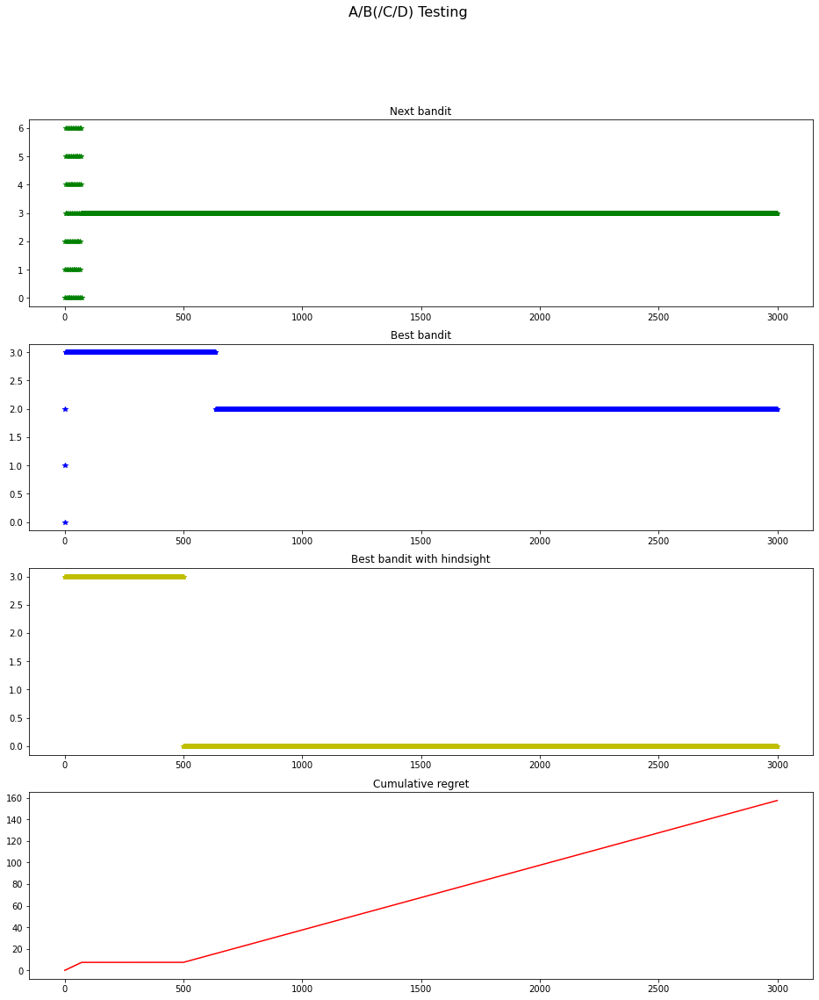

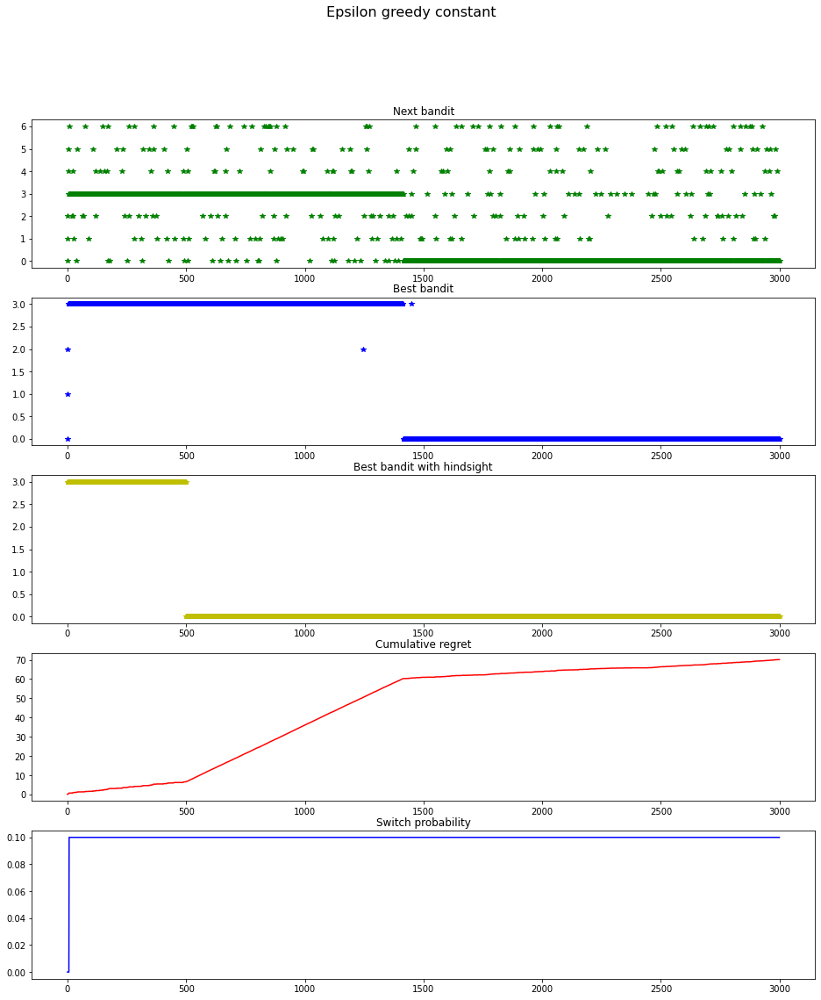

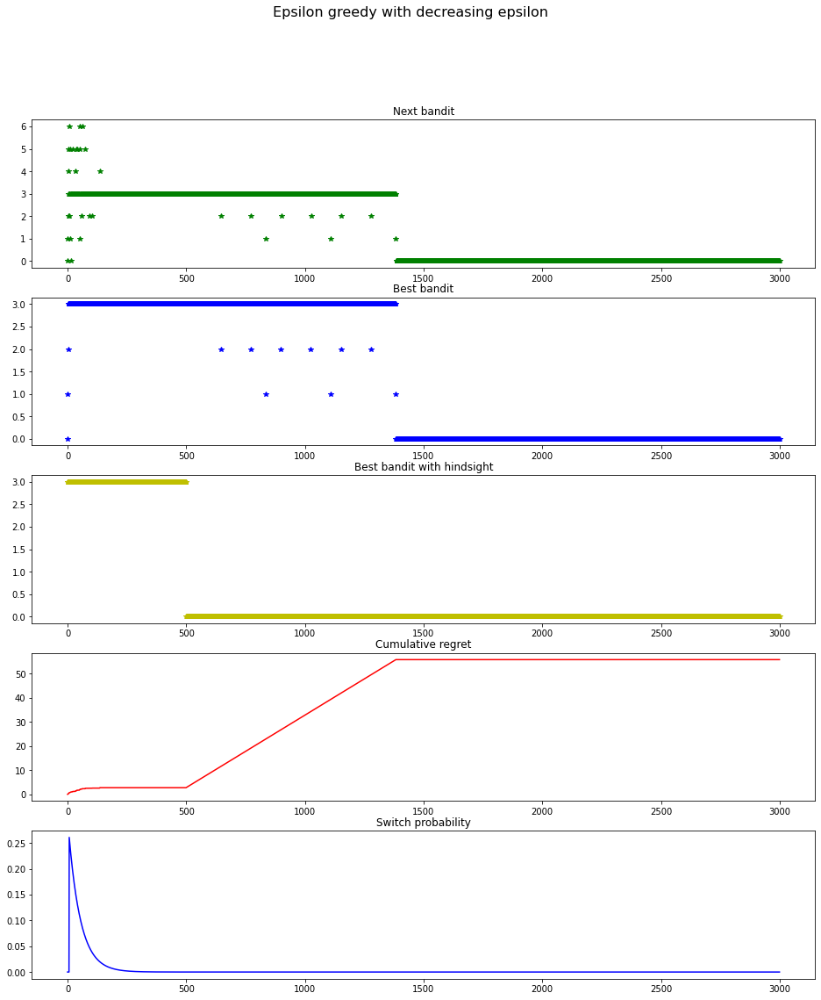

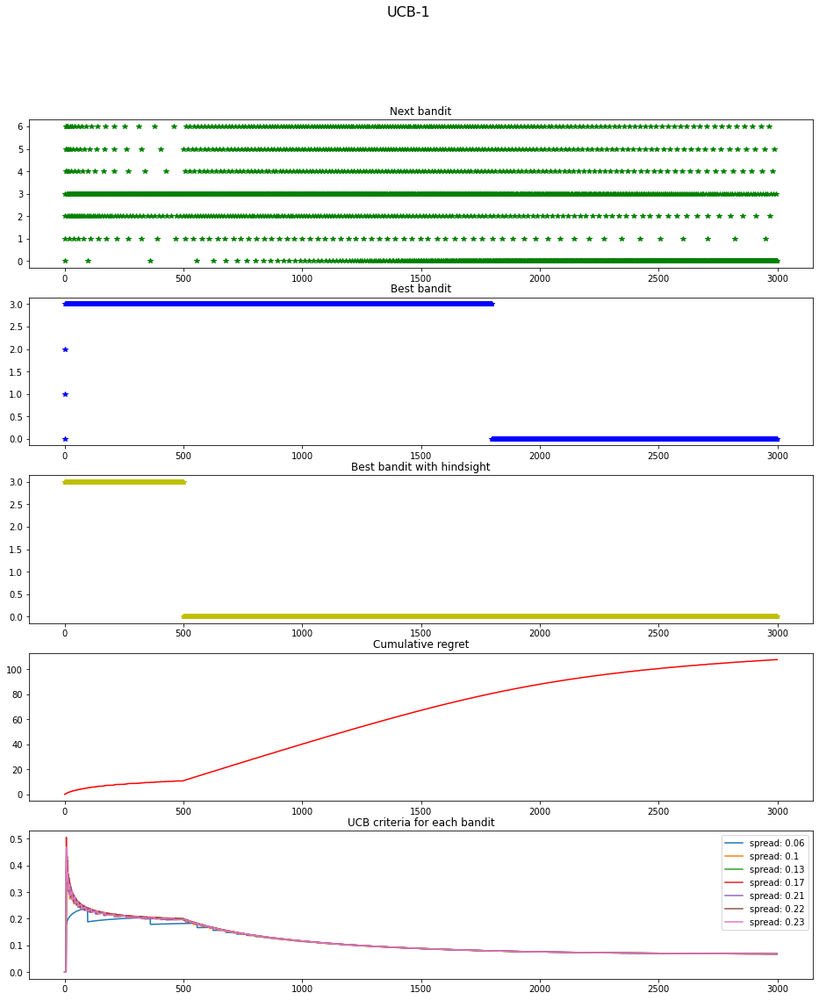

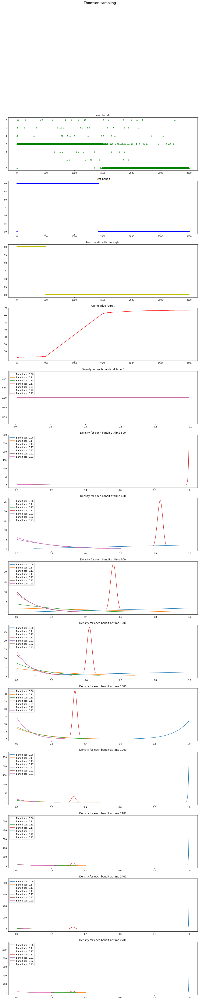

In [224]:
plot_stories(benchworks)

## Periodic quotes

In [225]:
CBC = BankQuote(mu = lambda t: 1.9*(1+np.sin(6*t/300))/2, var = lambda t: 0.0001)

In [226]:
bnpp_bid = BNPPbid(0.01, competitors=[CBC])

In [227]:
benchworks = setup_benchworks(bid_bnpp=bnpp_bid, spreads_bandit=spreads_bandit, time_horizon=3000)

Spreads bandit: [0.06, 0.1, 0.13, 0.17, 0.21, 0.22, 0.23]
Time testing: 70
Time total: 3000


In [228]:
run_benchworks(benchworks)

epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9034019152878835
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6236722070556089
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11474597295337519
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5736794866722859
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9325954630371636
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1242709619721647
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.56103021925571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.13645522566068502
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1954294811093188
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8289808995501787
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6692328934531846
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06653648135411494
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16540611484625978
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20351032104794942
epsilon-gr

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8284681480854713
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22449347883595772
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4097312611340205
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.605896361217858
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8433232139195225
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.64990115308969
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9275809425975434
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16773668505027162
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9466766792396476
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6503981324841198
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3301155521990743
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21446778083069262
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7423834297071017
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04345154171497678
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5530484023142148
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.85348392

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8457945986780431
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.895458560968348
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8041512868937258
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32015086907771717
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8237305773321081
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.020501196351477513
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16847697164644715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.740781813019585
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7292466144453952
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4283352137597225
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5141582677561877
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7296233785681803
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2572147484534554
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22487497996736572
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2971877941967276
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.183961

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4106010091955299
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7091404544851396
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0274479567015824
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29394195703698267
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.968276124042961
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.41788957116757786
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1034666916559418
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.807816266995279
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.938057363561362
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7872035370797424
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47894965124549393
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.03726750658814215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3920096599297035
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14586258326241397
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.42032924958065543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.278546

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6705308529900654
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8443352500831156
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9574640379521862
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9180777884851582
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.22094638316433235
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7037864359453778
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.888961649120884
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.36830357767477284
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4300280555930357
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.43101068781621743
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.27627638266452226
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8623752135825575
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1908699211658358
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47494313911358943
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6456374067585068
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.58632

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19649558889318763
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5679370981930806
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9182399253423427
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24779472104542355
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23671095937356423
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6435626581159667
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5078446622043801
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7086201999149605
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4250973171861433
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2224761852573739
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8103364447805967
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8691505460822301
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24153498164877307
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21841277373283496
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4923023629179454
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7083

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9854800691411797
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6926232341110075
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.46514409447181104
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19541168660223351
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35923086081894506
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.34250785407216344
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1449582009342535
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5474583456480139
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39589262219838894
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7810099548120587
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05017834064515325
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7236354018981688
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6121658237187495
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.005565938266327897
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8261169332518337
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9165246341515456
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11372310463696012
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2657390021387015
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7555503151720289
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14911408469467524
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2548414648653653
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48403491377248853
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.516851982336837
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4401072796287715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8268506674976318
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7822770691269161
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6407746356967806
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.388697476442215
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5776637633445875
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6025343300458812
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.03101476

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5233456779150035
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6861592937623179
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9669419881418222
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4141357165616236
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6410745784570447
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.372268168380227
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20666358741747204
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8686302181722676
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2340609966070516
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9149621386522453
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6388768694369079
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5891502614558124
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5732584545185546
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7165200115098929
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7646240503280777
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.806638060

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9864692007565729
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6503387286538115
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17808176175239177
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.01430372404506397
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9462832204865914
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9861441218228651
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7236468478215909
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5471939194129785
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9552475403571912
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3231087001010581
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6977344953499138
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20238276782510378
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8909133695841571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.31439595203236315
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.041680693226723076
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.417

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8220595483116003
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5560639016911093
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.48052492980327843
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.018065965530600137
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45462089624755686
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.39283801036767596
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5346060823099194
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2981772063077005
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9640268120102602
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9767587745881532
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4123386469465853
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05082482842524261
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14373495378142465
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7020211929139465
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.37527379083204804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24003547946491788
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2547834400923634
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9124578652363067
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4509707722892169
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4889078119647594
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.030364635608484902
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0759724935995919
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30981699682080577
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23491449199362424
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5157312425179088
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2748627179716038
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9453125929387715
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6523870504205648
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5046628612169228
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5722128794851141
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5264

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9262903265054484
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35413021210990603
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9614723510536997
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.0830689128196972
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14914341985329194
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7888442713947094
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5558424905304515
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8928058279200518
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5853169161701212
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4832337926331808
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20710562416563194
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5632409504585043
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8078932963783106
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7528965514636775
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6721174155728804
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.153625

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6809501772942258
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7586545187712459
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8623436712914168
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8248696453300406
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.15883371406574032
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8459757141250889
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5872138548233766
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5929344592580947
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3743853129612952
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.05012356851861066
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9748789284430562
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6681034599864132
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9544361705520169
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23430936394940072
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8884866079006785
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.679873

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9907576026991639
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5295753361256381
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4605416798329397
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.53263656866915
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.007039033021094543
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4769402515363279
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1451866683620906
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5147570320900487
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8843493648423351
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8386105006365256
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4765378921464273
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4172121176277842
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.30672744830501675
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6957999589373018
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7155329010750141
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.29688901

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9476839525401771
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.1898702203807009
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.20247293551989576
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.47439950768445016
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32399613494941937
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6407077147450565
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5777916114433913
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9871656241692152
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17416026571325283
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4456857442146417
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4170495898105163
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04693731593426498
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.06609279122420941
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4188879196618792
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4326041345354288
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.407

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3550804009158982
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8315036831049815
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7894459563738354
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.10191330608286853
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6441356360233219
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.878592362557007
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6896267235722998
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8871480390320904
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.44288964352754745
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8589798788872982
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3590806303992419
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6072155781302575
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08730461149800972
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.14365504947569874
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5695512558721625
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.152048

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.24194206239712746
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6454865757106665
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.18847174859656035
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.38824197762074
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6500548292990548
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.35306419665318367
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5592937599409985
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9162229809902742
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5124017177720069
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8985069192911865
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7229781964843571
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21373925711370367
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45281687118863734
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.19330015552966384
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4991404184286614
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.96842

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32183098089183315
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.90072837933332
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8415458402540823
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04267096425354555
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09842551272770417
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.23661677617140775
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8947489732173806
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9665768469825318
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8684285847423887
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.21389125930413122
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3358857553001623
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8993752910285442
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6497545744934171
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16429952043240748
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8510136707701802
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.86364

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5295925870693048
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2036336754053658
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8640980045735138
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2624931389392565
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3715399709224638
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.837275066567501
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4574678930175591
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.301599264045618
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9736676041105443
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.07562968764375844
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.32277974854222957
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.04461138088639738
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.17169946811508918
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45772205837829216
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.2884027309768211
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.899955

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.3938405733133207
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.4084512093663095
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7172160178677531
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.16098459733497128
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.11943380075444943
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.835765863084349
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7899959846371707
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6796857445693909
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.03975022709986076
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8531662848662648
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.9253975675759473
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8738155885944144
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5608609414364435
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5103989809296055
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7001125469678531
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.8529502

epsilon-greedy
epsilon: 0.1
sample_uniform: 0.08205013840265851
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.55675570467237
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.047704862741925425
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.40139412431446375
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7473533969791948
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.6688165635455022
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.28968634999412524
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5719350869646147
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.45069044924458423
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.7441601127553462
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.936980955799366
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5956296231041338
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5875004202015288
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.09491002092186973
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.5813405188484606
epsilon-greedy
epsilon: 0.1
sample_uniform: 0.59233

epsilon-greedy
epsilon: 0.06431433042809338
sample_uniform: 0.4064828689770863
epsilon-greedy
epsilon: 0.06304082136022941
sample_uniform: 0.4069219941293579
epsilon-greedy
epsilon: 0.06179252946146503
sample_uniform: 0.6973688756131394
epsilon-greedy
epsilon: 0.060568955398396615
sample_uniform: 0.8883864343953859
epsilon-greedy
epsilon: 0.05936960972508439
sample_uniform: 0.2282057333504841
epsilon-greedy
epsilon: 0.05819401268726757
sample_uniform: 0.34195283630245243
epsilon-greedy
epsilon: 0.05704169403045616
sample_uniform: 0.37192212166768723
epsilon-greedy
epsilon: 0.05591219281182299
sample_uniform: 0.16994071421725776
epsilon-greedy
epsilon: 0.0548050572158204
sample_uniform: 0.34244064113481054
epsilon-greedy
epsilon: 0.05371984437344796
sample_uniform: 0.5096132942175586
epsilon-greedy
epsilon: 0.052656120185099055
sample_uniform: 0.639126848719905
epsilon-greedy
epsilon: 0.05161345914691516
sample_uniform: 0.579360540297233
epsilon-greedy
epsilon: 0.05059144418057865
sampl

epsilon-greedy
epsilon: 0.007566892450568163
sample_uniform: 0.15620152606605864
epsilon-greedy
epsilon: 0.007417057941101816
sample_uniform: 0.7048706468084478
epsilon-greedy
epsilon: 0.0072701903537073335
sample_uniform: 0.16364655501183378
epsilon-greedy
epsilon: 0.0071262309393914985
sample_uniform: 0.6286580589806621
epsilon-greedy
epsilon: 0.0069851221124691025
sample_uniform: 0.3654107768178223
epsilon-greedy
epsilon: 0.006846807427527894
sample_uniform: 0.7069237621999881
epsilon-greedy
epsilon: 0.00671123155684968
sample_uniform: 0.25378803554315577
epsilon-greedy
epsilon: 0.006578340268278486
sample_uniform: 0.02349555630188449
epsilon-greedy
epsilon: 0.006448080403526977
sample_uniform: 0.11321320412742975
epsilon-greedy
epsilon: 0.00632039985691243
sample_uniform: 0.8320777284427728
epsilon-greedy
epsilon: 0.00619524755451377
sample_uniform: 0.4899395166937228
epsilon-greedy
epsilon: 0.0060725734337413175
sample_uniform: 0.6691121250404869
epsilon-greedy
epsilon: 0.00595232

epsilon-greedy
epsilon: 0.0008384355825110531
sample_uniform: 0.6519758207707419
epsilon-greedy
epsilon: 0.0008218334456305105
sample_uniform: 0.6317444085013915
epsilon-greedy
epsilon: 0.0008055600530861461
sample_uniform: 0.7322707347562686
epsilon-greedy
epsilon: 0.0007896088953039595
sample_uniform: 0.31793589107511533
epsilon-greedy
epsilon: 0.0007739735916081539
sample_uniform: 0.6947459923366617
epsilon-greedy
epsilon: 0.0007586478876687767
sample_uniform: 0.8519762580648814
epsilon-greedy
epsilon: 0.0007436256529999075
sample_uniform: 0.7778206109003843
epsilon-greedy
epsilon: 0.0007289008785073792
sample_uniform: 0.7590540122163353
epsilon-greedy
epsilon: 0.0007144676740850612
sample_uniform: 0.7557428557962304
epsilon-greedy
epsilon: 0.0007003202662587406
sample_uniform: 0.20771804006298766
epsilon-greedy
epsilon: 0.0006864529958766507
sample_uniform: 0.6241797232639109
epsilon-greedy
epsilon: 0.000672860315845741
sample_uniform: 0.14127933264100168
epsilon-greedy
epsilon: 0.

epsilon-greedy
epsilon: 9.106174142366003e-05
sample_uniform: 0.27640421986037034
epsilon-greedy
epsilon: 8.92585981324744e-05
sample_uniform: 0.8866478145458545
epsilon-greedy
epsilon: 8.749115947067211e-05
sample_uniform: 0.7335170182530933
epsilon-greedy
epsilon: 8.575871843922261e-05
sample_uniform: 0.3794019439968851
epsilon-greedy
epsilon: 8.40605820386136e-05
sample_uniform: 0.7087611375080665
epsilon-greedy
epsilon: 8.239607099164276e-05
sample_uniform: 0.2901207376923213
epsilon-greedy
epsilon: 8.076451947169735e-05
sample_uniform: 0.9921992236899375
epsilon-greedy
epsilon: 7.916527483641538e-05
sample_uniform: 0.7967015799841431
epsilon-greedy
epsilon: 7.759769736661905e-05
sample_uniform: 0.8452465332465563
epsilon-greedy
epsilon: 7.606116001041912e-05
sample_uniform: 0.6028742701114563
epsilon-greedy
epsilon: 7.455504813238555e-05
sample_uniform: 0.5030650485510998
epsilon-greedy
epsilon: 7.307875926768564e-05
sample_uniform: 0.3724874069369445
epsilon-greedy
epsilon: 7.163

epsilon-greedy
epsilon: 9.694296798133099e-06
sample_uniform: 0.18489489054732733
epsilon-greedy
epsilon: 9.50233686017199e-06
sample_uniform: 0.8516296143866011
epsilon-greedy
epsilon: 9.314177983654452e-06
sample_uniform: 0.2761986897941914
epsilon-greedy
epsilon: 9.129744902521087e-06
sample_uniform: 0.7826356482727505
epsilon-greedy
epsilon: 8.948963841080285e-06
sample_uniform: 0.7881763786137156
epsilon-greedy
epsilon: 8.771762484497024e-06
sample_uniform: 0.05595335088496012
epsilon-greedy
epsilon: 8.59806994986594e-06
sample_uniform: 0.6864613759880351
epsilon-greedy
epsilon: 8.427816757857278e-06
sample_uniform: 0.24155449014718622
epsilon-greedy
epsilon: 8.260934804924146e-06
sample_uniform: 0.5388039652149142
epsilon-greedy
epsilon: 8.097357336060253e-06
sample_uniform: 0.41588860670921113
epsilon-greedy
epsilon: 7.937018918096985e-06
sample_uniform: 0.6103462184166267
epsilon-greedy
epsilon: 7.779855413529273e-06
sample_uniform: 0.7190059624284972
epsilon-greedy
epsilon: 7.

epsilon-greedy
epsilon: 9.915734576620193e-07
sample_uniform: 0.9909430662723419
epsilon-greedy
epsilon: 9.71938987686502e-07
sample_uniform: 0.8464307517046127
epsilon-greedy
epsilon: 9.526933062654205e-07
sample_uniform: 0.12198669159106867
epsilon-greedy
epsilon: 9.338287148695919e-07
sample_uniform: 0.10338907211225601
epsilon-greedy
epsilon: 9.153376674109267e-07
sample_uniform: 0.08751267646507155
epsilon-greedy
epsilon: 8.972127672238891e-07
sample_uniform: 0.13387512830667125
epsilon-greedy
epsilon: 8.794467641067392e-07
sample_uniform: 0.20164191797824438
epsilon-greedy
epsilon: 8.620325514213451e-07
sample_uniform: 0.3095952620344884
epsilon-greedy
epsilon: 8.449631632504401e-07
sample_uniform: 0.16180487504828367
epsilon-greedy
epsilon: 8.282317716111596e-07
sample_uniform: 0.17514595033260416
epsilon-greedy
epsilon: 8.118316837237626e-07
sample_uniform: 0.7159658738810409
epsilon-greedy
epsilon: 7.957563393344217e-07
sample_uniform: 0.47106841447811587
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 1.0347117097699002e-07
sample_uniform: 0.7434429422078918
epsilon-greedy
epsilon: 1.0142230451714209e-07
sample_uniform: 0.7268736210115069
epsilon-greedy
epsilon: 9.941400833141647e-08
sample_uniform: 0.16786323798738145
epsilon-greedy
epsilon: 9.744547907456119e-08
sample_uniform: 0.9623217324298701
epsilon-greedy
epsilon: 9.551592930862593e-08
sample_uniform: 0.06941008089010436
epsilon-greedy
epsilon: 9.3624587187977e-08
sample_uniform: 0.09302476421074624
epsilon-greedy
epsilon: 9.177069615054774e-08
sample_uniform: 0.922334280477969
epsilon-greedy
epsilon: 8.995351461520427e-08
sample_uniform: 0.4378739839332991
epsilon-greedy
epsilon: 8.817231568510309e-08
sample_uniform: 0.5915565933183778
epsilon-greedy
epsilon: 8.642638685692235e-08
sample_uniform: 0.24849664152232043
epsilon-greedy
epsilon: 8.471502973585172e-08
sample_uniform: 0.2373489284617889
epsilon-greedy
epsilon: 8.30375597562242e-08
sample_uniform: 0.9122179514650498
epsilon-greedy
epsilon: 8.

epsilon-greedy
epsilon: 1.0373899960797559e-08
sample_uniform: 0.6621188950507615
epsilon-greedy
epsilon: 1.0168482978590773e-08
sample_uniform: 0.18965835460419744
epsilon-greedy
epsilon: 9.967133525157003e-09
sample_uniform: 0.7892428138864009
epsilon-greedy
epsilon: 9.76977105803018e-09
sample_uniform: 0.42222630618649404
epsilon-greedy
epsilon: 9.57631662959189e-09
sample_uniform: 0.1109682741944037
epsilon-greedy
epsilon: 9.386692855491391e-09
sample_uniform: 0.9986269028304342
epsilon-greedy
epsilon: 9.200823883690664e-09
sample_uniform: 0.18217274248089088
epsilon-greedy
epsilon: 9.018635364122701e-09
sample_uniform: 0.7814864322682716
epsilon-greedy
epsilon: 8.840054418950462e-09
sample_uniform: 0.8081032535021921
epsilon-greedy
epsilon: 8.665009613414765e-09
sample_uniform: 0.3865241471052798
epsilon-greedy
epsilon: 8.493430927259438e-09
sample_uniform: 0.9423175802604304
epsilon-greedy
epsilon: 8.325249726722268e-09
sample_uniform: 0.9843796880759197
epsilon-greedy
epsilon: 8

epsilon-greedy
epsilon: 1.0610861280365222e-09
sample_uniform: 0.6980070825669781
epsilon-greedy
epsilon: 1.0400752149656014e-09
sample_uniform: 0.4755068463344896
epsilon-greedy
epsilon: 1.0194803458485213e-09
sample_uniform: 0.8611284558490331
epsilon-greedy
epsilon: 9.992932824630332e-10
sample_uniform: 0.7635159854409751
epsilon-greedy
epsilon: 9.795059497146182e-10
sample_uniform: 0.15461120428852648
epsilon-greedy
epsilon: 9.601104324063426e-10
sample_uniform: 0.2279157800971554
epsilon-greedy
epsilon: 9.410989720726724e-10
sample_uniform: 0.9787241639301458
epsilon-greedy
epsilon: 9.224639638759818e-10
sample_uniform: 0.7217788399522224
epsilon-greedy
epsilon: 9.041979535645285e-10
sample_uniform: 0.5363498380936915
epsilon-greedy
epsilon: 8.862936344906342e-10
sample_uniform: 0.5466295105395328
epsilon-greedy
epsilon: 8.687438446879424e-10
sample_uniform: 0.4912367418344006
epsilon-greedy
epsilon: 8.515415640065315e-10
sample_uniform: 0.07874771779453926
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 1.0638326828724852e-10
sample_uniform: 0.3394175173310443
epsilon-greedy
epsilon: 1.0427673843719766e-10
sample_uniform: 0.5876421369047721
epsilon-greedy
epsilon: 1.0221192067289673e-10
sample_uniform: 0.7654182788179712
epsilon-greedy
epsilon: 1.0018798903970873e-10
sample_uniform: 0.2454436319800527
epsilon-greedy
epsilon: 9.820413393799427e-11
sample_uniform: 0.8855005263577276
epsilon-greedy
epsilon: 9.625956179926094e-11
sample_uniform: 0.08896437331556595
epsilon-greedy
epsilon: 9.435349476872525e-11
sample_uniform: 0.287515936239372
epsilon-greedy
epsilon: 9.248517039416039e-11
sample_uniform: 0.6634865636058497
epsilon-greedy
epsilon: 9.065384132090494e-11
sample_uniform: 0.2510770383051464
epsilon-greedy
epsilon: 8.885877499291217e-11
sample_uniform: 0.3679795807088736
epsilon-greedy
epsilon: 8.709925335971604e-11
sample_uniform: 0.3197387162695866
epsilon-greedy
epsilon: 8.537457258920264e-11
sample_uniform: 0.49658738462587204
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 1.0665863469932384e-11
sample_uniform: 0.2522906897392595
epsilon-greedy
epsilon: 1.0454665222898712e-11
sample_uniform: 0.9277576750021491
epsilon-greedy
epsilon: 1.0247648981351557e-11
sample_uniform: 0.7457479273100031
epsilon-greedy
epsilon: 1.0044731936034125e-11
sample_uniform: 0.7970802126238928
epsilon-greedy
epsilon: 9.845832917422649e-12
sample_uniform: 0.5443092149117064
epsilon-greedy
epsilon: 9.650872363257665e-12
sample_uniform: 0.13906692681735155
epsilon-greedy
epsilon: 9.459772286717996e-12
sample_uniform: 0.03112515271128735
epsilon-greedy
epsilon: 9.272456245224995e-12
sample_uniform: 0.5255832617873907
epsilon-greedy
epsilon: 9.088849309864482e-12
sample_uniform: 0.8070712054102304
epsilon-greedy
epsilon: 8.908878035414187e-12
sample_uniform: 0.6115952765452569
epsilon-greedy
epsilon: 8.732470430964651e-12
sample_uniform: 0.8537450038397177
epsilon-greedy
epsilon: 8.559555931122026e-12
sample_uniform: 0.7649919857873496
epsilon-greedy
epsilon

epsilon-greedy
epsilon: 1.135471872922307e-12
sample_uniform: 0.7518503933049937
epsilon-greedy
epsilon: 1.1129880234155823e-12
sample_uniform: 0.6782307424891111
epsilon-greedy
epsilon: 1.0909493839582624e-12
sample_uniform: 0.6678591817645192
epsilon-greedy
epsilon: 1.0693471388007113e-12
sample_uniform: 0.26000038122409896
epsilon-greedy
epsilon: 1.0481726467568323e-12
sample_uniform: 0.8455224889277915
epsilon-greedy
epsilon: 1.0274174377474777e-12
sample_uniform: 0.037442140933218626
epsilon-greedy
epsilon: 1.0070732094123003e-12
sample_uniform: 0.5441458888720906
epsilon-greedy
epsilon: 9.871318237887132e-13
sample_uniform: 0.12743344803259316
epsilon-greedy
epsilon: 9.67585304056575e-13
sample_uniform: 0.035131638143252375
epsilon-greedy
epsilon: 9.484258313473687e-13
sample_uniform: 0.07653879164135657
epsilon-greedy
epsilon: 9.296457416165477e-13
sample_uniform: 0.3359331069715654
epsilon-greedy
epsilon: 9.11237522577815e-13
sample_uniform: 0.1386156538744331
epsilon-greedy
ep

epsilon-greedy
epsilon: 1.1614083976966402e-13
sample_uniform: 0.422714098130482
epsilon-greedy
epsilon: 1.1384109705895676e-13
sample_uniform: 0.8009776707177322
epsilon-greedy
epsilon: 1.1158689230497503e-13
sample_uniform: 0.7137114784821496
epsilon-greedy
epsilon: 1.0937732379576035e-13
sample_uniform: 0.05838525370654912
epsilon-greedy
epsilon: 1.0721150767444773e-13
sample_uniform: 0.47576833411843455
epsilon-greedy
epsilon: 1.0508857758571074e-13
sample_uniform: 0.8652770973079067
epsilon-greedy
epsilon: 1.0300768432920772e-13
sample_uniform: 0.4674897736064698
epsilon-greedy
epsilon: 1.009679955198905e-13
sample_uniform: 0.5389347646119398
epsilon-greedy
epsilon: 9.896869525503913e-14
sample_uniform: 0.712922452765022
epsilon-greedy
epsilon: 9.700898378788962e-14
sample_uniform: 0.9834807752340736
epsilon-greedy
epsilon: 9.508807720772598e-14
sample_uniform: 0.22944644561811978
epsilon-greedy
epsilon: 9.320520712630336e-14
sample_uniform: 0.07435701562132546
epsilon-greedy
epsi

epsilon-greedy
epsilon: 1.2119352929789913e-14
sample_uniform: 0.6034983251178149
epsilon-greedy
epsilon: 1.1879373663116417e-14
sample_uniform: 0.24930019510229862
epsilon-greedy
epsilon: 1.1644146304301925e-14
sample_uniform: 0.4070635376858115
epsilon-greedy
epsilon: 1.141357675926651e-14
sample_uniform: 0.02774198982040954
epsilon-greedy
epsilon: 1.1187572797117812e-14
sample_uniform: 0.3720854083359151
epsilon-greedy
epsilon: 1.0966044013257631e-14
sample_uniform: 0.5766094687080093
epsilon-greedy
epsilon: 1.0748901793218621e-14
sample_uniform: 0.8152420143909859
epsilon-greedy
epsilon: 1.05360592772175e-14
sample_uniform: 0.32325887148524823
epsilon-greedy
epsilon: 1.032743132540993e-14
sample_uniform: 0.6546019175122236
epsilon-greedy
epsilon: 1.0122934483833443e-14
sample_uniform: 0.3640869746706169
epsilon-greedy
epsilon: 9.922486951024748e-15
sample_uniform: 0.6100125450402433
epsilon-greedy
epsilon: 9.726008545298054e-15
sample_uniform: 0.5830678973117582
epsilon-greedy
epsi

epsilon-greedy
epsilon: 1.264660353137657e-15
sample_uniform: 0.03139428713910741
epsilon-greedy
epsilon: 1.239618400329189e-15
sample_uniform: 0.7958362469842174
epsilon-greedy
epsilon: 1.2150723114093097e-15
sample_uniform: 0.3791031494328734
epsilon-greedy
epsilon: 1.1910122676151828e-15
sample_uniform: 0.18807492438462758
epsilon-greedy
epsilon: 1.1674286446084686e-15
sample_uniform: 0.8845956925312461
epsilon-greedy
epsilon: 1.1443120086255208e-15
sample_uniform: 0.8272563226616693
epsilon-greedy
epsilon: 1.1216531127037285e-15
sample_uniform: 0.047755919614188125
epsilon-greedy
epsilon: 1.0994428929825835e-15
sample_uniform: 0.5309086949370089
epsilon-greedy
epsilon: 1.0776724650780737e-15
sample_uniform: 0.3954852745114503
epsilon-greedy
epsilon: 1.056333120528745e-15
sample_uniform: 0.479116694221718
epsilon-greedy
epsilon: 1.0354163233122649e-15
sample_uniform: 0.3709608282259318
epsilon-greedy
epsilon: 1.0149137064308374e-15
sample_uniform: 0.48385443992373467
epsilon-greedy


epsilon-greedy
epsilon: 1.4295914205897263e-16
sample_uniform: 0.6472314847807218
epsilon-greedy
epsilon: 1.401283613832775e-16
sample_uniform: 0.17689192670731224
epsilon-greedy
epsilon: 1.3735363392053774e-16
sample_uniform: 0.19459008547742618
epsilon-greedy
epsilon: 1.346338497427724e-16
sample_uniform: 0.21397962652931923
epsilon-greedy
epsilon: 1.3196792090004709e-16
sample_uniform: 0.4102638273095591
epsilon-greedy
epsilon: 1.2935478098527657e-16
sample_uniform: 0.7844429421410974
epsilon-greedy
epsilon: 1.267933847076545e-16
sample_uniform: 0.7610347517616907
epsilon-greedy
epsilon: 1.242827074745156e-16
sample_uniform: 0.4408575078203115
epsilon-greedy
epsilon: 1.2182174498149222e-16
sample_uniform: 0.731466074136207
epsilon-greedy
epsilon: 1.194095128107722e-16
sample_uniform: 0.873388929130725
epsilon-greedy
epsilon: 1.1704504603732535e-16
sample_uniform: 0.16901950021693735
epsilon-greedy
epsilon: 1.1472739884291405e-16
sample_uniform: 0.05150826306589529
epsilon-greedy
eps

epsilon-greedy
epsilon: 1.681983541747665e-17
sample_uniform: 0.533984411036067
epsilon-greedy
epsilon: 1.648678036144865e-17
sample_uniform: 0.0101765874038936
epsilon-greedy
epsilon: 1.6160320237391784e-17
sample_uniform: 0.690284472723349
epsilon-greedy
epsilon: 1.58403244569038e-17
sample_uniform: 0.5900253912217196
epsilon-greedy
epsilon: 1.5526665017405605e-17
sample_uniform: 0.4801494924585763
epsilon-greedy
epsilon: 1.5219216450939334e-17
sample_uniform: 0.326831272169544
epsilon-greedy
epsilon: 1.491785577397914e-17
sample_uniform: 0.08135127507241202
epsilon-greedy
epsilon: 1.4622462438235825e-17
sample_uniform: 0.7015184359634477
epsilon-greedy
epsilon: 1.4332918282436676e-17
sample_uniform: 0.4233610419587811
epsilon-greedy
epsilon: 1.4049107485058527e-17
sample_uniform: 0.34121344476464865
epsilon-greedy
epsilon: 1.3770916517998426e-17
sample_uniform: 0.4738304328777647
epsilon-greedy
epsilon: 1.3498234101160099e-17
sample_uniform: 0.14490324630934126
epsilon-greedy
epsilo

epsilon-greedy
epsilon: 1.826787335274606e-18
sample_uniform: 0.7319699555016969
epsilon-greedy
epsilon: 1.7906145224497586e-18
sample_uniform: 0.7615771243283874
epsilon-greedy
epsilon: 1.7551579793090573e-18
sample_uniform: 0.14865107107279474
epsilon-greedy
epsilon: 1.7204035227624978e-18
sample_uniform: 0.7330442433374941
epsilon-greedy
epsilon: 1.6863372505640756e-18
sample_uniform: 0.4593491996639584
epsilon-greedy
epsilon: 1.652945535750663e-18
sample_uniform: 0.7303749742449928
epsilon-greedy
epsilon: 1.6202150211911301e-18
sample_uniform: 0.3171502288187793
epsilon-greedy
epsilon: 1.5881326142432172e-18
sample_uniform: 0.2556715976738413
epsilon-greedy
epsilon: 1.5566854815163967e-18
sample_uniform: 0.4314657226209515
epsilon-greedy
epsilon: 1.5258610437382547e-18
sample_uniform: 0.07296924309094921
epsilon-greedy
epsilon: 1.4956469707226935e-18
sample_uniform: 0.7098726530643379
epsilon-greedy
epsilon: 1.4660311764376578e-18
sample_uniform: 0.16425603095570418
epsilon-greedy


epsilon-greedy
epsilon: 1.9062614397977096e-19
sample_uniform: 0.9706959005568504
epsilon-greedy
epsilon: 1.8685149342655343e-19
sample_uniform: 0.2608121146173278
epsilon-greedy
epsilon: 1.831515859620943e-19
sample_uniform: 0.3270158870035157
epsilon-greedy
epsilon: 1.7952494157407245e-19
sample_uniform: 0.4536564444979472
epsilon-greedy
epsilon: 1.7597010955637926e-19
sample_uniform: 0.5482910531541949
epsilon-greedy
epsilon: 1.724856679288068e-19
sample_uniform: 0.3102576952255066
epsilon-greedy
epsilon: 1.6907022286824542e-19
sample_uniform: 0.11819476775728321
epsilon-greedy
epsilon: 1.6572240815113228e-19
sample_uniform: 0.9394851518940732
epsilon-greedy
epsilon: 1.6244088460693998e-19
sample_uniform: 0.8511420043460687
epsilon-greedy
epsilon: 1.5922433958249892e-19
sample_uniform: 0.7761651870464654
epsilon-greedy
epsilon: 1.5607148641690922e-19
sample_uniform: 0.2805406283040377
epsilon-greedy
epsilon: 1.5298106392686832e-19
sample_uniform: 0.7851535929136034
epsilon-greedy
ep

epsilon-greedy
epsilon: 1.8733514678825364e-20
sample_uniform: 0.69545596023326
epsilon-greedy
epsilon: 1.8362566234557188e-20
sample_uniform: 0.786776603061148
epsilon-greedy
epsilon: 1.799896306162045e-20
sample_uniform: 0.6926415475022624
epsilon-greedy
epsilon: 1.7642559713897605e-20
sample_uniform: 0.11082236766798415
epsilon-greedy
epsilon: 1.729321362529771e-20
sample_uniform: 0.815599752045762
epsilon-greedy
epsilon: 1.6950785052727066e-20
sample_uniform: 0.4395413996018077
epsilon-greedy
epsilon: 1.6615137020190995e-20
sample_uniform: 0.948802739242579
epsilon-greedy
epsilon: 1.6286135264001235e-20
sample_uniform: 0.6442861020654506
epsilon-greedy
epsilon: 1.5963648179068322e-20
sample_uniform: 0.4420486857678002
epsilon-greedy
epsilon: 1.5647546766258633e-20
sample_uniform: 0.771452121552353
epsilon-greedy
epsilon: 1.5337704580792074e-20
sample_uniform: 0.9654649846139978
epsilon-greedy
epsilon: 1.5033997681663393e-20
sample_uniform: 0.7404754460168557
epsilon-greedy
epsilon:

epsilon-greedy
epsilon: 1.994341954474523e-21
sample_uniform: 0.814601427050331
epsilon-greedy
epsilon: 1.9548513378959365e-21
sample_uniform: 0.33045799157464373
epsilon-greedy
epsilon: 1.9161426879175267e-21
sample_uniform: 0.21660912275761912
epsilon-greedy
epsilon: 1.878200520563194e-21
sample_uniform: 0.03649689044388105
epsilon-greedy
epsilon: 1.841009658460107e-21
sample_uniform: 0.10290854779129266
epsilon-greedy
epsilon: 1.804555224767514e-21
sample_uniform: 0.16143144775146967
epsilon-greedy
epsilon: 1.768822637225898e-21
sample_uniform: 0.641333774810901
epsilon-greedy
epsilon: 1.7337976023237757e-21
sample_uniform: 0.9422764064681509
epsilon-greedy
epsilon: 1.6994661095802053e-21
sample_uniform: 0.8655924342021498
epsilon-greedy
epsilon: 1.6658144259403048e-21
sample_uniform: 0.6924706736927222
epsilon-greedy
epsilon: 1.6328290902819475e-21
sample_uniform: 0.9842008506774118
epsilon-greedy
epsilon: 1.600496908031036e-21
sample_uniform: 0.16116871628775598
epsilon-greedy
eps

epsilon-greedy
epsilon: 2.254434671542665e-22
sample_uniform: 0.36330236445486974
epsilon-greedy
epsilon: 2.20979387410288e-22
sample_uniform: 0.7061164489996733
epsilon-greedy
epsilon: 2.166037023677031e-22
sample_uniform: 0.6040248067440377
epsilon-greedy
epsilon: 2.123146616941532e-22
sample_uniform: 0.3734396669124561
epsilon-greedy
epsilon: 2.081105497161824e-22
sample_uniform: 0.8201404070786905
epsilon-greedy
epsilon: 2.0398968473294087e-22
sample_uniform: 0.0984993849456357
epsilon-greedy
epsilon: 1.9995041834349272e-22
sample_uniform: 0.3383098689371836
epsilon-greedy
epsilon: 1.9599113478742165e-22
sample_uniform: 0.20442460401039975
epsilon-greedy
epsilon: 1.9211025029851692e-22
sample_uniform: 0.4889587736638882
epsilon-greedy
epsilon: 1.883062124712344e-22
sample_uniform: 0.25886758799526655
epsilon-greedy
epsilon: 1.8457749963972337e-22
sample_uniform: 0.0392251722870981
epsilon-greedy
epsilon: 1.8092262026913566e-22
sample_uniform: 0.9859543523191932
epsilon-greedy
epsil

epsilon-greedy
epsilon: 2.44852140580336e-23
sample_uniform: 0.8193780056388431
epsilon-greedy
epsilon: 2.4000374335316374e-23
sample_uniform: 0.31913888166055904
epsilon-greedy
epsilon: 2.3525135082342704e-23
sample_uniform: 0.48683331628327153
epsilon-greedy
epsilon: 2.305930619707445e-23
sample_uniform: 0.4673263512577499
epsilon-greedy
epsilon: 2.2602701341746707e-23
sample_uniform: 0.8477565950526875
epsilon-greedy
epsilon: 2.2155137868328873e-23
sample_uniform: 0.18036045596891992
epsilon-greedy
epsilon: 2.1716436745464298e-23
sample_uniform: 0.7952598085771285
epsilon-greedy
epsilon: 2.128642248685411e-23
sample_uniform: 0.6037734806574662
epsilon-greedy
epsilon: 2.0864923081061417e-23
sample_uniform: 0.5989521408350001
epsilon-greedy
epsilon: 2.045176992270398e-23
sample_uniform: 0.34969522247507245
epsilon-greedy
epsilon: 2.004679774500938e-23
sample_uniform: 0.13606284238324562
epsilon-greedy
epsilon: 1.9649844553707127e-23
sample_uniform: 0.2009689151145988
epsilon-greedy
ep

epsilon-greedy
epsilon: 2.6593172782313654e-24
sample_uniform: 0.2031125527871157
epsilon-greedy
epsilon: 2.6066592680241076e-24
sample_uniform: 0.8030533448409167
epsilon-greedy
epsilon: 2.5550439562799983e-24
sample_uniform: 0.7439013152766637
epsilon-greedy
epsilon: 2.5044506961860897e-24
sample_uniform: 0.7583439186387667
epsilon-greedy
epsilon: 2.454859249763795e-24
sample_uniform: 0.19831478181802542
epsilon-greedy
epsilon: 2.4062497797732807e-24
sample_uniform: 0.3379628822684272
epsilon-greedy
epsilon: 2.3586028417784344e-24
sample_uniform: 0.9880210665435305
epsilon-greedy
epsilon: 2.3118993763687737e-24
sample_uniform: 0.088900583848046
epsilon-greedy
epsilon: 2.2661207015353795e-24
sample_uniform: 0.5621404171195777
epsilon-greedy
epsilon: 2.2212485051979617e-24
sample_uniform: 0.44457160183283495
epsilon-greedy
epsilon: 2.1772648378796488e-24
sample_uniform: 0.6742021742404843
epsilon-greedy
epsilon: 2.1341521055270878e-24
sample_uniform: 0.49462310675684207
epsilon-greedy


epsilon-greedy
epsilon: 3.1920218363476406e-25
sample_uniform: 0.16282934005730743
epsilon-greedy
epsilon: 3.1288155691541623e-25
sample_uniform: 0.17067383578841766
epsilon-greedy
epsilon: 3.0668608699064207e-25
sample_uniform: 0.17514058647810693
epsilon-greedy
epsilon: 3.006132955898687e-25
sample_uniform: 0.08393237882080018
epsilon-greedy
epsilon: 2.9466075351555987e-25
sample_uniform: 0.2661764530014822
epsilon-greedy
epsilon: 2.888260796715218e-25
sample_uniform: 0.683202584866529
epsilon-greedy
epsilon: 2.8310694011041597e-25
sample_uniform: 0.5311092276998106
epsilon-greedy
epsilon: 2.7750104710016384e-25
sample_uniform: 0.7209025129424648
epsilon-greedy
epsilon: 2.7200615820881713e-25
sample_uniform: 0.9800604957839145
epsilon-greedy
epsilon: 2.666200754075491e-25
sample_uniform: 0.4568491919361358
epsilon-greedy
epsilon: 2.613406441914277e-25
sample_uniform: 0.29902671279513326
epsilon-greedy
epsilon: 2.561657527175694e-25
sample_uniform: 0.9677591818729023
epsilon-greedy
ep

epsilon-greedy
epsilon: 3.398178706434877e-26
sample_uniform: 0.8727545697101088
epsilon-greedy
epsilon: 3.330890259706721e-26
sample_uniform: 0.6259368402714827
epsilon-greedy
epsilon: 3.2649342134949346e-26
sample_uniform: 0.7913795190307866
epsilon-greedy
epsilon: 3.20028418450156e-26
sample_uniform: 0.9960286801351157
epsilon-greedy
epsilon: 3.13691431185301e-26
sample_uniform: 0.3916318470365717
epsilon-greedy
epsilon: 3.074799246755306e-26
sample_uniform: 0.31581688775308225
epsilon-greedy
epsilon: 3.013914142354152e-26
sample_uniform: 0.27449604477484246
epsilon-greedy
epsilon: 2.954234643796019e-26
sample_uniform: 0.14605968411595704
epsilon-greedy
epsilon: 2.895736878485704e-26
sample_uniform: 0.7018443852942857
epsilon-greedy
epsilon: 2.838397446537143e-26
sample_uniform: 0.7759763260839311
epsilon-greedy
epsilon: 2.782193411412981e-26
sample_uniform: 0.3010639095615255
epsilon-greedy
epsilon: 2.72710229074981e-26
sample_uniform: 0.26133128815407314
epsilon-greedy
epsilon: 2.

epsilon-greedy
epsilon: 3.765289333526135e-27
sample_uniform: 0.6442208491080943
epsilon-greedy
epsilon: 3.690731609338408e-27
sample_uniform: 0.9560965731469736
epsilon-greedy
epsilon: 3.617650227004803e-27
sample_uniform: 0.018138818062013007
epsilon-greedy
epsilon: 3.546015952997978e-27
sample_uniform: 0.49631990627510414
epsilon-greedy
epsilon: 3.4758001326532215e-27
sample_uniform: 0.46720179238240167
epsilon-greedy
epsilon: 3.406974678706122e-27
sample_uniform: 0.9112736664694276
epsilon-greedy
epsilon: 3.3395120600574626e-27
sample_uniform: 0.21188177626709392
epsilon-greedy
epsilon: 3.273385290760224e-27
sample_uniform: 0.13801905842887197
epsilon-greedy
epsilon: 3.208567919225032e-27
sample_uniform: 0.47744359234110934
epsilon-greedy
epsilon: 3.1450340176389826e-27
sample_uniform: 0.6247673171599436
epsilon-greedy
epsilon: 3.0827581715943357e-27
sample_uniform: 0.11268135983303451
epsilon-greedy
epsilon: 3.0217154699223385e-27
sample_uniform: 0.598165837277064
epsilon-greedy
e

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 18]
Wins:
[ 2.  1.  1.  2.  5.  1. 19.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.95      ]
Thompson samples:
[0.03162631 0.07923129 0.02927584 0.12259135 0.20303502 0.12466377
 0.21942221]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 19]
Wins:
[ 2.  1.  1.  2.  5.  1. 20.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.95238095]
Thompson samples:
[0.02071011 0.08095848 0.06794506 0.04273018 0.20759964 0.07053298
 0.22168991]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 20]
Wins:
[ 2.  1.  1.  2.  5.  1. 21.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 40]
Wins:
[ 2.  1.  1.  2.  5.  1. 41.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.97619048]
Thompson samples:
[0.03474039 0.09989035 0.12608415 0.05109695 0.20229243 0.07644625
 0.22473526]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 41]
Wins:
[ 2.  1.  1.  2.  5.  1. 42.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.97674419]
Thompson samples:
[0.02296329 0.08533706 0.03837656 0.08033874 0.16658961 0.15833289
 0.22856347]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 42]
Wins:
[ 2.  1.  1.  2.  5.  1. 43.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 80]
Wins:
[ 2.  1.  1.  2.  5.  1. 81.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.98780488]
Thompson samples:
[0.0492729  0.03260388 0.10009166 0.15272376 0.20241524 0.15446233
 0.22496147]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 81]
Wins:
[ 2.  1.  1.  2.  5.  1. 82.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.98795181]
Thompson samples:
[0.02472192 0.07414664 0.08971498 0.03936307 0.18465822 0.15903955
 0.22556035]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [ 1  0  0  1  4  0 82]
Wins:
[ 2.  1.  1.  2.  5.  1. 83.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5       

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 102]
Wins:
[  2.   1.   1.   2.   5.   1. 103.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99038462]
Thompson samples:
[0.04457512 0.07527947 0.12013733 0.14933499 0.19104253 0.03914854
 0.2267002 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 103]
Wins:
[  2.   1.   1.   2.   5.   1. 104.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99047619]
Thompson samples:
[0.05539844 0.01106075 0.03708104 0.15441861 0.19591014 0.18837427
 0.22878966]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 104]
Wins:
[  2.   1.   1.   2.   5.   1. 105.]
Losses:
[1. 1. 1. 1. 1. 1. 1

[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.992     ]
Thompson samples:
[0.02957749 0.0039272  0.10456853 0.11297153 0.20474001 0.08627229
 0.22994702]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 124]
Wins:
[  2.   1.   1.   2.   5.   1. 125.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99206349]
Thompson samples:
[0.04969996 0.07997678 0.09293314 0.16958241 0.17968983 0.21045878
 0.22988642]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 125]
Wins:
[  2.   1.   1.   2.   5.   1. 126.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99212598]
Thompson samples:
[0.03852105 0.01417301 0.06808573 0.16452296 0.17450754 0.0453123

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 148]
Wins:
[  2.   1.   1.   2.   5.   1. 149.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99333333]
Thompson samples:
[0.03930132 0.0499844  0.06614334 0.1438298  0.2013416  0.09423102
 0.22897273]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 149]
Wins:
[  2.   1.   1.   2.   5.   1. 150.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99337748]
Thompson samples:
[0.02562073 0.05717959 0.10101035 0.16269129 0.14220369 0.19153817
 0.22973713]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 150]
Wins:
[  2.   1.   1.   2.   5.   1. 151.]
Losses:
[1. 1. 1. 1. 1. 1. 1

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 173]
Wins:
[  2.   1.   1.   2.   5.   1. 174.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99428571]
Thompson samples:
[0.02822903 0.08726027 0.1022519  0.07919284 0.16463279 0.19646142
 0.22898667]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 174]
Wins:
[  2.   1.   1.   2.   5.   1. 175.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99431818]
Thompson samples:
[0.02081795 0.05266171 0.03112816 0.08758129 0.20984569 0.09127892
 0.22963623]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 175]
Wins:
[  2.   1.   1.   2.   5.   1. 176.]
Losses:
[1. 1. 1. 1. 1. 1. 1

Thomson sampling.
pnl avg so far:[0.06 0.   0.   0.17 0.21 0.   0.23]
nb of selections so far: [  1   0   0   1   4   0 195]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[1. 1. 1. 1. 1. 1. 1.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.99492386]
Thompson samples:
[0.05287269 0.01876096 0.09550352 0.02714536 0.18659661 0.12336952
 0.22969985]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.21       0.
 0.22882653]
nb of selections so far: [  1   0   0   1   4   0 196]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[1. 1. 1. 1. 1. 1. 2.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.5
 0.98989899]
Thompson samples:
[0.04528375 0.02778441 0.12357006 0.12864817 0.19690341 0.13429516
 0.22728441]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.21       0.
 0.22766497]
nb of selections so far: [  1   0   0   1   4   0 197]
W

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.
 0.20860465]
nb of selections so far: [  1   0   0   1   5   1 215]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[ 1.  1.  1.  1.  2.  2. 21.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.71428571 0.33333333
 0.90322581]
Thompson samples:
[0.03141706 0.05285209 0.03586303 0.13049969 0.15754904 0.18739404
 0.21114999]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.
 0.20763889]
nb of selections so far: [  1   0   0   1   5   1 216]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[ 1.  1.  1.  1.  2.  2. 22.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.71428571 0.33333333
 0.89908257]
Thompson samples:
[0.05707353 0.07093956 0.03857778 0.13559857 0.1329561  0.14794174
 0.20136485]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.
 0.206

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.12       0.
 0.19085106]
nb of selections so far: [  1   0   0   1   7   1 235]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[ 1.  1.  1.  1.  4.  2. 41.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.55555556 0.33333333
 0.82700422]
Thompson samples:
[0.05604617 0.03741243 0.10060628 0.08079648 0.16778432 0.06911231
 0.20130727]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.12       0.
 0.19004237]
nb of selections so far: [  1   0   0   1   7   1 236]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[ 1.  1.  1.  1.  4.  2. 42.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.55555556 0.33333333
 0.82352941]
Thompson samples:
[0.01651146 0.05738322 0.12142374 0.12269075 0.06476776 0.06460106
 0.19340263]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.12       0.
 0.189

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.12       0.
 0.17519531]
nb of selections so far: [  1   0   0   1   7   1 256]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[ 1.  1.  1.  1.  4.  2. 62.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.55555556 0.33333333
 0.75968992]
Thompson samples:
[0.02914724 0.0010168  0.01208517 0.04567083 0.06867339 0.1804455
 0.17321802]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.12       0.
 0.17519531]
nb of selections so far: [  1   0   0   1   7   2 256]
Wins:
[  2.   1.   1.   2.   5.   1. 196.]
Losses:
[ 1.  1.  1.  1.  4.  3. 62.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.55555556 0.25
 0.75968992]
Thompson samples:
[0.04455696 0.01420545 0.11427103 0.12782987 0.10352657 0.17658787
 0.18011132]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.12       0.
 0.17451362]


Thompson samples:
[0.04065663 0.08853513 0.05344525 0.14509118 0.14026806 0.04751655
 0.16637887]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.14       0.07333333
 0.1748    ]
nb of selections so far: [  1   0   0   1   9   3 275]
Wins:
[  2.   1.   1.   2.   7.   2. 210.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.63636364 0.4
 0.75812274]
Thompson samples:
[0.03247271 0.01637811 0.08643946 0.11541246 0.10865961 0.07945987
 0.17076335]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.14       0.07333333
 0.175     ]
nb of selections so far: [  1   0   0   1   9   3 276]
Wins:
[  2.   1.   1.   2.   7.   2. 211.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.63636364 0.4
 0.75899281]
Thompson samples:
[0.02552439 0.06936175 0.01435062 0.13108045 0.15875322 0.08280835
 0.16940224

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1575     0.132
 0.17783505]
nb of selections so far: [  1   0   0   1  12   5 291]
Wins:
[  2.   1.   1.   2.  10.   4. 226.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.71428571 0.57142857
 0.77133106]
Thompson samples:
[0.0517604  0.00214223 0.00379673 0.14121941 0.15039059 0.12769985
 0.18010605]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06      0.        0.        0.17      0.1575    0.132     0.1780137]
nb of selections so far: [  1   0   0   1  12   5 292]
Wins:
[  2.   1.   1.   2.  10.   4. 227.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.71428571 0.57142857
 0.77210884]
Thompson samples:
[0.05524902 0.07451997 0.04959231 0.0641129  0.16907361 0.09199491
 0.18596799]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1575     0.132


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16153846 0.17111111
 0.18071429]
nb of selections so far: [  1   0   0   1  13   9 308]
Wins:
[  2.   1.   1.   2.  11.   8. 243.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.73333333 0.72727273
 0.78387097]
Thompson samples:
[0.05400564 0.01730278 0.12447113 0.10551143 0.15870879 0.15096284
 0.17822844]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16153846 0.17111111
 0.18087379]
nb of selections so far: [  1   0   0   1  13   9 309]
Wins:
[  2.   1.   1.   2.  11.   8. 244.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.73333333 0.72727273
 0.78456592]
Thompson samples:
[0.04834384 0.09614114 0.0209629  0.07349863 0.16703766 0.18330538
 0.18595249]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.175      0.19066667
 0.18271028]
nb of selections so far: [  1   0   0   1  18  15 321]
Wins:
[  2.   1.   1.   2.  16.  14. 256.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.82352941
 0.79256966]
Thompson samples:
[0.05236365 0.0389591  0.10005178 0.05985683 0.13112916 0.16789374
 0.18087554]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.175      0.19066667
 0.18285714]
nb of selections so far: [  1   0   0   1  18  15 322]
Wins:
[  2.   1.   1.   2.  16.  14. 257.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.82352941
 0.79320988]
Thompson samples:
[0.05660287 0.01856436 0.06052588 0.0808563  0.19581691 0.158027
 0.18306623]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1768

[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.88
 0.7994012 ]
Thompson samples:
[0.0394559  0.09843615 0.03895451 0.10034517 0.14652774 0.19199816
 0.18030256]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18136364 0.20166667
 0.18427711]
nb of selections so far: [  1   0   0   1  22  24 332]
Wins:
[  2.   1.   1.   2.  20.  23. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83333333 0.88461538
 0.7994012 ]
Thompson samples:
[0.04020864 0.06077056 0.03254736 0.07886023 0.19523011 0.16975804
 0.17696808]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1826087  0.20166667
 0.18427711]
nb of selections so far: [  1   0   0   1  23  24 332]
Wins:
[  2.   1.   1.   2.  21.  23. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.20976744
 0.18427711]
nb of selections so far: [  1   0   0   1  25  43 332]
Wins:
[  2.   1.   1.   2.  23.  42. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.93333333
 0.7994012 ]
Thompson samples:
[0.03679826 0.06251312 0.09751878 0.14134292 0.19145784 0.21523407
 0.19196915]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21
 0.18427711]
nb of selections so far: [  1   0   0   1  25  44 332]
Wins:
[  2.   1.   1.   2.  23.  43. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.93478261
 0.7994012 ]
Thompson samples:
[0.04901356 0.00113764 0.08909979 0.08900761 0.19237573 0.21676696
 0.18865156]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.213125
 0.18427711]
nb of selections so far: [  1   0   0   1  25  64 332]
Wins:
[  2.   1.   1.   2.  23.  63. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.95454545
 0.7994012 ]
Thompson samples:
[0.05365889 0.02994517 0.01722683 0.11854399 0.18911806 0.20431446
 0.19619229]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21323077
 0.18427711]
nb of selections so far: [  1   0   0   1  25  65 332]
Wins:
[  2.   1.   1.   2.  23.  64. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.95522388
 0.7994012 ]
Thompson samples:
[0.02496971 0.09728671 0.12682516 0.15108208 0.16229291 0.21236332
 0.17921955]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21482353
 0.18427711]
nb of selections so far: [  1   0   0   1  25  85 332]
Wins:
[  2.   1.   1.   2.  23.  84. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.96551724
 0.7994012 ]
Thompson samples:
[0.02866261 0.09885368 0.07966633 0.10873147 0.17088592 0.20733958
 0.17646015]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21488372
 0.18427711]
nb of selections so far: [  1   0   0   1  25  86 332]
Wins:
[  2.   1.   1.   2.  23.  85. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.96590909
 0.7994012 ]
Thompson samples:
[0.0506424  0.05781593 0.05181353 0.00670224 0.16969031 0.21473071
 0.18941833]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21592593
 0.18427711]
nb of selections so far: [  1   0   0   1  25 108 332]
Wins:
[  2.   1.   1.   2.  23. 107. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.97272727
 0.7994012 ]
Thompson samples:
[0.01019632 0.02237186 0.06566145 0.05103894 0.18385081 0.21374194
 0.18546182]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.2159633
 0.18427711]
nb of selections so far: [  1   0   0   1  25 109 332]
Wins:
[  2.   1.   1.   2.  23. 108. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.97297297
 0.7994012 ]
Thompson samples:
[0.03605093 0.0017049  0.08163436 0.14269906 0.18958112 0.2188818
 0.18354859]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21661538
 0.18427711]
nb of selections so far: [  1   0   0   1  25 130 332]
Wins:
[  2.   1.   1.   2.  23. 129. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.97727273
 0.7994012 ]
Thompson samples:
[0.04687451 0.01343154 0.11335601 0.1221419  0.18964542 0.21478099
 0.18419712]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21664122
 0.18427711]
nb of selections so far: [  1   0   0   1  25 131 332]
Wins:
[  2.   1.   1.   2.  23. 130. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.97744361
 0.7994012 ]
Thompson samples:
[0.01167303 0.09777348 0.00086943 0.03524023 0.19160167 0.21872175
 0.18469638]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21710526
 0.18427711]
nb of selections so far: [  1   0   0   1  25 152 332]
Wins:
[  2.   1.   1.   2.  23. 151. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.98051948
 0.7994012 ]
Thompson samples:
[0.04007255 0.06463511 0.02694642 0.00398957 0.18212562 0.21306745
 0.17582993]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.21712418
 0.18427711]
nb of selections so far: [  1   0   0   1  25 153 332]
Wins:
[  2.   1.   1.   2.  23. 152. 267.]
Losses:
[ 1.  1.  1.  1.  4.  3. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.98064516
 0.7994012 ]
Thompson samples:
[0.05988943 0.07786167 0.08451606 0.06438511 0.19354791 0.21495701
 0.17795349]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.19710983
 0.18427711]
nb of selections so far: [  1   0   0   1  25 173 332]
Wins:
[  2.   1.   1.   2.  23. 156. 267.]
Losses:
[ 1.  1.  1.  1.  4. 19. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.89142857
 0.7994012 ]
Thompson samples:
[0.04615849 0.0058767  0.08906703 0.08875815 0.17153931 0.20053997
 0.18927922]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1848     0.19597701
 0.18427711]
nb of selections so far: [  1   0   0   1  25 174 332]
Wins:
[  2.   1.   1.   2.  23. 156. 267.]
Losses:
[ 1.  1.  1.  1.  4. 20. 67.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.85185185 0.88636364
 0.7994012 ]
Thompson samples:
[0.045915   0.08771943 0.04662824 0.11196382 0.17842843 0.20142479
 0.18578058]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18235294
 0.18047198]
nb of selections so far: [  1   0   0   1  27 187 339]
Wins:
[  2.   1.   1.   2.  23. 156. 267.]
Losses:
[ 1.  1.  1.  1.  6. 33. 74.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79310345 0.82539683
 0.7829912 ]
Thompson samples:
[0.01652286 0.05066227 0.02109194 0.03811578 0.17404072 0.18004841
 0.18766367]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18235294
 0.17994118]
nb of selections so far: [  1   0   0   1  27 187 340]
Wins:
[  2.   1.   1.   2.  23. 156. 267.]
Losses:
[ 1.  1.  1.  1.  6. 33. 75.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79310345 0.82539683
 0.78070175]
Thompson samples:
[0.0192515  0.06398311 0.06730273 0.15420176 0.1388732  0.1797648
 0.18177935]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.171

 0.76504298]
Thompson samples:
[0.02570536 0.00118732 0.12909007 0.12937533 0.15839935 0.1820721
 0.18107432]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.154      0.17135678
 0.17631124]
nb of selections so far: [  1   0   0   1  30 199 347]
Wins:
[  2.   1.   1.   2.  23. 156. 267.]
Losses:
[ 1.  1.  1.  1.  9. 45. 82.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.71875    0.7761194
 0.76504298]
Thompson samples:
[0.0593451  0.01929694 0.07001788 0.11427529 0.13142124 0.16901282
 0.17976318]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.154      0.17135678
 0.1758046 ]
nb of selections so far: [  1   0   0   1  30 199 348]
Wins:
[  2.   1.   1.   2.  23. 156. 267.]
Losses:
[ 1.  1.  1.  1.  9. 45. 83.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.71875    0.7761194
 0.76285714]
Thompson samples:
[0.01017766 0.06940297 0.12291349 0.10740315 0.1501090

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.15580645 0.17074627
 0.17454795]
nb of selections so far: [  1   0   0   1  31 201 365]
Wins:
[  2.   1.   1.   2.  24. 157. 278.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.72727273 0.77339901
 0.75749319]
Thompson samples:
[0.03816441 0.057581   0.00292682 0.13217789 0.1569141  0.1745646
 0.17853071]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.15580645 0.17074627
 0.17469945]
nb of selections so far: [  1   0   0   1  31 201 366]
Wins:
[  2.   1.   1.   2.  24. 157. 279.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.72727273 0.77339901
 0.75815217]
Thompson samples:
[0.04874281 0.02050002 0.0619175  0.16233963 0.133216   0.16973887
 0.18000104]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.155

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16333333 0.17194175
 0.17645503]
nb of selections so far: [  1   0   0   1  36 206 378]
Wins:
[  2.   1.   1.   2.  29. 162. 291.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.76315789 0.77884615
 0.76578947]
Thompson samples:
[0.01994724 0.03809666 0.10417132 0.14651069 0.13968878 0.17543358
 0.17555192]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16333333 0.17194175
 0.17659631]
nb of selections so far: [  1   0   0   1  36 206 379]
Wins:
[  2.   1.   1.   2.  29. 162. 292.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.76315789 0.77884615
 0.7664042 ]
Thompson samples:
[0.03303863 0.03459473 0.03466124 0.14297659 0.1503792  0.16759014
 0.18839713]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16459459 0.17352113
 0.17836735]
nb of selections so far: [  1   0   0   1  37 213 392]
Wins:
[  2.   1.   1.   2.  30. 169. 305.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.76923077 0.78604651
 0.77411168]
Thompson samples:
[0.01041177 0.09238527 0.06225792 0.10119174 0.16135972 0.17705993
 0.17972713]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16459459 0.17352113
 0.17849873]
nb of selections so far: [  1   0   0   1  37 213 393]
Wins:
[  2.   1.   1.   2.  30. 169. 306.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.76923077 0.78604651
 0.77468354]
Thompson samples:
[0.02524424 0.00332443 0.02715349 0.14577968 0.15537315 0.17373575
 0.17891405]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.17416667
 0.18051345]
nb of selections so far: [  1   0   0   1  40 216 409]
Wins:
[  2.   1.   1.   2.  33. 172. 322.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.78571429 0.78899083
 0.78345499]
Thompson samples:
[0.05806545 0.07252804 0.10086236 0.16255593 0.15857304 0.18468999
 0.18077036]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.17437788
 0.18051345]
nb of selections so far: [  1   0   0   1  40 217 409]
Wins:
[  2.   1.   1.   2.  33. 173. 322.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.78571429 0.78995434
 0.78345499]
Thompson samples:
[0.01177628 0.09877278 0.0455257  0.10554242 0.17401126 0.17214184
 0.17860734]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17       0.17520362
 0.1821513 ]
nb of selections so far: [  1   0   0   1  42 221 423]
Wins:
[  2.   1.   1.   2.  35. 177. 336.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79545455 0.79372197
 0.79058824]
Thompson samples:
[0.02349034 0.00610078 0.01756967 0.11325162 0.16997983 0.18109735
 0.18412287]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17       0.17520362
 0.18226415]
nb of selections so far: [  1   0   0   1  42 221 424]
Wins:
[  2.   1.   1.   2.  35. 177. 337.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79545455 0.79372197
 0.79107981]
Thompson samples:
[0.023045   0.04208104 0.06981277 0.12635608 0.17233322 0.16666384
 0.1813791 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17093023 0.17580357
 0.18410431]
nb of selections so far: [  1   0   0   1  43 224 441]
Wins:
[  2.   1.   1.   2.  36. 180. 354.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.79646018
 0.79909707]
Thompson samples:
[0.0429786  0.05278454 0.06696475 0.14030179 0.15980275 0.17038351
 0.18793445]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17093023 0.17580357
 0.18420814]
nb of selections so far: [  1   0   0   1  43 224 442]
Wins:
[  2.   1.   1.   2.  36. 180. 355.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.79646018
 0.79954955]
Thompson samples:
[0.01469819 0.01420337 0.06469455 0.16002916 0.15011675 0.1810643
 0.18279321]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.170

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17181818 0.17619469
 0.1862851 ]
nb of selections so far: [  1   0   0   1  44 226 463]
Wins:
[  2.   1.   1.   2.  37. 182. 376.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80434783 0.79824561
 0.80860215]
Thompson samples:
[0.04868213 0.09054516 0.01593299 0.10212314 0.17349451 0.18073919
 0.1852304 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17181818 0.17619469
 0.18637931]
nb of selections so far: [  1   0   0   1  44 226 464]
Wins:
[  2.   1.   1.   2.  37. 182. 377.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80434783 0.79824561
 0.80901288]
Thompson samples:
[0.02415538 0.02659587 0.05485893 0.16315968 0.16072563 0.18723388
 0.18288686]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17266667 0.17676856
 0.1880083 ]
nb of selections so far: [  1   0   0   1  45 229 482]
Wins:
[  2.   1.   1.   2.  38. 185. 395.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.8008658
 0.8161157 ]
Thompson samples:
[0.05710783 0.02477898 0.12746612 0.13457503 0.14643318 0.18197046
 0.18469156]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17266667 0.17676856
 0.18809524]
nb of selections so far: [  1   0   0   1  45 229 483]
Wins:
[  2.   1.   1.   2.  38. 185. 396.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.8008658
 0.81649485]
Thompson samples:
[0.0437459  0.07387428 0.03146942 0.14570012 0.17811341 0.16626381
 0.18948247]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1726

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17425532 0.17695652
 0.18952   ]
nb of selections so far: [  1   0   0   1  47 230 500]
Wins:
[  2.   1.   1.   2.  40. 186. 413.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81632653 0.80172414
 0.82270916]
Thompson samples:
[0.02769021 0.04893873 0.06385428 0.13951821 0.17618248 0.17457767
 0.19241261]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17425532 0.17695652
 0.1896008 ]
nb of selections so far: [  1   0   0   1  47 230 501]
Wins:
[  2.   1.   1.   2.  40. 186. 414.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81632653 0.80172414
 0.82306163]
Thompson samples:
[0.05419869 0.05137098 0.10484713 0.02074141 0.18301954 0.16922896
 0.18900249]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.175      0.17751073
 0.19085106]
nb of selections so far: [  1   0   0   1  48 233 517]
Wins:
[  2.   1.   1.   2.  41. 189. 430.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.82       0.80425532
 0.82851638]
Thompson samples:
[0.05691738 0.09745408 0.05555624 0.02944762 0.15455092 0.1698377
 0.1916423 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.175      0.17751073
 0.19092664]
nb of selections so far: [  1   0   0   1  48 233 518]
Wins:
[  2.   1.   1.   2.  41. 189. 431.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.82       0.80425532
 0.82884615]
Thompson samples:
[0.05469726 0.05927867 0.0062014  0.13493462 0.16471665 0.18895388
 0.19530894]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.175

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17571429 0.17769231
 0.19230912]
nb of selections so far: [  1   0   0   1  49 234 537]
Wins:
[  2.   1.   1.   2.  42. 190. 450.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.82352941 0.80508475
 0.83487941]
Thompson samples:
[0.04122415 0.01448643 0.05424226 0.1024489  0.16324885 0.1752612
 0.19257476]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17571429 0.17769231
 0.19237918]
nb of selections so far: [  1   0   0   1  49 234 538]
Wins:
[  2.   1.   1.   2.  42. 190. 451.]
Losses:
[ 1.  1.  1.  1.  9. 46. 89.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.82352941 0.80508475
 0.83518519]
Thompson samples:
[0.05952847 0.06404007 0.02051885 0.06064897 0.18364324 0.18141184
 0.19905507]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.175

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1722     0.17769231
 0.18762075]
nb of selections so far: [  1   0   0   1  50 234 559]
Wins:
[  2.   1.   1.   2.  42. 190. 457.]
Losses:
[  1.   1.   1.   1.  10.  46. 104.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80769231 0.80508475
 0.81461676]
Thompson samples:
[0.0542169  0.09556787 0.12591313 0.15922574 0.18055531 0.18087618
 0.19121368]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1722     0.17769231
 0.18728571]
nb of selections so far: [  1   0   0   1  50 234 560]
Wins:
[  2.   1.   1.   2.  42. 190. 457.]
Losses:
[  1.   1.   1.   1.  10.  46. 105.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80769231 0.80508475
 0.81316726]
Thompson samples:
[0.02805467 0.06713543 0.01115689 0.12098087 0.1637549  0.17797457
 0.19208659]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1722     0.17618644
 0.1811399 ]
nb of selections so far: [  1   0   0   1  50 236 579]
Wins:
[  2.   1.   1.   2.  42. 190. 457.]
Losses:
[  1.   1.   1.   1.  10.  48. 124.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80769231 0.79831933
 0.78657487]
Thompson samples:
[0.05995196 0.06766931 0.01420895 0.10494034 0.19018275 0.16873448
 0.18080223]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16882353 0.17618644
 0.1811399 ]
nb of selections so far: [  1   0   0   1  51 236 579]
Wins:
[  2.   1.   1.   2.  42. 190. 457.]
Losses:
[  1.   1.   1.   1.  11.  48. 124.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79245283 0.79831933
 0.78657487]
Thompson samples:
[0.02256846 0.03344946 0.05220812 0.09820292 0.17151032 0.17578375
 0.18313964]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16557692 0.17325
 0.17656566]
nb of selections so far: [  1   0   0   1  52 240 594]
Wins:
[  2.   1.   1.   2.  42. 190. 457.]
Losses:
[  1.   1.   1.   1.  12.  52. 139.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.77777778 0.78512397
 0.76677852]
Thompson samples:
[0.05004998 0.09820867 0.12665833 0.13591893 0.1531547  0.16933614
 0.17633332]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16557692 0.17325
 0.17626891]
nb of selections so far: [  1   0   0   1  52 240 595]
Wins:
[  2.   1.   1.   2.  42. 190. 457.]
Losses:
[  1.   1.   1.   1.  12.  52. 140.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.77777778 0.78512397
 0.76549414]
Thompson samples:
[0.01619935 0.02640659 0.03246357 0.10199891 0.12637983 0.16250985
 0.18030915]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17   

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16722222 0.17131148
 0.17448276]
nb of selections so far: [  1   0   0   1  54 244 609]
Wins:
[  2.   1.   1.   2.  44. 191. 463.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.78571429 0.77642276
 0.75777414]
Thompson samples:
[0.01490984 0.08049349 0.12040197 0.12899279 0.17374787 0.17677167
 0.17316202]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16722222 0.1715102
 0.17448276]
nb of selections so far: [  1   0   0   1  54 245 609]
Wins:
[  2.   1.   1.   2.  44. 192. 463.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.78571429 0.77732794
 0.75777414]
Thompson samples:
[0.0130076  0.05645904 0.05237318 0.07382218 0.16242127 0.17033469
 0.17604257]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16947368 0.17248
 0.17573034]
nb of selections so far: [  1   0   0   1  57 250 623]
Wins:
[  2.   1.   1.   2.  47. 197. 477.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79661017 0.78174603
 0.7632    ]
Thompson samples:
[0.03513624 0.02567346 0.12620957 0.15418053 0.16983505 0.16780946
 0.1781883 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16947368 0.17248
 0.17581731]
nb of selections so far: [  1   0   0   1  57 250 624]
Wins:
[  2.   1.   1.   2.  47. 197. 478.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79661017 0.78174603
 0.76357827]
Thompson samples:
[0.02535435 0.00732773 0.10832564 0.02162045 0.17457787 0.17325472
 0.1776419 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17   

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17274194 0.17304348
 0.17692308]
nb of selections so far: [  1   0   0   1  62 253 637]
Wins:
[  2.   1.   1.   2.  52. 200. 491.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8125     0.78431373
 0.76838811]
Thompson samples:
[0.04295106 0.05540293 0.03206975 0.077701   0.17218488 0.17012774
 0.17967057]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17274194 0.17304348
 0.17700627]
nb of selections so far: [  1   0   0   1  62 253 638]
Wins:
[  2.   1.   1.   2.  52. 200. 492.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8125     0.78431373
 0.76875   ]
Thompson samples:
[0.02439634 0.01158385 0.07992201 0.03363636 0.17338011 0.17374726
 0.17874144]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17446154 0.17359375
 0.17814417]
nb of selections so far: [  1   0   0   1  65 256 652]
Wins:
[  2.   1.   1.   2.  55. 203. 506.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.82089552 0.78682171
 0.77370031]
Thompson samples:
[0.04629549 0.05950481 0.04738953 0.03909421 0.15473615 0.16873634
 0.18140706]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17446154 0.17359375
 0.17822358]
nb of selections so far: [  1   0   0   1  65 256 653]
Wins:
[  2.   1.   1.   2.  55. 203. 507.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.82089552 0.78682171
 0.7740458 ]
Thompson samples:
[0.05287536 0.02889246 0.01109623 0.12907692 0.16341435 0.17532607
 0.18421598]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

 0.18148344]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17878378 0.17413127
 0.17908133]
nb of selections so far: [  1   0   0   1  74 259 664]
Wins:
[  2.   1.   1.   2.  64. 206. 518.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.84210526 0.78927203
 0.77777778]
Thompson samples:
[0.04628641 0.03714345 0.1050054  0.16392796 0.17383382 0.18680938
 0.17895372]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17878378 0.17430769
 0.17908133]
nb of selections so far: [  1   0   0   1  74 260 664]
Wins:
[  2.   1.   1.   2.  64. 207. 518.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.84210526 0.79007634
 0.77777778]
Thompson samples:
[0.0552066  0.03669606 0.10480392 0.1078802  0.17829845 0.17624767
 0.17708169]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06  

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18313953 0.17448276
 0.1796875 ]
nb of selections so far: [  1   0   0   1  86 261 672]
Wins:
[  2.   1.   1.   2.  76. 208. 526.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.86363636 0.79087452
 0.78041543]
Thompson samples:
[0.05395543 0.02844077 0.04266812 0.15989667 0.17754332 0.1782679
 0.18772598]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18313953 0.17448276
 0.17976226]
nb of selections so far: [  1   0   0   1  86 261 673]
Wins:
[  2.   1.   1.   2.  76. 208. 527.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.86363636 0.79087452
 0.78074074]
Thompson samples:
[0.04078766 0.03121577 0.10217026 0.13949169 0.19510262 0.17447568
 0.18080609]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18712871 0.17465649
 0.18005908]
nb of selections so far: [  1   0   0   1 101 262 677]
Wins:
[  2.   1.   1.   2.  91. 209. 531.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.88349515 0.79166667
 0.7820324 ]
Thompson samples:
[0.01683628 0.01543305 0.04637709 0.16202102 0.18356752 0.17458963
 0.18171895]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18735294 0.17465649
 0.18005908]
nb of selections so far: [  1   0   0   1 102 262 677]
Wins:
[  2.   1.   1.   2.  92. 209. 531.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.88461538 0.79166667
 0.7820324 ]
Thompson samples:
[0.03435526 0.07502677 0.09837745 0.06301905 0.18292999 0.17845022
 0.18213849]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19075    0.17465649
 0.18020619]
nb of selections so far: [  1   0   0   1 120 262 679]
Wins:
[  2.   1.   1.   2. 110. 209. 533.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.90163934 0.79166667
 0.78267254]
Thompson samples:
[0.01477834 0.07428919 0.09038435 0.10432374 0.19587768 0.18000848
 0.18202451]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19090909 0.17465649
 0.18020619]
nb of selections so far: [  1   0   0   1 121 262 679]
Wins:
[  2.   1.   1.   2. 111. 209. 533.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.90243902 0.79166667
 0.78267254]
Thompson samples:
[0.02080913 0.06429888 0.00563023 0.14479474 0.18682174 0.17586012
 0.18207963]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19361702 0.17465649
 0.18020619]
nb of selections so far: [  1   0   0   1 141 262 679]
Wins:
[  2.   1.   1.   2. 131. 209. 533.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.91608392 0.79166667
 0.78267254]
Thompson samples:
[0.05564268 0.02097763 0.03902144 0.09490031 0.19850555 0.18354761
 0.18604932]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19373239 0.17465649
 0.18020619]
nb of selections so far: [  1   0   0   1 142 262 679]
Wins:
[  2.   1.   1.   2. 132. 209. 533.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.91666667 0.79166667
 0.78267254]
Thompson samples:
[0.03480499 0.09639433 0.05045758 0.16662081 0.19645284 0.17156843
 0.17666241]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1955625  0.17465649
 0.18042522]
nb of selections so far: [  1   0   0   1 160 262 682]
Wins:
[  2.   1.   1.   2. 150. 209. 536.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.92592593 0.79166667
 0.78362573]
Thompson samples:
[0.05685458 0.0454284  0.09112177 0.16055349 0.19714792 0.16423869
 0.17768677]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19565217 0.17465649
 0.18042522]
nb of selections so far: [  1   0   0   1 161 262 682]
Wins:
[  2.   1.   1.   2. 151. 209. 536.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.92638037 0.79166667
 0.78362573]
Thompson samples:
[0.02354257 0.05819865 0.0601924  0.12901005 0.19547246 0.164352
 0.18389836]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.1

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19709497 0.17465649
 0.18042522]
nb of selections so far: [  1   0   0   1 179 262 682]
Wins:
[  2.   1.   1.   2. 169. 209. 536.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.93370166 0.79166667
 0.78362573]
Thompson samples:
[0.04769802 0.01213346 0.08815334 0.13464669 0.19494976 0.17608327
 0.18041004]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19716667 0.17465649
 0.18042522]
nb of selections so far: [  1   0   0   1 180 262 682]
Wins:
[  2.   1.   1.   2. 170. 209. 536.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.93406593 0.79166667
 0.78362573]
Thompson samples:
[0.01464276 0.01543048 0.11766637 0.0338856  0.20331813 0.16909196
 0.18019126]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19827411 0.17465649
 0.18042522]
nb of selections so far: [  1   0   0   1 197 262 682]
Wins:
[  2.   1.   1.   2. 187. 209. 536.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.93969849 0.79166667
 0.78362573]
Thompson samples:
[0.05418255 0.01758991 0.01788755 0.01962927 0.1983043  0.16681782
 0.17761664]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.19833333 0.17465649
 0.18042522]
nb of selections so far: [  1   0   0   1 198 262 682]
Wins:
[  2.   1.   1.   2. 188. 209. 536.]
Losses:
[  1.   1.   1.   1.  12.  55. 148.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.94       0.79166667
 0.78362573]
Thompson samples:
[0.04387783 0.07945324 0.03028356 0.12314754 0.20339818 0.17544206
 0.17890611]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18362791 0.17465649
 0.17911208]
nb of selections so far: [  1   0   0   1 215 262 687]
Wins:
[  2.   1.   1.   2. 189. 209. 536.]
Losses:
[  1.   1.   1.   1.  28.  55. 153.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.87096774 0.79166667
 0.77793904]
Thompson samples:
[0.04800929 0.05179839 0.11348305 0.09926142 0.18856405 0.17771657
 0.18082782]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.18277778 0.17465649
 0.17911208]
nb of selections so far: [  1   0   0   1 216 262 687]
Wins:
[  2.   1.   1.   2. 189. 209. 536.]
Losses:
[  1.   1.   1.   1.  29.  55. 153.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.86697248 0.79166667
 0.77793904]
Thompson samples:
[0.05412607 0.07164153 0.03524962 0.11418879 0.18392556 0.17216021
 0.18206667]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17625    0.17267925
 0.17679598]
nb of selections so far: [  1   0   0   1 224 265 696]
Wins:
[  2.   1.   1.   2. 189. 209. 536.]
Losses:
[  1.   1.   1.   1.  37.  58. 162.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83628319 0.78277154
 0.76790831]
Thompson samples:
[0.05648272 0.0831498  0.08354136 0.15737413 0.1718346  0.16854797
 0.1812738 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17625    0.17267925
 0.17654232]
nb of selections so far: [  1   0   0   1 224 265 697]
Wins:
[  2.   1.   1.   2. 189. 209. 536.]
Losses:
[  1.   1.   1.   1.  37.  58. 163.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.83628319 0.78277154
 0.76680973]
Thompson samples:
[0.055971   0.07244163 0.09673448 0.09295265 0.17280799 0.17404319
 0.17332801]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17090909 0.17138577
 0.17379944]
nb of selections so far: [  1   0   0   1 231 267 708]
Wins:
[  2.   1.   1.   2. 189. 209. 536.]
Losses:
[  1.   1.   1.   1.  44.  60. 174.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8111588  0.77695167
 0.75492958]
Thompson samples:
[0.05251949 0.00228854 0.1104349  0.16893989 0.16449858 0.18186593
 0.17943572]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17090909 0.17074627
 0.17379944]
nb of selections so far: [  1   0   0   1 231 268 708]
Wins:
[  2.   1.   1.   2. 189. 209. 536.]
Losses:
[  1.   1.   1.   1.  44.  61. 174.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8111588  0.77407407
 0.75492958]
Thompson samples:
[0.05998562 0.07412154 0.0420631  0.12704597 0.17317397 0.168012
 0.17117347]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.1

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16961538 0.17251799
 0.17370629]
nb of selections so far: [  1   0   0   1 234 278 715]
Wins:
[  2.   1.   1.   2. 190. 219. 541.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80508475 0.78214286
 0.75453278]
Thompson samples:
[0.03780379 0.03147755 0.11661849 0.14190149 0.17644268 0.17231537
 0.16822779]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16978723 0.17251799
 0.17370629]
nb of selections so far: [  1   0   0   1 235 278 715]
Wins:
[  2.   1.   1.   2. 191. 219. 541.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80590717 0.78214286
 0.75453278]
Thompson samples:
[0.04948384 0.07888336 0.0913142  0.1651823  0.16718645 0.17741314
 0.17533931]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16978723 0.17384615
 0.17478738]
nb of selections so far: [  1   0   0   1 235 286 729]
Wins:
[  2.   1.   1.   2. 191. 227. 555.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80590717 0.78819444
 0.75923393]
Thompson samples:
[0.05960121 0.0636575  0.0425558  0.16250744 0.16672581 0.18257824
 0.17380568]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16978723 0.17400697
 0.17478738]
nb of selections so far: [  1   0   0   1 235 287 729]
Wins:
[  2.   1.   1.   2. 191. 228. 555.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80590717 0.78892734
 0.75923393]
Thompson samples:
[0.02242826 0.06193956 0.06236984 0.12982292 0.17364197 0.15936482
 0.173206  ]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17029412 0.17510204
 0.17568151]
nb of selections so far: [  1   0   0   1 238 294 741]
Wins:
[  2.   1.   1.   2. 194. 235. 567.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80833333 0.79391892
 0.76312248]
Thompson samples:
[0.04112005 0.07513871 0.08803464 0.15592468 0.16685567 0.17320999
 0.17179822]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17029412 0.17525424
 0.17568151]
nb of selections so far: [  1   0   0   1 238 295 741]
Wins:
[  2.   1.   1.   2. 194. 236. 567.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80833333 0.79461279
 0.76312248]
Thompson samples:
[0.01799257 0.00351116 0.12693465 0.11269702 0.16251534 0.17654735
 0.17228132]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81069959 0.80448718
 0.76375839]
Thompson samples:
[0.02244656 0.00047951 0.03954736 0.06583453 0.15819882 0.16814904
 0.17390879]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17078838 0.17741935
 0.17590054]
nb of selections so far: [  1   0   0   1 241 310 744]
Wins:
[  2.   1.   1.   2. 197. 251. 570.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81069959 0.80448718
 0.76407507]
Thompson samples:
[0.04570024 0.00043566 0.04916764 0.08127451 0.16769345 0.18537864
 0.17237866]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17078838 0.17755627
 0.17590054]
nb of selections so far: [  1   0   0   1 241 311 744]
Wins:
[  2.   1.   1.   2. 197. 252. 570.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.

 0.17692795]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.1788785
 0.17647606]
nb of selections so far: [  1   0   0   1 243 321 752]
Wins:
[  2.   1.   1.   2. 199. 262. 578.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.81114551
 0.76657825]
Thompson samples:
[0.03821896 0.0340712  0.00593361 0.03736334 0.17331199 0.18697726
 0.17141585]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.17900621
 0.17647606]
nb of selections so far: [  1   0   0   1 243 322 752]
Wins:
[  2.   1.   1.   2. 199. 263. 578.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.8117284
 0.76657825]
Thompson samples:
[0.05959111 0.08185106 0.02127301 0.13907867 0.1710526  0.17483942
 0.17348736]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06    

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18
 0.17738562]
nb of selections so far: [  1   0   0   1 243 330 765]
Wins:
[  2.   1.   1.   2. 199. 271. 591.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.81626506
 0.77053455]
Thompson samples:
[0.05314586 0.06811752 0.07882304 0.01436636 0.17327465 0.18449264
 0.18138899]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18012085
 0.17738562]
nb of selections so far: [  1   0   0   1 243 331 765]
Wins:
[  2.   1.   1.   2. 199. 272. 591.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.81681682
 0.77053455]
Thompson samples:
[0.05705241 0.01282823 0.10333277 0.09621575 0.16574448 0.18178765
 0.17970865]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17   

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18140351
 0.17806452]
nb of selections so far: [  1   0   0   1 243 342 775]
Wins:
[  2.   1.   1.   2. 199. 283. 601.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.82267442
 0.77348777]
Thompson samples:
[0.01591321 0.08712684 0.0067626  0.16743986 0.16691326 0.1795198
 0.17731426]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18151603
 0.17806452]
nb of selections so far: [  1   0   0   1 243 343 775]
Wins:
[  2.   1.   1.   2. 199. 284. 601.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.82318841
 0.77348777]
Thompson samples:
[0.0548539  0.07020628 0.0427126  0.05843793 0.16969052 0.17386953
 0.17021025]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18353591
 0.17813144]
nb of selections so far: [  1   0   0   1 243 362 776]
Wins:
[  2.   1.   1.   2. 199. 303. 602.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.83241758
 0.77377892]
Thompson samples:
[0.05920491 0.02781576 0.11696497 0.13296778 0.16442745 0.18412875
 0.1793044 ]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17111111 0.18363636
 0.17813144]
nb of selections so far: [  1   0   0   1 243 363 776]
Wins:
[  2.   1.   1.   2. 199. 304. 602.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8122449  0.83287671
 0.77377892]
Thompson samples:
[0.04087731 0.08034171 0.01692763 0.16617956 0.17136292 0.17608768
 0.17884248]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18526316
 0.17839744]
nb of selections so far: [  1   0   0   1 244 380 780]
Wins:
[  2.   1.   1.   2. 200. 321. 606.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.84031414
 0.77493606]
Thompson samples:
[0.04106605 0.09414746 0.09197393 0.11830981 0.16872372 0.18343213
 0.17995532]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18535433
 0.17839744]
nb of selections so far: [  1   0   0   1 244 381 780]
Wins:
[  2.   1.   1.   2. 200. 322. 606.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.84073107
 0.77493606]
Thompson samples:
[0.05209622 0.00057552 0.12639098 0.10489025 0.17265715 0.1890337
 0.17388685]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18716418
 0.17846351]
nb of selections so far: [  1   0   0   1 244 402 781]
Wins:
[  2.   1.   1.   2. 200. 343. 607.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.8490099
 0.7752235 ]
Thompson samples:
[0.04228988 0.07686741 0.01281098 0.0726292  0.15777921 0.18636818
 0.17698098]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18724566
 0.17846351]
nb of selections so far: [  1   0   0   1 244 403 781]
Wins:
[  2.   1.   1.   2. 200. 344. 607.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.84938272
 0.7752235 ]
Thompson samples:
[0.01136908 0.02917757 0.04244242 0.13182261 0.16164406 0.18710582
 0.18075374]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18872038
 0.17852941]
nb of selections so far: [  1   0   0   1 244 422 782]
Wins:
[  2.   1.   1.   2. 200. 363. 608.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.85613208
 0.7755102 ]
Thompson samples:
[0.05072645 0.06316097 0.03961589 0.13460841 0.18220331 0.18867862
 0.18259266]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18879433
 0.17852941]
nb of selections so far: [  1   0   0   1 244 423 782]
Wins:
[  2.   1.   1.   2. 200. 364. 608.]
Losses:
[  1.   1.   1.   1.  46.  61. 176.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.85647059
 0.7755102 ]
Thompson samples:
[0.0521986  0.04714002 0.08230654 0.03853051 0.17639875 0.18838261
 0.17226356]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  46.  73. 177.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.83558559
 0.77452229]
Thompson samples:
[0.04843949 0.07891589 0.09138428 0.14078865 0.1775063  0.18223377
 0.18078936]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18374718
 0.1783014 ]
nb of selections so far: [  1   0   0   1 244 443 783]
Wins:
[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  46.  74. 177.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.83370787
 0.77452229]
Thompson samples:
[0.00793256 0.00065021 0.05982525 0.06746113 0.16918429 0.17573509
 0.17763904]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.18374718
 0.17807398]
nb of selections so far: [  1   0   0   1 244 443 784]
Wins:
[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  4

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.17850877
 0.17672152]
nb of selections so far: [  1   0   0   1 244 456 790]
Wins:
[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  46.  87. 184.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.81004367
 0.76767677]
Thompson samples:
[0.02899063 0.01237274 0.06007343 0.1164648  0.16761922 0.18611727
 0.17809433]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17127049 0.17811816
 0.17672152]
nb of selections so far: [  1   0   0   1 244 457 790]
Wins:
[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  46.  88. 184.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81300813 0.80827887
 0.76767677]
Thompson samples:
[0.05580684 0.03336168 0.08306914 0.15226034 0.17416349 0.18726014
 0.17542812]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16987805 0.17467811
 0.17429463]
nb of selections so far: [  1   0   0   1 246 466 801]
Wins:
[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  48.  97. 195.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80645161 0.79273504
 0.75716065]
Thompson samples:
[0.05495321 0.05292814 0.06276352 0.10660719 0.16319724 0.17260359
 0.17079085]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16987805 0.17430407
 0.17429463]
nb of selections so far: [  1   0   0   1 246 467 801]
Wins:
[  2.   1.   1.   2. 200. 371. 608.]
Losses:
[  1.   1.   1.   1.  48.  98. 195.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80645161 0.79104478
 0.75716065]
Thompson samples:
[0.02901475 0.00471505 0.01343813 0.11598481 0.17017983 0.17242641
 0.17229604]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16850806 0.17351464
 0.17335396]
nb of selections so far: [  1   0   0   1 248 478 808]
Wins:
[  2.   1.   1.   2. 200. 378. 610.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.7875
 0.75308642]
Thompson samples:
[0.02001393 0.07601827 0.05246095 0.13711747 0.16975444 0.17138222
 0.17345779]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16850806 0.17351464
 0.17342398]
nb of selections so far: [  1   0   0   1 248 478 809]
Wins:
[  2.   1.   1.   2. 200. 378. 611.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.7875
 0.75339088]
Thompson samples:
[0.04927329 0.09540811 0.10088553 0.12533041 0.16762963 0.17203636
 0.17074907]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17     

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16900398 0.17409091
 0.17418293]
nb of selections so far: [  1   0   0   1 251 484 820]
Wins:
[  2.   1.   1.   2. 203. 384. 622.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80237154 0.79012346
 0.756691  ]
Thompson samples:
[0.05609992 0.01768278 0.10432615 0.16979284 0.1570227  0.17416924
 0.1756794 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16900398 0.17409091
 0.17425091]
nb of selections so far: [  1   0   0   1 251 484 821]
Wins:
[  2.   1.   1.   2. 203. 384. 623.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80237154 0.79012346
 0.75698663]
Thompson samples:
[0.0559191  0.05211466 0.06001838 0.16408573 0.16439703 0.17006
 0.17334839]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16996109 0.17437372
 0.17505402]
nb of selections so far: [  1   0   0   1 257 487 833]
Wins:
[  2.   1.   1.   2. 209. 387. 635.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80694981 0.79141104
 0.76047904]
Thompson samples:
[0.0526106  0.04163072 0.04275503 0.15010834 0.16669487 0.17441461
 0.1831072 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16996109 0.17437372
 0.1751199 ]
nb of selections so far: [  1   0   0   1 257 487 834]
Wins:
[  2.   1.   1.   2. 209. 387. 636.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80694981 0.79141104
 0.76076555]
Thompson samples:
[0.05531876 0.09158184 0.06427138 0.09979633 0.1699715  0.1692891
 0.17925926]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17042308 0.17465306
 0.17602594]
nb of selections so far: [  1   0   0   1 260 490 848]
Wins:
[  2.   1.   1.   2. 212. 390. 650.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80916031 0.79268293
 0.76470588]
Thompson samples:
[0.03637044 0.06535412 0.11368329 0.12582385 0.17521766 0.18193681
 0.17168717]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17042308 0.17474542
 0.17602594]
nb of selections so far: [  1   0   0   1 260 491 848]
Wins:
[  2.   1.   1.   2. 212. 391. 650.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80916031 0.79310345
 0.76470588]
Thompson samples:
[0.04768185 0.03780218 0.12864371 0.12080881 0.16836806 0.17592899
 0.17460605]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17057471 0.17573705
 0.17653037]
nb of selections so far: [  1   0   0   1 261 502 856]
Wins:
[  2.   1.   1.   2. 213. 402. 658.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80988593 0.79761905
 0.76689977]
Thompson samples:
[0.04504279 0.09006139 0.10777145 0.12568448 0.1713769  0.18162305
 0.17571776]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17057471 0.17582505
 0.17653037]
nb of selections so far: [  1   0   0   1 261 503 856]
Wins:
[  2.   1.   1.   2. 213. 403. 658.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80988593 0.7980198
 0.76689977]
Thompson samples:
[0.02579772 0.01945121 0.10731404 0.16571447 0.17676802 0.17669546
 0.17957082]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17057471 0.17634578
 0.17751147]
nb of selections so far: [  1   0   0   1 261 509 872]
Wins:
[  2.   1.   1.   2. 213. 409. 674.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80988593 0.80039139
 0.77116705]
Thompson samples:
[0.05672373 0.04507668 0.08348091 0.10896579 0.16741077 0.16989716
 0.17734557]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17057471 0.17634578
 0.17757159]
nb of selections so far: [  1   0   0   1 261 509 873]
Wins:
[  2.   1.   1.   2. 213. 409. 675.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80988593 0.80039139
 0.77142857]
Thompson samples:
[0.05534832 0.05534787 0.02939381 0.08168777 0.16558623 0.17810552
 0.17533622]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17710425
 0.17822398]
nb of selections so far: [  1   0   0   1 263 518 884]
Wins:
[  2.   1.   1.   2. 215. 418. 686.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.80384615
 0.77426637]
Thompson samples:
[0.02648948 0.0540864  0.0707004  0.15950097 0.16893201 0.18009009
 0.17771254]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.1771869
 0.17822398]
nb of selections so far: [  1   0   0   1 263 519 884]
Wins:
[  2.   1.   1.   2. 215. 419. 686.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.80422265
 0.77426637]
Thompson samples:
[0.02173562 0.06963677 0.10831242 0.16221037 0.16470874 0.17968417
 0.18023721]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17783681
 0.17897436]
nb of selections so far: [  1   0   0   1 263 527 897]
Wins:
[  2.   1.   1.   2. 215. 427. 699.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.80718336
 0.77753059]
Thompson samples:
[0.05917542 0.05430479 0.01508522 0.0155172  0.16506382 0.18204168
 0.17482985]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17791667
 0.17897436]
nb of selections so far: [  1   0   0   1 263 528 897]
Wins:
[  2.   1.   1.   2. 215. 428. 699.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.80754717
 0.77753059]
Thompson samples:
[0.0453927  0.07795989 0.08948822 0.16726099 0.16567163 0.17880209
 0.17737099]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17838951
 0.17986857]
nb of selections so far: [  1   0   0   1 263 534 913]
Wins:
[  2.   1.   1.   2. 215. 434. 715.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.80970149
 0.78142077]
Thompson samples:
[0.01822497 0.05915832 0.1257986  0.16954181 0.17371931 0.17712227
 0.17870687]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17838951
 0.17992341]
nb of selections so far: [  1   0   0   1 263 534 914]
Wins:
[  2.   1.   1.   2. 215. 434. 716.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.80970149
 0.78165939]
Thompson samples:
[0.04904029 0.07761071 0.03824241 0.11584203 0.17854703 0.18044854
 0.17584445]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17915441
 0.18057235]
nb of selections so far: [  1   0   0   1 263 544 926]
Wins:
[  2.   1.   1.   2. 215. 444. 728.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.81318681
 0.78448276]
Thompson samples:
[0.05241011 0.07369242 0.0112408  0.05977011 0.16943023 0.1775208
 0.18383946]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17087452 0.17915441
 0.18062567]
nb of selections so far: [  1   0   0   1 263 544 927]
Wins:
[  2.   1.   1.   2. 215. 444. 729.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81132075 0.81318681
 0.78471475]
Thompson samples:
[0.04067723 0.08075258 0.11491831 0.16124245 0.17590207 0.17882529
 0.18311093]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17102273 0.17967332
 0.18130851]
nb of selections so far: [  1   0   0   1 264 551 940]
Wins:
[  2.   1.   1.   2. 216. 451. 742.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81203008 0.81555154
 0.78768577]
Thompson samples:
[0.02395681 0.0085283  0.04355087 0.13352777 0.17159711 0.17581743
 0.17921096]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17102273 0.17967332
 0.18136026]
nb of selections so far: [  1   0   0   1 264 551 941]
Wins:
[  2.   1.   1.   2. 216. 451. 743.]
Losses:
[  1.   1.   1.   1.  50. 102. 200.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81203008 0.81555154
 0.78791092]
Thompson samples:
[0.0558617  0.06960475 0.05217052 0.13454522 0.17116876 0.1793253
 0.18233291]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.

 0.18337013]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17131579 0.17956757
 0.18062827]
nb of selections so far: [  1   0   0   1 266 555 955]
Wins:
[  2.   1.   1.   2. 218. 454. 751.]
Losses:
[  1.   1.   1.   1.  50. 103. 206.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81343284 0.81508079
 0.78474399]
Thompson samples:
[0.0432845  0.03395087 0.00574588 0.14722976 0.17984327 0.18111578
 0.18457287]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17131579 0.17956757
 0.18043933]
nb of selections so far: [  1   0   0   1 266 555 956]
Wins:
[  2.   1.   1.   2. 218. 454. 751.]
Losses:
[  1.   1.   1.   1.  50. 103. 207.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81343284 0.81508079
 0.78392484]
Thompson samples:
[0.0506764  0.02915835 0.01354761 0.15737918 0.16572455 0.18192777
 0.18021639]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06  

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17131579 0.17733096
 0.17820248]
nb of selections so far: [  1   0   0   1 266 562 968]
Wins:
[  2.   1.   1.   2. 218. 454. 751.]
Losses:
[  1.   1.   1.   1.  50. 110. 219.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81343284 0.80496454
 0.7742268 ]
Thompson samples:
[0.01248431 0.06358458 0.05627838 0.13651254 0.17190996 0.17656426
 0.17633945]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17131579 0.17701599
 0.17820248]
nb of selections so far: [  1   0   0   1 266 563 968]
Wins:
[  2.   1.   1.   2. 218. 454. 751.]
Losses:
[  1.   1.   1.   1.  50. 111. 219.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81343284 0.80353982
 0.7742268 ]
Thompson samples:
[0.04565266 0.0073475  0.06633487 0.12699598 0.18060232 0.18088639
 0.17797361]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17067416 0.17484211
 0.17566191]
nb of selections so far: [  1   0   0   1 267 570 982]
Wins:
[  2.   1.   1.   2. 218. 454. 751.]
Losses:
[  1.   1.   1.   1.  51. 118. 233.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81040892 0.79370629
 0.76321138]
Thompson samples:
[0.05911714 0.0925351  0.01840054 0.10354519 0.16300097 0.17438186
 0.17485355]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17067416 0.17484211
 0.17548321]
nb of selections so far: [  1   0   0   1 267 570 983]
Wins:
[  2.   1.   1.   2. 218. 454. 751.]
Losses:
[  1.   1.   1.   1.  51. 118. 234.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.81040892 0.79370629
 0.76243655]
Thompson samples:
[0.03334842 0.0209396  0.05656207 0.08427469 0.17763883 0.17024491
 0.17116117]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16877778 0.17302083
 0.17359799]
nb of selections so far: [  1   0   0   1 270 576 995]
Wins:
[  2.   1.   1.   2. 218. 454. 752.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80147059 0.78546713
 0.75426279]
Thompson samples:
[0.04813606 0.02976087 0.00387183 0.09271991 0.16150719 0.17206726
 0.17078704]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16877778 0.17310225
 0.17359799]
nb of selections so far: [  1   0   0   1 270 577 995]
Wins:
[  2.   1.   1.   2. 218. 455. 752.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80147059 0.78583765
 0.75426279]
Thompson samples:
[0.03771438 0.07801111 0.07682896 0.09301793 0.16944844 0.17425588
 0.17636518]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16908088 0.17374359
 0.1741592 ]
nb of selections so far: [   1    0    0    1  272  585 1005]
Wins:
[  2.   1.   1.   2. 220. 463. 762.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80291971 0.78875639
 0.75670308]
Thompson samples:
[0.0341874  0.07059226 0.02071082 0.08676204 0.17090508 0.16959302
 0.17593931]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16908088 0.17374359
 0.17421471]
nb of selections so far: [   1    0    0    1  272  585 1006]
Wins:
[  2.   1.   1.   2. 220. 463. 763.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80291971 0.78875639
 0.75694444]
Thompson samples:
[0.04472111 0.06395821 0.11275262 0.07145394 0.16699255 0.16975459
 0.17629752]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16923077 0.17444444
 0.17481809]
nb of selections so far: [   1    0    0    1  273  594 1017]
Wins:
[  2.   1.   1.   2. 221. 472. 774.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80363636 0.79194631
 0.7595682 ]
Thompson samples:
[0.05873486 0.07840227 0.10252797 0.16832122 0.17152538 0.17810638
 0.1710529 ]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16923077 0.17452101
 0.17481809]
nb of selections so far: [   1    0    0    1  273  595 1017]
Wins:
[  2.   1.   1.   2. 221. 473. 774.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80363636 0.79229481
 0.7595682 ]
Thompson samples:
[0.04021644 0.02894295 0.10409865 0.14404812 0.17883728 0.17799305
 0.17326607]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16981949 0.17534653
 0.17519531]
nb of selections so far: [   1    0    0    1  277  606 1024]
Wins:
[  2.   1.   1.   2. 225. 484. 781.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80645161 0.79605263
 0.76120858]
Thompson samples:
[0.04841399 0.00112444 0.12547788 0.06043835 0.16467084 0.1742289
 0.17447303]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16981949 0.17534653
 0.17524878]
nb of selections so far: [   1    0    0    1  277  606 1025]
Wins:
[  2.   1.   1.   2. 225. 484. 782.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80645161 0.79605263
 0.76144109]
Thompson samples:
[0.04176862 0.01122493 0.10801436 0.15211383 0.17647427 0.17562628
 0.17110727]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.        

 0.76374156]
Thompson samples:
[0.05949463 0.05315386 0.11089928 0.05946937 0.17218155 0.17525372
 0.17608639]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16996403 0.17614263
 0.17583012]
nb of selections so far: [   1    0    0    1  278  617 1036]
Wins:
[  2.   1.   1.   2. 226. 495. 793.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80714286 0.7996769
 0.76396917]
Thompson samples:
[0.05947013 0.04183711 0.02862912 0.09874036 0.16628427 0.17658225
 0.17181732]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16996403 0.17621359
 0.17583012]
nb of selections so far: [   1    0    0    1  278  618 1036]
Wins:
[  2.   1.   1.   2. 226. 496. 793.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80714286 0.8
 0.76396917]
Thompson samples:
[0.05498324 0.07679256 0.064013

 0.76622137]
Thompson samples:
[0.00375223 0.01609936 0.10342281 0.14835993 0.16488692 0.17369455
 0.17479703]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17677316
 0.17639924]
nb of selections so far: [   1    0    0    1  280  626 1047]
Wins:
[  2.   1.   1.   2. 228. 504. 804.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.80254777
 0.76644423]
Thompson samples:
[0.05891018 0.07851698 0.08519596 0.08847401 0.17073869 0.18127753
 0.17320357]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17684211
 0.17639924]
nb of selections so far: [   1    0    0    1  280  627 1047]
Wins:
[  2.   1.   1.   2. 228. 505. 804.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.80286169
 0.76644423]
Thompson samples:
[0.0333364  0.08201243 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17765258
 0.17675522]
nb of selections so far: [   1    0    0    1  280  639 1054]
Wins:
[  2.   1.   1.   2. 228. 517. 811.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.80655226
 0.76799242]
Thompson samples:
[0.05121302 0.02375602 0.10855869 0.04321228 0.16922291 0.17653743
 0.17629009]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17771875
 0.17675522]
nb of selections so far: [   1    0    0    1  280  640 1054]
Wins:
[  2.   1.   1.   2. 228. 518. 811.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.80685358
 0.76799242]
Thompson samples:
[0.04780004 0.02681064 0.09155864 0.1445428  0.17291261 0.17607144
 0.18232053]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17856049
 0.17720602]
nb of selections so far: [   1    0    0    1  280  653 1063]
Wins:
[  2.   1.   1.   2. 228. 531. 820.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.81068702
 0.76995305]
Thompson samples:
[0.04922828 0.07661553 0.11272481 0.06053867 0.16837063 0.17948348
 0.1814314 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17856049
 0.17725564]
nb of selections so far: [   1    0    0    1  280  653 1064]
Wins:
[  2.   1.   1.   2. 228. 531. 821.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.81068702
 0.77016886]
Thompson samples:
[0.02486246 0.04411082 0.00470509 0.03222587 0.17130004 0.18052578
 0.17562553]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17949102
 0.1775514 ]
nb of selections so far: [   1    0    0    1  280  668 1070]
Wins:
[  2.   1.   1.   2. 228. 546. 827.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.81492537
 0.77145522]
Thompson samples:
[0.04307808 0.03216051 0.04930197 0.09703573 0.16968974 0.1821376
 0.17865207]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17955157
 0.1775514 ]
nb of selections so far: [   1    0    0    1  280  669 1070]
Wins:
[  2.   1.   1.   2. 228. 547. 827.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.81520119
 0.77145522]
Thompson samples:
[0.05190788 0.05001074 0.08278727 0.04257107 0.16619519 0.17535107
 0.17777998]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.        

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.18026432
 0.17794063]
nb of selections so far: [   1    0    0    1  280  681 1078]
Wins:
[  2.   1.   1.   2. 228. 559. 835.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.81844802
 0.77314815]
Thompson samples:
[0.05786165 0.05706255 0.03611391 0.07086184 0.17256699 0.17665454
 0.18328601]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.18026432
 0.17798888]
nb of selections so far: [   1    0    0    1  280  681 1079]
Wins:
[  2.   1.   1.   2. 228. 559. 836.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.81844802
 0.773358  ]
Thompson samples:
[0.03996451 0.01780024 0.0436087  0.06659821 0.16545552 0.17953907
 0.17607907]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.       

 0.17513731]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.18106475
 0.17837167]
nb of selections so far: [   1    0    0    1  280  695 1087]
Wins:
[  2.   1.   1.   2. 228. 573. 844.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.82209469
 0.77502296]
Thompson samples:
[0.05924481 0.00313358 0.01275653 0.0325176  0.1665185  0.18394341
 0.17969891]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.18112069
 0.17837167]
nb of selections so far: [   1    0    0    1  280  696 1087]
Wins:
[  2.   1.   1.   2. 228. 574. 844.]
Losses:
[  1.   1.   1.   1.  54. 124. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.82234957
 0.77502296]
Thompson samples:
[0.04833539 0.07903864 0.05238745 0.09636908 0.17253301 0.17975528
 0.1769281 ]
Next bandit: 5
Thomson sampling.
pnl avg 

 0.77522936]
Thompson samples:
[0.02732862 0.08524209 0.12187134 0.13513863 0.16713668 0.18540319
 0.17766386]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.18195258
 0.17841912]
nb of selections so far: [   1    0    0    1  280  717 1088]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  54. 125. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.82614743
 0.77522936]
Thompson samples:
[0.05520932 0.05108428 0.11697985 0.15250141 0.16715432 0.18424655
 0.1797895 ]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.18169916
 0.17841912]
nb of selections so far: [   1    0    0    1  280  718 1088]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  54. 126. 245.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.825
 0.77522936]
Thompson samples:
[0.02753312 0.08856686 0.092

 0.17758045]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.17822404
 0.17744059]
nb of selections so far: [   1    0    0    1  280  732 1094]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  54. 140. 251.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.80926431
 0.7709854 ]
Thompson samples:
[0.02914576 0.00744349 0.096222   0.04545931 0.17605885 0.18122695
 0.17524178]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.17025    0.1779809
 0.17744059]
nb of selections so far: [   1    0    0    1  280  733 1094]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  54. 141. 251.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80851064 0.80816327
 0.7709854 ]
Thompson samples:
[0.04172512 0.09968689 0.04308796 0.08230167 0.16665694 0.17607623
 0.17795458]
Next bandit: 6
Thomson sampling.
pnl avg s

pnl avg so far:[0.06       0.         0.         0.17       0.16844523 0.1758221
 0.17631244]
nb of selections so far: [   1    0    0    1  283  742 1101]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  57. 150. 258.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.7983871
 0.76609248]
Thompson samples:
[0.04903873 0.00399412 0.1013303  0.04225632 0.17848504 0.17359374
 0.18022802]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16844523 0.1758221
 0.17615245]
nb of selections so far: [   1    0    0    1  283  742 1102]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  57. 150. 259.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.7983871
 0.76539855]
Thompson samples:
[0.013333   0.00132948 0.02771529 0.15527264 0.17117017 0.17221517
 0.17657235]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17     

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16726316 0.17371505
 0.1744115 ]
nb of selections so far: [   1    0    0    1  285  751 1113]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  59. 159. 270.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79442509 0.78884462
 0.75784753]
Thompson samples:
[0.05475607 0.04822393 0.07241659 0.13196832 0.16656584 0.17501252
 0.17450402]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16726316 0.17348404
 0.1744115 ]
nb of selections so far: [   1    0    0    1  285  752 1113]
Wins:
[  2.   1.   1.   2. 228. 594. 845.]
Losses:
[  1.   1.   1.   1.  59. 160. 270.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79442509 0.78779841
 0.75784753]
Thompson samples:
[0.05664615 0.09647656 0.00176459 0.11613456 0.16819134 0.17519462
 0.17512904]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.       

 0.75687666]
Thompson samples:
[0.02061324 0.07622797 0.10397783 0.16020143 0.16590168 0.17055198
 0.17311931]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16726316 0.17368421
 0.17423623]
nb of selections so far: [   1    0    0    1  285  760 1126]
Wins:
[  2.   1.   1.   2. 228. 601. 854.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79442509 0.78871391
 0.7570922 ]
Thompson samples:
[0.01524826 0.00164746 0.0708114  0.14623016 0.1696805  0.17348359
 0.17351836]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16726316 0.17368421
 0.17428571]
nb of selections so far: [   1    0    0    1  285  760 1127]
Wins:
[  2.   1.   1.   2. 228. 601. 855.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79442509 0.78871391
 0.75730735]
Thompson samples:
[0.05927648 0.08136273 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16741259 0.17428571
 0.17472711]
nb of selections so far: [   1    0    0    1  286  770 1136]
Wins:
[  2.   1.   1.   2. 229. 611. 864.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79513889 0.79145078
 0.75922671]
Thompson samples:
[0.04890397 0.09531554 0.00261555 0.08645593 0.1740432  0.17960205
 0.17681489]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16741259 0.17434501
 0.17472711]
nb of selections so far: [   1    0    0    1  286  771 1136]
Wins:
[  2.   1.   1.   2. 229. 612. 864.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79513889 0.79172057
 0.75922671]
Thompson samples:
[0.01563986 0.02179684 0.05695288 0.09846396 0.16603089 0.17239238
 0.17583218]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16741259 0.17475578
 0.17535248]
nb of selections so far: [   1    0    0    1  286  778 1149]
Wins:
[  2.   1.   1.   2. 229. 619. 877.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79513889 0.79358974
 0.76194613]
Thompson samples:
[0.03785254 0.08598158 0.0052242  0.12472401 0.16989531 0.17499462
 0.17830483]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16741259 0.17475578
 0.1754    ]
nb of selections so far: [   1    0    0    1  286  778 1150]
Wins:
[  2.   1.   1.   2. 229. 619. 878.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79513889 0.79358974
 0.76215278]
Thompson samples:
[0.01551487 0.04695989 0.09798248 0.12460521 0.16343631 0.17937141
 0.17685877]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16770833 0.17527319
 0.17601032]
nb of selections so far: [   1    0    0    1  288  787 1163]
Wins:
[  2.   1.   1.   2. 231. 628. 891.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79655172 0.79594423
 0.76480687]
Thompson samples:
[0.04134726 0.06675787 0.11258167 0.04868633 0.16964202 0.17171303
 0.17264382]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16770833 0.17527319
 0.1760567 ]
nb of selections so far: [   1    0    0    1  288  787 1164]
Wins:
[  2.   1.   1.   2. 231. 628. 892.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79655172 0.79594423
 0.76500858]
Thompson samples:
[0.05886882 0.03618766 0.06092962 0.13811076 0.17188872 0.17345132
 0.17508581]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17583438
 0.1765617 ]
nb of selections so far: [   1    0    0    1  291  797 1175]
Wins:
[  2.   1.   1.   2. 234. 638. 903.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.79849812
 0.76720476]
Thompson samples:
[0.04197292 0.06094888 0.06856325 0.06823948 0.16439714 0.17738765
 0.17871564]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17583438
 0.17660714]
nb of selections so far: [   1    0    0    1  291  797 1176]
Wins:
[  2.   1.   1.   2. 234. 638. 904.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.79849812
 0.76740238]
Thompson samples:
[0.04199833 0.0048388  0.08550988 0.10252053 0.1680927  0.17473519
 0.17629336]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.       

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17616438
 0.1772796 ]
nb of selections so far: [   1    0    0    1  291  803 1191]
Wins:
[  2.   1.   1.   2. 234. 644. 919.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.8
 0.77032691]
Thompson samples:
[0.04937578 0.02035543 0.11333269 0.11272883 0.17325028 0.1740941
 0.1792397 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17616438
 0.17732383]
nb of selections so far: [   1    0    0    1  291  803 1192]
Wins:
[  2.   1.   1.   2. 234. 644. 920.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.8
 0.77051926]
Thompson samples:
[0.05426645 0.09947329 0.08211428 0.07454049 0.16829062 0.1737768
 0.17580429]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.1

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17643564
 0.17797846]
nb of selections so far: [   1    0    0    1  291  808 1207]
Wins:
[  2.   1.   1.   2. 234. 649. 935.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80123457
 0.77336642]
Thompson samples:
[0.04295298 0.0241388  0.10118094 0.09106404 0.16666332 0.1763278
 0.17925966]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17643564
 0.17802152]
nb of selections so far: [   1    0    0    1  291  808 1208]
Wins:
[  2.   1.   1.   2. 234. 649. 936.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80123457
 0.77355372]
Thompson samples:
[5.47885484e-02 5.69684322e-03 3.03192433e-05 1.63969365e-01
 1.64969941e-01 1.77240418e-01 1.82101066e-01]
Next bandit: 6
Thomson sampling.
pnl avg s

 0.18136795]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17675676
 0.17870098]
nb of selections so far: [   1    0    0    1  291  814 1224]
Wins:
[  2.   1.   1.   2. 234. 655. 952.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80269608
 0.77650897]
Thompson samples:
[0.02999187 0.07306809 0.07874961 0.16652477 0.1628994  0.17925933
 0.18704071]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17675676
 0.17874286]
nb of selections so far: [   1    0    0    1  291  814 1225]
Wins:
[  2.   1.   1.   2. 234. 655. 953.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80269608
 0.77669112]
Thompson samples:
[0.02266127 0.02796993 0.09473782 0.1351506  0.17153656 0.17020547
 0.18071497]
Next bandit: 6
Thomson sampling.
pnl avg 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17696822
 0.17944444]
nb of selections so far: [   1    0    0    1  291  818 1242]
Wins:
[  2.   1.   1.   2. 234. 659. 970.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80365854
 0.77974277]
Thompson samples:
[0.03558281 0.01082914 0.06971494 0.06259475 0.17245509 0.17780618
 0.18059503]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17696822
 0.17948512]
nb of selections so far: [   1    0    0    1  291  818 1243]
Wins:
[  2.   1.   1.   2. 234. 659. 971.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80365854
 0.77991968]
Thompson samples:
[0.05661819 0.07005041 0.00546021 0.16770663 0.17325218 0.17493455
 0.17619999]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.       

 0.78305622]
Thompson samples:
[0.0147094  0.06464234 0.01690142 0.1130604  0.17126312 0.17359735
 0.18029819]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17717762
 0.18024564]
nb of selections so far: [   1    0    0    1  291  822 1262]
Wins:
[  2.   1.   1.   2. 234. 663. 990.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80461165
 0.78322785]
Thompson samples:
[0.05772174 0.07436775 0.11210143 0.16597766 0.17128785 0.17847464
 0.18195377]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16814433 0.17717762
 0.18028504]
nb of selections so far: [   1    0    0    1  291  822 1263]
Wins:
[  2.   1.   1.   2. 234. 663. 991.]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79863481 0.80461165
 0.78339921]
Thompson samples:
[0.04503418 0.06046297 

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16828767 0.17738499
 0.18090696]
nb of selections so far: [   1    0    0    1  292  826 1279]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.007e+03]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79931973 0.80555556
 0.78610461]
Thompson samples:
[0.02932073 0.06746879 0.06138698 0.10946495 0.17001018 0.17467813
 0.178738  ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16828767 0.17738499
 0.18094531]
nb of selections so far: [   1    0    0    1  292  826 1280]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  59. 161. 274.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79931973 0.80555556
 0.78627145]
Thompson samples:
[0.05059581 0.0718133  0.01829303 0.11929339 0.1633053  0.16995826
 0.17667522]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771331 0.17695652
 0.17843606]
nb of selections so far: [   1    0    0    1  293  828 1298]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  60. 163. 292.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79661017 0.80361446
 0.77538462]
Thompson samples:
[0.02284747 0.02047111 0.00984256 0.0673438  0.16576964 0.17238801
 0.18264053]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771331 0.17695652
 0.17829869]
nb of selections so far: [   1    0    0    1  293  828 1299]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  60. 163. 293.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79661017 0.80361446
 0.77478862]
Thompson samples:
[0.05435524 0.01404257 0.05556429 0.14104541 0.16851526 0.1793163
 0.18367223]


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771331 0.17526316
 0.17639756]
nb of selections so far: [   1    0    0    1  293  836 1313]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  60. 171. 307.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79661017 0.79594272
 0.76653992]
Thompson samples:
[0.03924666 0.07910756 0.02879854 0.08882689 0.1753433  0.17154893
 0.1767083 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771331 0.17526316
 0.17626332]
nb of selections so far: [   1    0    0    1  293  836 1314]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  60. 171. 308.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79661017 0.79594272
 0.76595745]
Thompson samples:
[0.02813631 0.08276562 0.03639911 0.05647882 0.16366324 0.17346616
 0.17801222]

 0.17745429]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16714286 0.17319149
 0.17493202]
nb of selections so far: [   1    0    0    1  294  846 1324]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 318.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79391892 0.7865566
 0.760181  ]
Thompson samples:
[0.01617108 0.06016805 0.09490967 0.08006978 0.16116803 0.17185189
 0.173601  ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16714286 0.17319149
 0.1748    ]
nb of selections so far: [   1    0    0    1  294  846 1325]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.350e+02 6.670e+02 1.008e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 319.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79391892 0.7865566
 0.75960814]
Thompson samples:
[0.04724344 0.09398185 0.00385549 0.05001849 0.170257

 0.75862069]
Thompson samples:
[0.02538241 0.03035379 0.04442657 0.1546357  0.16562464 0.17406222
 0.17860095]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16757576 0.17368421
 0.17461365]
nb of selections so far: [   1    0    0    1  297  855 1333]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.380e+02 6.760e+02 1.013e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79598662 0.78879813
 0.7588015 ]
Thompson samples:
[0.0391075  0.06064862 0.06899116 0.15940235 0.16425833 0.16900141
 0.17542417]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16757576 0.17368421
 0.17465517]
nb of selections so far: [   1    0    0    1  297  855 1334]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.380e+02 6.760e+02 1.014e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.7959

 0.17232404]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771812 0.17411356
 0.17514859]
nb of selections so far: [   1    0    0    1  298  863 1346]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.390e+02 6.840e+02 1.026e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79666667 0.79075145
 0.7611276 ]
Thompson samples:
[0.03882405 0.02518635 0.00677956 0.11249689 0.16932312 0.17969077
 0.17508115]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771812 0.17416667
 0.17514859]
nb of selections so far: [   1    0    0    1  298  864 1346]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.390e+02 6.850e+02 1.026e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79666667 0.79099307
 0.7611276 ]
Thompson samples:
[0.0352829  0.01327639 0.069371   0.10206549 0.1717

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771812 0.17469108
 0.17563328]
nb of selections so far: [   1    0    0    1  298  874 1358]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.390e+02 6.950e+02 1.038e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79666667 0.793379
 0.76323529]
Thompson samples:
[0.03272756 0.08018541 0.05401685 0.05866001 0.16681828 0.16881019
 0.17346517]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16771812 0.17469108
 0.17567329]
nb of selections so far: [   1    0    0    1  298  874 1359]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.390e+02 6.950e+02 1.039e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79666667 0.793379
 0.76340926]
Thompson samples:
[0.01989613 0.01860435 0.11699882 0.11474504 0.16887663 0.1725943
 0.17400787]
Next

[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79734219 0.79501699
 0.76547706]
Thompson samples:
[0.05828182 0.02213312 0.03026668 0.14814277 0.17943006 0.17129761
 0.17574851]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.17505108
 0.1761488 ]
nb of selections so far: [   1    0    0    1  300  881 1371]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.410e+02 7.020e+02 1.051e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79801325 0.79501699
 0.76547706]
Thompson samples:
[0.02378808 0.07375947 0.00606661 0.14419542 0.1707556  0.17386283
 0.17318141]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.17510204
 0.1761488 ]
nb of selections so far: [   1    0    0    1  300  882 1371]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.410e+02 7.030e+02 1.0

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.17535513
 0.1767316 ]
nb of selections so far: [   1    0    0    1  300  887 1386]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.410e+02 7.080e+02 1.066e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79801325 0.79640045
 0.76801153]
Thompson samples:
[0.02819518 0.07592341 0.09642304 0.07211335 0.16827029 0.1758384
 0.17932795]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.168      0.17535513
 0.17677001]
nb of selections so far: [   1    0    0    1  300  887 1387]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.410e+02 7.080e+02 1.067e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79801325 0.79640045
 0.76817855]
Thompson samples:
[0.03163961 0.0142587  0.12356764 0.05461564 0.17559702 0.17256684
 0.1748149 ]


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16827815 0.1756551
 0.17718884]
nb of selections so far: [   1    0    0    1  302  893 1398]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.430e+02 7.140e+02 1.078e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79934211 0.79776536
 0.77      ]
Thompson samples:
[0.03867464 0.02802194 0.08380371 0.09557323 0.17218765 0.17268686
 0.17601794]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16827815 0.1756551
 0.17722659]
nb of selections so far: [   1    0    0    1  302  893 1399]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.430e+02 7.140e+02 1.079e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79934211 0.79776536
 0.77016417]
Thompson samples:
[0.03692727 0.04282428 0.12415009 0.10265703 0.17019685 0.17035467
 0.17632797]
N

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16827815 0.17604883
 0.17774947]
nb of selections so far: [   1    0    0    1  302  901 1413]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.430e+02 7.220e+02 1.093e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79934211 0.79955703
 0.77243816]
Thompson samples:
[0.0405804  0.06660945 0.00927687 0.16892045 0.17318013 0.17745306
 0.17301163]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16827815 0.17609756
 0.17774947]
nb of selections so far: [   1    0    0    1  302  902 1413]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.430e+02 7.230e+02 1.093e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79934211 0.79977876
 0.77243816]
Thompson samples:
[0.04731954 0.08916948 0.1123787  0.08636195 0.16668969 0.16777237
 0.17837466]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16868852 0.17633958
 0.17822581]
nb of selections so far: [   1    0    0    1  305  907 1426]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.460e+02 7.280e+02 1.106e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80130293 0.80088009
 0.7745098 ]
Thompson samples:
[0.05097138 0.04082344 0.05955549 0.16596873 0.16796078 0.17360133
 0.17640542]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16868852 0.17633958
 0.17826209]
nb of selections so far: [   1    0    0    1  305  907 1427]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.460e+02 7.280e+02 1.107e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80130293 0.80088009
 0.7746676 ]
Thompson samples:
[0.04727225 0.08898    0.02319803 0.10205082 0.16673895 0.17662163
 0.17516493]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16882353 0.17667396
 0.17869354]
nb of selections so far: [   1    0    0    1  306  914 1439]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.470e+02 7.350e+02 1.119e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80194805 0.80240175
 0.77654407]
Thompson samples:
[0.04215745 0.05478381 0.01328593 0.10981496 0.16682729 0.17615515
 0.1774894 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16882353 0.17667396
 0.17872917]
nb of selections so far: [   1    0    0    1  306  914 1440]
Wins:
[2.00e+00 1.00e+00 1.00e+00 2.00e+00 2.47e+02 7.35e+02 1.12e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80194805 0.80240175
 0.77669903]
Thompson samples:
[0.05584344 0.06648719 0.02705437 0.0980501  0.16839627 0.18034069
 0.1779777 ]
Next b

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16895765 0.17700326
 0.17922283]
nb of selections so far: [   1    0    0    1  307  921 1454]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.480e+02 7.420e+02 1.134e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.802589   0.80390033
 0.77884615]
Thompson samples:
[0.04819241 0.03468248 0.04612145 0.11704145 0.16437369 0.18334165
 0.17909529]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16895765 0.17704989
 0.17922283]
nb of selections so far: [   1    0    0    1  307  922 1454]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.480e+02 7.430e+02 1.134e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.802589   0.80411255
 0.77884615]
Thompson samples:
[0.02833239 0.08780197 0.0811534  0.0682348  0.17240465 0.17642319
 0.17778781]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16895765 0.17718919
 0.1798778 ]
nb of selections so far: [   1    0    0    1  307  925 1473]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.480e+02 7.460e+02 1.153e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.802589   0.80474649
 0.78169492]
Thompson samples:
[0.0469473  0.0243186  0.02416856 0.15719766 0.16493597 0.17287859
 0.17868235]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16895765 0.17718919
 0.1799118 ]
nb of selections so far: [   1    0    0    1  307  925 1474]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.480e+02 7.460e+02 1.154e+03]
Losses:
[  1.   1.   1.   1.  61. 181. 322.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.802589   0.80474649
 0.78184282]
Thompson samples:
[0.02599777 0.01989971 0.0862881  0.13945291 0.17735636 0.17581986
 0.17733054]

Thompson samples:
[0.04094051 0.0641408  0.0967521  0.14837644 0.16629538 0.17434432
 0.17644097]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16909091 0.17670968
 0.17871726]
nb of selections so far: [   1    0    0    1  308  930 1489]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.490e+02 7.480e+02 1.158e+03]
Losses:
[  1.   1.   1.   1.  61. 184. 333.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80322581 0.80257511
 0.77665996]
Thompson samples:
[0.00589712 0.06110552 0.08124477 0.04173449 0.16940774 0.17810753
 0.1792369 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16909091 0.17670968
 0.17859732]
nb of selections so far: [   1    0    0    1  308  930 1490]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.490e+02 7.480e+02 1.158e+03]
Losses:
[  1.   1.   1.   1.  61. 184. 334.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80322581 0.802575

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16909091 0.17520256
 0.17728847]
nb of selections so far: [   1    0    0    1  308  938 1501]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.490e+02 7.480e+02 1.158e+03]
Losses:
[  1.   1.   1.   1.  61. 192. 345.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80322581 0.79574468
 0.77045908]
Thompson samples:
[0.0226795  0.08255092 0.04934342 0.14498673 0.17592184 0.17641695
 0.17676393]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16909091 0.17520256
 0.17717044]
nb of selections so far: [   1    0    0    1  308  938 1502]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.490e+02 7.480e+02 1.158e+03]
Losses:
[  1.   1.   1.   1.  61. 192. 346.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80322581 0.79574468
 0.76994681]
Thompson samples:
[0.02816684 0.05605483 0.00494781 0.11280537 0.18407438 0.1741445
 0.17468275]


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16854369 0.17427359
 0.1755343 ]
nb of selections so far: [   1    0    0    1  309  943 1516]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.490e+02 7.480e+02 1.158e+03]
Losses:
[  1.   1.   1.   1.  62. 197. 360.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80064309 0.79153439
 0.76284585]
Thompson samples:
[0.05906264 0.00456037 0.00443724 0.06435348 0.16260095 0.17553781
 0.17635546]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16854369 0.17427359
 0.17541859]
nb of selections so far: [   1    0    0    1  309  943 1517]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.490e+02 7.480e+02 1.158e+03]
Losses:
[  1.   1.   1.   1.  62. 197. 361.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80064309 0.79153439
 0.76234365]
Thompson samples:
[0.03541844 0.02514212 0.00084924 0.13636941 0.170084   0.17588474
 0.17346708]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16813505 0.1735865
 0.17475196]
nb of selections so far: [   1    0    0    1  311  948 1532]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.500e+02 7.490e+02 1.165e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79872204 0.78842105
 0.75945241]
Thompson samples:
[0.05185558 0.04199895 0.10882989 0.12821179 0.17703377 0.17231763
 0.17199735]
Next bandit: 4
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16826923 0.1735865
 0.17475196]
nb of selections so far: [   1    0    0    1  312  948 1532]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.510e+02 7.490e+02 1.165e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.79936306 0.78842105
 0.75945241]
Thompson samples:
[0.05350854 0.03044107 0.07470557 0.1310018  0.16467083 0.17197137
 0.16810486]
N

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16840256 0.1739267
 0.17521683]
nb of selections so far: [   1    0    0    1  313  955 1545]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.520e+02 7.560e+02 1.178e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.78996865
 0.76147382]
Thompson samples:
[0.04413361 0.03907736 0.10357998 0.01912825 0.16758464 0.1675082
 0.17569225]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16840256 0.1739267
 0.17525226]
nb of selections so far: [   1    0    0    1  313  955 1546]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.520e+02 7.560e+02 1.179e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.8        0.78996865
 0.76162791]
Thompson samples:
[0.05885377 0.09521667 0.01935088 0.13676588 0.16428369 0.16956583
 0.17395885]
Ne

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16853503 0.17430945
 0.17567394]
nb of selections so far: [   1    0    0    1  314  963 1558]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.530e+02 7.640e+02 1.191e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80063291 0.79170984
 0.76346154]
Thompson samples:
[0.05366622 0.0793143  0.08841918 0.12988673 0.17426737 0.17524644
 0.17176688]
Next bandit: 5
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16853503 0.17435685
 0.17567394]
nb of selections so far: [   1    0    0    1  314  964 1558]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.530e+02 7.650e+02 1.191e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80063291 0.79192547
 0.76346154]
Thompson samples:
[0.02360635 0.09161975 0.01980448 0.09534428 0.16608974 0.1749593
 0.17494239]


Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16866667 0.17482546
 0.17598596]
nb of selections so far: [   1    0    0    1  315  974 1567]
Wins:
[2.00e+00 1.00e+00 1.00e+00 2.00e+00 2.54e+02 7.75e+02 1.20e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80126183 0.79405738
 0.76481836]
Thompson samples:
[0.03519362 0.07837099 0.08496148 0.0989108  0.16047829 0.17276062
 0.17808014]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16866667 0.17482546
 0.17602041]
nb of selections so far: [   1    0    0    1  315  974 1568]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.540e+02 7.750e+02 1.201e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80126183 0.79405738
 0.76496815]
Thompson samples:
[0.01938502 0.00224385 0.07006288 0.15034277 0.1702341  0.17672976
 0.1771489 ]
Next b

 0.76660342]
Thompson samples:
[5.15921754e-02 6.75916161e-05 4.33562338e-02 1.11965708e-01
 1.71619450e-01 1.77818405e-01 1.77844357e-01]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16892744 0.17510204
 0.17643038]
nb of selections so far: [   1    0    0    1  317  980 1580]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.560e+02 7.810e+02 1.213e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80250784 0.79531568
 0.76675095]
Thompson samples:
[0.01777876 0.02194764 0.10317771 0.10482    0.16977513 0.1704879
 0.17391737]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16892744 0.17510204
 0.17646426]
nb of selections so far: [   1    0    0    1  317  980 1581]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.560e+02 7.810e+02 1.214e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0

[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80250784 0.79614604
 0.769375  ]
Thompson samples:
[0.01937437 0.06420076 0.10399707 0.04475883 0.17074841 0.17533214
 0.17766955]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16892744 0.17528455
 0.17706692]
nb of selections so far: [   1    0    0    1  317  984 1599]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.560e+02 7.850e+02 1.232e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80250784 0.79614604
 0.76951905]
Thompson samples:
[0.0446168  0.01389605 0.01070143 0.14424292 0.17357735 0.17429906
 0.17845295]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16892744 0.17528455
 0.1771    ]
nb of selections so far: [   1    0    0    1  317  984 1600]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.560e+02 7.850e+02 1.2

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16892744 0.17551062
 0.17765615]
nb of selections so far: [   1    0    0    1  317  989 1617]
Wins:
[2.00e+00 1.00e+00 1.00e+00 2.00e+00 2.56e+02 7.90e+02 1.25e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80250784 0.79717457
 0.77208153]
Thompson samples:
[0.04972756 0.04808956 0.06547357 0.07519113 0.16718947 0.17393281
 0.1751405 ]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16892744 0.17551062
 0.1776885 ]
nb of selections so far: [   1    0    0    1  317  989 1618]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.560e+02 7.900e+02 1.251e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80250784 0.79717457
 0.77222222]
Thompson samples:
[0.04678273 0.04427268 0.12456526 0.16204854 0.16720024 0.16948984
 0.17410063]
Next b

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16918495 0.17577889
 0.17813725]
nb of selections so far: [   1    0    0    1  319  995 1632]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.580e+02 7.960e+02 1.265e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80373832 0.79839519
 0.77417381]
Thompson samples:
[0.02979064 0.03293975 0.09158347 0.05465609 0.16598197 0.17037891
 0.17749092]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16918495 0.17577889
 0.17816901]
nb of selections so far: [   1    0    0    1  319  995 1633]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.580e+02 7.960e+02 1.266e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80373832 0.79839519
 0.77431193]
Thompson samples:
[0.0578199  0.02226482 0.04334176 0.09349778 0.16338756 0.17421399
 0.17773217]

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16918495 0.17608782
 0.17857837]
nb of selections so far: [   1    0    0    1  319 1002 1646]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.580e+02 8.030e+02 1.279e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80373832 0.7998008
 0.77609223]
Thompson samples:
[0.04756582 0.02527378 0.12221401 0.0520751  0.16463125 0.17232115
 0.17487287]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.16918495 0.17608782
 0.17860959]
nb of selections so far: [   1    0    0    1  319 1002 1647]
Wins:
[2.00e+00 1.00e+00 1.00e+00 2.00e+00 2.58e+02 8.03e+02 1.28e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80373832 0.7998008
 0.77622802]
Thompson samples:
[0.02112639 0.08125105 0.04113865 0.15287513 0.17232693 0.17157973
 0.18054878]
Next ban

Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1693125  0.17626243
 0.17907341]
nb of selections so far: [   1    0    0    1  320 1006 1662]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.590e+02 8.070e+02 1.295e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80434783 0.80059524
 0.77824519]
Thompson samples:
[0.04658088 0.05378603 0.11114357 0.07943038 0.16870481 0.17545651
 0.17718309]
Next bandit: 6
Thomson sampling.
pnl avg so far:[0.06       0.         0.         0.17       0.1693125  0.17626243
 0.17910403]
nb of selections so far: [   1    0    0    1  320 1006 1663]
Wins:
[2.000e+00 1.000e+00 1.000e+00 2.000e+00 2.590e+02 8.070e+02 1.296e+03]
Losses:
[  1.   1.   1.   1.  63. 201. 369.]
Thompson probas:
[0.66666667 0.5        0.5        0.66666667 0.80434783 0.80059524
 0.77837838]
Thompson samples:
[0.01836575 0.02196675 0.01484952 0.08784882 0.16894008 0.18082798
 0.17610872]

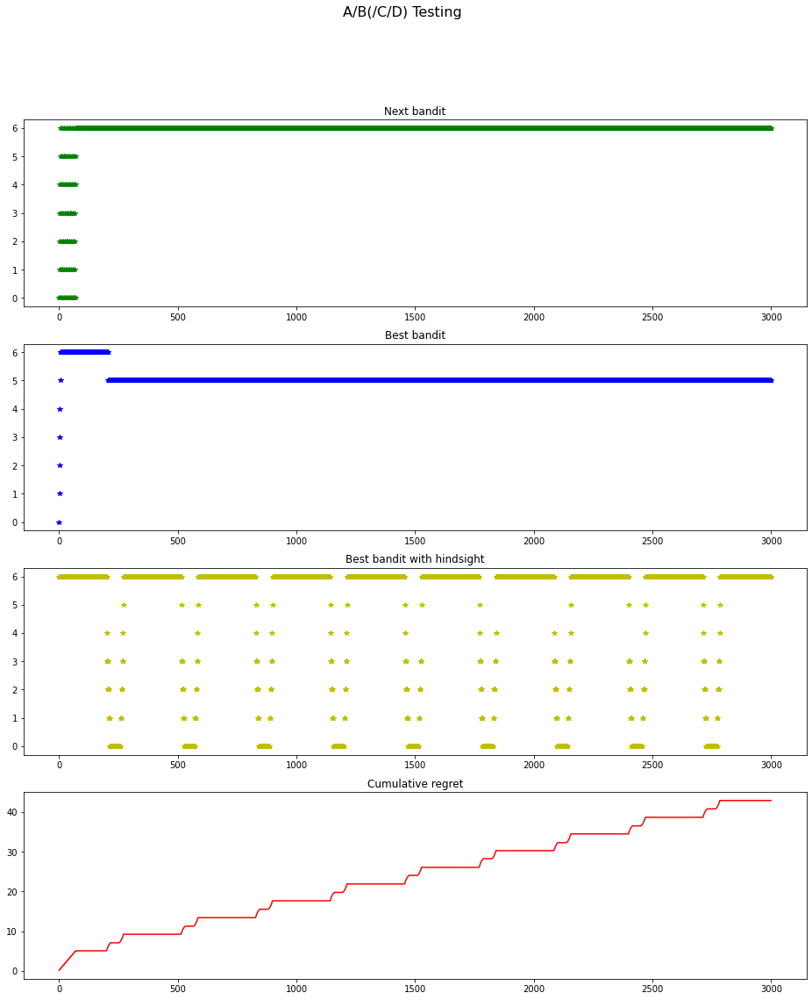

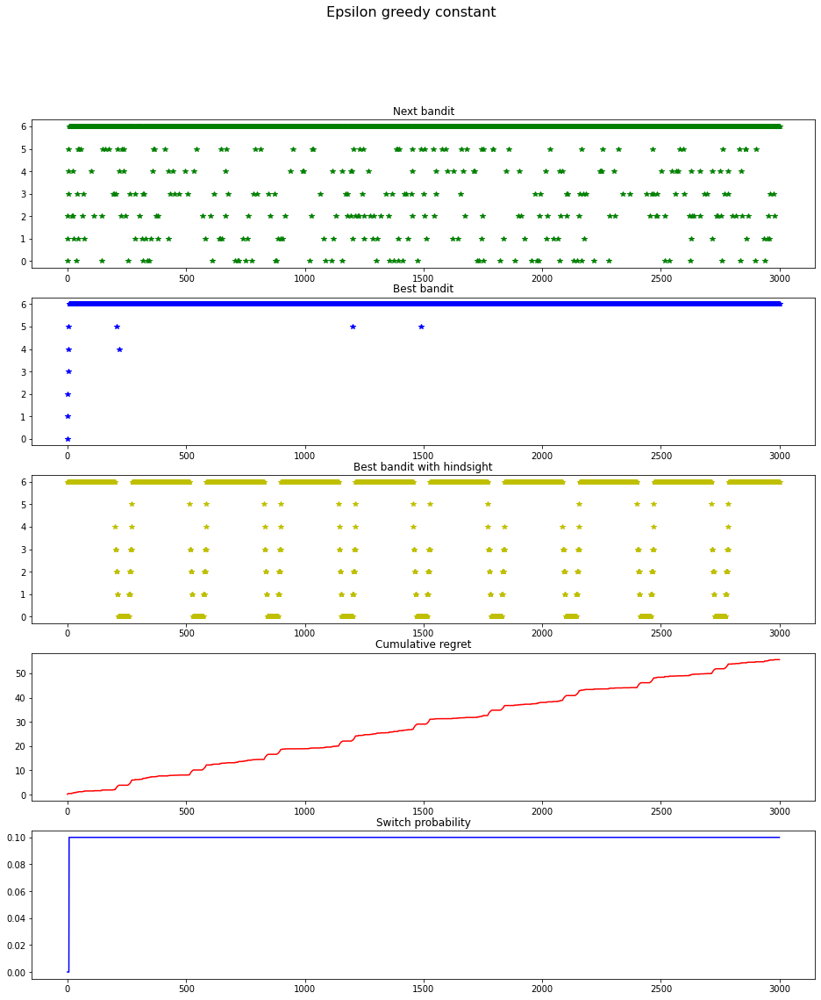

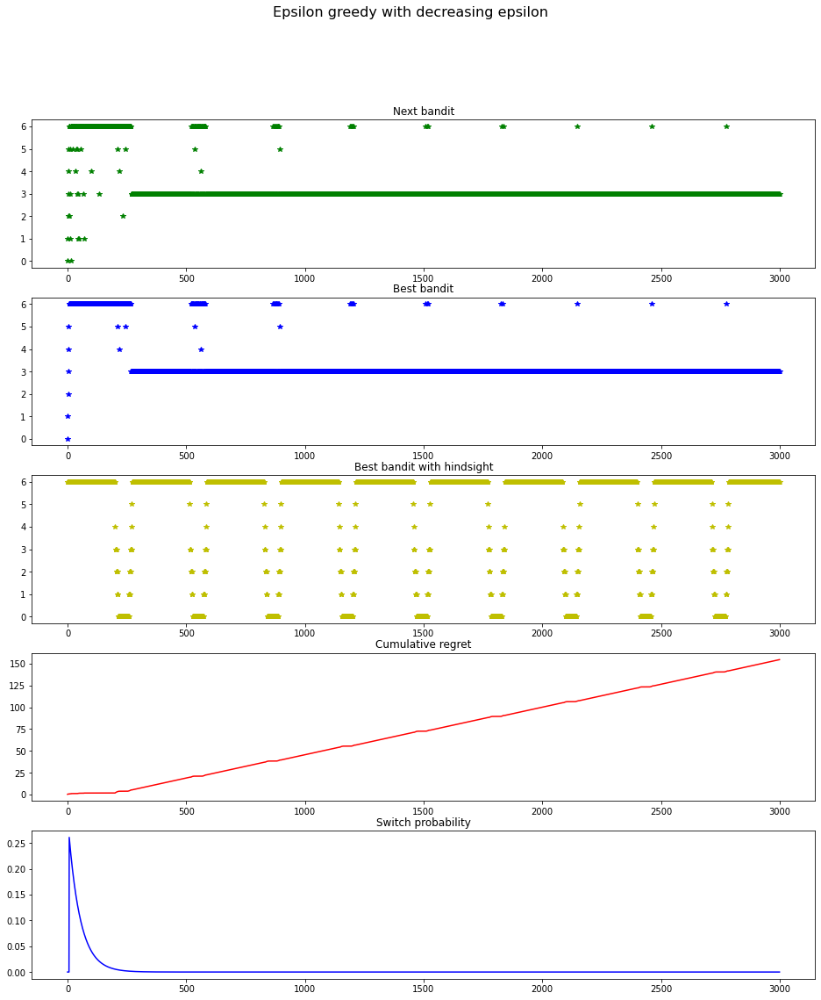

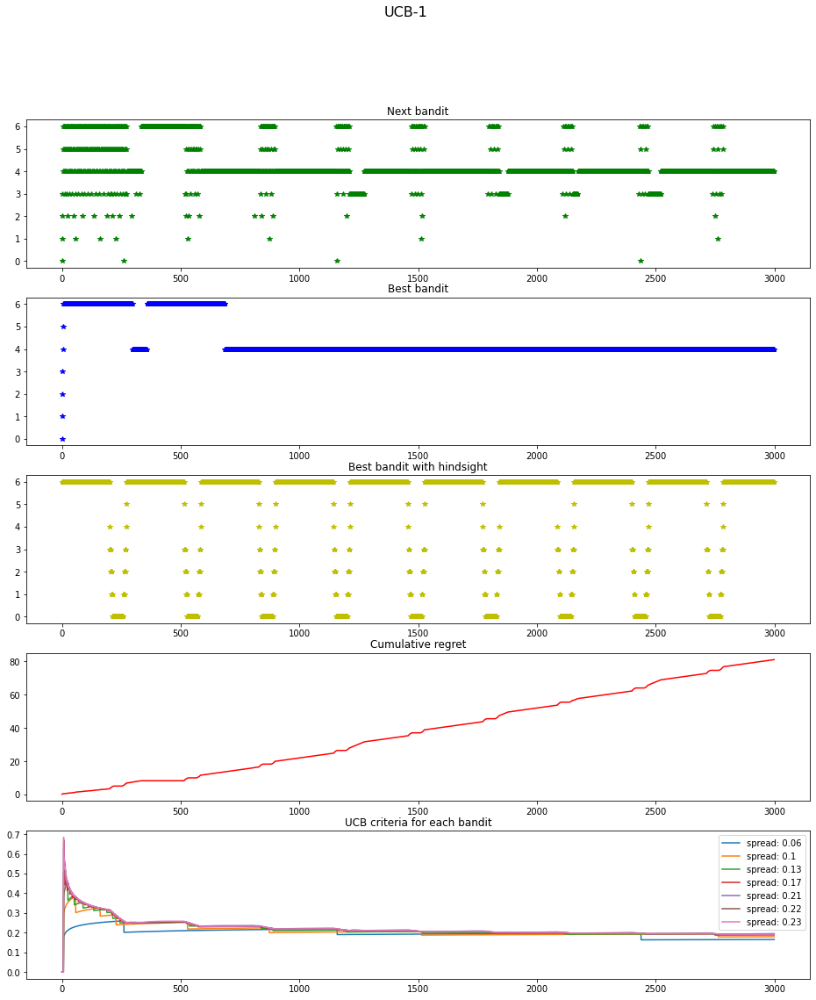

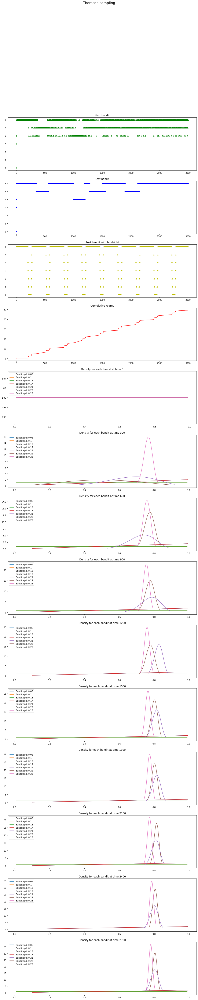

In [229]:
plot_stories(benchworks)